In [1]:
# Importar librerías necesarias
import pandas as pd
from rpy2.robjects import pandas2ri
from rpy2.robjects.packages import importr

# Habilitar conversión entre pandas y R
pandas2ri.activate()


In [2]:
from rpy2.robjects.packages import importr

# Cargar el paquete base de R
base = importr('base')

In [3]:
# Verificar conexión con R e intentar cargar un paquete
utils = importr('utils')  # Librería para gestionar paquetes en R

try:
    depmixS4 = importr('depmixS4')  # Intentar cargar depmixS4
    print("El paquete 'depmixS4' se cargó correctamente.")
except:
    print("El paquete 'depmixS4' no está instalado. Procediendo a instalar...")
    utils.install_packages('depmixS4')
    depmixS4 = importr('depmixS4')
    print("El paquete 'depmixS4' se instaló y cargó correctamente.")


El paquete 'depmixS4' se cargó correctamente.


In [4]:
import pandas as pd
from pymer4.models import Lmer

In [5]:
#!pip install rpy2

In [6]:
# Instalar lmerTest en R desde Colab
#!R -e "install.packages('lmerTest', repos='http://cran.rstudio.com/')"

In [7]:
import rpy2.robjects as robjects
from rpy2.robjects.packages import importr
from rpy2.robjects.conversion import localconverter
from rpy2.robjects import default_converter, pandas2ri

# Activar el convertidor de pandas y rpy2
pandas2ri.activate()

# Verificar e importar lmerTest
with localconverter(default_converter + pandas2ri.converter):
    try:
        lmerTest = importr('lmerTest')
        print("El paquete lmerTest está instalado y cargado correctamente.")
    except Exception as e:
        print("Error al cargar lmerTest:", e)


El paquete lmerTest está instalado y cargado correctamente.


In [8]:
from rpy2.robjects.packages import importr
from rpy2.robjects.conversion import localconverter
from rpy2.robjects import default_converter, pandas2ri

# Configurar conversiones con UTF-8
pandas2ri.activate()
with localconverter(default_converter + pandas2ri.converter):
    try:
        lmerTest = importr('lmerTest')
        print("El paquete lmerTest está instalado y cargado correctamente.")
    except UnicodeDecodeError as e:
        print("Error de codificación detectado:", e)
    except Exception as e:
        print("Otro error ocurrió:", e)


El paquete lmerTest está instalado y cargado correctamente.


In [9]:
import os
os.environ["PYTHONIOENCODING"] = "utf-8"
os.environ["LC_ALL"] = "en_US.UTF-8"
os.environ["LANG"] = "en_US.UTF-8"


In [10]:
from rpy2.robjects import r

# Redefinir opciones de consola
r('options(encoding = "UTF-8")')
r('Sys.setlocale("LC_ALL", "en_US.UTF-8")')


R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: In Sys.setlocale("LC_ALL", "en_US.UTF-8") :
R[write to console]: 
 
R[write to console]:  using locale code page other than 1252 may cause problems



array(['LC_COLLATE=en_US.UTF-8;LC_CTYPE=en_US.UTF-8;LC_MONETARY=en_US.UTF-8;LC_NUMERIC=C;LC_TIME=en_US.UTF-8'],
      dtype='<U100')

In [11]:
# Guardar el DataFrame en un archivo CSV
glmm_data=pd.read_csv('Datasets/glmm_data_preparado.csv')

print("El DataFrame ha sido cargado.")

El DataFrame ha sido cargado.


In [12]:
glmm_data.head()

,Comuna,Día_original,Día_correlativo,Transición,Probabilidad_Transición,dias,IM_interno,IM_externo,TasaCasosAcumulados,Casos_Diarios_Brutos,Casos_Diarios_Brutos_MM7,inc_pc_comuna,Personas_hogar_promedio,inmigrantes,total_hog_hacinados,indic_precariedad_vivienda,por_educ_sup,IPS_2020
0,Cerrillos,1,0,Trans_1->1,0.994180,1,1.918137,7.524704,0.000000,0.000000,0.000000,267197.56,3.145581,3606,68120,3.395792,11.9,67.81
1,Cerrillos,2,1,Trans_1->1,0.994231,2,1.970381,7.804008,2.248303,2.248303,1.124151,267197.56,3.145581,3606,68120,3.395792,11.9,67.81
2,Cerrillos,3,2,Trans_1->1,0.993255,3,1.845790,7.471452,4.496605,2.248303,1.498868,267197.56,3.145581,3606,68120,3.395792,11.9,67.81
3,Cerrillos,4,3,Trans_1->1,0.992122,4,1.678598,6.891732,4.496605,0.000000,1.124151,267197.56,3.145581,3606,68120,3.395792,11.9,67.81
4,Cerrillos,5,4,Trans_1->1,0.987758,5,1.736766,8.317872,4.496605,0.000000,0.899321,267197.56,3.145581,3606,68120,3.395792,11.9,67.81


## Análisis ElasticNet (Ridge & Lasso)
Evaluación de importancia de covariables en el futuro modelo Linear Mixed Model

In [13]:
# Define las columnas de covariables y la variable objetivo
covariables_fijas = [ 'inc_pc_comuna', 'Personas_hogar_promedio',
               'inmigrantes', 'total_hog_hacinados', 'indic_precariedad_vivienda',
               'por_educ_sup', 'IPS_2020']
target = 'Casos_Diarios_Brutos_MM7'  # Sustituye por el nombre de tu variable objetivo

In [14]:
# Matriz de correlación
correlation_matrix = glmm_data[covariables_fijas].corr()
correlation_matrix

,inc_pc_comuna,Personas_hogar_promedio,inmigrantes,total_hog_hacinados,indic_precariedad_vivienda,por_educ_sup,IPS_2020
inc_pc_comuna,1.000000,-0.574704,0.196500,-0.474091,-0.663827,0.916884,-0.920283
Personas_hogar_promedio,-0.574704,1.000000,-0.544230,0.412221,0.354194,-0.718258,0.504261
inmigrantes,0.196500,-0.544230,1.000000,0.077634,0.026338,0.344125,-0.219241
total_hog_hacinados,-0.474091,0.412221,0.077634,1.000000,0.215462,-0.497097,0.454754
indic_precariedad_vivienda,-0.663827,0.354194,0.026338,0.215462,1.000000,-0.676714,0.743070
por_educ_sup,0.916884,-0.718258,0.344125,-0.497097,-0.676714,1.000000,-0.940674
IPS_2020,-0.920283,0.504261,-0.219241,0.454754,0.743070,-0.940674,1.000000


### ElasticNet:
covariables = ['IM_interno','IM_externo','inc_pc_comuna', 'Personas_hogar_promedio',
               'inmigrantes', 'total_hog_hacinados', 'indic_precariedad_vivienda',
               'por_educ_sup','IPS_2020']

Elastic Net RMSE: 23.352443392210457

Coeficientes:
                     Variable  Elastic Net Coef
0                  IM_interno         -4.664834
1                  IM_externo         -6.536924
2               inc_pc_comuna          2.448077
3     Personas_hogar_promedio         -0.042279
4                 inmigrantes         -0.529427
5         total_hog_hacinados         -3.064736
6  indic_precariedad_vivienda          2.138337
7                por_educ_sup         -1.331904
8                    IPS_2020          2.165996


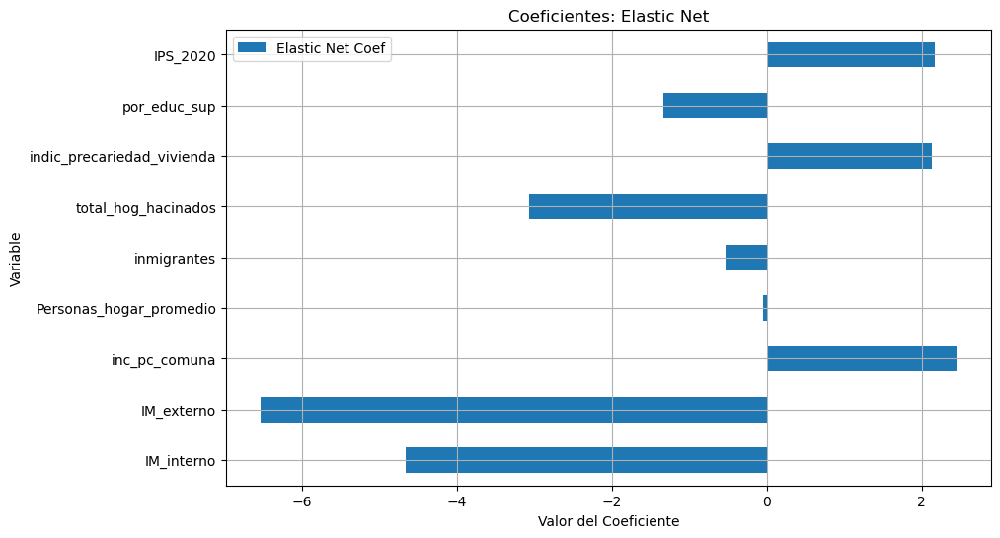

In [15]:
import numpy as np
import pandas as pd
from sklearn.linear_model import ElasticNet
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# Define las columnas de covariables y la variable objetivo
covariables = ['IM_interno','IM_externo','inc_pc_comuna', 'Personas_hogar_promedio',
               'inmigrantes', 'total_hog_hacinados', 'indic_precariedad_vivienda',
               'por_educ_sup','IPS_2020']
target = 'Casos_Diarios_Brutos_MM7'  # Sustituye por tu variable objetivo

# Dividir los datos en características (X) y objetivo (y)
X = glmm_data[covariables]
y = glmm_data[target]

# Escalar las características
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Ajustar modelo Elastic Net
elastic_net = ElasticNet(alpha=0.1, l1_ratio=0.5, random_state=42)  # Ajusta alpha y l1_ratio según sea necesario
elastic_net.fit(X_train, y_train)

# Coeficientes obtenidos
elastic_net_coef = elastic_net.coef_

# Crear un DataFrame para visualizar los coeficientes
coef_df = pd.DataFrame({
    'Variable': covariables,
    'Elastic Net Coef': elastic_net_coef
})

# Evaluar el modelo
elastic_net_pred = elastic_net.predict(X_test)
elastic_net_rmse = np.sqrt(mean_squared_error(y_test, elastic_net_pred))

# Mostrar resultados
print("Elastic Net RMSE:", elastic_net_rmse)
print("\nCoeficientes:")
print(coef_df)

# Visualización opcional
import matplotlib.pyplot as plt

coef_df.set_index('Variable').plot(kind='barh', figsize=(10, 6))
plt.title('Coeficientes: Elastic Net')
plt.xlabel('Valor del Coeficiente')
plt.grid(True)
plt.show()


#### Elastic Net
covariables = ['IM_interno','IM_externo','inc_pc_comuna', 'Personas_hogar_promedio',
               'inmigrantes', 'total_hog_hacinados', 'indic_precariedad_vivienda',
               'por_educ_sup']

Elastic Net RMSE: 23.372840393511726

Coeficientes:
                     Variable  Elastic Net Coef
0                  IM_interno         -5.059145
1                  IM_externo         -6.316042
2               inc_pc_comuna          1.874100
3     Personas_hogar_promedio         -0.337311
4                 inmigrantes         -0.565806
5         total_hog_hacinados         -2.781710
6  indic_precariedad_vivienda          2.449331
7                por_educ_sup         -2.335376


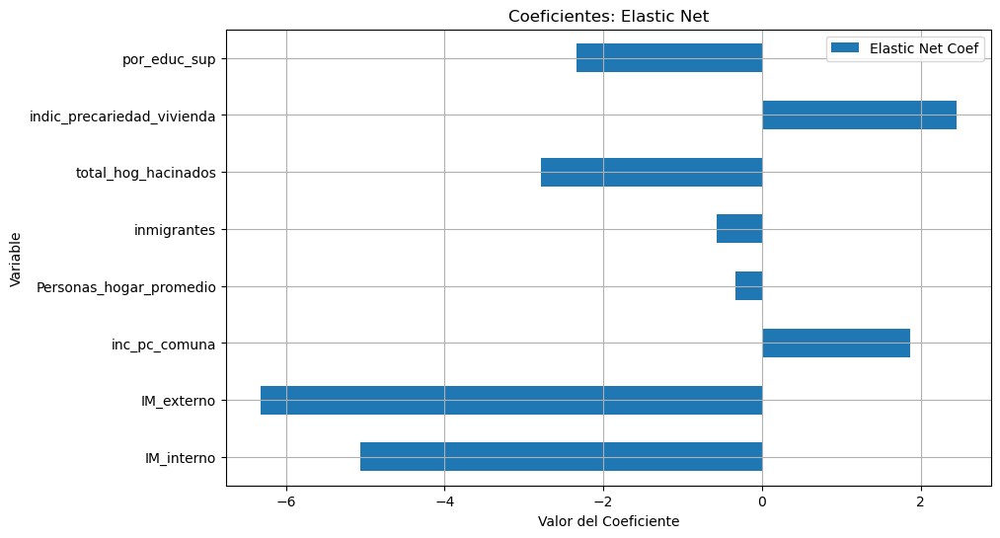

In [16]:
import numpy as np
import pandas as pd
from sklearn.linear_model import ElasticNet
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# Define las columnas de covariables y la variable objetivo
covariables = ['IM_interno','IM_externo','inc_pc_comuna', 'Personas_hogar_promedio',
               'inmigrantes', 'total_hog_hacinados', 'indic_precariedad_vivienda',
               'por_educ_sup']
target = 'Casos_Diarios_Brutos_MM7'  # Sustituye por tu variable objetivo

# Dividir los datos en características (X) y objetivo (y)
X = glmm_data[covariables]
y = glmm_data[target]

# Escalar las características
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Ajustar modelo Elastic Net
elastic_net = ElasticNet(alpha=0.1, l1_ratio=0.5, random_state=42)  # Ajusta alpha y l1_ratio según sea necesario
elastic_net.fit(X_train, y_train)

# Coeficientes obtenidos
elastic_net_coef = elastic_net.coef_

# Crear un DataFrame para visualizar los coeficientes
coef_df = pd.DataFrame({
    'Variable': covariables,
    'Elastic Net Coef': elastic_net_coef
})

# Evaluar el modelo
elastic_net_pred = elastic_net.predict(X_test)
elastic_net_rmse = np.sqrt(mean_squared_error(y_test, elastic_net_pred))

# Mostrar resultados
print("Elastic Net RMSE:", elastic_net_rmse)
print("\nCoeficientes:")
print(coef_df)

# Visualización opcional
import matplotlib.pyplot as plt

coef_df.set_index('Variable').plot(kind='barh', figsize=(10, 6))
plt.title('Coeficientes: Elastic Net')
plt.xlabel('Valor del Coeficiente')
plt.grid(True)
plt.show()


# **Linear Mixed Models:**

## **Transición 1->1: Mantención en Leve**

In [100]:
# Filtrar los datos para la transición 'Trans_3->3'
transicion_especifica_1_1 = 'Trans_1->1'
datos_transicion_1_1 = glmm_data[glmm_data['Transición'] == transicion_especifica_1_1]

# Asegurarse de que la columna 'Comuna' sea categórica
datos_transicion_1_1['Comuna'] = datos_transicion_1_1['Comuna'].astype('category')

# Inspeccionar los datos
print(f"Número de observaciones para {transicion_especifica_1_1}: {len(datos_transicion_1_1)}")
print(datos_transicion_1_1.head())

Número de observaciones para Trans_1->1: 7310
      Comuna  Día_original  Día_correlativo  Transición  \
0  Cerrillos             1                0  Trans_1->1   
1  Cerrillos             2                1  Trans_1->1   
2  Cerrillos             3                2  Trans_1->1   
3  Cerrillos             4                3  Trans_1->1   
4  Cerrillos             5                4  Trans_1->1   

   Probabilidad_Transición  dias  IM_interno  IM_externo  TasaCasosAcumulados  \
0                 0.994180     1    1.918137    7.524704             0.000000   
1                 0.994231     2    1.970381    7.804008             2.248303   
2                 0.993255     3    1.845790    7.471452             4.496605   
3                 0.992122     4    1.678598    6.891732             4.496605   
4                 0.987758     5    1.736766    8.317872             4.496605   

   Casos_Diarios_Brutos  Casos_Diarios_Brutos_MM7  inc_pc_comuna  \
0              0.000000                  0.0

C:\Users\ferna\AppData\Local\Temp\ipykernel_38828\1598286704.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos_transicion_1_1['Comuna'] = datos_transicion_1_1['Comuna'].astype('category')


In [101]:
from rpy2.robjects import pandas2ri, r

# Activar soporte de pandas en rpy2
pandas2ri.activate()

# Transferir el DataFrame de Python a R
r_data = pandas2ri.py2rpy(datos_transicion_1_1)
r.assign("datos_transicion_1_1", r_data)

Comuna,Día_original,Día_correlativo,...,indic_precariedad_vivienda,por_educ_sup,IPS_2020
Cerri...,1,0,...,...,...,...
Cerri...,2,1,,,,
Cerri...,3,2,,,,
Cerri...,4,3,,,,
...,...,...,,,,
Vitac...,212,7306,,,,
Vitac...,213,7307,,,,
Vitac...,214,7308,,,,
Vitac...,215,7309,,,,


## Transición 1->1: Mantención Leve 
### Modelo A
Fórmula Modelo A: "Probabilidad_Transición ~ (1|Comuna)"

In [102]:
r('''
library(lme4)
library(ggplot2)
library(httpgd)

# Iniciar el servidor httpgd
hgd()

# Escalar las variables
#datos_transicion_1_1$IM_interno <- scale(datos_transicion_1_1$IM_interno)
#datos_transicion_1_1$IM_externo <- scale(datos_transicion_1_1$IM_externo)
#datos_transicion_1_1$Personas_hogar_promedio <- scale(datos_transicion_1_1$Personas_hogar_promedio)
#datos_transicion_1_1$por_educ_sup <- scale(datos_transicion_1_1$por_educ_sup)
#datos_transicion_1_1$indic_precariedad_vivienda <- scale(datos_transicion_1_1$indic_precariedad_vivienda)
#datos_transicion_1_1$total_hog_hacinados <- scale(datos_transicion_1_1$total_hog_hacinados)
#datos_transicion_1_1$inmigrantes <- scale(datos_transicion_1_1$inmigrantes)
#datos_transicion_1_1$inc_pc_comuna <- scale(datos_transicion_1_1$inc_pc_comuna)

# Ajustar el modelo GLMM
modelo_A_1_1 <- lmer(Probabilidad_Transición ~ (1|Comuna), data = datos_transicion_1_1)

# Capturar y mostrar el resumen del modelo
summary_text <- capture.output(summary(modelo_A_1_1))
writeLines(summary_text)
''')

httpgd server running at:
  http://127.0.0.1:65290/live?token=sLJSvw2D
Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: Probabilidad_Transición ~ (1 | Comuna)
   Data: datos_transicion_1_1

REML criterion at convergence: -35660

Scaled residuals: 
     Min       1Q   Median       3Q      Max 
-12.7288  -0.2003   0.1931   0.5127   2.4190 

Random effects:
 Groups   Name        Variance  Std.Dev.
 Comuna   (Intercept) 7.943e-05 0.008912
 Residual             4.374e-04 0.020914
Number of obs: 7310, groups:  Comuna, 34

Fixed effects:
             Estimate Std. Error        df t value Pr(>|t|)    
(Intercept)  0.982614   0.001548 32.999997   634.8   <2e-16 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1


## Transición 1->1: Mantención Leve 
### Modelo B
Fórmula Modelo B: "Probabilidad_Transición ~ (1|Comuna) +(1|Día_original)"

In [103]:
r('''
library(lme4)
library(ggplot2)
library(httpgd)

# Iniciar el servidor httpgd
hgd()

# Escalar las variables
#datos_transicion_1_1$IM_interno <- scale(datos_transicion_1_1$IM_interno)
#datos_transicion_1_1$IM_externo <- scale(datos_transicion_1_1$IM_externo)
#datos_transicion_1_1$Personas_hogar_promedio <- scale(datos_transicion_1_1$Personas_hogar_promedio)
#datos_transicion_1_1$por_educ_sup <- scale(datos_transicion_1_1$por_educ_sup)
#datos_transicion_1_1$indic_precariedad_vivienda <- scale(datos_transicion_1_1$indic_precariedad_vivienda)
#datos_transicion_1_1$total_hog_hacinados <- scale(datos_transicion_1_1$total_hog_hacinados)
#datos_transicion_1_1$inmigrantes <- scale(datos_transicion_1_1$inmigrantes)
#datos_transicion_1_1$inc_pc_comuna <- scale(datos_transicion_1_1$inc_pc_comuna)

# Ajustar el modelo GLMM
modelo_B_1_1 <- lmer(Probabilidad_Transición ~ (1|Comuna) + (1|Día_original), data = datos_transicion_1_1)

# Capturar y mostrar el resumen del modelo
summary_text <- capture.output(summary(modelo_B_1_1))
writeLines(summary_text)
''')

httpgd server running at:
  http://127.0.0.1:65292/live?token=IIW72ha0
Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: Probabilidad_Transición ~ (1 | Comuna) + (1 | Día_original)
   Data: datos_transicion_1_1

REML criterion at convergence: -37719

Scaled residuals: 
     Min       1Q   Median       3Q      Max 
-12.5409  -0.2697   0.0916   0.3981   3.8788 

Random effects:
 Groups       Name        Variance  Std.Dev.
 Día_original (Intercept) 1.336e-04 0.011558
 Comuna       (Intercept) 8.005e-05 0.008947
 Residual                 3.038e-04 0.017430
Number of obs: 7310, groups:  Día_original, 215; Comuna, 34

Fixed effects:
             Estimate Std. Error        df t value Pr(>|t|)    
(Intercept)  0.982614   0.001737 51.723326   565.7   <2e-16 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1


## Transición 1->1: Mantención Leve 
### Modelo C
Fórmula Modelo C: "Probabilidad_Transición ~ IM_interno + IM_externo + (1|Comuna) +(1|Día_original)"

In [104]:
r('''
library(lme4)
library(ggplot2)
library(httpgd)

# Iniciar el servidor httpgd
hgd()

# Escalar las variables
datos_transicion_1_1$IM_interno <- scale(datos_transicion_1_1$IM_interno)
datos_transicion_1_1$IM_externo <- scale(datos_transicion_1_1$IM_externo)
#datos_transicion_1_1$Personas_hogar_promedio <- scale(datos_transicion_1_1$Personas_hogar_promedio)
#datos_transicion_1_1$por_educ_sup <- scale(datos_transicion_1_1$por_educ_sup)
#datos_transicion_1_1$indic_precariedad_vivienda <- scale(datos_transicion_1_1$indic_precariedad_vivienda)
#datos_transicion_1_1$total_hog_hacinados <- scale(datos_transicion_1_1$total_hog_hacinados)
#datos_transicion_1_1$inmigrantes <- scale(datos_transicion_1_1$inmigrantes)
#datos_transicion_1_1$inc_pc_comuna <- scale(datos_transicion_1_1$inc_pc_comuna)

# Ajustar el modelo GLMM
modelo_C_1_1 <- lmer(Probabilidad_Transición ~ IM_externo + IM_interno + (1|Comuna) + (1|Día_original), data = datos_transicion_1_1)

# Capturar y mostrar el resumen del modelo
summary_text <- capture.output(summary(modelo_C_1_1))
writeLines(summary_text)
''')

httpgd server running at:
  http://127.0.0.1:65293/live?token=YlI5MoR0
Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: Probabilidad_Transición ~ IM_externo + IM_interno + (1 | Comuna) +  
    (1 | Día_original)
   Data: datos_transicion_1_1

REML criterion at convergence: -39479

Scaled residuals: 
     Min       1Q   Median       3Q      Max 
-12.8288  -0.2443   0.0783   0.3857   3.3675 

Random effects:
 Groups       Name        Variance  Std.Dev.
 Día_original (Intercept) 6.261e-05 0.007913
 Comuna       (Intercept) 8.269e-04 0.028756
 Residual                 2.386e-04 0.015445
Number of obs: 7310, groups:  Día_original, 215; Comuna, 34

Fixed effects:
              Estimate Std. Error         df t value Pr(>|t|)    
(Intercept)  9.826e-01  4.964e-03  3.251e+01  197.94   <2e-16 ***
IM_externo  -7.450e-03  6.054e-04  2.898e+03  -12.31   <2e-16 ***
IM_interno   2.817e-02  6.293e-04  6.872e+03   44.77   <2e-16 ***
---
Signif. codes:  0 '*

## Transición 1->1: Mantención Leve 
### Modelo D
Fórmula Modelo D: "Probabilidad_Transición ~ IM_interno + IM_externo + Personas_hogar_promedio + por_educ_sup + indic_precariedad_vivienda + total_hog_hacinados + inmigrantes + inc_pc_comuna + (1|Comuna) + (1|Día_original)"

In [105]:
r('''
library(lme4)
library(ggplot2)
library(httpgd)

# Iniciar el servidor httpgd
hgd()

# Escalar las variables
datos_transicion_1_1$IM_interno <- scale(datos_transicion_1_1$IM_interno)
datos_transicion_1_1$IM_externo <- scale(datos_transicion_1_1$IM_externo)
datos_transicion_1_1$Personas_hogar_promedio <- scale(datos_transicion_1_1$Personas_hogar_promedio)
datos_transicion_1_1$por_educ_sup <- scale(datos_transicion_1_1$por_educ_sup)
datos_transicion_1_1$indic_precariedad_vivienda <- scale(datos_transicion_1_1$indic_precariedad_vivienda)
datos_transicion_1_1$total_hog_hacinados <- scale(datos_transicion_1_1$total_hog_hacinados)
datos_transicion_1_1$inmigrantes <- scale(datos_transicion_1_1$inmigrantes)
datos_transicion_1_1$inc_pc_comuna <- scale(datos_transicion_1_1$inc_pc_comuna)

# Ajustar el modelo GLMM
modelo_D_1_1 <- lmer(Probabilidad_Transición ~ IM_interno + IM_externo + Personas_hogar_promedio + por_educ_sup + indic_precariedad_vivienda + total_hog_hacinados + inmigrantes + inc_pc_comuna + (1|Comuna) + (1|Día_original), data = datos_transicion_1_1)

# Capturar y mostrar el resumen del modelo
summary_text <- capture.output(summary(modelo_D_1_1))
writeLines(summary_text)
''')

httpgd server running at:
  http://127.0.0.1:65297/live?token=iMKmshOR
Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: 
Probabilidad_Transición ~ IM_interno + IM_externo + Personas_hogar_promedio +  
    por_educ_sup + indic_precariedad_vivienda + total_hog_hacinados +  
    inmigrantes + inc_pc_comuna + (1 | Comuna) + (1 | Día_original)
   Data: datos_transicion_1_1

REML criterion at convergence: -39470.3

Scaled residuals: 
     Min       1Q   Median       3Q      Max 
-12.8167  -0.2444   0.0784   0.3836   3.3571 

Random effects:
 Groups       Name        Variance  Std.Dev.
 Día_original (Intercept) 6.246e-05 0.007903
 Comuna       (Intercept) 2.407e-04 0.015515
 Residual                 2.386e-04 0.015446
Number of obs: 7310, groups:  Día_original, 215; Comuna, 34

Fixed effects:
                             Estimate Std. Error         df t value Pr(>|t|)
(Intercept)                 9.826e-01  2.721e-03  2.872e+01 361.145  < 2e-16
IM_

#### Comparación de los Modelos (A, B, C y D) para Transición 1 → 1: Mantención Leve:
- Modelo A
    - Fórmula: Probabilidad_Transición ~ (1|Comuna)
    - Este modelo considera únicamente un efecto aleatorio por comuna.
    - REML criterion: -35,660 → Este valor indica la calidad del ajuste; cuanto menor, mejor.
    - Resultados Clave:
        - Intercepto: 0.9826, significativo (p < 2e-16). Representa la probabilidad base de transición.
        - Varianza Aleatoria:
            - Comuna: 7.943e-05 (desviación estándar: 0.0089).
            - Residual: 4.374e-04 (desviación estándar: 0.0209).
            - Este modelo tiene la varianza residual más alta (indicando mayor variabilidad no explicada).
- Modelo B
    - Fórmula: Probabilidad_Transición ~ (1|Comuna) + (1|Día_original)
    - Agrega un efecto aleatorio adicional por día.
    - REML criterion: -37,719 → Mejora significativa respecto al Modelo A.
    - Resultados Clave:
        - Intercepto: 0.9826, significativo (p < 2e-16).
        - Varianza Aleatoria:
        - Comuna: 8.005e-05 (similar al Modelo A).
        - Día_original: 1.336e-04 (desviación estándar: 0.0116). Refleja variabilidad diaria adicional.
        - Residual: 3.038e-04 (desviación estándar: 0.0174), menor que en el Modelo A.
        - Este modelo explica mejor la variabilidad al incluir el efecto de los días.
- Modelo C
    - Fórmula: Probabilidad_Transición ~ IM_interno + IM_externo + (1|Comuna) + (1|Día_original)
    - Agrega covariables fijas relacionadas con los índices interno y externo (IM_interno, IM_externo).
    - REML criterion: -39,479 → Mejora significativa respecto al Modelo B.
    - Resultados Clave:
        - Intercepto: 0.9826, significativo (p < 2e-16).
        - Covariables:
            - IM_externo: -0.00745, significativo (p < 2e-16). Aumenta la probabilidad de mantener el estado leve.
            - IM_interno: 0.02817, significativo (p < 2e-16). Indica un efecto protector contra la transición.
        - Varianza Aleatoria:
            - Comuna: 8.269e-04 (desviación estándar: 0.0288). Mayor que en los modelos anteriores.
            - Día_original: 6.261e-05 (desviación estándar: 0.0079). Menor que en el Modelo B.
        - Residual: 2.386e-04 (desviación estándar: 0.0154). Menor varianza residual.
- Modelo D
    - Fórmula: Agrega más covariables relacionadas con demografía y características socioeconómicas: Probabilidad_Transición ~ IM_interno + IM_externo + Personas_hogar_promedio + por_educ_sup + indic_precariedad_vivienda + total_hog_hacinados + inmigrantes + inc_pc_comuna + (1|Comuna) + (1|Día_original)
    - REML criterion: -39,470 → Similar al Modelo C, sin mejoras significativas.
    - Resultados Clave:
        - Intercepto: 0.9826, significativo (p < 2e-16).
        - Covariables:
        - IM_externo e IM_interno mantienen los mismos efectos significativos.
        - Nuevas covariables:
            - Personas_hogar_promedio: -0.01565, significativo (p = 0.00199). Los hogares más grandes reducen la probabilidad de transición.
            - Porcentaje de educación superior: -0.03387, significativo (p = 0.00115). Mayor educación disminuye la probabilidad de mantener el estado leve.
            - Inmigrantes: -0.00818, significativo (p = 0.04342). Mayor proporción de inmigrantes reduce la probabilidad de transición.
            - Otras variables no son significativas (indic_precariedad_vivienda, total_hog_hacinados, inc_pc_comuna).
        - Varianza Aleatoria:
            - Comuna: 2.407e-04 (desviación estándar: 0.0155). Mucho menor que en el Modelo C, indicando menor variabilidad no explicada.
            - Día_original: 6.246e-05 (desviación estándar: 0.0079). Igual que en el Modelo C.
        - Residual: 2.386e-04 (desviación estándar: 0.0154).

- Conclusiones Principales
    - Mejora Progresiva:
        - Incluir efectos aleatorios por día (Modelo B) mejora sustancialmente el ajuste en comparación con el Modelo A.
        - Agregar covariables específicas (IM_interno e IM_externo en el Modelo C) mejora aún más el ajuste, reduciendo la varianza residual.
        - **El Modelo D no mejora significativamente respecto al Modelo C, lo que sugiere que las variables adicionales no aportan suficiente información nueva.**
    - Variables Clave:

        - IM_interno tiene un efecto protector significativo (reduce la probabilidad de transición).
        - IM_externo incrementa la probabilidad de transición.
        - Factores demográficos como educación superior y tamaño promedio de los hogares tienen efectos significativos en el Modelo D.
    - Recomendación de Modelo:

        - **El Modelo C proporciona un balance óptimo entre simplicidad y capacidad explicativa**, al incluir las variables más significativas y capturar efectos aleatorios por comuna y día.

### Efectos Aleatorios del Modelo C:
#### Efecto Aleatorio por Comuna:

In [106]:
r('''
library(lme4)
library(ggplot2)
library(httpgd)

# Configurar un dispositivo gráfico antes de guardar el gráfico
options(bitmapType = "cairo")

# Iniciar el servidor httpgd
hgd()

# Visualización: Variabilidad entre días y comunas
# Extraer efectos aleatorios
ranef_data <- ranef(modelo_C_1_1, condVar = TRUE)

# Convertir los efectos aleatorios de Comuna en un DataFrame
comuna_effects <- as.data.frame(ranef_data$Comuna)
print(comuna_effects)

# Crear gráfico para efectos aleatorios por comuna
comuna_plot <- ggplot(comuna_effects, aes(x = rownames(comuna_effects), y = `(Intercept)`)) +
    geom_point() +
    labs(title = "Efectos Aleatorios por Comuna", x = "Comuna", y = "Intercepto Ajustado") +
    theme_minimal() +
    theme(axis.text.x = element_text(angle = 90, hjust = 1))  # Rotar etiquetas en el eje x


# Validación del Modelo: Análisis de residuales
plot(residuals(modelo_C_1_1), main = "Análisis de Residuales")

# Renderizar el gráfico en httpgd
print(comuna_plot)
''')

httpgd server running at:
  http://127.0.0.1:65298/live?token=tjx484gv
                     (Intercept)
Cerrillos            0.036382778
Cerro Navia          0.029679614
Conchali             0.002344814
El Bosque            0.021729684
Estacion Central     0.004770271
Huechuraba          -0.004354851
Independencia       -0.012768651
La Cisterna          0.019527804
La Florida          -0.008138282
La Granja            0.027956165
La Pintana           0.032308684
La Reina            -0.009594143
Las Condes          -0.057091515
Lo Barnechea        -0.069649512
Lo Espejo            0.033212932
Lo Prado             0.033909655
Macul                0.005135998
Maipu               -0.014213968
Nunoa               -0.005997735
Pedro Aguirre Cerda  0.035750335
Penaflor            -0.022918649
Providencia         -0.037454032
Pudahuel             0.003262973
Puente Alto         -0.011070600
Quilicura           -0.013322287
Quinta Normal        0.008922054
Recoleta             0.004960951
Renca

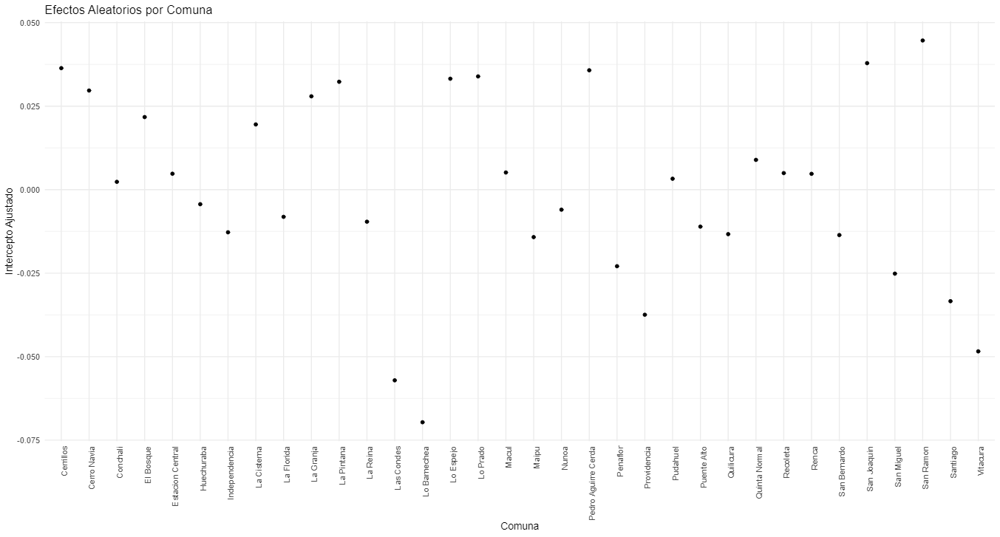

#### Efectos Aleatorios por Días:

In [107]:
from rpy2.robjects import pandas2ri, r
from IPython.display import display
import pandas as pd

# Activar soporte de pandas en rpy2
pandas2ri.activate()

# Transferir el DataFrame de Python a R
r_data = pandas2ri.py2rpy(datos_transicion_1_1)
r.assign("datos_transicion_1_1", r_data)

# Código en R para ajustar el modelo, generar la tabla y el gráfico
r('''
library(lme4)
library(ggplot2)
library(httpgd)

# Configurar un dispositivo gráfico
options(bitmapType = "cairo")

# Iniciar el servidor httpgd
hgd()

# Ajustar el modelo GLMM
modelo_C_1_1 <- lmer(Probabilidad_Transición ~ IM_interno + IM_externo + Personas_hogar_promedio + por_educ_sup + indic_precariedad_vivienda + total_hog_hacinados + inmigrantes + inc_pc_comuna + (1|Comuna) + (1|Día_original), data = datos_transicion_1_1)

# Extraer efectos aleatorios por día
ranef_data <- ranef(modelo_C_1_1, condVar = TRUE)

# Convertir los efectos aleatorios de Día_original en un DataFrame
dia_effects <- as.data.frame(ranef_data$Día_original)
dia_effects$Día_original <- as.numeric(rownames(dia_effects))

# Calcular la fecha real a partir del día original
start_date <- as.Date("2020-03-30")
dia_effects$Fecha <- start_date + (dia_effects$Día_original - 1)

# Determinar días de semana o fin de semana
dias_semana <- c("Monday", "Tuesday", "Wednesday", "Thursday", "Friday")
dia_effects$Tipo_dia <- ifelse(weekdays(dia_effects$Fecha) %in% dias_semana, "Día de semana", "Fin de semana")

# Lista de días festivos a colorear como "Fin de semana"
festivos <- as.Date(c(
    "2020-04-10",  # Viernes Santo
    "2020-05-01",  # Día Nacional del Trabajo
    "2020-05-21",  # Glorias Navales
    "2020-05-22",  # Día Posterior a Glorias Navales (Viernes) 
    "2020-06-29",  # San Pedro y San Pablo
    "2020-07-16",  # Virgen del Carmen
    "2020-09-18",  # Independencia Nacional
    "2020-09-19",  # Día Glorias del Ejército
    "2020-10-12"   # Encuentro de Dos Mundos
))

# Clasificar festivos como "Fin de semana"
dia_effects$Tipo_dia <- ifelse(dia_effects$Fecha %in% festivos, "Fin de semana", dia_effects$Tipo_dia)

# Crear gráfico para efectos aleatorios por fecha con puntos coloreados por tipo de día
dia_plot <- ggplot(dia_effects, aes(x = Fecha, y = `(Intercept)`, color = Tipo_dia)) +
    geom_point(size = 2) +
    scale_color_manual(values = c("Día de semana" = "blue", "Fin de semana" = "red")) +
    labs(title = "Efectos Aleatorios por Fecha", x = "Fecha", y = "Intercepto Ajustado", color = "Tipo de Día") +
    theme_minimal() +
    theme(axis.text.x = element_text(angle = 45, hjust = 1))

# Renderizar el gráfico en httpgd
print(dia_plot)

# Guardar la tabla actualizada en un archivo CSV
write.csv(dia_effects, file = "dia_effects_table_1_1_C.csv", row.names = FALSE)
''')

# Leer la tabla generada en R
dia_effects_table = pd.read_csv("dia_effects_table_1_1_C.csv")

# Configurar pandas para mostrar todas las filas
pd.set_option('display.max_rows', None)

# Mostrar la tabla actualizada con fechas y tipos de día
#display(dia_effects_table)

httpgd server running at:
  http://127.0.0.1:65305/live?token=GPJQtjVE


R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: Some predictor variables are on very different scales: consider rescaling 

R[write to console]: 2: Some predictor variables are on very different scales: consider rescaling 



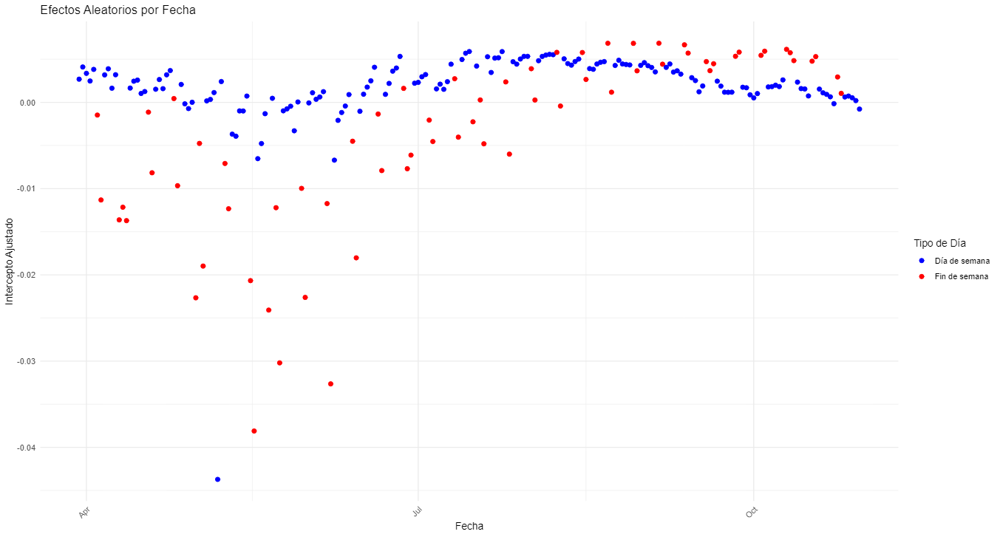

### Análisis de Residuales en el tiempo:

In [110]:
r('''
# Crear un DataFrame con los residuales, la columna Fecha y la columna Comuna
residuals_data <- data.frame(
    Fecha = as.Date(start_date + (datos_transicion_1_1$Día_original - 1)),
    Residuals = residuals(modelo_C_1_1),
    Comuna = datos_transicion_1_1$Comuna
)

# Crear gráfico de residuales con Fecha en el eje x y colorear por Comuna
residuals_plot <- ggplot(residuals_data, aes(x = Fecha, y = Residuals, color = Comuna)) +
    geom_point() +
    labs(title = "Análisis de Residuales", x = "Fecha", y = "Residuales") +
    theme_minimal() +
    theme(axis.text.x = element_text(angle = 45, hjust = 1))  # Rotar etiquetas en el eje x

# Renderizar el gráfico en httpgd
print(residuals_plot)
''')

In [111]:
from rpy2.robjects import pandas2ri, r
from IPython.display import display
import pandas as pd

# Activar soporte de pandas en rpy2
pandas2ri.activate()

# Transferir el DataFrame de Python a R
r_data = pandas2ri.py2rpy(datos_transicion_1_1)
r.assign("datos_transicion_1_1", r_data)

# Código en R para calcular los residuales y generar la tabla
r('''
# Crear DataFrame con residuales, Fecha y Comuna
start_date <- as.Date("2020-03-30")
residuals_data <- data.frame(
    Fecha = as.Date(start_date + (datos_transicion_1_1$Día_original - 1)),
    Residual = residuals(modelo_C_1_1),
    Comuna = datos_transicion_1_1$Comuna,
    Día = datos_transicion_1_1$Día_original
)

# Guardar la tabla como archivo CSV
write.csv(residuals_data, file = "residuals_table_1_1_C.csv", row.names = FALSE)
''')

# Leer la tabla generada en R
residuals_table = pd.read_csv("residuals_table_1_1_C.csv")

# Configurar pandas para mostrar todas las filas (opcional)
pd.set_option('display.max_rows', None)

# Mostrar la tabla en Jupyter Notebook
#display(residuals_table)


In [37]:
import pandas as pd

# Leer la tabla de residuales (asegúrate de tener el archivo CSV cargado)
residuals_table = pd.read_csv("residuals_table_1_1_C.csv")

# Calcular los percentiles para definir el intervalo de confianza
lower_bound = residuals_table['Residual'].quantile(0.025)  # Límite inferior (percentil 2.5%)
upper_bound = residuals_table['Residual'].quantile(0.975)  # Límite superior (percentil 97.5%)

# Filtrar residuales fuera del intervalo de confianza
outliers = residuals_table[(residuals_table['Residual'] < lower_bound) | (residuals_table['Residual'] > upper_bound)]

# Contar la cantidad de outliers por comuna
outliers_by_comuna = outliers.groupby('Comuna').size().reset_index(name='Cantidad de Outliers')

# Encontrar la magnitud máxima de residuales fuera del intervalo por comuna
outliers_magnitude = outliers.groupby('Comuna')['Residual'].agg(['max', 'min']).reset_index()
outliers_magnitude.rename(columns={'max': 'Residual Máximo', 'min': 'Residual Mínimo'}, inplace=True)

# Combinar ambas tablas para una vista completa
outliers_summary = pd.merge(outliers_by_comuna, outliers_magnitude, on='Comuna')

# Agregar las fechas de los outliers a la tabla (opcional)
outliers_dates = outliers.groupby('Comuna')['Fecha'].apply(list).reset_index()
outliers_summary = pd.merge(outliers_summary, outliers_dates, on='Comuna')

# Ordenar la tabla por cantidad de outliers en orden descendente
outliers_summary = outliers_summary.sort_values(by='Cantidad de Outliers', ascending=False)

# Guardar la tabla en un archivo CSV
outliers_summary.to_csv("residuals_outliers_summary.csv", index=False)

# Mostrar la tabla
outliers_summary.head()


,Comuna,Cantidad de Outliers,Residual Máximo,Residual Mínimo,Fecha
27,San Miguel,140,0.039761,-0.178286,"[2020-03-30, 2020-03-31, 2020-04-01, 2020-04-0..."
12,Lo Barnechea,40,0.031784,-0.197960,"[2020-04-04, 2020-04-05, 2020-04-10, 2020-04-1..."
19,Providencia,33,0.047701,-0.069774,"[2020-05-01, 2020-05-03, 2020-05-07, 2020-05-0..."
9,La Granja,20,0.042475,-0.083555,"[2020-04-17, 2020-04-20, 2020-04-21, 2020-04-2..."
6,Independencia,19,0.024623,-0.118004,"[2020-05-01, 2020-05-02, 2020-05-03, 2020-05-0..."


In [112]:
import pandas as pd

import pandas as pd

# Leer la tabla de residuales
residuals_table = pd.read_csv("residuals_table_1_1_C.csv")

# Calcular el rango de residuales por comuna
residual_stats = residuals_table.groupby('Comuna').agg(
    Residual_Minimo=('Residual', 'min'),
    Residual_Maximo=('Residual', 'max'),
    Desviacion_Estandar=('Residual', 'std')
).reset_index()

# Crear la columna de rango de residuales con formato "mínimo a máximo"
residual_stats['Rango de Residuales'] = residual_stats['Residual_Minimo'].round(6).astype(str) + " a " + residual_stats['Residual_Maximo'].round(6).astype(str)

# Seleccionar las 3 comunas con los residuales más negativos
negativos = residual_stats.nsmallest(3, 'Residual_Minimo')

# Seleccionar las 3 comunas con los residuales más positivos
positivos = residual_stats.nlargest(3, 'Residual_Maximo')

# Combinar los resultados en una única tabla
extremos = pd.concat([negativos, positivos])

# Seleccionar columnas relevantes para el resultado final
extremos = extremos[['Comuna', 'Rango de Residuales', 'Desviacion_Estandar']]

# Guardar la tabla en un archivo CSV
extremos.to_csv("tabla_extremos_residuales.csv", index=False)

# Mostrar la tabla
print(extremos)


          Comuna   Rango de Residuales  Desviacion_Estandar
13  Lo Barnechea   -0.19796 a 0.031784             0.037916
30    San Miguel  -0.178286 a 0.039761             0.043971
12    Las Condes  -0.138245 a 0.024258             0.022219
7    La Cisterna  -0.074828 a 0.051852             0.015353
21   Providencia  -0.069774 a 0.047701             0.022866
31     San Ramon  -0.009626 a 0.045401             0.007753


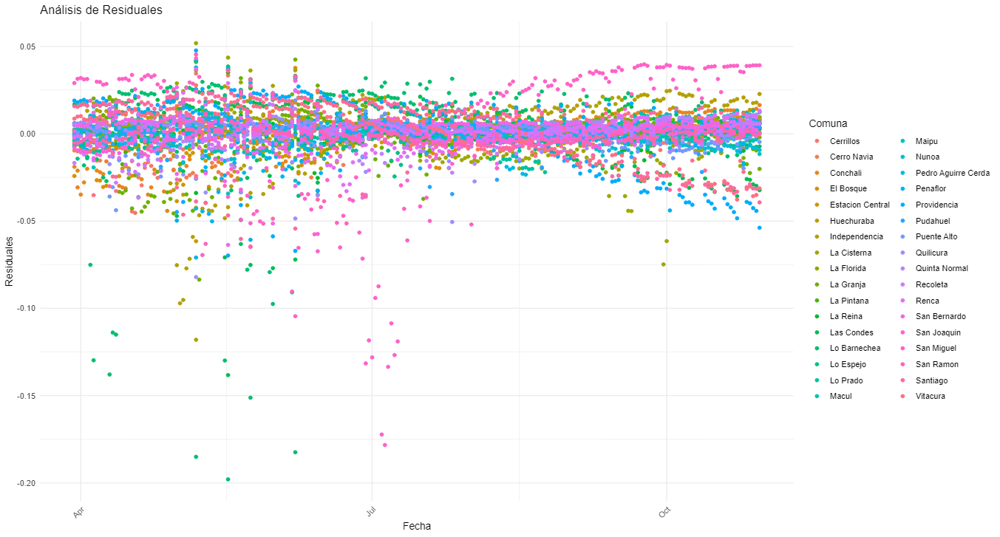

#### Interpretación de Resultados Modelo C:
- Efectos Aleatorios por Comuna:
    - Los efectos aleatorios estimados para las comunas muestran la variación inherente entre ellas después de controlar las covariables en el modelo.
    - Comunas como **Cerrillos, Lo Prado, y San Joaquín presentan valores positivos altos en el intercepto ajustado, lo que indica que tienden a tener una mayor probabilidad de mantener el estado leve**, incluso después de ajustar por las covariables.
    - Por otro lado, comunas como **Las Condes, Lo Barnechea, y Vitacura tienen interceptos negativos más pronunciados, lo que sugiere que tienen una menor probabilidad ajustada de mantener el estado leve en comparación con otras comunas.**
    - Esto puede reflejar factores subyacentes que no fueron capturados por las covariables del modelo, como diferencias en infraestructura, demografía o acceso a servicios de salud.
- Efectos Aleatorios por Día:
    - Se observa una diferencia significativa entre días de semana y fines de semana en el intercepto ajustado.
    - **Los fines de semana tienden a tener interceptos más negativos, especialmente al inicio del periodo analizado (por ejemplo, en abril y mayo), lo que podría estar relacionado con cambios en movilidad, comportamiento social, o implementación de restricciones durante esos días.**
    - A lo largo del tiempo, los efectos se estabilizan, con una menor diferencia entre días de semana y fines de semana hacia el final del periodo analizado.
- Análisis de Residuales en el Tiempo:
    - Los residuales del modelo muestran que las **predicciones son en general consistentes**, con la mayoría de los puntos distribuidos alrededor de 0.
    - Sin embargo, hay mayor dispersión en algunos momentos específicos, lo que puede indicar que el modelo tiene dificultades para capturar ciertas variaciones temporales en las probabilidades de transición.
    - Estas fluctuaciones podrían estar relacionadas con eventos no modelados (como políticas públicas, eventos masivos, o cambios abruptos en las condiciones sociales o económicas).
- Conclusión:
    - El modelo C captura diferencias importantes entre comunas y días, pero los residuales y las fluctuaciones en los efectos aleatorios por fechas sugieren que hay factores no incluidos que afectan las probabilidades de transición.
    - Para mejorar el modelo, se podrían incluir variables adicionales o ajustar los efectos temporales para capturar mejor la variabilidad observada en fines de semana y entre comunas con características similares.

## **Transición 1->2: De Leve a Moderado**

In [127]:
from pymer4.models import Lmer

# Filtrar los datos para la transición 'Trans_2->1'
transicion_especifica_1_2 = 'Trans_1->2'
datos_transicion_1_2 = glmm_data[glmm_data['Transición'] == transicion_especifica_1_2]

# Asegurarse de que la columna 'Comuna' sea categórica
datos_transicion_1_2['Comuna'] = datos_transicion_1_2['Comuna'].astype('category')

# Inspeccionar los datos
#print(f"Número de observaciones para {transicion_especifica_1_2}: {len(datos_transicion_1_2)}")
#print(datos_transicion_1_2.head())

C:\Users\ferna\AppData\Local\Temp\ipykernel_38828\921237695.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos_transicion_1_2['Comuna'] = datos_transicion_1_2['Comuna'].astype('category')


In [128]:
datos_transicion_1_2.head()

,Comuna,Día_original,Día_correlativo,Transición,Probabilidad_Transición,dias,IM_interno,IM_externo,TasaCasosAcumulados,Casos_Diarios_Brutos,Casos_Diarios_Brutos_MM7,inc_pc_comuna,Personas_hogar_promedio,inmigrantes,total_hog_hacinados,indic_precariedad_vivienda,por_educ_sup,IPS_2020
7310,Cerrillos,1,0,Trans_1->2,0.000775,1,1.918137,7.524704,0.000000,0.000000,0.000000,267197.56,3.145581,3606,68120,3.395792,11.9,67.81
7311,Cerrillos,2,1,Trans_1->2,0.001285,2,1.970381,7.804008,2.248303,2.248303,1.124151,267197.56,3.145581,3606,68120,3.395792,11.9,67.81
7312,Cerrillos,3,2,Trans_1->2,0.000681,3,1.845790,7.471452,4.496605,2.248303,1.498868,267197.56,3.145581,3606,68120,3.395792,11.9,67.81
7313,Cerrillos,4,3,Trans_1->2,0.000231,4,1.678598,6.891732,4.496605,0.000000,1.124151,267197.56,3.145581,3606,68120,3.395792,11.9,67.81
7314,Cerrillos,5,4,Trans_1->2,0.002742,5,1.736766,8.317872,4.496605,0.000000,0.899321,267197.56,3.145581,3606,68120,3.395792,11.9,67.81


In [129]:
from rpy2.robjects import pandas2ri, r

# Activar soporte de pandas en rpy2
pandas2ri.activate()

# Transferir el DataFrame de Python a R
r_data = pandas2ri.py2rpy(datos_transicion_1_2)
r.assign("datos_transicion_1_2", r_data)

Comuna,Día_original,Día_correlativo,...,indic_precariedad_vivienda,por_educ_sup,IPS_2020
Cerri...,1,0,...,...,...,...
Cerri...,2,1,,,,
Cerri...,3,2,,,,
Cerri...,4,3,,,,
...,...,...,,,,
Vitac...,212,7306,,,,
Vitac...,213,7307,,,,
Vitac...,214,7308,,,,
Vitac...,215,7309,,,,


In [130]:
#r('''
#install.packages("httpgd", repos = "http://cran.rstudio.com/")
#library(httpgd)
#hgd()
#''')


## Transición 1->2: Transición de Leve a Moderado
### Modelo A
Fórmula Modelo A: "Probabilidad_Transición ~ (1|Comuna)"

In [131]:
r('''
library(lme4)
library(ggplot2)
library(httpgd)

# Iniciar el servidor httpgd
hgd()

# Escalar las variables
#datos_transicion_1_2$IM_interno <- scale(datos_transicion_1_2$IM_interno)
#datos_transicion_1_2$IM_externo <- scale(datos_transicion_1_2$IM_externo)
#datos_transicion_1_2$Personas_hogar_promedio <- scale(datos_transicion_1_2$Personas_hogar_promedio)
#datos_transicion_1_2$por_educ_sup <- scale(datos_transicion_1_2$por_educ_sup)
#datos_transicion_1_2$indic_precariedad_vivienda <- scale(datos_transicion_1_2$indic_precariedad_vivienda)
#datos_transicion_1_2$total_hog_hacinados <- scale(datos_transicion_1_2$total_hog_hacinados)
#datos_transicion_1_2$inc_pc_comuna <- scale(datos_transicion_1_2$inc_pc_comuna)
#datos_transicion_1_2$inmigrantes <- scale(datos_transicion_1_2$inmigrantes)

# Ajustar el modelo GLMM
modelo_A_1_2 <- lmer(Probabilidad_Transición ~ (1|Comuna), data = datos_transicion_1_2)

# Capturar y mostrar el resumen del modelo
summary_text <- capture.output(summary(modelo_A_1_2))
writeLines(summary_text)
''')


httpgd server running at:
  http://127.0.0.1:49193/live?token=7GhtQjm3
Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: Probabilidad_Transición ~ (1 | Comuna)
   Data: datos_transicion_1_2

REML criterion at convergence: -435

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-1.3053 -0.5009 -0.2356 -0.0438  3.8251 

Random effects:
 Groups   Name        Variance Std.Dev.
 Comuna   (Intercept) 0.008034 0.08963 
 Residual             0.054238 0.23289 
Number of obs: 7310, groups:  Comuna, 34

Fixed effects:
            Estimate Std. Error       df t value Pr(>|t|)    
(Intercept)  0.12034    0.01561 33.00000   7.709 7.06e-09 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1


## Transición 1->2: Transición de Leve a Moderado
### Modelo B
Fórmula Modelo B: "Probabilidad_Transición ~ (1|Comuna) + (1|Día_original)"

In [132]:
r('''
library(lme4)
library(ggplot2)
library(httpgd)

# Iniciar el servidor httpgd
hgd()

# Escalar las variables
#datos_transicion_1_2$IM_interno <- scale(datos_transicion_1_2$IM_interno)
#datos_transicion_1_2$IM_externo <- scale(datos_transicion_1_2$IM_externo)
#datos_transicion_1_2$Personas_hogar_promedio <- scale(datos_transicion_1_2$Personas_hogar_promedio)
#datos_transicion_1_2$por_educ_sup <- scale(datos_transicion_1_2$por_educ_sup)
#datos_transicion_1_2$indic_precariedad_vivienda <- scale(datos_transicion_1_2$indic_precariedad_vivienda)
#datos_transicion_1_2$total_hog_hacinados <- scale(datos_transicion_1_2$total_hog_hacinados)
#datos_transicion_1_2$inc_pc_comuna <- scale(datos_transicion_1_2$inc_pc_comuna)
#datos_transicion_1_2$inmigrantes <- scale(datos_transicion_1_2$inmigrantes)

# Ajustar el modelo GLMM
modelo_B_1_2 <- lmer(Probabilidad_Transición ~ (1|Comuna) + (1|Día_original), data = datos_transicion_1_2)

# Capturar y mostrar el resumen del modelo
summary_text <- capture.output(summary(modelo_B_1_2))
writeLines(summary_text)
''')


httpgd server running at:
  http://127.0.0.1:49194/live?token=sAlVp4Am
Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: Probabilidad_Transición ~ (1 | Comuna) + (1 | Día_original)
   Data: datos_transicion_1_2

REML criterion at convergence: -6648.4

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-3.5370 -0.6310  0.0456  0.5014  4.3240 

Random effects:
 Groups       Name        Variance Std.Dev.
 Día_original (Intercept) 0.033736 0.1837  
 Comuna       (Intercept) 0.008191 0.0905  
 Residual                 0.020502 0.1432  
Number of obs: 7310, groups:  Día_original, 215; Comuna, 34

Fixed effects:
            Estimate Std. Error       df t value Pr(>|t|)    
(Intercept)  0.12034    0.02002 83.63895   6.013 4.62e-08 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1


## Transición 1->2: Transición de Leve a Moderado
### Modelo C
Fórmula Modelo C: "Probabilidad_Transición ~ (1|Comuna) + (1|Día_original) + IM_externo + IM_interno"

In [133]:
r('''
library(lme4)
library(ggplot2)
library(httpgd)

# Iniciar el servidor httpgd
hgd()

# Escalar las variables
datos_transicion_1_2$IM_interno <- scale(datos_transicion_1_2$IM_interno)
datos_transicion_1_2$IM_externo <- scale(datos_transicion_1_2$IM_externo)
#datos_transicion_1_2$Personas_hogar_promedio <- scale(datos_transicion_1_2$Personas_hogar_promedio)
#datos_transicion_1_2$por_educ_sup <- scale(datos_transicion_1_2$por_educ_sup)
#datos_transicion_1_2$indic_precariedad_vivienda <- scale(datos_transicion_1_2$indic_precariedad_vivienda)
#datos_transicion_1_2$total_hog_hacinados <- scale(datos_transicion_1_2$total_hog_hacinados)
#datos_transicion_1_2$inc_pc_comuna <- scale(datos_transicion_1_2$inc_pc_comuna)
#datos_transicion_1_2$inmigrantes <- scale(datos_transicion_1_2$inmigrantes)

# Ajustar el modelo GLMM
modelo_C_1_2 <- lmer(Probabilidad_Transición ~ (1|Comuna) + (1|Día_original) + IM_interno + IM_externo, data = datos_transicion_1_2)

# Capturar y mostrar el resumen del modelo
summary_text <- capture.output(summary(modelo_C_1_2))
writeLines(summary_text)
''')


httpgd server running at:
  http://127.0.0.1:49195/live?token=mBMlLcTn
Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: Probabilidad_Transición ~ (1 | Comuna) + (1 | Día_original) +  
    IM_interno + IM_externo
   Data: datos_transicion_1_2

REML criterion at convergence: -11419.9

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-5.2419 -0.6069 -0.0734  0.5242  4.2089 

Random effects:
 Groups       Name        Variance Std.Dev.
 Día_original (Intercept) 0.004964 0.07046 
 Comuna       (Intercept) 0.017356 0.13174 
 Residual                 0.010977 0.10477 
Number of obs: 7310, groups:  Día_original, 215; Comuna, 34

Fixed effects:
             Estimate Std. Error        df t value Pr(>|t|)    
(Intercept) 1.203e-01  2.313e-02 3.530e+01   5.203  8.5e-06 ***
IM_interno  2.253e-01  4.230e-03 5.651e+03  53.261  < 2e-16 ***
IM_externo  1.526e-01  4.264e-03 4.143e+03  35.782  < 2e-16 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 

## Transición 1->2: Transición de Leve a Moderado
### Modelo D
Fórmula Modelo D: "Probabilidad_Transición ~ IM_interno + IM_externo + Personas_hogar_promedio + por_educ_sup + indic_precariedad_vivienda + total_hog_hacinados + inmigrantes + inc_pc_comuna + (1|Comuna) + (1|Día_original)"

In [134]:
r('''
library(lme4)
library(ggplot2)
library(httpgd)

# Iniciar el servidor httpgd
hgd()

# Escalar las variables
datos_transicion_1_2$IM_interno <- scale(datos_transicion_1_2$IM_interno)
datos_transicion_1_2$IM_externo <- scale(datos_transicion_1_2$IM_externo)
datos_transicion_1_2$Personas_hogar_promedio <- scale(datos_transicion_1_2$Personas_hogar_promedio)
datos_transicion_1_2$por_educ_sup <- scale(datos_transicion_1_2$por_educ_sup)
datos_transicion_1_2$indic_precariedad_vivienda <- scale(datos_transicion_1_2$indic_precariedad_vivienda)
datos_transicion_1_2$total_hog_hacinados <- scale(datos_transicion_1_2$total_hog_hacinados)
datos_transicion_1_2$inmigrantes <- scale(datos_transicion_1_2$inmigrantes)
datos_transicion_1_2$inc_pc_comuna <- scale(datos_transicion_1_2$inc_pc_comuna)

# Ajustar el modelo GLMM
modelo_D_1_2 <- lmer(Probabilidad_Transición ~ IM_interno + IM_externo + Personas_hogar_promedio + por_educ_sup + indic_precariedad_vivienda + total_hog_hacinados + inmigrantes + inc_pc_comuna + (1|Comuna) + (1|Día_original), data = datos_transicion_1_2)

# Capturar y mostrar el resumen del modelo
summary_text <- capture.output(summary(modelo_D_1_2))
writeLines(summary_text)
''')


httpgd server running at:
  http://127.0.0.1:49197/live?token=qzfRWvCj
Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: 
Probabilidad_Transición ~ IM_interno + IM_externo + Personas_hogar_promedio +  
    por_educ_sup + indic_precariedad_vivienda + total_hog_hacinados +  
    inmigrantes + inc_pc_comuna + (1 | Comuna) + (1 | Día_original)
   Data: datos_transicion_1_2

REML criterion at convergence: -11420.9

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-5.2733 -0.6056 -0.0757  0.5239  4.2296 

Random effects:
 Groups       Name        Variance Std.Dev.
 Día_original (Intercept) 0.004960 0.07043 
 Comuna       (Intercept) 0.006908 0.08311 
 Residual                 0.010977 0.10477 
Number of obs: 7310, groups:  Día_original, 215; Comuna, 34

Fixed effects:
                             Estimate Std. Error         df t value Pr(>|t|)
(Intercept)                 1.203e-01  1.509e-02  3.316e+01   7.974 3.25e-09
IM_interno       

#### Comparación de Modelos para la Transición 1 → 2: De Leve a Moderado
- Modelo A: Solo Efecto Aleatorio por Comuna
    - Fórmula: Probabilidad_Transición ~ (1|Comuna)
    - Criterio REML: -435
    - Varianza Aleatoria:
        - Comuna: 0.008034 (Std.Dev: 0.08963)
        - Residual: 0.054238 (Std.Dev: 0.23289)
    - Interpretación:
        - El modelo básico considera únicamente variaciones entre comunas, dejando fuera la variación temporal y covariables.
        - Este modelo es limitado, ya que no captura información adicional ni patrones temporales.
- Modelo B: Efecto Aleatorio por Comuna y Día
    - Fórmula: Probabilidad_Transición ~ (1|Comuna) + (1|Día_original)
    - Criterio REML: -6648.4
    - Varianza Aleatoria:
        - Día: 0.033736 (Std.Dev: 0.1837)
        - Comuna: 0.008191 (Std.Dev: 0.0905)
        - Residual: 0.020502 (Std.Dev: 0.1432)
    - Interpretación:
        - Este modelo introduce la variación diaria, lo que mejora significativamente el ajuste al reducir los residuales.
        - Captura patrones diarios, pero aún no incluye información sobre covariables.
- Modelo C: Efecto Aleatorio y Covariables IM_interno e IM_externo
    - Fórmula: Probabilidad_Transición ~ (1|Comuna) + (1|Día_original) + IM_interno + IM_externo
    - Criterio REML: -11419.9
    - Varianza Aleatoria:
        - Día: 0.004964 (Std.Dev: 0.07046)
        - Comuna: 0.017356 (Std.Dev: 0.13174)
        - Residual: 0.010977 (Std.Dev: 0.10477)
    - Efectos Fijos:
        - Intercepto: 0.1203 (significativo)
        - IM_interno: 0.2253 (altamente significativo)
        - IM_externo: 0.1526 (altamente significativo)
    - Interpretación:
        - Este modelo mejora significativamente el ajuste al incluir variables que representan movilidad (IM_interno e IM_externo).
        - Muestra que tanto la movilidad interna como externa tienen un efecto positivo y significativo sobre la probabilidad de transición a un estado moderado.
- Modelo D: Efecto Aleatorio, IM_interno e IM_externo, y Otras Covariables
    - Fórmula: Probabilidad_Transición ~ IM_interno + IM_externo + Personas_hogar_promedio + por_educ_sup + indic_precariedad_vivienda + total_hog_hacinados + inmigrantes + inc_pc_comuna + (1|Comuna) + (1|Día_original)
    - Criterio REML: -11420.9
    - Varianza Aleatoria:
        - Día: 0.004960 (Std.Dev: 0.07043)
        - Comuna: 0.006908 (Std.Dev: 0.08311)
        - Residual: 0.010977 (Std.Dev: 0.10477)
    - Efectos Fijos:
        - IM_interno: 0.2275 (altamente significativo)
        - IM_externo: 0.1513 (altamente significativo)
        - Personas_hogar_promedio: -0.0579 (significativo)
        - Total_hog_hacinados: 0.0424 (significativo)
        - Ingreso per cápita de comuna: -0.0882 (significativo)
    - Interpretación:
        - Este modelo agrega más covariables para explicar diferencias en la probabilidad de transición.
        - Las covariables como Personas_hogar_promedio y total_hog_hacinados reflejan efectos importantes relacionados con condiciones socioeconómicas.
        - La movilidad (IM_interno e IM_externo) sigue siendo la influencia más importante.
- Comparación General de Modelos
    - Ajuste (REML Criterion):
        - El criterio REML mejora significativamente al pasar de los modelos más simples (A y B) a los modelos más complejos (C y D).
        - El Modelo D tiene el mejor ajuste, aunque la diferencia entre C y D es marginal.
    - Importancia de Covariables:
        - IM_interno e IM_externo son consistentemente significativas en los modelos C y D, indicando que la movilidad es un factor crucial.
        - En el Modelo D, las covariables socioeconómicas también aportan información adicional, aunque con efectos más pequeños.
    - Varianza Aleatoria:
        - La inclusión de efectos aleatorios por día en los modelos B, C y D captura la variabilidad temporal, reduciendo la varianza residual de manera significativa.
    - Selección del Mejor Modelo:
        - **El Modelo D es el más completo y mejor ajustado, al incluir tanto efectos aleatorios como una amplia gama de covariables**.
        - Si se busca un modelo más parsimonioso, el Modelo C también es una opción válida, ya que tiene un ajuste casi idéntico al Modelo D.
- Conclusión
    - Modelo A: Demasiado básico, ignora variación diaria y covariables.
    - Modelo B: Captura variaciones temporales, pero carece de información sobre movilidad y otros factores.
    - Modelo C: Ofrece un ajuste sólido, destacando la importancia de la movilidad interna y externa.
    - **Modelo D: Modelo más completo, incluyendo factores socioeconómicos que complementan los efectos de movilidad. Ideal para un análisis más detallado.**

### Efectos Aleatorios del Modelo D:
#### Efecto Aleatorio por Comuna:

In [135]:
r('''
library(lme4)
library(ggplot2)
library(httpgd)

# Configurar un dispositivo gráfico antes de guardar el gráfico
options(bitmapType = "cairo")

# Iniciar el servidor httpgd
hgd()

# Visualización: Variabilidad entre días y comunas
# Extraer efectos aleatorios
ranef_data <- ranef(modelo_D_1_2, condVar = TRUE)

# Convertir los efectos aleatorios de Comuna en un DataFrame
comuna_effects <- as.data.frame(ranef_data$Comuna)
print(comuna_effects)

# Crear gráfico para efectos aleatorios por comuna
comuna_plot <- ggplot(comuna_effects, aes(x = rownames(comuna_effects), y = `(Intercept)`)) +
    geom_point() +
    labs(title = "Efectos Aleatorios por Comuna", x = "Comuna", y = "Intercepto Ajustado") +
    theme_minimal() +
    theme(axis.text.x = element_text(angle = 90, hjust = 1))  # Rotar etiquetas en el eje x


# Validación del Modelo: Análisis de residuales
plot(residuals(modelo_D_1_2), main = "Análisis de Residuales")

# Renderizar el gráfico en httpgd
print(comuna_plot)
''')

httpgd server running at:
  http://127.0.0.1:49199/live?token=3JzUpTUq
                     (Intercept)
Cerrillos           -0.098465708
Cerro Navia         -0.092168688
Conchali            -0.043340897
El Bosque            0.180231161
Estacion Central     0.007516971
Huechuraba           0.066343134
Independencia       -0.055297378
La Cisterna         -0.148226601
La Florida          -0.044938226
La Granja           -0.080492432
La Pintana           0.073638137
La Reina            -0.025903806
Las Condes          -0.003930249
Lo Barnechea        -0.052180687
Lo Espejo           -0.072271827
Lo Prado             0.022654207
Macul                0.041779304
Maipu                0.083928102
Nunoa                0.108360546
Pedro Aguirre Cerda  0.065496393
Penaflor            -0.054616533
Providencia         -0.070894680
Pudahuel            -0.091190721
Puente Alto         -0.073195952
Quilicura            0.066320434
Quinta Normal       -0.011146402
Recoleta             0.101365845
Renca

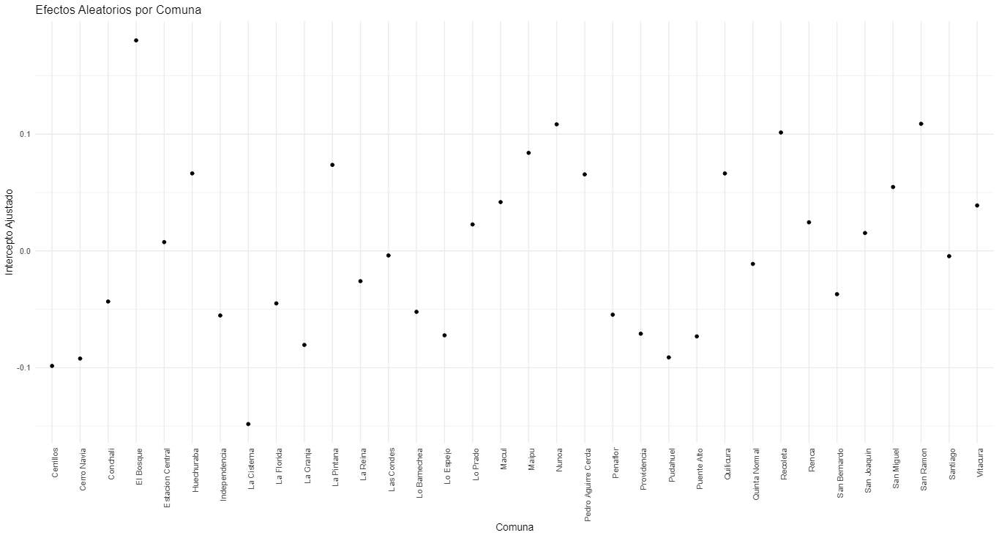

In [136]:
from rpy2.robjects import pandas2ri, r
from IPython.display import display
import pandas as pd

# Activar soporte de pandas en rpy2
pandas2ri.activate()

# Transferir el DataFrame de Python a R
r_data = pandas2ri.py2rpy(datos_transicion_1_2)
r.assign("datos_transicion_1_2", r_data)

# Código en R para calcular los residuales y generar la tabla
r('''
# Crear DataFrame con residuales, Fecha y Comuna
start_date <- as.Date("2020-03-30")
residuals_data <- data.frame(
    Fecha = as.Date(start_date + (datos_transicion_1_2$Día_original - 1)),
    Residual = residuals(modelo_D_1_2),
    Comuna = datos_transicion_1_2$Comuna,
    Día = datos_transicion_1_2$Día_original
)

# Guardar la tabla como archivo CSV
write.csv(residuals_data, file = "residuals_table_1_2_D.csv", row.names = FALSE)
''')

# Leer la tabla generada en R
residuals_table = pd.read_csv("residuals_table_1_2_D.csv")

# Configurar pandas para mostrar todas las filas (opcional)
pd.set_option('display.max_rows', None)

# Mostrar la tabla en Jupyter Notebook
#display(residuals_table)


#### Efectos Aleatorios por Días:

In [137]:
from rpy2.robjects import pandas2ri, r
from IPython.display import display
import pandas as pd

# Activar soporte de pandas en rpy2
pandas2ri.activate()

# Transferir el DataFrame de Python a R
r_data = pandas2ri.py2rpy(datos_transicion_1_2)
r.assign("datos_transicion_1_2", r_data)

# Código en R para ajustar el modelo, generar la tabla y el gráfico
r('''
library(lme4)
library(ggplot2)
library(httpgd)

# Configurar un dispositivo gráfico
options(bitmapType = "cairo")

# Iniciar el servidor httpgd
hgd()

# Ajustar el modelo GLMM
modelo_D_1_2 <- lmer(Probabilidad_Transición ~ IM_interno + IM_externo + Personas_hogar_promedio + por_educ_sup + indic_precariedad_vivienda + total_hog_hacinados + inmigrantes + inc_pc_comuna + (1|Comuna) + (1|Día_original), data = datos_transicion_1_2)

# Extraer efectos aleatorios por día
ranef_data <- ranef(modelo_D_1_2, condVar = TRUE)

# Convertir los efectos aleatorios de Día_original en un DataFrame
dia_effects <- as.data.frame(ranef_data$Día_original)
dia_effects$Día_original <- as.numeric(rownames(dia_effects))

# Calcular la fecha real a partir del día original
start_date <- as.Date("2020-03-30")
dia_effects$Fecha <- start_date + (dia_effects$Día_original - 1)

# Determinar días de semana o fin de semana
dias_semana <- c("Monday", "Tuesday", "Wednesday", "Thursday", "Friday")
dia_effects$Tipo_dia <- ifelse(weekdays(dia_effects$Fecha) %in% dias_semana, "Día de semana", "Fin de semana")

# Lista de días festivos a colorear como "Fin de semana"
festivos <- as.Date(c(
    "2020-04-10",  # Viernes Santo
    "2020-05-01",  # Día Nacional del Trabajo
    "2020-05-21",  # Glorias Navales
    "2020-06-29",  # San Pedro y San Pablo
    "2020-07-16",  # Virgen del Carmen
    "2020-09-18",  # Independencia Nacional
    "2020-10-12"   # Encuentro de Dos Mundos
))

# Clasificar festivos como "Fin de semana"
dia_effects$Tipo_dia <- ifelse(dia_effects$Fecha %in% festivos, "Fin de semana", dia_effects$Tipo_dia)

# Crear gráfico para efectos aleatorios por fecha con puntos coloreados por tipo de día
dia_plot <- ggplot(dia_effects, aes(x = Fecha, y = `(Intercept)`, color = Tipo_dia)) +
    geom_point(size = 2) +
    scale_color_manual(values = c("Día de semana" = "blue", "Fin de semana" = "red")) +
    labs(title = "Efectos Aleatorios por Fecha", x = "Fecha", y = "Intercepto Ajustado", color = "Tipo de Día") +
    theme_minimal() +
    theme(axis.text.x = element_text(angle = 45, hjust = 1))

# Renderizar el gráfico en httpgd
print(dia_plot)

# Guardar la tabla actualizada en un archivo CSV
write.csv(dia_effects, file = "dia_effects_table.csv", row.names = FALSE)
''')

# Leer la tabla generada en R
dia_effects_table = pd.read_csv("dia_effects_table.csv")

# Configurar pandas para mostrar todas las filas
pd.set_option('display.max_rows', None)

# Mostrar la tabla actualizada con fechas y tipos de día
#display(dia_effects_table)


httpgd server running at:
  http://127.0.0.1:49210/live?token=9WpoJSR2


R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: Some predictor variables are on very different scales: consider rescaling 

R[write to console]: 2: Some predictor variables are on very different scales: consider rescaling 



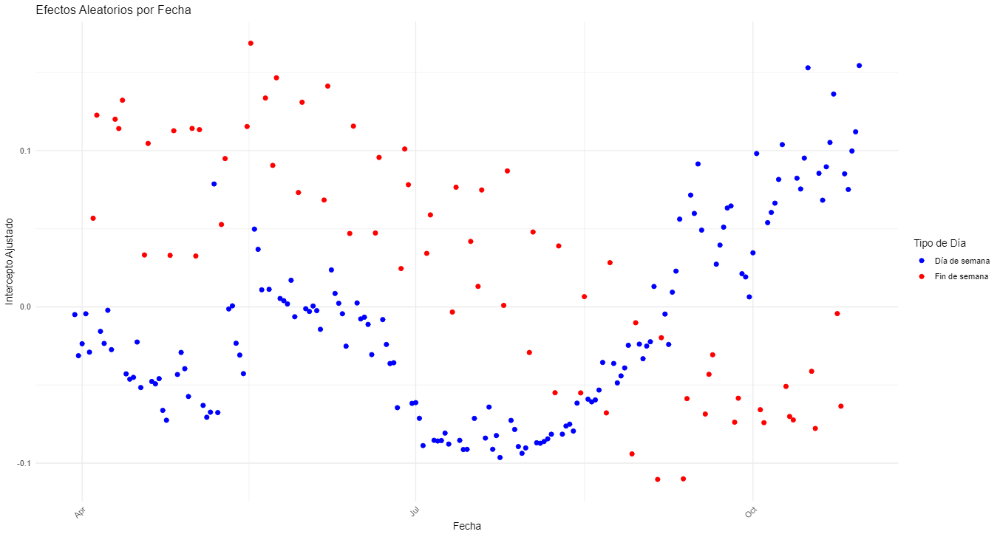

### Análisis de Residuales en el tiempo:

In [138]:
from rpy2.robjects import pandas2ri, r
from IPython.display import display
import pandas as pd

# Activar soporte de pandas en rpy2
pandas2ri.activate()

# Transferir el DataFrame de Python a R
r_data = pandas2ri.py2rpy(datos_transicion_1_2)
r.assign("datos_transicion_1_2", r_data)

# Código en R para calcular los residuales y generar la tabla
r('''
# Crear DataFrame con residuales, Fecha y Comuna
start_date <- as.Date("2020-03-30")
residuals_data <- data.frame(
    Fecha = as.Date(start_date + (datos_transicion_1_2$Día_original - 1)),
    Residual = residuals(modelo_D_1_2),
    Comuna = datos_transicion_1_2$Comuna,
    Día = datos_transicion_1_2$Día_original
)

# Guardar la tabla como archivo CSV
write.csv(residuals_data, file = "residuals_table_1_2_D.csv", row.names = FALSE)
''')

# Leer la tabla generada en R
residuals_table = pd.read_csv("residuals_table_1_2_D.csv")

# Configurar pandas para mostrar todas las filas (opcional)
pd.set_option('display.max_rows', None)

# Mostrar la tabla en Jupyter Notebook
#display(residuals_table)

In [139]:
r('''
# Crear un DataFrame con los residuales, la columna Fecha y la columna Comuna
residuals_data <- data.frame(
    Fecha = as.Date(start_date + (datos_transicion_1_2$Día_original - 1)),
    Residuals = residuals(modelo_D_1_2),
    Comuna = datos_transicion_1_2$Comuna
)

# Crear gráfico de residuales con Fecha en el eje x y colorear por Comuna
residuals_plot <- ggplot(residuals_data, aes(x = Fecha, y = Residuals, color = Comuna)) +
    geom_point() +
    labs(title = "Análisis de Residuales", x = "Fecha", y = "Residuales") +
    theme_minimal() +
    theme(axis.text.x = element_text(angle = 45, hjust = 1))  # Rotar etiquetas en el eje x

# Renderizar el gráfico en httpgd
print(residuals_plot)
''')


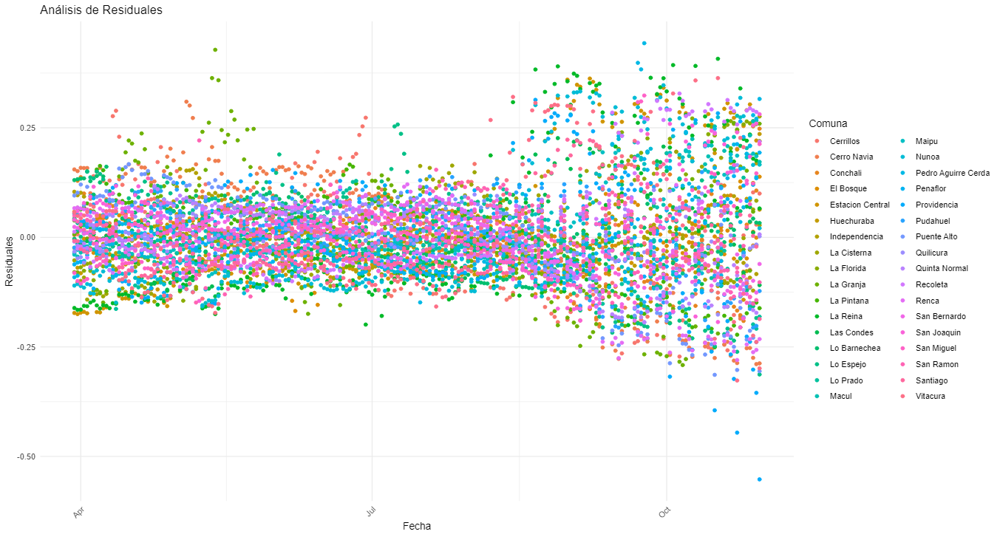

In [140]:
import pandas as pd

import pandas as pd

# Leer la tabla de residuales
residuals_table = pd.read_csv("residuals_table_1_2_D.csv")

# Calcular el rango de residuales por comuna
residual_stats = residuals_table.groupby('Comuna').agg(
    Residual_Minimo=('Residual', 'min'),
    Residual_Maximo=('Residual', 'max'),
    Desviacion_Estandar=('Residual', 'std')
).reset_index()

# Crear la columna de rango de residuales con formato "mínimo a máximo"
residual_stats['Rango de Residuales'] = residual_stats['Residual_Minimo'].round(6).astype(str) + " a " + residual_stats['Residual_Maximo'].round(6).astype(str)

# Seleccionar las 3 comunas con los residuales más negativos
negativos = residual_stats.nsmallest(3, 'Residual_Minimo')

# Seleccionar las 3 comunas con los residuales más positivos
positivos = residual_stats.nlargest(3, 'Residual_Maximo')

# Combinar los resultados en una única tabla
extremos = pd.concat([negativos, positivos])

# Seleccionar columnas relevantes para el resultado final
extremos = extremos[['Comuna', 'Rango de Residuales', 'Desviacion_Estandar']]

# Guardar la tabla en un archivo CSV
extremos.to_csv("tabla_extremos_residuales.csv", index=False)

# Mostrar la tabla
print(extremos)


                 Comuna   Rango de Residuales  Desviacion_Estandar
21          Providencia   -0.552486 a 0.31379             0.139048
33             Vitacura  -0.326856 a 0.363422             0.132464
23          Puente Alto  -0.313876 a 0.167035             0.117040
19  Pedro Aguirre Cerda   -0.148485 a 0.44313             0.099151
9             La Granja  -0.291497 a 0.428081             0.142966
11             La Reina  -0.200366 a 0.407534             0.176650


#### Interpretación de los efectos aleatorios y análisis de residuales del Modelo D para la transición de Leve a Moderado:
1. Efectos Aleatorios por Comuna:
    - El gráfico de efectos aleatorios por comuna muestra la variabilidad en el intercepto ajustado para cada comuna.
    - Comunas como Pedro Aguirre Cerda y San Joaquín tienen efectos positivos significativos en la probabilidad de transición, lo que indica que, en promedio, estas comunas tienen mayores probabilidades de transición de leve a moderado, después de ajustar por otros factores.
    - Por otro lado, comunas como Vitacura y Lo Barnechea tienen interceptos ajustados negativos, lo que sugiere que tienen una menor probabilidad de transición de leve a moderado en comparación con otras comunas.
    - Esta variabilidad puede estar asociada a factores no observados relacionados con características específicas de las comunas.
2. Efectos Aleatorios por Días:
    - El gráfico que relaciona los efectos aleatorios por días muestra diferencias significativas en el intercepto ajustado entre días de semana y fines de semana:
    - Los fines de semana tienden a tener efectos positivos en la probabilidad de transición. Esto podría deberse a cambios en la dinámica de las comunas (menor movilidad laboral, actividades sociales, etc.).
    - Por ejemplo, días como el 5 de abril (Fin de semana) tienen un efecto positivo notable, mientras que días como el 30 de abril (Día de semana) tienen efectos negativos.
    - Estas diferencias diarias sugieren que la probabilidad de transición de leve a moderado puede depender de patrones temporales o conductuales específicos de los días.
3. Análisis de Residuales en el Tiempo:
    - El análisis de residuales busca identificar patrones no explicados por el modelo:
    - La dispersión en los residuales es relativamente uniforme, indicando que el modelo ajusta razonablemente bien los datos.
    - Sin embargo, algunos valores extremos (outliers) aparecen hacia el final del periodo analizado. Esto puede sugerir eventos específicos que influyeron en las probabilidades de transición y que no están contemplados en las variables explicativas.
    - La ausencia de un patrón claro en los residuales indica que no hay una fuerte autocorrelación temporal no modelada.
- Conclusiones del Modelo D:
    - El Modelo D incorpora múltiples predictores (IM_interno, IM_externo, características socioeconómicas, etc.) además de efectos aleatorios por comuna y días.
- Significancia de las Variables:
    - IM_interno e IM_externo tienen efectos altamente significativos y positivos, lo que indica que son predictores clave de la transición.
    - Variables como total_hog_hacinados y Personas_hogar_promedio también tienen efectos significativos pero menores en comparación.
    - La inclusión de efectos aleatorios mejora el ajuste del modelo al capturar la variabilidad no explicada por las variables fijas.


## **Transición 1->3 Leve a Severo**

In [141]:
# Filtrar los datos para la transición 'Trans_2->1'
transicion_especifica_1_3 = 'Trans_1->3'
datos_transicion_1_3 = glmm_data[glmm_data['Transición'] == transicion_especifica_1_3]

# Asegurarse de que la columna 'Comuna' sea categórica
datos_transicion_1_3['Comuna'] = datos_transicion_1_3['Comuna'].astype('category')

# Inspeccionar los datos
print(f"Número de observaciones para {transicion_especifica_1_3}: {len(datos_transicion_1_3)}")
print(datos_transicion_1_3.head())

Número de observaciones para Trans_1->3: 7310
          Comuna  Día_original  Día_correlativo  Transición  \
14620  Cerrillos             1                0  Trans_1->3   
14621  Cerrillos             2                1  Trans_1->3   
14622  Cerrillos             3                2  Trans_1->3   
14623  Cerrillos             4                3  Trans_1->3   
14624  Cerrillos             5                4  Trans_1->3   

       Probabilidad_Transición  dias  IM_interno  IM_externo  \
14620             4.056043e-25     1    1.918137    7.524704   
14621             1.580162e-23     2    1.970381    7.804008   
14622             6.889444e-26     3    1.845790    7.471452   
14623             1.250997e-29     4    1.678598    6.891732   
14624             4.556638e-23     5    1.736766    8.317872   

       TasaCasosAcumulados  Casos_Diarios_Brutos  Casos_Diarios_Brutos_MM7  \
14620             0.000000              0.000000                  0.000000   
14621             2.248303        

C:\Users\ferna\AppData\Local\Temp\ipykernel_38828\3699758736.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos_transicion_1_3['Comuna'] = datos_transicion_1_3['Comuna'].astype('category')


In [142]:
from rpy2.robjects import pandas2ri, r

# Activar soporte de pandas en rpy2
pandas2ri.activate()

# Transferir el DataFrame de Python a R
r_data = pandas2ri.py2rpy(datos_transicion_1_3)
r.assign("datos_transicion_1_3", r_data)

Comuna,Día_original,Día_correlativo,...,indic_precariedad_vivienda,por_educ_sup,IPS_2020
Cerri...,1,0,...,...,...,...
Cerri...,2,1,,,,
Cerri...,3,2,,,,
Cerri...,4,3,,,,
...,...,...,,,,
Vitac...,212,7306,,,,
Vitac...,213,7307,,,,
Vitac...,214,7308,,,,
Vitac...,215,7309,,,,


## Transición 1->3: Transición Leve a Severo
### Modelo A
Fórmula Modelo A: "Probabilidad_Transición ~ (1|Comuna)"

In [143]:
r('''
library(lme4)
library(ggplot2)
library(httpgd)

# Iniciar el servidor httpgd
hgd()

# Escalar las variables
#datos_transicion_1_3$IM_interno <- scale(datos_transicion_1_3$IM_interno)
#datos_transicion_1_3$IM_externo <- scale(datos_transicion_1_3$IM_externo)
#datos_transicion_1_3$Personas_hogar_promedio <- scale(datos_transicion_1_3$Personas_hogar_promedio)
#datos_transicion_1_3$por_educ_sup <- scale(datos_transicion_1_3$por_educ_sup)
#datos_transicion_1_3$indic_precariedad_vivienda <- scale(datos_transicion_1_3$indic_precariedad_vivienda)
#datos_transicion_1_3$total_hog_hacinados <- scale(datos_transicion_1_3$total_hog_hacinados)
#datos_transicion_1_3$inmigrantes <- scale(datos_transicion_1_3$inmigrantes)
#datos_transicion_1_3$inc_pc_comuna <- scale(datos_transicion_1_3$inc_pc_comuna)

# Ajustar el modelo GLMM
modelo_A_1_3 <- lmer(Probabilidad_Transición ~ (1|Comuna), data = datos_transicion_1_3)

# Capturar y mostrar el resumen del modelo
summary_text <- capture.output(summary(modelo_A_1_3))
writeLines(summary_text)
''')

httpgd server running at:
  http://127.0.0.1:49340/live?token=bpLmIR5s
Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: Probabilidad_Transición ~ (1 | Comuna)
   Data: datos_transicion_1_3

REML criterion at convergence: 1857.1

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-2.5773 -0.2902 -0.0182 -0.0046  3.6420 

Random effects:
 Groups   Name        Variance Std.Dev.
 Comuna   (Intercept) 0.03624  0.1904  
 Residual             0.07382  0.2717  
Number of obs: 7310, groups:  Comuna, 34

Fixed effects:
            Estimate Std. Error      df t value Pr(>|t|)    
(Intercept)   0.1328     0.0328 33.0000   4.049 0.000293 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1


## Transición 1->3: Transición Leve a Severo
### Modelo B
Fórmula Modelo B: "Probabilidad_Transición ~ (1|Comuna) +(1|Día_original)"

In [144]:
r('''
library(lme4)
library(ggplot2)
library(httpgd)

# Iniciar el servidor httpgd
hgd()

# Escalar las variables
#datos_transicion_1_3$IM_interno <- scale(datos_transicion_1_3$IM_interno)
#datos_transicion_1_3$IM_externo <- scale(datos_transicion_1_3$IM_externo)
#datos_transicion_1_3$Personas_hogar_promedio <- scale(datos_transicion_1_3$Personas_hogar_promedio)
#datos_transicion_1_3$por_educ_sup <- scale(datos_transicion_1_3$por_educ_sup)
#datos_transicion_1_3$indic_precariedad_vivienda <- scale(datos_transicion_1_3$indic_precariedad_vivienda)
#datos_transicion_1_3$total_hog_hacinados <- scale(datos_transicion_1_3$total_hog_hacinados)
#datos_transicion_1_3$inmigrantes <- scale(datos_transicion_1_3$inmigrantes)
#datos_transicion_1_3$inc_pc_comuna <- scale(datos_transicion_1_3$inc_pc_comuna)

# Ajustar el modelo GLMM
modelo_B_1_3 <- lmer(Probabilidad_Transición ~ (1|Comuna) + (1|Día_original), data = datos_transicion_1_3)

# Capturar y mostrar el resumen del modelo
summary_text <- capture.output(summary(modelo_B_1_3))
writeLines(summary_text)
''')

httpgd server running at:
  http://127.0.0.1:49341/live?token=Sy7MJQ6e
Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: Probabilidad_Transición ~ (1 | Comuna) + (1 | Día_original)
   Data: datos_transicion_1_3

REML criterion at convergence: 172.3

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-2.4847 -0.7557  0.0825  0.4964  3.5248 

Random effects:
 Groups       Name        Variance Std.Dev.
 Día_original (Intercept) 0.01954  0.1398  
 Comuna       (Intercept) 0.03633  0.1906  
 Residual                 0.05428  0.2330  
Number of obs: 7310, groups:  Día_original, 215; Comuna, 34

Fixed effects:
            Estimate Std. Error       df t value Pr(>|t|)    
(Intercept)  0.13282    0.03416 38.75937   3.888 0.000385 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1


## Transición 1->3: Transición Leve a Severo
### Modelo C
Fórmula Modelo C: "Probabilidad_Transición ~ IM_interno + IM_externo + (1|Comuna) +(1|Día_original)"

In [145]:
r('''
library(lme4)
library(ggplot2)
library(httpgd)

# Iniciar el servidor httpgd
hgd()

# Escalar las variables
datos_transicion_1_3$IM_interno <- scale(datos_transicion_1_3$IM_interno)
datos_transicion_1_3$IM_externo <- scale(datos_transicion_1_3$IM_externo)
#datos_transicion_1_3$Personas_hogar_promedio <- scale(datos_transicion_1_3$Personas_hogar_promedio)
#datos_transicion_1_3$por_educ_sup <- scale(datos_transicion_1_3$por_educ_sup)
#datos_transicion_1_3$indic_precariedad_vivienda <- scale(datos_transicion_1_3$indic_precariedad_vivienda)
#datos_transicion_1_3$total_hog_hacinados <- scale(datos_transicion_1_3$total_hog_hacinados)
#datos_transicion_1_3$inmigrantes <- scale(datos_transicion_1_3$inmigrantes)
#datos_transicion_1_3$inc_pc_comuna <- scale(datos_transicion_1_3$inc_pc_comuna)

# Ajustar el modelo GLMM
modelo_C_1_3 <- lmer(Probabilidad_Transición ~ IM_externo + IM_interno + (1|Comuna) + (1|Día_original), data = datos_transicion_1_3)

# Capturar y mostrar el resumen del modelo
summary_text <- capture.output(summary(modelo_C_1_3))
writeLines(summary_text)
''')

httpgd server running at:
  http://127.0.0.1:49343/live?token=RlYo84z0
Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: Probabilidad_Transición ~ IM_externo + IM_interno + (1 | Comuna) +  
    (1 | Día_original)
   Data: datos_transicion_1_3

REML criterion at convergence: -2721.8

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-3.8364 -0.6108 -0.0710  0.3649  3.7914 

Random effects:
 Groups       Name        Variance  Std.Dev.
 Día_original (Intercept) 0.0003107 0.01763 
 Comuna       (Intercept) 0.0307154 0.17526 
 Residual                 0.0390160 0.19752 
Number of obs: 7310, groups:  Día_original, 215; Comuna, 34

Fixed effects:
             Estimate Std. Error        df t value Pr(>|t|)    
(Intercept) 1.328e-01  3.017e-02 2.878e+01   4.402 0.000135 ***
IM_externo  2.621e-02  5.514e-03 1.431e+03   4.753  2.2e-06 ***
IM_interno  3.657e-01  7.658e-03 3.078e+03  47.759  < 2e-16 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.

## Transición 1->3: Transición Leve a Severo
### Modelo D
Fórmula Modelo D: "Probabilidad_Transición ~ IM_interno + IM_externo + Personas_hogar_promedio + por_educ_sup + indic_precariedad_vivienda + total_hog_hacinados + inmigrantes + inc_pc_comuna + (1|Comuna) + (1|Día_original)"

In [146]:
r('''
library(lme4)
library(ggplot2)
library(httpgd)

# Iniciar el servidor httpgd
hgd()

# Escalar las variables
datos_transicion_1_3$IM_interno <- scale(datos_transicion_1_3$IM_interno)
datos_transicion_1_3$IM_externo <- scale(datos_transicion_1_3$IM_externo)
datos_transicion_1_3$Personas_hogar_promedio <- scale(datos_transicion_1_3$Personas_hogar_promedio)
datos_transicion_1_3$por_educ_sup <- scale(datos_transicion_1_3$por_educ_sup)
datos_transicion_1_3$indic_precariedad_vivienda <- scale(datos_transicion_1_3$indic_precariedad_vivienda)
datos_transicion_1_3$total_hog_hacinados <- scale(datos_transicion_1_3$total_hog_hacinados)
datos_transicion_1_3$inmigrantes <- scale(datos_transicion_1_3$inmigrantes)
datos_transicion_1_3$inc_pc_comuna <- scale(datos_transicion_1_3$inc_pc_comuna)

# Ajustar el modelo GLMM
modelo_D_1_3 <- lmer(Probabilidad_Transición ~ IM_interno + IM_externo + Personas_hogar_promedio + por_educ_sup + indic_precariedad_vivienda + total_hog_hacinados + inmigrantes + inc_pc_comuna + (1|Comuna) + (1|Día_original), data = datos_transicion_1_3)

# Capturar y mostrar el resumen del modelo
summary_text <- capture.output(summary(modelo_D_1_3))
writeLines(summary_text)
''')

httpgd server running at:
  http://127.0.0.1:49344/live?token=IwN6B9Z4
Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: 
Probabilidad_Transición ~ IM_interno + IM_externo + Personas_hogar_promedio +  
    por_educ_sup + indic_precariedad_vivienda + total_hog_hacinados +  
    inmigrantes + inc_pc_comuna + (1 | Comuna) + (1 | Día_original)
   Data: datos_transicion_1_3

REML criterion at convergence: -2728.3

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-3.8901 -0.6084 -0.0739  0.3618  3.8090 

Random effects:
 Groups       Name        Variance  Std.Dev.
 Día_original (Intercept) 0.0003105 0.01762 
 Comuna       (Intercept) 0.0120251 0.10966 
 Residual                 0.0390059 0.19750 
Number of obs: 7310, groups:  Día_original, 215; Comuna, 34

Fixed effects:
                             Estimate Std. Error         df t value Pr(>|t|)
(Intercept)                 1.328e-01  1.899e-02  2.647e+01   6.996  1.8e-07
IM_interno    

#### Comparación de los Modelos (A, B, C y D) para Transición 1->3 Leve a Severo

- Modelo A
    - Fórmula: Probabilidad_Transición ~ (1|Comuna)
    - Criterio REML: 1857.1
    - Efectos Aleatorios:
        - Variabilidad entre comunas: 0.03624 (Desviación estándar: 0.1904)
        - Residual: 0.07382 (Desviación estándar: 0.2717)
    - Efectos Fijos:
        - Intercepto: 0.1328 (significativo a nivel p < 0.001)
        - Este modelo captura la variabilidad entre comunas, pero no incluye otros factores temporales o predictivos.
- Modelo B
    - Fórmula: Probabilidad_Transición ~ (1|Comuna) + (1|Día_original)
    - Criterio REML: 172.3
    - Efectos Aleatorios:
        - Variabilidad entre comunas: 0.03633 (Desviación estándar: 0.1906)
        - Variabilidad entre días: 0.01954 (Desviación estándar: 0.1398)
        - Residual: 0.05428 (Desviación estándar: 0.2330)
    - Efectos Fijos:
        - Intercepto: 0.13282 (significativo a nivel p < 0.001)
        - Este modelo mejora respecto al Modelo A al incluir la variabilidad entre días, reduciendo la varianza residual.
- Modelo C
    - Fórmula: Probabilidad_Transición ~ IM_interno + IM_externo + (1|Comuna) + (1|Día_original)
    - Criterio REML: -2721.8
    - Efectos Aleatorios:
        - Variabilidad entre comunas: 0.03072 (Desviación estándar: 0.1753)
        - Variabilidad entre días: 0.00031 (Desviación estándar: 0.0176)
        - Residual: 0.03902 (Desviación estándar: 0.1975)
    - Efectos Fijos:
        - Intercepto: 0.1328 (significativo a nivel p < 0.001)
        - IM_interno: 0.3657 (significativo a nivel p < 0.001)
        - IM_externo: 0.0262 (significativo a nivel p < 0.001)
        - Este modelo incluye predictores clave (IM_interno e IM_externo), reduciendo significativamente la varianza residual. Además, la variabilidad entre días es mínima, lo que sugiere que otros factores explican mejor la transición.
- Modelo D
    - Fórmula: Probabilidad_Transición ~ IM_interno + IM_externo + Personas_hogar_promedio + por_educ_sup + indic_precariedad_vivienda + total_hog_hacinados + inmigrantes + inc_pc_comuna + (1|Comuna) + (1|Día_original)
    - Criterio REML: -2728.3
    - Efectos Aleatorios:
        - Variabilidad entre comunas: 0.01203 (Desviación estándar: 0.1097)
        - Variabilidad entre días: 0.00031 (Desviación estándar: 0.0176)
        - Residual: 0.03901 (Desviación estándar: 0.1975)
    - Efectos Fijos:
        - IM_interno: 0.3729 (significativo a nivel p < 0.001)
        - IM_externo: 0.0217 (significativo a nivel p < 0.001)
        - Personas_hogar_promedio: -0.1396 (significativo a nivel p < 0.001)
        - Porcentaje de educación superior: -0.1976 (significativo a nivel p < 0.01)
        - Inmigrantes: -0.0562 (marginalmente significativo a nivel p < 0.05)
    - **Este modelo es el más completo, incorporando múltiples predictores socioeconómicos además de los efectos aleatorios. La varianza entre comunas es mucho menor, lo que indica que las variables explicativas capturan gran parte de la variabilidad.**

- Conclusión
    - Modelo A y B: Son útiles para capturar efectos aleatorios básicos, pero no incluyen factores explicativos importantes como las condiciones internas y externas (IM).
    - Modelo C: Incorpora predictores clave (IM_interno e IM_externo), mejorando significativamente el ajuste y reduciendo la varianza residual.
    - Modelo D: Es el más completo y con mejor ajuste (menor criterio REML). Sin embargo, introduce mayor complejidad al incluir múltiples factores socioeconómicos, algunos de los cuales tienen efectos menos significativos.

### Efectos Aleatorios del Modelo D:
#### Efecto Aleatorio por Comuna:

In [147]:
r('''
library(lme4)
library(ggplot2)
library(httpgd)

# Configurar un dispositivo gráfico antes de guardar el gráfico
options(bitmapType = "cairo")

# Iniciar el servidor httpgd
hgd()

# Visualización: Variabilidad entre días y comunas
# Extraer efectos aleatorios
ranef_data <- ranef(modelo_D_1_3, condVar = TRUE)

# Convertir los efectos aleatorios de Comuna en un DataFrame
comuna_effects <- as.data.frame(ranef_data$Comuna)
print(comuna_effects)

# Crear gráfico para efectos aleatorios por comuna
comuna_plot <- ggplot(comuna_effects, aes(x = rownames(comuna_effects), y = `(Intercept)`)) +
    geom_point() +
    labs(title = "Efectos Aleatorios por Comuna", x = "Comuna", y = "Intercepto Ajustado") +
    theme_minimal() +
    theme(axis.text.x = element_text(angle = 90, hjust = 1))  # Rotar etiquetas en el eje x


# Validación del Modelo: Análisis de residuales
plot(residuals(modelo_D_1_3), main = "Análisis de Residuales")

# Renderizar el gráfico en httpgd
print(comuna_plot)
''')

httpgd server running at:
  http://127.0.0.1:49347/live?token=ff4j4fLz
                     (Intercept)
Cerrillos            0.038906285
Cerro Navia          0.018971317
Conchali            -0.067524456
El Bosque            0.102523692
Estacion Central     0.058978242
Huechuraba          -0.029685289
Independencia       -0.166119122
La Cisterna         -0.178524559
La Florida          -0.045098701
La Granja           -0.007010006
La Pintana           0.168342505
La Reina            -0.007079473
Las Condes          -0.030891946
Lo Barnechea        -0.090815242
Lo Espejo            0.022980668
Lo Prado             0.088078296
Macul               -0.021146216
Maipu                0.044052462
Nunoa                0.118050611
Pedro Aguirre Cerda  0.095039188
Penaflor            -0.143743744
Providencia         -0.080772651
Pudahuel            -0.066747050
Puente Alto          0.019031615
Quilicura           -0.035400721
Quinta Normal       -0.115352170
Recoleta            -0.167077007
Renca

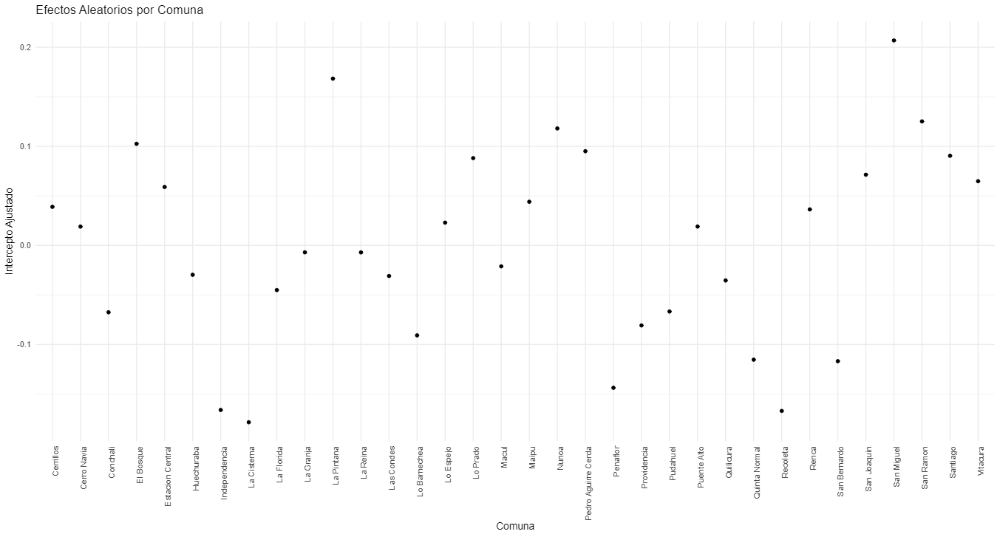

#### Efectos Aleatorios por Días:

In [148]:
from rpy2.robjects import pandas2ri, r
from IPython.display import display
import pandas as pd

# Activar soporte de pandas en rpy2
pandas2ri.activate()

# Transferir el DataFrame de Python a R
r_data = pandas2ri.py2rpy(datos_transicion_1_3)
r.assign("datos_transicion_1_3", r_data)

# Código en R para ajustar el modelo, generar la tabla y el gráfico
r('''
library(lme4)
library(ggplot2)
library(httpgd)

# Configurar un dispositivo gráfico
options(bitmapType = "cairo")

# Iniciar el servidor httpgd
hgd()

# Ajustar el modelo GLMM
modelo_D_1_3 <- lmer(Probabilidad_Transición ~ IM_interno + IM_externo + Personas_hogar_promedio + por_educ_sup + indic_precariedad_vivienda + total_hog_hacinados + inmigrantes + inc_pc_comuna + (1|Comuna) + (1|Día_original), data = datos_transicion_1_3)

# Extraer efectos aleatorios por día
ranef_data <- ranef(modelo_D_1_3, condVar = TRUE)

# Convertir los efectos aleatorios de Día_original en un DataFrame
dia_effects <- as.data.frame(ranef_data$Día_original)
dia_effects$Día_original <- as.numeric(rownames(dia_effects))

# Calcular la fecha real a partir del día original
start_date <- as.Date("2020-03-30")
dia_effects$Fecha <- start_date + (dia_effects$Día_original - 1)

# Determinar días de semana o fin de semana
dias_semana <- c("Monday", "Tuesday", "Wednesday", "Thursday", "Friday")
dia_effects$Tipo_dia <- ifelse(weekdays(dia_effects$Fecha) %in% dias_semana, "Día de semana", "Fin de semana")

# Lista de días festivos a colorear como "Fin de semana"
festivos <- as.Date(c(
    "2020-04-10",  # Viernes Santo
    "2020-05-01",  # Día Nacional del Trabajo
    "2020-05-21",  # Glorias Navales
    "2020-06-29",  # San Pedro y San Pablo
    "2020-07-16",  # Virgen del Carmen
    "2020-09-18",  # Independencia Nacional
    "2020-10-12"   # Encuentro de Dos Mundos
))

# Clasificar festivos como "Fin de semana"
dia_effects$Tipo_dia <- ifelse(dia_effects$Fecha %in% festivos, "Fin de semana", dia_effects$Tipo_dia)

# Crear gráfico para efectos aleatorios por fecha con puntos coloreados por tipo de día
dia_plot <- ggplot(dia_effects, aes(x = Fecha, y = `(Intercept)`, color = Tipo_dia)) +
    geom_point(size = 2) +
    scale_color_manual(values = c("Día de semana" = "blue", "Fin de semana" = "red")) +
    labs(title = "Efectos Aleatorios por Fecha", x = "Fecha", y = "Intercepto Ajustado", color = "Tipo de Día") +
    theme_minimal() +
    theme(axis.text.x = element_text(angle = 45, hjust = 1))

# Renderizar el gráfico en httpgd
print(dia_plot)

# Guardar la tabla actualizada en un archivo CSV
write.csv(dia_effects, file = "dia_effects_table.csv", row.names = FALSE)
''')

# Leer la tabla generada en R
dia_effects_table = pd.read_csv("dia_effects_table.csv")

# Configurar pandas para mostrar todas las filas
pd.set_option('display.max_rows', None)

# Mostrar la tabla actualizada con fechas y tipos de día
#display(dia_effects_table)

httpgd server running at:
  http://127.0.0.1:49350/live?token=ftfGTI4m


R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: Some predictor variables are on very different scales: consider rescaling 

R[write to console]: 2: Some predictor variables are on very different scales: consider rescaling 



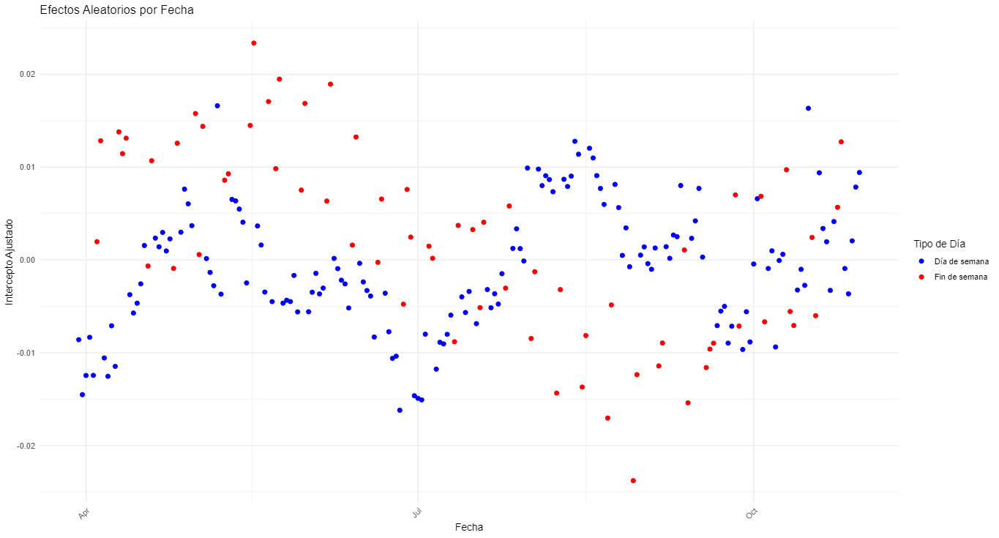

### Análisis de Residuales en el tiempo:

In [149]:
from rpy2.robjects import pandas2ri, r
from IPython.display import display
import pandas as pd

# Activar soporte de pandas en rpy2
pandas2ri.activate()

# Transferir el DataFrame de Python a R
r_data = pandas2ri.py2rpy(datos_transicion_1_3)
r.assign("datos_transicion_1_3", r_data)

# Código en R para calcular los residuales y generar la tabla
r('''
# Crear DataFrame con residuales, Fecha y Comuna
start_date <- as.Date("2020-03-30")
residuals_data <- data.frame(
    Fecha = as.Date(start_date + (datos_transicion_1_3$Día_original - 1)),
    Residual = residuals(modelo_D_1_3),
    Comuna = datos_transicion_1_3$Comuna,
    Día = datos_transicion_1_3$Día_original
)

# Guardar la tabla como archivo CSV
write.csv(residuals_data, file = "residuals_table_1_3_D.csv", row.names = FALSE)
''')

# Leer la tabla generada en R
residuals_table = pd.read_csv("residuals_table_1_3_D.csv")

# Configurar pandas para mostrar todas las filas (opcional)
pd.set_option('display.max_rows', None)

# Mostrar la tabla en Jupyter Notebook
#display(residuals_table)


In [150]:
r('''
# Crear un DataFrame con los residuales, la columna Fecha y la columna Comuna
residuals_data <- data.frame(
    Fecha = as.Date(start_date + (datos_transicion_1_3$Día_original - 1)),
    Residuals = residuals(modelo_D_1_3),
    Comuna = datos_transicion_1_3$Comuna
)

# Crear gráfico de residuales con Fecha en el eje x y colorear por Comuna
residuals_plot <- ggplot(residuals_data, aes(x = Fecha, y = Residuals, color = Comuna)) +
    geom_point() +
    labs(title = "Análisis de Residuales", x = "Fecha", y = "Residuales") +
    theme_minimal() +
    theme(axis.text.x = element_text(angle = 45, hjust = 1))  # Rotar etiquetas en el eje x

# Renderizar el gráfico en httpgd
print(residuals_plot)
''')

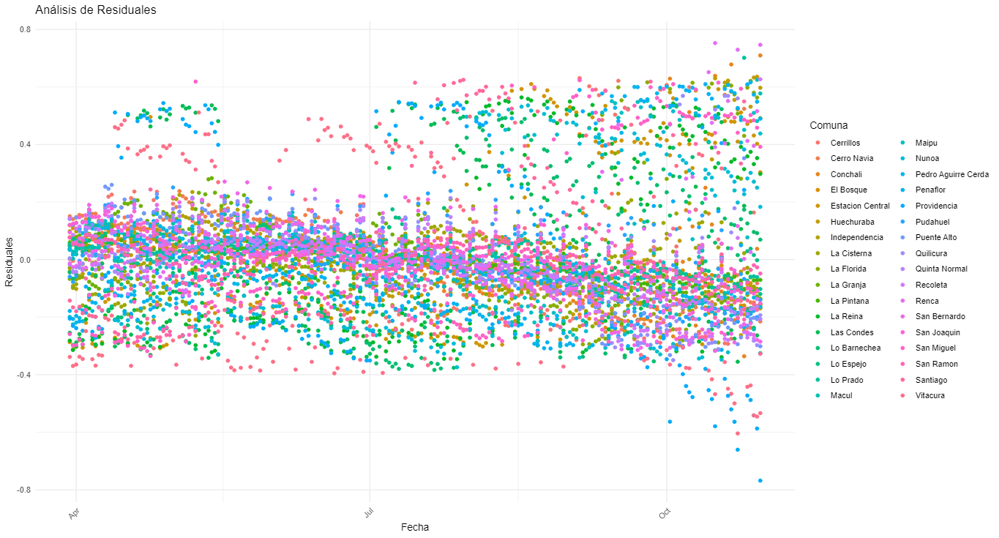

In [151]:
import pandas as pd

import pandas as pd

# Leer la tabla de residuales
residuals_table = pd.read_csv("residuals_table_1_3_D.csv")

# Calcular el rango de residuales por comuna
residual_stats = residuals_table.groupby('Comuna').agg(
    Residual_Minimo=('Residual', 'min'),
    Residual_Maximo=('Residual', 'max'),
    Desviacion_Estandar=('Residual', 'std')
).reset_index()

# Crear la columna de rango de residuales con formato "mínimo a máximo"
residual_stats['Rango de Residuales'] = residual_stats['Residual_Minimo'].round(6).astype(str) + " a " + residual_stats['Residual_Maximo'].round(6).astype(str)

# Seleccionar las 3 comunas con los residuales más negativos
negativos = residual_stats.nsmallest(3, 'Residual_Minimo')

# Seleccionar las 3 comunas con los residuales más positivos
positivos = residual_stats.nlargest(3, 'Residual_Maximo')

# Combinar los resultados en una única tabla
extremos = pd.concat([negativos, positivos])

# Seleccionar columnas relevantes para el resultado final
extremos = extremos[['Comuna', 'Rango de Residuales', 'Desviacion_Estandar']]

# Guardar la tabla en un archivo CSV
extremos.to_csv("tabla_extremos_residuales.csv", index=False)

# Mostrar la tabla
print(extremos)


          Comuna   Rango de Residuales  Desviacion_Estandar
21   Providencia  -0.768299 a 0.557326             0.331201
33      Vitacura  -0.604307 a 0.527345             0.331024
13  Lo Barnechea   -0.38363 a 0.531661             0.261255
27         Renca  -0.191278 a 0.752282             0.152568
2       Conchali   -0.33628 a 0.709292             0.151095
15      Lo Prado  -0.140215 a 0.701135             0.069762


#### Interpretación de Efectos Aleatorios y análisis de Residuales del Modelo D para la transición 1->2 de Leve a Severo
- Efecto Aleatorio por Comuna
    - El gráfico muestra la variación del intercepto ajustado entre las diferentes comunas. Algunas observaciones clave:
    - Comunas con interceptos positivos: San Miguel, La Pintana y San Ramón presentan los interceptos más altos, lo que sugiere que estas comunas tienen una mayor probabilidad base de transitar de leve a severo en comparación con otras.
    - Comunas con interceptos negativos: Independencia, La Cisterna y Quinta Normal tienen interceptos ajustados negativos, lo que indica una menor probabilidad base de transitar de leve a severo.
    - Distribución general: Existe una variación significativa entre comunas, lo que destaca la importancia del efecto aleatorio por comuna en el modelo.
- Efecto Aleatorio por Días
    - El gráfico y los datos tabulares presentan el efecto aleatorio diario:
    - Tendencias entre días de semana y fines de semana: Durante los fines de semana, los interceptos tienden a ser más bajos en general, lo que podría indicar una menor probabilidad de transición de leve a severo durante estos días.
    - Variabilidad: Aunque la magnitud de los efectos aleatorios por día es menor en comparación con los efectos por comuna, sigue existiendo cierta variación que podría deberse a factores temporales o contextuales.
- Análisis de Residuales en el Tiempo
    - El análisis de residuales refleja la calidad del ajuste del modelo:
    - Distribución uniforme: Los residuales están distribuidos de manera uniforme a lo largo del tiempo, lo que sugiere que no hay un patrón temporal claro que no haya sido capturado por el modelo.
    - Variación limitada: Los residuales son pequeños en magnitud, lo que indica que el modelo captura bien la variabilidad en los datos.
- Conclusión
    - El Modelo D es robusto al incluir múltiples factores (variables fijas y aleatorias) que explican la transición de leve a severo. La variabilidad significativa entre comunas destaca la importancia de capturar diferencias espaciales. Por otro lado, los efectos aleatorios por días y el análisis de residuales refuerzan que el modelo ajusta adecuadamente las variaciones temporales. Sin embargo, sería interesante explorar interacciones entre comunas y días para entender cómo factores temporales pueden influir diferencialmente en cada comuna.

## **Transición 2->2: Mantención en Moderado**

In [58]:
# Filtrar los datos para la transición 'Trans_2->1'
transicion_especifica_2_2 = 'Trans_2->2'
datos_transicion_2_2 = glmm_data[glmm_data['Transición'] == transicion_especifica_2_2]

# Asegurarse de que la columna 'Comuna' sea categórica
datos_transicion_2_2['Comuna'] = datos_transicion_2_2['Comuna'].astype('category')

# Inspeccionar los datos
print(f"Número de observaciones para {transicion_especifica_2_2}: {len(datos_transicion_2_2)}")
print(datos_transicion_2_2.head())

Número de observaciones para Trans_2->2: 7310
          Comuna  Día_original  Día_correlativo  Transición  \
29240  Cerrillos             1                0  Trans_2->2   
29241  Cerrillos             2                1  Trans_2->2   
29242  Cerrillos             3                2  Trans_2->2   
29243  Cerrillos             4                3  Trans_2->2   
29244  Cerrillos             5                4  Trans_2->2   

       Probabilidad_Transición  dias  IM_interno  IM_externo  \
29240                 0.998064     1    1.918137    7.524704   
29241                 0.998027     2    1.970381    7.804008   
29242                 0.997807     3    1.845790    7.471452   
29243                 0.994554     4    1.678598    6.891732   
29244                 0.996636     5    1.736766    8.317872   

       TasaCasosAcumulados  Casos_Diarios_Brutos  Casos_Diarios_Brutos_MM7  \
29240             0.000000              0.000000                  0.000000   
29241             2.248303        

C:\Users\ferna\AppData\Local\Temp\ipykernel_38828\3197664282.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos_transicion_2_2['Comuna'] = datos_transicion_2_2['Comuna'].astype('category')


In [59]:
from rpy2.robjects import pandas2ri, r

# Activar soporte de pandas en rpy2
pandas2ri.activate()

# Transferir el DataFrame de Python a R
r_data = pandas2ri.py2rpy(datos_transicion_2_2)
r.assign("datos_transicion_2_2", r_data)

Comuna,Día_original,Día_correlativo,...,indic_precariedad_vivienda,por_educ_sup,IPS_2020
Cerri...,1,0,...,...,...,...
Cerri...,2,1,,,,
Cerri...,3,2,,,,
Cerri...,4,3,,,,
...,...,...,,,,
Vitac...,212,7306,,,,
Vitac...,213,7307,,,,
Vitac...,214,7308,,,,
Vitac...,215,7309,,,,


## Transición 2->2: Mantención Moderado
### Modelo A
Fórmula Modelo A: "Probabilidad_Transición ~ (1|Comuna)"

In [60]:
r('''
library(lme4)
library(ggplot2)
library(httpgd)

# Iniciar el servidor httpgd
hgd()


# Ajustar el modelo GLMM
modelo_A_2_2 <- lmer(Probabilidad_Transición ~ (1|Comuna), data = datos_transicion_2_2)

# Capturar y mostrar el resumen del modelo
summary_text <- capture.output(summary(modelo_A_2_2))
writeLines(summary_text)
''')

httpgd server running at:
  http://127.0.0.1:63510/live?token=Rka8m59u
Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: Probabilidad_Transición ~ (1 | Comuna)
   Data: datos_transicion_2_2

REML criterion at convergence: -538.8

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-3.7543 -0.0338  0.2259  0.5411  1.3151 

Random effects:
 Groups   Name        Variance Std.Dev.
 Comuna   (Intercept) 0.007276 0.0853  
 Residual             0.053493 0.2313  
Number of obs: 7310, groups:  Comuna, 34

Fixed effects:
            Estimate Std. Error       df t value Pr(>|t|)    
(Intercept)  0.85979    0.01488 33.00000   57.79   <2e-16 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1


## Transición 2->2: Mantención Moderado

### Modelo B
Fórmula Modelo B: "Probabilidad_Transición ~ (1|Comuna) + (1|Día_original)"


In [61]:
r('''
library(lme4)
library(ggplot2)
library(httpgd)

# Iniciar el servidor httpgd
hgd()

# Ajustar el modelo GLMM
modelo_B_2_2 <- lmer(Probabilidad_Transición ~ (1|Comuna) + (1|Día_original), data = datos_transicion_2_2)

# Capturar y mostrar el resumen del modelo
summary_text <- capture.output(summary(modelo_B_2_2))
writeLines(summary_text)
''')

httpgd server running at:
  http://127.0.0.1:63511/live?token=BmFu2UUb
Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: Probabilidad_Transición ~ (1 | Comuna) + (1 | Día_original)
   Data: datos_transicion_2_2

REML criterion at convergence: -5872.6

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-4.9077 -0.4494 -0.0040  0.6064  3.4667 

Random effects:
 Groups       Name        Variance Std.Dev.
 Día_original (Intercept) 0.030533 0.17474 
 Comuna       (Intercept) 0.007418 0.08613 
 Residual                 0.022960 0.15152 
Number of obs: 7310, groups:  Día_original, 215; Comuna, 34

Fixed effects:
            Estimate Std. Error       df t value Pr(>|t|)    
(Intercept)  0.85979    0.01906 83.40223   45.11   <2e-16 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1


## Transición 2->2: Mantención Moderado
### Modelo C
Fórmula Modelo C: "Probabilidad_Transición ~ (1|Comuna) + (1|Día_original) + IM_externo + IM_interno"

In [62]:
r('''
library(lme4)
library(ggplot2)
library(httpgd)

# Iniciar el servidor httpgd
hgd()

# Escalar las variables
datos_transicion_2_2$IM_interno <- scale(datos_transicion_2_2$IM_interno)
datos_transicion_2_2$IM_externo <- scale(datos_transicion_2_2$IM_externo)


# Ajustar el modelo GLMM
modelo_C_2_2 <- lmer(Probabilidad_Transición ~ (1|Comuna) + (1|Día_original) + IM_interno + IM_externo, data = datos_transicion_2_2)

# Capturar y mostrar el resumen del modelo
summary_text <- capture.output(summary(modelo_C_2_2))
writeLines(summary_text)
''')

httpgd server running at:
  http://127.0.0.1:63512/live?token=NTeMPqVo
Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: Probabilidad_Transición ~ (1 | Comuna) + (1 | Día_original) +  
    IM_interno + IM_externo
   Data: datos_transicion_2_2

REML criterion at convergence: -9343.2

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-8.5305 -0.4745  0.1101  0.5938  4.2661 

Random effects:
 Groups       Name        Variance Std.Dev.
 Día_original (Intercept) 0.009069 0.09523 
 Comuna       (Intercept) 0.018742 0.13690 
 Residual                 0.014466 0.12028 
Number of obs: 7310, groups:  Día_original, 215; Comuna, 34

Fixed effects:
              Estimate Std. Error         df t value Pr(>|t|)    
(Intercept)  8.598e-01  2.440e-02  3.649e+01   35.24   <2e-16 ***
IM_interno  -2.331e-01  4.839e-03  5.059e+03  -48.16   <2e-16 ***
IM_externo  -1.129e-01  4.984e-03  4.509e+03  -22.66   <2e-16 ***
---
Signif. codes:  0 '***' 0.001 '**

## Transición 2->2: Mantención Moderado 
### Modelo D
Fórmula Modelo D: "Probabilidad_Transición ~ IM_interno + IM_externo + Personas_hogar_promedio + por_educ_sup + indic_precariedad_vivienda + total_hog_hacinados + inmigrantes + inc_pc_comuna + (1|Comuna) + (1|Día_original)"

In [71]:
r('''
library(lme4)
library(ggplot2)
library(httpgd)

# Iniciar el servidor httpgd
hgd()

# Escalar las variables
datos_transicion_2_2$IM_interno <- scale(datos_transicion_2_2$IM_interno)
datos_transicion_2_2$IM_externo <- scale(datos_transicion_2_2$IM_externo)
datos_transicion_2_2$Personas_hogar_promedio <- scale(datos_transicion_2_2$Personas_hogar_promedio)
datos_transicion_2_2$por_educ_sup <- scale(datos_transicion_2_2$por_educ_sup)
datos_transicion_2_2$indic_precariedad_vivienda <- scale(datos_transicion_2_2$indic_precariedad_vivienda)
datos_transicion_2_2$total_hog_hacinados <- scale(datos_transicion_2_2$total_hog_hacinados)
datos_transicion_2_2$inmigrantes <- scale(datos_transicion_2_2$inmigrantes)
datos_transicion_2_2$inc_pc_comuna <- scale(datos_transicion_2_2$inc_pc_comuna)

# Ajustar el modelo GLMM
modelo_D_2_2 <- lmer(Probabilidad_Transición ~ IM_interno + IM_externo + Personas_hogar_promedio + por_educ_sup + indic_precariedad_vivienda + total_hog_hacinados + inmigrantes + inc_pc_comuna + (1|Comuna) + (1|Día_original), data = datos_transicion_2_2)

# Capturar y mostrar el resumen del modelo
summary_text <- capture.output(summary(modelo_D_2_2))
writeLines(summary_text)
''')


httpgd server running at:
  http://127.0.0.1:63825/live?token=D32cYjpE
Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: 
Probabilidad_Transición ~ IM_interno + IM_externo + Personas_hogar_promedio +  
    por_educ_sup + indic_precariedad_vivienda + total_hog_hacinados +  
    inmigrantes + inc_pc_comuna + (1 | Comuna) + (1 | Día_original)
   Data: datos_transicion_2_2

REML criterion at convergence: -9350

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-8.5036 -0.4705  0.1085  0.5943  4.3057 

Random effects:
 Groups       Name        Variance Std.Dev.
 Día_original (Intercept) 0.009061 0.09519 
 Comuna       (Intercept) 0.006193 0.07870 
 Residual                 0.014466 0.12027 
Number of obs: 7310, groups:  Día_original, 215; Comuna, 34

Fixed effects:
                             Estimate Std. Error         df t value Pr(>|t|)
(Intercept)                 8.598e-01  1.504e-02  4.024e+01  57.157   <2e-16
IM_interno          

#### Comparación de los modelos A, B, C y D para la transición 2->2: Mantención Moderado
- Criterio REML
    - El criterio REML (Restricted Maximum Likelihood) se utiliza para comparar modelos. Valores más bajos indican un mejor ajuste.
        - Modelo A: -538.8
        - Modelo B: -5872.6
        - Modelo C: -9343.2
        - Modelo D: -9350
    - El Modelo D tiene el criterio REML más bajo, lo que sugiere que proporciona el mejor ajuste a los datos.

- Efectos Aleatorios
    - Los efectos aleatorios miden la variación no explicada por las variables fijas.
        - Modelo A: Solo incluye efectos aleatorios por comuna. La desviación estándar de la comuna es 0.0853, lo que muestra cierta variabilidad entre comunas.
        - Modelo B: Añade efectos aleatorios por día, con una desviación estándar de 0.1747 para días y 0.0861 para comunas, mejorando significativamente el ajuste.
        - Modelo C: Los efectos aleatorios por comuna y día se refinan (desviaciones estándar: 0.1369 para comunas y 0.0952 para días), reduciendo la variabilidad residual.
        - Modelo D: Los efectos aleatorios por comuna disminuyen aún más (0.0787), indicando que las variables adicionales explican mejor las diferencias entre comunas.
    - El Modelo D reduce la variabilidad aleatoria gracias a las variables predictoras adicionales.

- Efectos Fijos
    - Los efectos fijos miden el impacto de las variables independientes.
        - Modelo A: Incluye solo un intercepto (probabilidad base de transición), estimado en 0.8598.
        - Modelo B: La inclusión de efectos por día no afecta la estimación del intercepto (0.8598).
        - Modelo C:
            - IM_interno: -0.2331, impacto negativo significativo.
            - IM_externo: -0.1129, impacto negativo significativo.
        - Modelo D:
            - IM_interno: -0.2363, impacto negativo muy significativo.
            - IM_externo: -0.1108, impacto negativo muy significativo.
            - Personas_hogar_promedio: 0.0798, impacto positivo significativo.
            - Inc_pc_comuna: 0.0809, impacto positivo significativo.
        - El Modelo D permite identificar relaciones más complejas entre las variables socioeconómicas y la probabilidad de mantener el estado moderado.

- Residuals
    - La desviación estándar de los residuales disminuye progresivamente:
        - Modelo A: 0.2313
        - Modelo B: 0.1515
        - Modelo C: 0.1203
        - Modelo D: 0.1203
    - El Modelo D minimiza la variación residual al incluir más predictores.

- Conclusión
    - Modelo A: Simplista, no captura la variabilidad temporal.
    - Modelo B: Mejora significativa al incluir efectos aleatorios por día.
    - Modelo C: Añadir IM_interno y IM_externo mejora el ajuste.
    - Modelo D: Es el modelo más completo, con la mejor explicación de la variabilidad y efectos significativos de factores socioeconómicos.
    - **El Modelo D es el mejor modelo, ya que captura tanto variabilidad espacial (comunas) como temporal (días) y destaca el impacto de predictores clave en la transición 2->2.**







### Efectos Aleatorios del modelo D:
#### Efecto Aleatorio por Comuna:

In [72]:
r('''
library(lme4)
library(ggplot2)
library(httpgd)

# Configurar un dispositivo gráfico antes de guardar el gráfico
options(bitmapType = "cairo")

# Iniciar el servidor httpgd
hgd()

# Visualización: Variabilidad entre días y comunas
# Extraer efectos aleatorios
ranef_data <- ranef(modelo_D_2_2, condVar = TRUE)

# Convertir los efectos aleatorios de Comuna en un DataFrame
comuna_effects <- as.data.frame(ranef_data$Comuna)
print(comuna_effects)

# Crear gráfico para efectos aleatorios por comuna
comuna_plot <- ggplot(comuna_effects, aes(x = rownames(comuna_effects), y = `(Intercept)`)) +
    geom_point() +
    labs(title = "Efectos Aleatorios por Comuna", x = "Comuna", y = "Intercepto Ajustado") +
    theme_minimal() +
    theme(axis.text.x = element_text(angle = 90, hjust = 1))  # Rotar etiquetas en el eje x


# Validación del Modelo: Análisis de residuales
plot(residuals(modelo_D_2_2), main = "Análisis de Residuales")

# Renderizar el gráfico en httpgd
print(comuna_plot)
''')

httpgd server running at:
  http://127.0.0.1:63830/live?token=b7m7rsEy
                      (Intercept)
Cerrillos            0.0546327128
Cerro Navia          0.0735715035
Conchali             0.0558233650
El Bosque           -0.1494159586
Estacion Central     0.0002519365
Huechuraba          -0.0475282885
Independencia        0.0664602014
La Cisterna          0.1593958051
La Florida           0.0326134743
La Granja            0.0478564351
La Pintana          -0.1018148764
La Reina            -0.0048607554
Las Condes           0.0138080449
Lo Barnechea         0.0640028921
Lo Espejo            0.0358309753
Lo Prado            -0.0151711959
Macul               -0.0391742356
Maipu               -0.0790700771
Nunoa               -0.1196736556
Pedro Aguirre Cerda -0.0892143620
Penaflor             0.0668841190
Providencia          0.0753073391
Pudahuel             0.0903774241
Puente Alto          0.0597608926
Quilicura           -0.0338908040
Quinta Normal        0.0539837726
Recoleta   

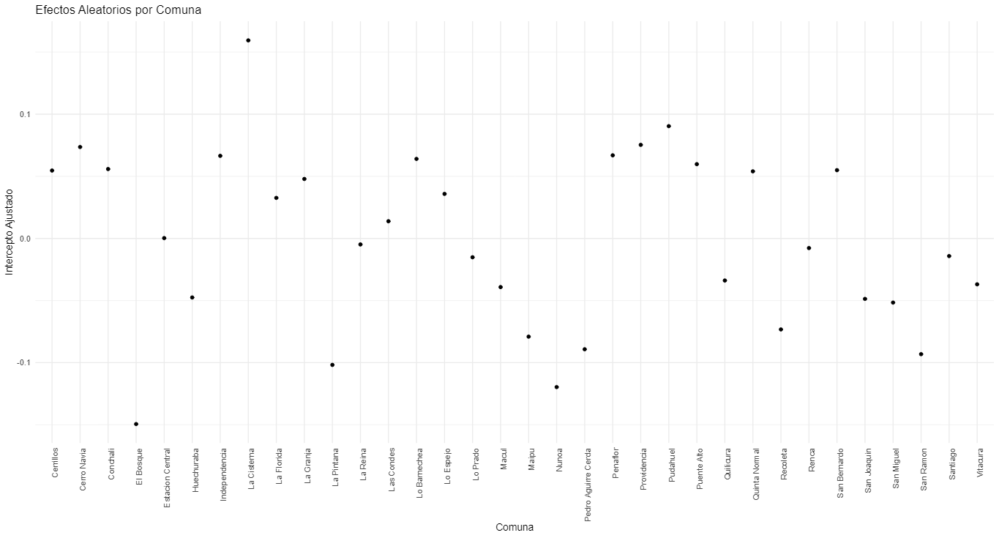

##### Interpretación Efectos Aleatorios por Comuna:


El gráfico y los datos reflejan los efectos aleatorios del intercepto por comuna en el modelo ajustado. Estos efectos representan la variación de la probabilidad de transición moderada (estado 2->2) atribuible a las diferencias específicas de cada comuna, después de controlar por las variables incluidas en el modelo.

1. Desviación del Intercepto
    - El valor de cada efecto aleatorio indica cuánto se desvía la comuna de la probabilidad promedio predicha por el modelo:
    - Valores negativos: Las comunas tienen una probabilidad de transición menor a la promedio.
    - Valores positivos: Las comunas tienen una probabilidad de transición mayor a la promedio.
2. Comunas con Mayores Valores Positivos
    - Estas comunas están asociadas a una mayor probabilidad de mantener el estado moderado (2->2) en comparación con el promedio:

        - El Bosque (0.1802): Tiene el efecto positivo más alto, indicando que esta comuna presenta una tendencia destacada a mantener el estado moderado.
        - San Ramón (0.1088): También tiene un efecto positivo significativo, lo que sugiere características locales que favorecen la estabilidad del estado.
        - Ñuñoa (0.1084): Refleja un comportamiento similar, aunque con menor magnitud.
        - Recoleta (0.1014): Sobresale como otra comuna con una probabilidad mayor al promedio.
3. Comunas con Mayores Valores Negativos
    - Estas comunas están asociadas con una probabilidad más baja de mantener el estado moderado:
        - La Cisterna (-0.1482): Es la comuna con el menor efecto aleatorio, lo que indica que tiene una tendencia considerablemente menor a mantener el estado moderado.
        - Cerrillos (-0.0985): También muestra una probabilidad de transición inferior al promedio.
        - Pudahuel (-0.0912) y Cerro Navia (-0.0922): Comparten características que las colocan por debajo del promedio.
4. Comunas Cercanas al Promedio
    - Comunas como Las Condes (-0.0039), Santiago (-0.0045), y Quinta Normal (-0.0111) tienen efectos aleatorios cercanos a 0, lo que indica que su probabilidad de transición es similar al promedio general.
5. Posibles Implicancias
    - Características de las Comunas: Los efectos aleatorios podrían reflejar diferencias en variables no incluidas en el modelo, como acceso a servicios, densidad poblacional, políticas locales o condiciones sociales particulares.
    - Heterogeneidad Espacial: La variabilidad entre comunas evidencia que las condiciones locales tienen un impacto significativo en la probabilidad de transición, lo cual puede guiar intervenciones focalizadas.
    - Prioridades de Política Pública: Comunas con efectos negativos significativos podrían requerir mayor atención para identificar y mitigar barreras que dificultan la estabilidad del estado moderado.


#### Efectos Aleatorios por Días:

In [73]:
from rpy2.robjects import pandas2ri, r
from IPython.display import display
import pandas as pd

# Activar soporte de pandas en rpy2
pandas2ri.activate()

# Transferir el DataFrame de Python a R
r_data = pandas2ri.py2rpy(datos_transicion_2_2)
r.assign("datos_transicion_2_2", r_data)

# Código en R para ajustar el modelo, generar la tabla y el gráfico
r('''
library(lme4)
library(ggplot2)
library(httpgd)

# Configurar un dispositivo gráfico
options(bitmapType = "cairo")

# Iniciar el servidor httpgd
hgd()

# Ajustar el modelo GLMM
modelo_D_2_2 <- lmer(Probabilidad_Transición ~ IM_interno + IM_externo + Personas_hogar_promedio + por_educ_sup + indic_precariedad_vivienda + total_hog_hacinados + inmigrantes + inc_pc_comuna + (1|Comuna) + (1|Día_original), data = datos_transicion_2_2)

# Extraer efectos aleatorios por día
ranef_data <- ranef(modelo_D_2_2, condVar = TRUE)

# Convertir los efectos aleatorios de Día_original en un DataFrame
dia_effects <- as.data.frame(ranef_data$Día_original)
dia_effects$Día_original <- as.numeric(rownames(dia_effects))

# Calcular la fecha real a partir del día original
start_date <- as.Date("2020-03-30")
dia_effects$Fecha <- start_date + (dia_effects$Día_original - 1)

# Determinar días de semana o fin de semana
dias_semana <- c("Monday", "Tuesday", "Wednesday", "Thursday", "Friday")
dia_effects$Tipo_dia <- ifelse(weekdays(dia_effects$Fecha) %in% dias_semana, "Día de semana", "Fin de semana")

# Lista de días festivos a colorear como "Fin de semana"
festivos <- as.Date(c(
    "2020-04-10",  # Viernes Santo
    "2020-05-01",  # Día Nacional del Trabajo
    "2020-05-21",  # Glorias Navales
    "2020-06-29",  # San Pedro y San Pablo
    "2020-07-16",  # Virgen del Carmen
    "2020-09-18",  # Independencia Nacional
    "2020-10-12"   # Encuentro de Dos Mundos
))

# Clasificar festivos como "Fin de semana"
dia_effects$Tipo_dia <- ifelse(dia_effects$Fecha %in% festivos, "Fin de semana", dia_effects$Tipo_dia)

# Crear gráfico para efectos aleatorios por fecha con puntos coloreados por tipo de día
dia_plot <- ggplot(dia_effects, aes(x = Fecha, y = `(Intercept)`, color = Tipo_dia)) +
    geom_point(size = 2) +
    scale_color_manual(values = c("Día de semana" = "blue", "Fin de semana" = "red")) +
    labs(title = "Efectos Aleatorios por Fecha", x = "Fecha", y = "Intercepto Ajustado", color = "Tipo de Día") +
    theme_minimal() +
    theme(axis.text.x = element_text(angle = 45, hjust = 1))

# Renderizar el gráfico en httpgd
print(dia_plot)

# Guardar la tabla actualizada en un archivo CSV
write.csv(dia_effects, file = "dia_effects_table.csv", row.names = FALSE)
''')

# Leer la tabla generada en R
dia_effects_table = pd.read_csv("dia_effects_table.csv")

# Configurar pandas para mostrar todas las filas
pd.set_option('display.max_rows', None)

# Mostrar la tabla actualizada con fechas y tipos de día
#display(dia_effects_table)


httpgd server running at:
  http://127.0.0.1:63841/live?token=FQIKFO0k


R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: Some predictor variables are on very different scales: consider rescaling 

R[write to console]: 2: Some predictor variables are on very different scales: consider rescaling 



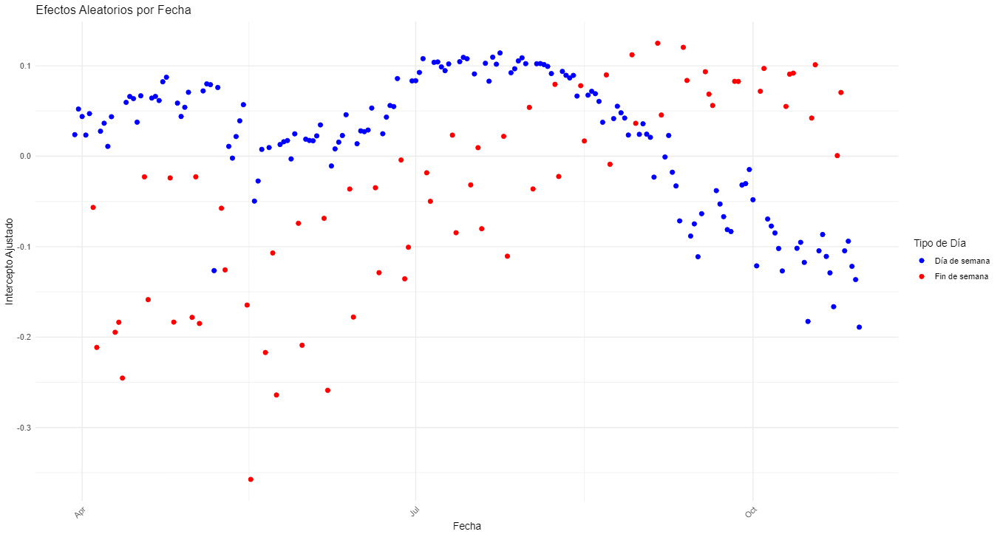

##### Interpretación Efectos Aleatorios por Días:


1. Patrones generales:
    - Los días de semana (en azul) presentan valores de intercepto ajustado mayormente positivos o cercanos a cero, indicando estabilidad en el modelo durante estos días.
    - Los fines de semana y días festivos (en rojo) muestran valores más dispersos, con una tendencia hacia valores negativos en varios casos. Esto podría indicar que estos días tienen características diferentes que influyen en la probabilidad del fenómeno modelado.
2. Oscilación temporal:
    - Hay una oscilación en los efectos aleatorios a lo largo del tiempo. En ciertos períodos (como entre abril y julio), los días de semana tienen valores de intercepto ajustado consistentemente más altos, lo que podría reflejar variaciones estacionales o cambios en las características del modelo.
    - Hacia septiembre y octubre, hay una tendencia descendente tanto en días de semana como en fines de semana, lo que podría asociarse a efectos temporales o eventos específicos en ese período.
3. Días festivos destacados:
    - Algunos días festivos, como el 10 de abril (Viernes Santo), muestran efectos aleatorios negativos significativos, lo que indica un comportamiento diferente en comparación con los días de semana regulares.
    - Otros festivos (como el 18 de septiembre) tienen efectos menos negativos o incluso positivos, sugiriendo que la influencia de un día festivo varía según las características del contexto.
4. Interpretación de los datos:
    - Días de semana:
        - Los días de semana tienen efectos aleatorios más consistentes y valores generalmente positivos, reflejando menor variabilidad en el comportamiento modelado.
        - Ejemplo: El 30 de marzo (primer día analizado) tiene un valor ajustado de 0.0238, mientras que otros días cercanos tienen valores similares, indicando estabilidad en la dinámica diaria.
    - Fines de semana y festivos:
        - Los fines de semana tienen una mayor dispersión en los efectos aleatorios, lo que sugiere que estos días tienen dinámicas más complejas o menos predecibles.
        - Ejemplo: El 5 de abril tiene un valor ajustado de -0.2114, mostrando un comportamiento significativamente diferente del promedio.
    - Cambios estacionales:
        - Los días de semana presentan una tendencia ascendente hasta julio, seguida por una disminución hacia octubre. Esto podría estar relacionado con factores estacionales, cambios en las variables del modelo, o eventos externos que afectan los datos subyacentes.

- Conclusión:
    - Días de semana: Tienen efectos ajustados más predecibles, con valores cercanos a cero o positivos, lo que sugiere que estos días siguen una tendencia más estable.
    - Fines de semana y festivos: Presentan mayor variabilidad y efectos más negativos en general, indicando comportamientos particulares que deben considerarse en el análisis.
    - Patrones temporales: Las oscilaciones en el intercepto ajustado sugieren la presencia de factores temporales que influyen en el fenómeno modelado y que podrían requerir un análisis adicional para identificar causas específicas.
    - Este análisis resalta la importancia de considerar las diferencias entre días regulares y especiales (fines de semana o festivos) en el modelo y cómo los factores temporales pueden influir en los resultados.

### Análisis de Residuales en el tiempo:

In [74]:
from rpy2.robjects import pandas2ri, r
from IPython.display import display
import pandas as pd

# Activar soporte de pandas en rpy2
pandas2ri.activate()

# Transferir el DataFrame de Python a R
r_data = pandas2ri.py2rpy(datos_transicion_2_2)
r.assign("datos_transicion_2_2", r_data)

# Código en R para calcular los residuales y generar la tabla
r('''
# Crear DataFrame con residuales, Fecha y Comuna
start_date <- as.Date("2020-03-30")
residuals_data <- data.frame(
    Fecha = as.Date(start_date + (datos_transicion_2_2$Día_original - 1)),
    Residual = residuals(modelo_D_2_2),
    Comuna = datos_transicion_2_2$Comuna,
    Día = datos_transicion_2_2$Día_original
)

# Guardar la tabla como archivo CSV
write.csv(residuals_data, file = "residuals_table_2_2_D.csv", row.names = FALSE)
''')

# Leer la tabla generada en R
residuals_table = pd.read_csv("residuals_table_2_2_D.csv")

# Configurar pandas para mostrar todas las filas (opcional)
pd.set_option('display.max_rows', None)

# Mostrar la tabla en Jupyter Notebook
#display(residuals_table)

In [75]:
r('''
# Crear un DataFrame con los residuales, la columna Fecha y la columna Comuna
residuals_data <- data.frame(
    Fecha = as.Date(start_date + (datos_transicion_2_2$Día_original - 1)),
    Residuals = residuals(modelo_D_2_2),
    Comuna = datos_transicion_2_2$Comuna
)

# Crear gráfico de residuales con Fecha en el eje x y colorear por Comuna
residuals_plot <- ggplot(residuals_data, aes(x = Fecha, y = Residuals, color = Comuna)) +
    geom_point() +
    labs(title = "Análisis de Residuales", x = "Fecha", y = "Residuales") +
    theme_minimal() +
    theme(axis.text.x = element_text(angle = 45, hjust = 1))  # Rotar etiquetas en el eje x

# Renderizar el gráfico en httpgd
print(residuals_plot)
''')


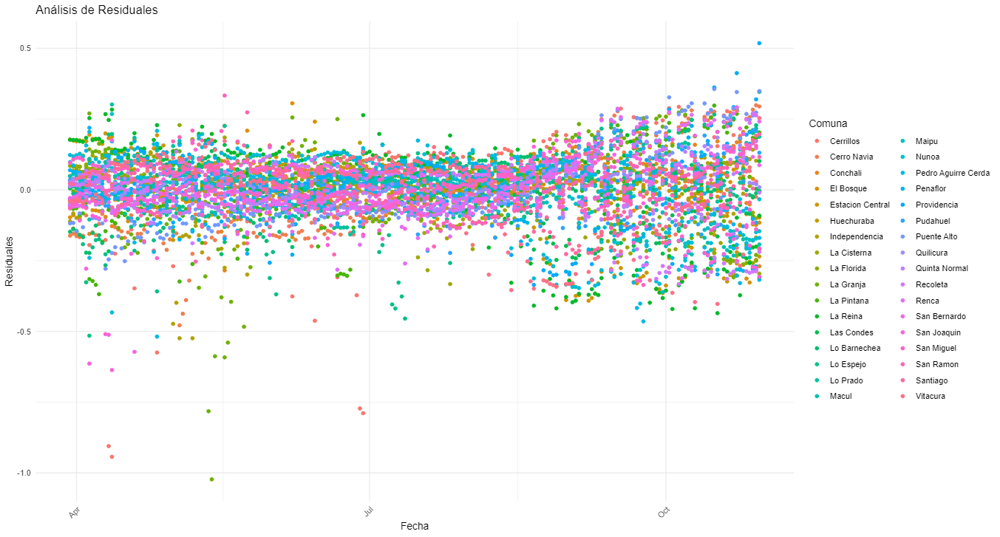

In [99]:
import pandas as pd

import pandas as pd

# Leer la tabla de residuales
residuals_table = pd.read_csv("residuals_table_2_2_D.csv")

# Calcular el rango de residuales por comuna
residual_stats = residuals_table.groupby('Comuna').agg(
    Residual_Minimo=('Residual', 'min'),
    Residual_Maximo=('Residual', 'max'),
    Desviacion_Estandar=('Residual', 'std')
).reset_index()

# Crear la columna de rango de residuales con formato "mínimo a máximo"
residual_stats['Rango de Residuales'] = residual_stats['Residual_Minimo'].round(6).astype(str) + " a " + residual_stats['Residual_Maximo'].round(6).astype(str)

# Seleccionar las 3 comunas con los residuales más negativos
negativos = residual_stats.nsmallest(3, 'Residual_Minimo')

# Seleccionar las 3 comunas con los residuales más positivos
positivos = residual_stats.nlargest(3, 'Residual_Maximo')

# Combinar los resultados en una única tabla
extremos = pd.concat([negativos, positivos])

# Seleccionar columnas relevantes para el resultado final
extremos = extremos[['Comuna', 'Rango de Residuales', 'Desviacion_Estandar']]

# Guardar la tabla en un archivo CSV
extremos.to_csv("tabla_extremos_residuales.csv", index=False)

# Mostrar la tabla
print(extremos)



         Comuna   Rango de Residuales  Desviacion_Estandar
9     La Granja  -1.022753 a 0.281248             0.180744
0     Cerrillos  -0.942997 a 0.292946             0.179447
29  San Joaquin  -0.636481 a 0.216377             0.140758
21  Providencia  -0.335857 a 0.517861             0.137268
23  Puente Alto  -0.278803 a 0.356178             0.138478
14    Lo Espejo  -0.515391 a 0.345858             0.146997


#### Interpretación de Efectos Aleatorios y análisis de Residuales del modelo D en la Transición 2->2 (Mantención Moderado) 
- Efectos Aleatorios por Comuna:
    - Interpretación General:
        - Los efectos aleatorios por comuna muestran las desviaciones específicas del intercepto de cada comuna respecto al promedio general.
        - Estas desviaciones reflejan características intrínsecas de las comunas que no están explicadas por las variables fijas del modelo.
    - Comunidades con efectos positivos significativos:
        - Comunas como La Cisterna (0.1594), Pudahuel (0.0904) y Providencia (0.0753) tienen interceptos positivos elevados. Esto podría indicar que estas comunas tienen una mayor probabilidad base de mantenerse en un estado moderado.
    - Comunidades con efectos negativos significativos:
        - Comunas como El Bosque (-0.1494), San Ramón (-0.0931) y Ñuñoa (-0.1196) presentan interceptos negativos. Estas comunas pueden tener factores que reducen su probabilidad base de mantenerse en moderado.
    - Posibles implicancias:
        - Estas variaciones podrían ser influenciadas por factores no modelados directamente, como diferencias en políticas locales, acceso a recursos o dinámicas comunitarias específicas.
- Efectos Aleatorios por Día
    - Interpretación General:
        - Los efectos por día reflejan cómo la probabilidad de mantenerse en moderado varía a lo largo del tiempo y según el tipo de día (día de semana o fin de semana).
        - Días de semana tienden a mostrar interceptos positivos, mientras que los fines de semana presentan caídas significativas.
    - Fines de semana:
        - Ejemplo: 5 de abril (sábado) y 6 de abril (domingo) tienen valores negativos importantes (-0.2114 y -0.1947 respectivamente). Esto sugiere que los fines de semana tienen una menor probabilidad de mantener el estado moderado, posiblemente por cambios en patrones de movilidad o conductas sociales.
    - Tendencias temporales:
        - Se observa un comportamiento cíclico, con incrementos en días laborales y descensos durante fines de semana. Este patrón sugiere un efecto temporal que podría estar relacionado con las dinámicas de interacción y movilidad.
- Análisis de Residuales en el Tiempo
    - Interpretación General:
        - Los residuales analizados por tiempo permiten evaluar la adecuación del modelo y detectar posibles patrones no explicados por las variables.
        - En este caso, los residuales parecen distribuirse de manera homogénea, lo que indica que el modelo captura adecuadamente las principales fuentes de variabilidad.
    - Outliers:
        - Puntos residuales extremos en ciertas fechas podrían indicar eventos no modelados, como festividades, condiciones climáticas atípicas o políticas específicas implementadas en ciertos días.
    - Tendencia General:
        - La dispersión de los residuales es mayor en períodos cercanos a eventos importantes o cambios estacionales, lo cual podría requerir análisis adicionales o inclusión de variables relevantes para mejorar el ajuste del modelo.


## **Transición 2->3:  Transición de Moderado a Severo**

In [152]:
# Filtrar los datos para la transición 'Trans_2->1'
transicion_especifica_2_3 = 'Trans_2->3'
datos_transicion_2_3 = glmm_data[glmm_data['Transición'] == transicion_especifica_2_3]

# Asegurarse de que la columna 'Comuna' sea categórica
datos_transicion_2_3['Comuna'] = datos_transicion_2_3['Comuna'].astype('category')

# Inspeccionar los datos
print(f"Número de observaciones para {transicion_especifica_2_3}: {len(datos_transicion_2_3)}")
print(datos_transicion_2_3.head())

Número de observaciones para Trans_2->3: 7310
          Comuna  Día_original  Día_correlativo  Transición  \
36550  Cerrillos             1                0  Trans_2->3   
36551  Cerrillos             2                1  Trans_2->3   
36552  Cerrillos             3                2  Trans_2->3   
36553  Cerrillos             4                3  Trans_2->3   
36554  Cerrillos             5                4  Trans_2->3   

       Probabilidad_Transición  dias  IM_interno  IM_externo  \
36550             1.158392e-07     1    1.918137    7.524704   
36551             5.421520e-07     2    1.970381    7.804008   
36552             7.804615e-08     3    1.845790    7.471452   
36553             2.883957e-09     4    1.678598    6.891732   
36554             5.448050e-06     5    1.736766    8.317872   

       TasaCasosAcumulados  Casos_Diarios_Brutos  Casos_Diarios_Brutos_MM7  \
36550             0.000000              0.000000                  0.000000   
36551             2.248303        

C:\Users\ferna\AppData\Local\Temp\ipykernel_38828\3938149271.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos_transicion_2_3['Comuna'] = datos_transicion_2_3['Comuna'].astype('category')


In [153]:
from rpy2.robjects import pandas2ri, r

# Activar soporte de pandas en rpy2
pandas2ri.activate()

# Transferir el DataFrame de Python a R
r_data = pandas2ri.py2rpy(datos_transicion_2_3)
r.assign("datos_transicion_2_3", r_data)

Comuna,Día_original,Día_correlativo,...,indic_precariedad_vivienda,por_educ_sup,IPS_2020
Cerri...,1,0,...,...,...,...
Cerri...,2,1,,,,
Cerri...,3,2,,,,
Cerri...,4,3,,,,
...,...,...,,,,
Vitac...,212,7306,,,,
Vitac...,213,7307,,,,
Vitac...,214,7308,,,,
Vitac...,215,7309,,,,


## Transición 2->3: Transición Moderado a Severo
### Modelo A
Fórmula Modelo A: "Probabilidad_Transición ~ (1|Comuna)"

In [154]:
r('''
library(lme4)
library(ggplot2)
library(httpgd)

# Iniciar el servidor httpgd
hgd()


# Ajustar el modelo GLMM
modelo_A_2_3 <- lmer(Probabilidad_Transición ~ (1|Comuna), data = datos_transicion_2_3)

# Capturar y mostrar el resumen del modelo
summary_text <- capture.output(summary(modelo_A_2_3))
writeLines(summary_text)
''')

httpgd server running at:
  http://127.0.0.1:50323/live?token=95szA4Rq
Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: Probabilidad_Transición ~ (1 | Comuna)
   Data: datos_transicion_2_3

REML criterion at convergence: 5974.1

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-1.2834 -0.6872 -0.4568  0.3618  2.3726 

Random effects:
 Groups   Name        Variance Std.Dev.
 Comuna   (Intercept) 0.00823  0.09072 
 Residual             0.13084  0.36171 
Number of obs: 7310, groups:  Comuna, 34

Fixed effects:
            Estimate Std. Error       df t value Pr(>|t|)    
(Intercept)  0.23566    0.01612 33.00000   14.62  5.7e-16 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1


## Transición 2->3: Transición Moderado a Severo
### Modelo B
Fórmula Modelo B: "Probabilidad_Transición ~ (1|Comuna) + (1|Día_original)"

In [155]:
r('''
library(lme4)
library(ggplot2)
library(httpgd)

# Iniciar el servidor httpgd
hgd()

# Ajustar el modelo GLMM
modelo_B_2_3 <- lmer(Probabilidad_Transición ~ (1|Comuna) + (1|Día_original), data = datos_transicion_2_3)

# Capturar y mostrar el resumen del modelo
summary_text <- capture.output(summary(modelo_B_2_3))
writeLines(summary_text)
''')

httpgd server running at:
  http://127.0.0.1:50324/live?token=p45f1giH
Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: Probabilidad_Transición ~ (1 | Comuna) + (1 | Día_original)
   Data: datos_transicion_2_3

REML criterion at convergence: 3798.5

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-2.9075 -0.5247 -0.2069  0.4508  3.0218 

Random effects:
 Groups       Name        Variance Std.Dev.
 Día_original (Intercept) 0.041543 0.20382 
 Comuna       (Intercept) 0.008424 0.09178 
 Residual                 0.089293 0.29882 
Number of obs: 7310, groups:  Día_original, 215; Comuna, 34

Fixed effects:
            Estimate Std. Error       df t value Pr(>|t|)    
(Intercept)  0.23566    0.02129 91.47553   11.07   <2e-16 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1


##  Transición 2->3: Transición Moderado a Severo
### Modelo C
Fórmula Modelo C: "Probabilidad_Transición ~ (1|Comuna) + (1|Día_original) + IM_externo + IM_interno"

In [156]:
r('''
library(lme4)
library(ggplot2)
library(httpgd)

# Iniciar el servidor httpgd
hgd()

# Escalar las variables
datos_transicion_2_3$IM_interno <- scale(datos_transicion_2_3$IM_interno)
datos_transicion_2_3$IM_externo <- scale(datos_transicion_2_3$IM_externo)


# Ajustar el modelo GLMM
modelo_C_2_3 <- lmer(Probabilidad_Transición ~ (1|Comuna) + (1|Día_original) + IM_interno + IM_externo, data = datos_transicion_2_3)

# Capturar y mostrar el resumen del modelo
summary_text <- capture.output(summary(modelo_C_2_3))
writeLines(summary_text)
''')

httpgd server running at:
  http://127.0.0.1:50325/live?token=SPLy4btD
Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: Probabilidad_Transición ~ (1 | Comuna) + (1 | Día_original) +  
    IM_interno + IM_externo
   Data: datos_transicion_2_3

REML criterion at convergence: 2439

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-2.9254 -0.5566 -0.1297  0.4719  3.6277 

Random effects:
 Groups       Name        Variance Std.Dev.
 Día_original (Intercept) 0.06711  0.2591  
 Comuna       (Intercept) 0.20568  0.4535  
 Residual                 0.07147  0.2673  
Number of obs: 7310, groups:  Día_original, 215; Comuna, 34

Fixed effects:
              Estimate Std. Error         df t value Pr(>|t|)    
(Intercept)    0.23566    0.07982   34.68883   2.952  0.00563 ** 
IM_interno    -0.44212    0.01091 6617.55291 -40.535  < 2e-16 ***
IM_externo     0.16309    0.01144 5976.28974  14.255  < 2e-16 ***
---
Signif. codes:  0 '***' 0.001 '**' 0

## Transición 2->3: Transición Moderado a Severo 
### Modelo D
Fórmula Modelo D: "Probabilidad_Transición ~ IM_interno + IM_externo + Personas_hogar_promedio + por_educ_sup + indic_precariedad_vivienda + total_hog_hacinados + inmigrantes + inc_pc_comuna + (1|Comuna) + (1|Día_original)"

In [157]:
r('''
library(lme4)
library(ggplot2)
library(httpgd)

# Iniciar el servidor httpgd
hgd()

# Escalar las variables
datos_transicion_2_3$IM_interno <- scale(datos_transicion_2_3$IM_interno)
datos_transicion_2_3$IM_externo <- scale(datos_transicion_2_3$IM_externo)
datos_transicion_2_3$Personas_hogar_promedio <- scale(datos_transicion_2_3$Personas_hogar_promedio)
datos_transicion_2_3$por_educ_sup <- scale(datos_transicion_2_3$por_educ_sup)
datos_transicion_2_3$indic_precariedad_vivienda <- scale(datos_transicion_2_3$indic_precariedad_vivienda)
datos_transicion_2_3$total_hog_hacinados <- scale(datos_transicion_2_3$total_hog_hacinados)
datos_transicion_2_3$inmigrantes <- scale(datos_transicion_2_3$inmigrantes)
datos_transicion_2_3$inc_pc_comuna <- scale(datos_transicion_2_3$inc_pc_comuna)

# Ajustar el modelo GLMM
modelo_D_2_3 <- lmer(Probabilidad_Transición ~ IM_interno + IM_externo + Personas_hogar_promedio + por_educ_sup + indic_precariedad_vivienda + total_hog_hacinados + inmigrantes + inc_pc_comuna + (1|Comuna) + (1|Día_original), data = datos_transicion_2_3)

# Capturar y mostrar el resumen del modelo
summary_text <- capture.output(summary(modelo_D_2_3))
writeLines(summary_text)
''')


httpgd server running at:
  http://127.0.0.1:50326/live?token=4yc9yjlp
Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: 
Probabilidad_Transición ~ IM_interno + IM_externo + Personas_hogar_promedio +  
    por_educ_sup + indic_precariedad_vivienda + total_hog_hacinados +  
    inmigrantes + inc_pc_comuna + (1 | Comuna) + (1 | Día_original)
   Data: datos_transicion_2_3

REML criterion at convergence: 2400.4

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-2.9228 -0.5584 -0.1293  0.4698  3.6210 

Random effects:
 Groups       Name        Variance Std.Dev.
 Día_original (Intercept) 0.06760  0.2600  
 Comuna       (Intercept) 0.03507  0.1873  
 Residual                 0.07145  0.2673  
Number of obs: 7310, groups:  Día_original, 215; Comuna, 34

Fixed effects:
                             Estimate Std. Error         df t value Pr(>|t|)
(Intercept)                   0.23566    0.03682   43.86796   6.400 8.81e-08
IM_interno         

#### Comparación de los modelos A, B, C y D para la transición 2->3: Transición Moderado a Severo

- Criterio REML
    - El criterio REML (Restricted Maximum Likelihood) evalúa el ajuste de los modelos. Valores más bajos indican un mejor ajuste.
        - Modelo A: 5974.1
        - Modelo B: 3798.5
        - Modelo C: 2439.0
        - Modelo D: 2400.4
        - El Modelo D tiene el criterio REML más bajo, indicando que proporciona el mejor ajuste a los datos, seguido de cerca por el Modelo C.
    - Efectos Aleatorios
        - Los efectos aleatorios capturan la variabilidad no explicada por las variables fijas.
        - Modelo A: Solo incluye efectos aleatorios por comuna. La desviación estándar para las comunas es 0.0907, lo que refleja variabilidad espacial significativa.
        - Modelo B: Añade efectos aleatorios por día, con desviaciones estándar de 0.0918 (comunas) y 0.2038 (días), mejorando el ajuste al capturar la variabilidad temporal.
        - Modelo C: Refina los efectos aleatorios, con desviaciones estándar de 0.4535 (comunas) y 0.2591 (días), mostrando que las variables adicionales capturan mejor la variabilidad espacial y temporal.
        - Modelo D: Los efectos aleatorios por comuna disminuyen significativamente (0.1873), indicando que las variables predictoras explican mejor las diferencias entre comunas, mientras que los efectos por día se mantienen consistentes (0.2600).
        - El Modelo D reduce la variabilidad aleatoria al incluir factores explicativos adicionales.
- Efectos Fijos
    - Los efectos fijos representan el impacto de las variables independientes.
        - Modelo A: Solo incluye un intercepto, estimado en 0.2357, que representa la probabilidad base de transición.
        - Modelo B: La inclusión de efectos aleatorios por día no afecta el intercepto (0.2357).
        - Modelo C:
            - IM_interno: -0.4421, impacto negativo muy significativo, indicando que un mayor índice interno reduce la probabilidad de transición.
            - IM_externo: 0.1631, impacto positivo significativo, sugiriendo que un mayor índice externo aumenta la probabilidad de transición.
        - Modelo D:
            - IM_interno: -0.4453, impacto negativo significativo.
            - IM_externo: 0.1633, impacto positivo significativo.
            - Personas_hogar_promedio: 0.2962, impacto positivo significativo, sugiriendo que un mayor tamaño del hogar está relacionado con una mayor probabilidad de transición.
            - Porcentaje con educación superior: 0.3571, impacto positivo significativo, indicando que niveles educativos más altos se asocian con una mayor probabilidad de transición.
            - Indicador de precariedad de vivienda: -0.0964, impacto negativo no significativo, aunque cercano al umbral de significancia.
            - Total de hogares hacinados: 0.1245, impacto positivo significativo.
            - Inmigrantes: 0.1575, impacto positivo significativo.
            - Ingreso per cápita de la comuna: 0.1246, impacto positivo no significativo.
        - El Modelo D resalta relaciones complejas entre variables socioeconómicas y la probabilidad de transición.
- Residuales
    - La desviación estándar de los residuales refleja la variabilidad no explicada por los modelos.
        - Modelo A: 0.3617
        - Modelo B: 0.2988
        - Modelo C: 0.2673
        - Modelo D: 0.2673
    - Los Modelos C y D reducen la variación residual al incluir variables clave y capturar mejor las relaciones subyacentes.
- Conclusión
    - Modelo A: Simple y útil para análisis básicos, pero no captura la variabilidad temporal ni el impacto de factores clave.
    - Modelo B: Mejora significativa al incluir variaciones por día, pero carece de predictores adicionales.
    - Modelo C: Añade indicadores internos y externos, mejorando notablemente el ajuste.
    - Modelo D: El modelo más completo y con mejor ajuste. Explica tanto la variabilidad espacial (comunas) como la temporal (días) e identifica relaciones significativas entre factores socioeconómicos y la probabilidad de transición.
    - **El Modelo D es el mejor modelo, ya que combina un ajuste sólido con la identificación de predictores clave que explican la transición de Moderado a Severo.**

### Efectos Aleatorios del modelo D:
#### Efecto Aleatorio por Comuna:

In [158]:
r('''
library(lme4)
library(ggplot2)
library(httpgd)

# Configurar un dispositivo gráfico antes de guardar el gráfico
options(bitmapType = "cairo")

# Iniciar el servidor httpgd
hgd()

# Visualización: Variabilidad entre días y comunas
# Extraer efectos aleatorios
ranef_data <- ranef(modelo_D_2_3, condVar = TRUE)

# Convertir los efectos aleatorios de Comuna en un DataFrame
comuna_effects <- as.data.frame(ranef_data$Comuna)
print(comuna_effects)

# Crear gráfico para efectos aleatorios por comuna
comuna_plot <- ggplot(comuna_effects, aes(x = rownames(comuna_effects), y = `(Intercept)`)) +
    geom_point() +
    labs(title = "Efectos Aleatorios por Comuna", x = "Comuna", y = "Intercepto Ajustado") +
    theme_minimal() +
    theme(axis.text.x = element_text(angle = 90, hjust = 1))  # Rotar etiquetas en el eje x


# Validación del Modelo: Análisis de residuales
plot(residuals(modelo_D_2_3), main = "Análisis de Residuales")

# Renderizar el gráfico en httpgd
print(comuna_plot)
''')

httpgd server running at:
  http://127.0.0.1:50332/live?token=VRLFRcTJ
                     (Intercept)
Cerrillos           -0.268274435
Cerro Navia         -0.175867371
Conchali             0.195157539
El Bosque           -0.038970302
Estacion Central     0.165134857
Huechuraba           0.116548702
Independencia        0.250125990
La Cisterna          0.173830799
La Florida           0.026097219
La Granja           -0.065966258
La Pintana          -0.128368866
La Reina            -0.172923536
Las Condes           0.250478357
Lo Barnechea         0.095137744
Lo Espejo           -0.157230680
Lo Prado            -0.077363449
Macul                0.135586269
Maipu                0.002836856
Nunoa               -0.233478189
Pedro Aguirre Cerda -0.243106466
Penaflor             0.194634121
Providencia          0.007604910
Pudahuel             0.016831377
Puente Alto         -0.123917771
Quilicura            0.121111620
Quinta Normal        0.273070738
Recoleta             0.248973447
Renca

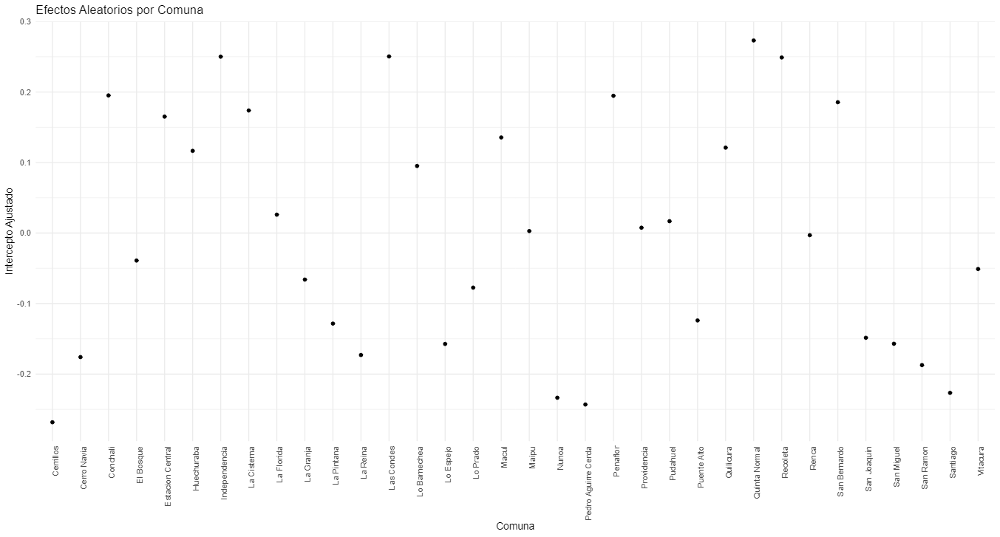

#### Interpretación del Efecto Aleatorio por Comuna:
El análisis de efectos aleatorios por comuna muestra las variaciones en el intercepto ajustado (probabilidad base de transición) para cada comuna, indicando cómo cada una se desvía de la media general del modelo.


- Interpretación del Intercepto Ajustado:
    - Un intercepto positivo indica que la comuna tiene una probabilidad base de transición mayor al promedio general del modelo.
    - Un intercepto negativo indica que la comuna tiene una probabilidad base de transición menor al promedio general.
- Distribución de Comunas:

    - Comunas con los interceptos más positivos:
        - Quinta Normal (0.273), Recoleta (0.249), Las Condes (0.250), Independencia (0.250).
        - Estas comunas presentan una mayor probabilidad base de transición al estado severo (severo o peor) que el promedio.
    - Comunas con los interceptos más negativos:
        - Cerrillos (-0.268), Pedro Aguirre Cerda (-0.243), San Ramón (-0.187), Ñuñoa (-0.233), Santiago (-0.226).
        - Estas comunas tienen una menor probabilidad base de transición comparadas con el promedio.
- Variabilidad Geográfica:
    - Las diferencias entre comunas sugieren que existen factores estructurales o contextuales que influyen en la probabilidad de transición, como:
        - Densidad poblacional.
        - Movilidad interna y externa.
        - Condiciones socioeconómicas (por ejemplo, ingresos per cápita, hacinamiento, educación superior).
        - Por ejemplo, comunas como Quinta Normal y Recoleta, con alta urbanización y posibles vulnerabilidades socioeconómicas, tienen efectos positivos significativos.
- Efectos Neutrales:
    - Comunas como Maipú (0.0028) y Renca (-0.0029) tienen interceptos ajustados muy cercanos a cero, lo que sugiere que su probabilidad base de transición es similar al promedio general del modelo.

- Implicancias y Aplicaciones
    - Diseño de Políticas Públicas:

        - Comunas con interceptos más positivos podrían requerir mayor atención en intervenciones de salud pública, reducción de movilidad o políticas de apoyo socioeconómico.
        - Comunas con interceptos negativos podrían representar áreas donde las intervenciones actuales han sido efectivas o donde el riesgo base es más bajo.

    - Impacto del Contexto Local:

        - Comunas como Las Condes y Ñuñoa, aunque tienen niveles socioeconómicos elevados, presentan dinámicas opuestas, sugiriendo que otros factores como movilidad y densidad podrían ser determinantes.
    - Futuras Investigaciones:

        - Este análisis podría enriquecerse incorporando variables adicionales que capturen características contextuales específicas de cada comuna, como el acceso a servicios de salud, infraestructura o densidad habitacional.

El gráfico también destaca que la variabilidad entre comunas no es uniforme, subrayando la necesidad de enfoques específicos en el diseño de políticas basadas en las características únicas de cada comuna. Esto asegura que los recursos se destinen de manera eficiente para mitigar transiciones a estados más severos en las comunas más vulnerables.

#### Efectos Aleatorios por Días:


In [162]:
from rpy2.robjects import pandas2ri, r
from IPython.display import display
import pandas as pd

# Activar soporte de pandas en rpy2
pandas2ri.activate()

# Transferir el DataFrame de Python a R
r_data = pandas2ri.py2rpy(datos_transicion_2_3)
r.assign("datos_transicion_2_3", r_data)

# Código en R para ajustar el modelo, generar la tabla y el gráfico
r('''
library(lme4)
library(ggplot2)
library(httpgd)

# Configurar un dispositivo gráfico
options(bitmapType = "cairo")

# Iniciar el servidor httpgd
hgd()

# Ajustar el modelo GLMM
modelo_D_2_3 <- lmer(Probabilidad_Transición ~ IM_interno + IM_externo + Personas_hogar_promedio + por_educ_sup + indic_precariedad_vivienda + total_hog_hacinados + inmigrantes + inc_pc_comuna + (1|Comuna) + (1|Día_original), data = datos_transicion_2_3)

# Extraer efectos aleatorios por día
ranef_data <- ranef(modelo_D_2_3, condVar = TRUE)

# Convertir los efectos aleatorios de Día_original en un DataFrame
dia_effects <- as.data.frame(ranef_data$Día_original)
dia_effects$Día_original <- as.numeric(rownames(dia_effects))

# Calcular la fecha real a partir del día original
start_date <- as.Date("2020-03-30")
dia_effects$Fecha <- start_date + (dia_effects$Día_original - 1)

# Determinar días de semana o fin de semana
dias_semana <- c("Monday", "Tuesday", "Wednesday", "Thursday", "Friday")
dia_effects$Tipo_dia <- ifelse(weekdays(dia_effects$Fecha) %in% dias_semana, "Día de semana", "Fin de semana")

# Lista de días festivos a colorear como "Fin de semana"
festivos <- as.Date(c(
    "2020-04-10",  # Viernes Santo
    "2020-05-01",  # Día Nacional del Trabajo
    "2020-05-21",  # Glorias Navales
    "2020-06-29",  # San Pedro y San Pablo
    "2020-07-16",  # Virgen del Carmen
    "2020-09-18",  # Independencia Nacional
    "2020-10-12"   # Encuentro de Dos Mundos
))

# Clasificar festivos como "Fin de semana"
dia_effects$Tipo_dia <- ifelse(dia_effects$Fecha %in% festivos, "Fin de semana", dia_effects$Tipo_dia)

# Crear gráfico para efectos aleatorios por fecha con puntos coloreados por tipo de día
dia_plot <- ggplot(dia_effects, aes(x = Fecha, y = `(Intercept)`, color = Tipo_dia)) +
    geom_point(size = 2) +
    scale_color_manual(values = c("Día de semana" = "blue", "Fin de semana" = "red")) +
    labs(title = "Efectos Aleatorios por Fecha", x = "Fecha", y = "Intercepto Ajustado", color = "Tipo de Día") +
    theme_minimal() +
    theme(axis.text.x = element_text(angle = 45, hjust = 1))

# Renderizar el gráfico en httpgd
print(dia_plot)

# Guardar la tabla actualizada en un archivo CSV
write.csv(dia_effects, file = "dia_effects_table.csv", row.names = FALSE)
''')

# Leer la tabla generada en R
dia_effects_table = pd.read_csv("dia_effects_table.csv")

# Configurar pandas para mostrar todas las filas
pd.set_option('display.max_rows', None)

# Mostrar la tabla actualizada con fechas y tipos de día
#display(dia_effects_table)


httpgd server running at:
  http://127.0.0.1:50444/live?token=h2ZTol9r


R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: Some predictor variables are on very different scales: consider rescaling 

R[write to console]: 2: Some predictor variables are on very different scales: consider rescaling 



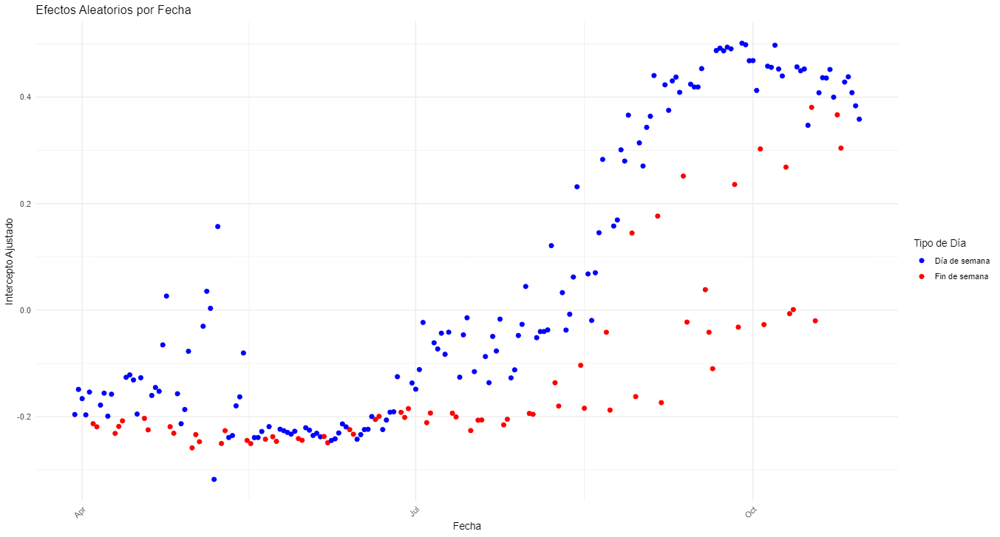

#### Interpretación Efectos Aleatorios por Días:


El gráfico muestra los efectos aleatorios por fecha diferenciados por tipo de día (días de semana y fines de semana). Este análisis proporciona información sobre cómo varía la probabilidad base de transición según la fecha y la naturaleza del día.

- Tendencia General:

    - Durante los primeros meses, los efectos aleatorios están mayoritariamente por debajo de cero, indicando una menor probabilidad base de transición.
    - A medida que avanza el tiempo (especialmente desde julio en adelante), se observa un aumento progresivo en los efectos aleatorios, alcanzando un pico en septiembre y manteniéndose elevados hacia octubre.
- Diferencias entre Días de Semana y Fines de Semana:

    - Días de Semana:
        - Presentan mayor variabilidad y tienden a tener valores de intercepto ajustado más altos en comparación con los fines de semana.
        - Esto sugiere que durante los días laborales hay factores que incrementan la probabilidad base de transición (e.g., mayor movilidad, interacción social o actividades económicas).
    - Fines de Semana:
        - Tienden a mantenerse con efectos aleatorios más bajos en comparación con los días de semana, lo que puede estar relacionado con la menor movilidad y actividad en estos días.
    - Picos y Cambios Relevantes:

        - A partir de mediados de agosto, los efectos aleatorios alcanzan valores positivos significativos en los días de semana, indicando un aumento en la probabilidad base de transición.
        - Durante septiembre, los valores permanecen consistentemente altos, lo que puede estar vinculado a factores como feriados o aumentos en la movilidad social, especialmente alrededor de las celebraciones del 18 de septiembre.
    - Disminución Final:

        - Hacia finales de octubre, se aprecia una ligera disminución en los efectos aleatorios, lo que podría indicar un retorno a condiciones más estables o un efecto de medidas correctivas implementadas durante los meses previos.
- Implicancias y Aplicaciones
    - Políticas de Control:
        - Las diferencias entre días de semana y fines de semana destacan la necesidad de diseñar políticas diferenciadas según el tipo de día, considerando el impacto de la movilidad y la interacción social.
    - Evolución Temporal:
        - La tendencia ascendente en los efectos aleatorios desde julio hasta septiembre puede estar relacionada con el levantamiento de restricciones o un cambio en las dinámicas sociales y económicas. Esto sugiere la importancia de monitorear eventos específicos (e.g., feriados, celebraciones) que puedan alterar significativamente las probabilidades de transición.
    - Análisis de Fines de Semana:

        - Aunque los fines de semana muestran menores probabilidades base de transición, no están exentos de riesgos, especialmente en fechas cercanas a feriados importantes, lo que requiere vigilancia específica.
- Conclusión
    - Este análisis resalta la importancia de incorporar la dimensión temporal y el tipo de día en los modelos predictivos y en las estrategias de intervención. Las diferencias entre días de semana y fines de semana, así como los cambios a lo largo del tiempo, reflejan dinámicas sociales complejas que deben ser consideradas para mitigar eficientemente las transiciones a estados más severos.

### Análisis de Residuales en el tiempo:

In [164]:
from rpy2.robjects import pandas2ri, r
from IPython.display import display
import pandas as pd

# Activar soporte de pandas en rpy2
pandas2ri.activate()

# Transferir el DataFrame de Python a R
r_data = pandas2ri.py2rpy(datos_transicion_1_2)
r.assign("datos_transicion_2_3", r_data)

# Código en R para calcular los residuales y generar la tabla
r('''
# Crear DataFrame con residuales, Fecha y Comuna
start_date <- as.Date("2020-03-30")
residuals_data <- data.frame(
    Fecha = as.Date(start_date + (datos_transicion_2_3$Día_original - 1)),
    Residual = residuals(modelo_D_2_3),
    Comuna = datos_transicion_2_3$Comuna,
    Día = datos_transicion_2_3$Día_original
)

# Guardar la tabla como archivo CSV
write.csv(residuals_data, file = "residuals_table_2_3_D.csv", row.names = FALSE)
''')

# Leer la tabla generada en R
residuals_table = pd.read_csv("residuals_table_2_3_D.csv")

# Configurar pandas para mostrar todas las filas (opcional)
pd.set_option('display.max_rows', None)

# Mostrar la tabla en Jupyter Notebook
#display(residuals_table)

In [165]:
r('''
# Crear un DataFrame con los residuales, la columna Fecha y la columna Comuna
residuals_data <- data.frame(
    Fecha = as.Date(start_date + (datos_transicion_2_3$Día_original - 1)),
    Residuals = residuals(modelo_D_2_3),
    Comuna = datos_transicion_2_3$Comuna
)

# Crear gráfico de residuales con Fecha en el eje x y colorear por Comuna
residuals_plot <- ggplot(residuals_data, aes(x = Fecha, y = Residuals, color = Comuna)) +
    geom_point() +
    labs(title = "Análisis de Residuales", x = "Fecha", y = "Residuales") +
    theme_minimal() +
    theme(axis.text.x = element_text(angle = 45, hjust = 1))  # Rotar etiquetas en el eje x

# Renderizar el gráfico en httpgd
print(residuals_plot)
''')


In [166]:
import pandas as pd

import pandas as pd

# Leer la tabla de residuales
residuals_table = pd.read_csv("residuals_table_2_3_D.csv")

# Calcular el rango de residuales por comuna
residual_stats = residuals_table.groupby('Comuna').agg(
    Residual_Minimo=('Residual', 'min'),
    Residual_Maximo=('Residual', 'max'),
    Desviacion_Estandar=('Residual', 'std')
).reset_index()

# Crear la columna de rango de residuales con formato "mínimo a máximo"
residual_stats['Rango de Residuales'] = residual_stats['Residual_Minimo'].round(6).astype(str) + " a " + residual_stats['Residual_Maximo'].round(6).astype(str)

# Seleccionar las 3 comunas con los residuales más negativos
negativos = residual_stats.nsmallest(3, 'Residual_Minimo')

# Seleccionar las 3 comunas con los residuales más positivos
positivos = residual_stats.nlargest(3, 'Residual_Maximo')

# Combinar los resultados en una única tabla
extremos = pd.concat([negativos, positivos])

# Seleccionar columnas relevantes para el resultado final
extremos = extremos[['Comuna', 'Rango de Residuales', 'Desviacion_Estandar']]

# Guardar la tabla en un archivo CSV
extremos.to_csv("tabla_extremos_residuales.csv", index=False)

# Mostrar la tabla
print(extremos)


              Comuna   Rango de Residuales  Desviacion_Estandar
2           Conchali   -0.78128 a 0.717597             0.258340
14         Lo Espejo  -0.704787 a 0.750605             0.210022
12        Las Condes  -0.692398 a 0.575597             0.444868
18             Nunoa  -0.538032 a 0.967922             0.333684
11          La Reina  -0.685747 a 0.909553             0.412478
4   Estacion Central   -0.674485 a 0.90093             0.438235


In [161]:
from rpy2.robjects import pandas2ri, r
from IPython.display import display
import pandas as pd

# Activar soporte de pandas en rpy2
pandas2ri.activate()

# Transferir el DataFrame de Python a R
r_data = pandas2ri.py2rpy(datos_transicion_2_3)
r.assign("datos_transicion_2_3", r_data)

# Código en R para calcular los residuales y generar la tabla
r('''
# Crear DataFrame con residuales, Fecha y Comuna
start_date <- as.Date("2020-03-30")
residuals_data <- data.frame(
    Fecha = as.Date(start_date + (datos_transicion_2_3$Día_original - 1)),
    Residual = residuals(modelo_D_2_3),
    Comuna = datos_transicion_2_3$Comuna,
    Día = datos_transicion_2_3$Día_original
)

# Guardar la tabla como archivo CSV
write.csv(residuals_data, file = "residuals_table_2_3_D.csv", row.names = FALSE)
''')

# Leer la tabla generada en R
residuals_table = pd.read_csv("residuals_table_2_3_D.csv")

# Configurar pandas para mostrar todas las filas (opcional)
pd.set_option('display.max_rows', None)

# Mostrar la tabla en Jupyter Notebook
#display(residuals_table)


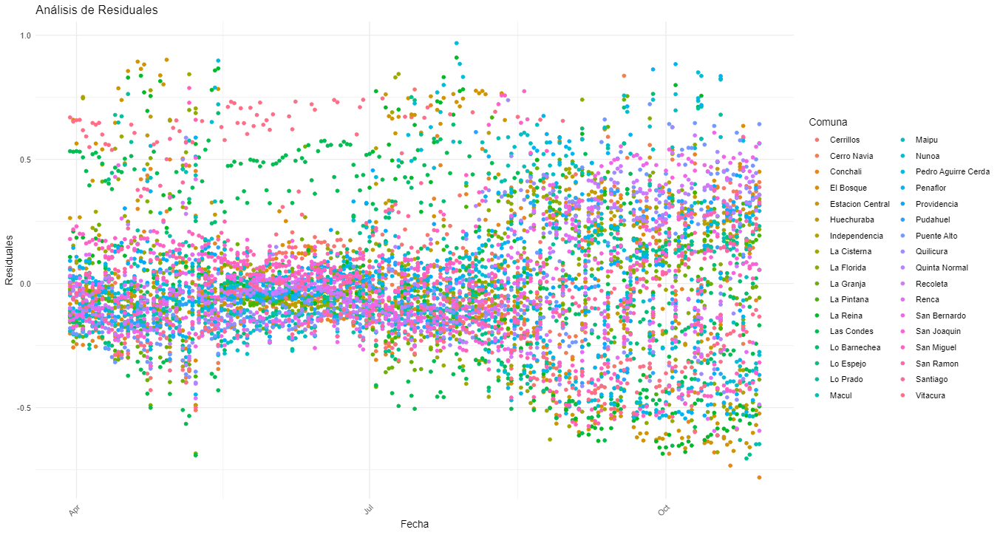

In [35]:
import pandas as pd

# Leer la tabla de residuales (asegúrate de tener el archivo CSV cargado)
residuals_table = pd.read_csv("residuals_table_2_3_D.csv")

# Calcular los percentiles para definir el intervalo de confianza
lower_bound = residuals_table['Residual'].quantile(0.025)  # Límite inferior (percentil 2.5%)
upper_bound = residuals_table['Residual'].quantile(0.975)  # Límite superior (percentil 97.5%)

# Filtrar residuales fuera del intervalo de confianza
outliers = residuals_table[(residuals_table['Residual'] < lower_bound) | (residuals_table['Residual'] > upper_bound)]

# Contar la cantidad de outliers por comuna
outliers_by_comuna = outliers.groupby('Comuna').size().reset_index(name='Cantidad de Outliers')

# Encontrar la magnitud máxima de residuales fuera del intervalo por comuna
outliers_magnitude = outliers.groupby('Comuna')['Residual'].agg(['max', 'min']).reset_index()
outliers_magnitude.rename(columns={'max': 'Residual Máximo', 'min': 'Residual Mínimo'}, inplace=True)

# Combinar ambas tablas para una vista completa
outliers_summary = pd.merge(outliers_by_comuna, outliers_magnitude, on='Comuna')

# Agregar las fechas de los outliers a la tabla (opcional)
outliers_dates = outliers.groupby('Comuna')['Fecha'].apply(list).reset_index()
outliers_summary = pd.merge(outliers_summary, outliers_dates, on='Comuna')

# Ordenar la tabla por cantidad de outliers en orden descendente
outliers_summary = outliers_summary.sort_values(by='Cantidad de Outliers', ascending=False)

# Guardar la tabla en un archivo CSV
outliers_summary.to_csv("residuals_outliers_summary.csv", index=False)

# Mostrar la tabla
outliers_summary.head()


,Comuna,Cantidad de Outliers,Residual Máximo,Residual Mínimo,Fecha
4,Estacion Central,76,0.900930,-0.674485,"[2020-03-31, 2020-04-03, 2020-04-13, 2020-04-1..."
10,La Reina,63,0.909553,-0.685747,"[2020-04-17, 2020-04-21, 2020-04-22, 2020-04-2..."
25,Vitacura,48,0.745234,-0.611220,"[2020-03-30, 2020-03-31, 2020-04-01, 2020-04-0..."
19,Penaflor,24,0.883209,-0.543748,"[2020-08-24, 2020-09-19, 2020-09-21, 2020-09-2..."
17,Nunoa,20,0.967922,-0.538032,"[2020-05-13, 2020-05-14, 2020-05-15, 2020-07-1..."


#### Interpretación de Efectos Aleatorios y Análisis de Residuales del modelo D en la Transición 2->3 (Moderado a Severo)
- Efectos Aleatorios por Comuna
    - Los efectos aleatorios muestran cómo las probabilidades de transición varían entre comunas, ajustando por otras variables del modelo:

        - Comunas con interceptos positivos (por ejemplo, Quinta Normal: 0.273, Recoleta: 0.249) indican mayores probabilidades de transición hacia severo, incluso después de ajustar por otros factores.
        - Comunas con interceptos negativos (por ejemplo, Cerrillos: -0.268, Pedro Aguirre Cerda: -0.243) reflejan menores probabilidades de transición en comparación con la media.
        - Variabilidad espacial significativa: Los efectos aleatorios por comuna varían considerablemente, destacando desigualdades locales en la transición hacia severo.
- Efectos Aleatorios por Día
    - Los efectos aleatorios por día reflejan la influencia de factores temporales:

        - Tendencia Temporal: Se observa un incremento progresivo en los efectos aleatorios hacia el final del periodo (ej., días en septiembre y octubre tienen valores positivos significativos como 29 de septiembre: 0.498 y 30 de octubre: 0.358). Esto podría reflejar un aumento en la probabilidad de transición hacia severo debido a factores acumulativos o estacionales.
        - Fin de Semana vs. Días de Semana: Los valores para fines de semana suelen ser menores o negativos en comparación con días de semana, posiblemente por patrones de comportamiento que afectan la dinámica de la transición.
- Análisis de Residuales
    - El análisis de residuales evalúa qué tan bien el modelo explica las probabilidades de transición:

        - Distribución de Residuales:

            - Los residuales están centrados cerca de cero, indicando un buen ajuste general del modelo.
            - Sin embargo, hay mayor dispersión hacia finales del periodo (como en octubre), sugiriendo que el modelo podría no capturar completamente ciertos efectos temporales o de interacción en esos días.
        - Variabilidad por Comuna:

            - Las comunas presentan diferente dispersión en sus residuales, lo que refuerza la necesidad de incluir efectos aleatorios a nivel comunal.
- Conclusiones
    - Variabilidad Espacial y Temporal:

        - El modelo captura diferencias importantes entre comunas y días, con efectos aleatorios robustos que explican gran parte de la variabilidad no cubierta por los efectos fijos.
        - Las comunas como Quinta Normal y Recoleta tienen mayor predisposición hacia severo, mientras que Cerrillos y Pedro Aguirre Cerda muestran lo opuesto.
    - Patrones Temporales:

        - El incremento en los efectos aleatorios hacia el final del periodo sugiere factores acumulativos o estacionales que aumentan la probabilidad de transición.
    - Mejoras Potenciales:

        - Considerar interacciones entre las variables temporales y comunales podría mejorar el ajuste en días con alta variabilidad de residuales.

## **Transición 3->3: Mantención en Severo**

In [167]:
# Filtrar los datos para la transición 'Trans_3->3'
transicion_especifica_3_3 = 'Trans_3->3'
datos_transicion_3_3 = glmm_data[glmm_data['Transición'] == transicion_especifica_3_3]

# Asegurarse de que la columna 'Comuna' sea categórica
datos_transicion_3_3['Comuna'] = datos_transicion_3_3['Comuna'].astype('category')

# Inspeccionar los datos
print(f"Número de observaciones para {transicion_especifica_3_3}: {len(datos_transicion_3_3)}")
print(datos_transicion_3_3.head())

Número de observaciones para Trans_3->3: 7310
          Comuna  Día_original  Día_correlativo  Transición  \
58480  Cerrillos             1                0  Trans_3->3   
58481  Cerrillos             2                1  Trans_3->3   
58482  Cerrillos             3                2  Trans_3->3   
58483  Cerrillos             4                3  Trans_3->3   
58484  Cerrillos             5                4  Trans_3->3   

       Probabilidad_Transición  dias  IM_interno  IM_externo  \
58480                 1.000000     1    1.918137    7.524704   
58481                 0.999999     2    1.970381    7.804008   
58482                 1.000000     3    1.845790    7.471452   
58483                 1.000000     4    1.678598    6.891732   
58484                 0.999995     5    1.736766    8.317872   

       TasaCasosAcumulados  Casos_Diarios_Brutos  Casos_Diarios_Brutos_MM7  \
58480             0.000000              0.000000                  0.000000   
58481             2.248303        

C:\Users\ferna\AppData\Local\Temp\ipykernel_38828\833293244.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos_transicion_3_3['Comuna'] = datos_transicion_3_3['Comuna'].astype('category')


In [168]:
from rpy2.robjects import pandas2ri, r

# Activar soporte de pandas en rpy2
pandas2ri.activate()

# Transferir el DataFrame de Python a R
r_data = pandas2ri.py2rpy(datos_transicion_3_3)
r.assign("datos_transicion_3_3", r_data)

Comuna,Día_original,Día_correlativo,...,indic_precariedad_vivienda,por_educ_sup,IPS_2020
Cerri...,1,0,...,...,...,...
Cerri...,2,1,,,,
Cerri...,3,2,,,,
Cerri...,4,3,,,,
...,...,...,,,,
Vitac...,212,7306,,,,
Vitac...,213,7307,,,,
Vitac...,214,7308,,,,
Vitac...,215,7309,,,,


## Transición 3->3: Mantención en Severo
### Modelo A
Fórmula Modelo A: "Probabilidad_Transición ~ (1|Comuna)"

In [169]:
r('''
library(lme4)
library(ggplot2)
library(httpgd)

# Iniciar el servidor httpgd
hgd()


# Ajustar el modelo GLMM
modelo_A_3_3 <- lmer(Probabilidad_Transición ~ (1|Comuna), data = datos_transicion_3_3)

# Capturar y mostrar el resumen del modelo
summary_text <- capture.output(summary(modelo_A_3_3))
writeLines(summary_text)
''')

R[write to console]: Error in unigd_ugd_(bg, width, height, pointsize, aliases, reset_par) : 
  too many open devices



RRuntimeError: Error in unigd_ugd_(bg, width, height, pointsize, aliases, reset_par) : 
  too many open devices


## Transición 3->3: Mantención Severo
### Modelo B
Fórmula Modelo B: "Probabilidad_Transición ~ (1|Comuna) + (1|Día_original)"

In [170]:
r('''
library(lme4)
library(ggplot2)
library(httpgd)

# Iniciar el servidor httpgd
hgd()

# Ajustar el modelo GLMM
modelo_B_3_3 <- lmer(Probabilidad_Transición ~ (1|Comuna) + (1|Día_original), data = datos_transicion_3_3)

# Capturar y mostrar el resumen del modelo
summary_text <- capture.output(summary(modelo_B_3_3))
writeLines(summary_text)
''')

R[write to console]: Error in unigd_ugd_(bg, width, height, pointsize, aliases, reset_par) : 
  too many open devices



RRuntimeError: Error in unigd_ugd_(bg, width, height, pointsize, aliases, reset_par) : 
  too many open devices


##  Transición 3->3: Mantención Severo
### Modelo C
Fórmula Modelo C: "Probabilidad_Transición ~ (1|Comuna) + (1|Día_original) + IM_externo + IM_interno"

In [171]:
r('''
library(lme4)
library(ggplot2)
library(httpgd)

# Iniciar el servidor httpgd
hgd()

# Escalar las variables
datos_transicion_3_3$IM_interno <- scale(datos_transicion_3_3$IM_interno)
datos_transicion_3_3$IM_externo <- scale(datos_transicion_3_3$IM_externo)


# Ajustar el modelo GLMM
modelo_C_3_3 <- lmer(Probabilidad_Transición ~ (1|Comuna) + (1|Día_original) + IM_interno + IM_externo, data = datos_transicion_3_3)

# Capturar y mostrar el resumen del modelo
summary_text <- capture.output(summary(modelo_C_3_3))
writeLines(summary_text)
''')

R[write to console]: Error in unigd_ugd_(bg, width, height, pointsize, aliases, reset_par) : 
  too many open devices



RRuntimeError: Error in unigd_ugd_(bg, width, height, pointsize, aliases, reset_par) : 
  too many open devices


### Transición 3->3: Mantención Severo Modelo D
Fórmula Modelo D: "Probabilidad_Transición ~ IM_interno + IM_externo + Personas_hogar_promedio + por_educ_sup + indic_precariedad_vivienda + total_hog_hacinados + inmigrantes + inc_pc_comuna + (1|Comuna) + (1|Día_original)"

In [172]:
r('''
graphics.off()  # Cierra dispositivos gráficos abiertos

library(lme4)
library(ggplot2)
library(httpgd)

# Iniciar el servidor httpgd
hgd()

# Escalar las variables
datos_transicion_3_3$IM_interno <- scale(datos_transicion_3_3$IM_interno)
datos_transicion_3_3$IM_externo <- scale(datos_transicion_3_3$IM_externo)
datos_transicion_3_3$Personas_hogar_promedio <- scale(datos_transicion_3_3$Personas_hogar_promedio)
datos_transicion_3_3$por_educ_sup <- scale(datos_transicion_3_3$por_educ_sup)
datos_transicion_3_3$indic_precariedad_vivienda <- scale(datos_transicion_3_3$indic_precariedad_vivienda)
datos_transicion_3_3$total_hog_hacinados <- scale(datos_transicion_3_3$total_hog_hacinados)
datos_transicion_3_3$inmigrantes <- scale(datos_transicion_3_3$inmigrantes)
datos_transicion_3_3$inc_pc_comuna <- scale(datos_transicion_3_3$inc_pc_comuna)

# Ajustar el modelo GLMM
modelo_D_3_3 <- lmer(
    Probabilidad_Transición ~ IM_interno + IM_externo + Personas_hogar_promedio + por_educ_sup + 
    indic_precariedad_vivienda + total_hog_hacinados + inmigrantes + inc_pc_comuna + 
    (1|Comuna) + (1|Día_original), 
    data = datos_transicion_3_3
)

# Capturar y mostrar el resumen del modelo
summary_text <- capture.output(summary(modelo_D_3_3))
writeLines(summary_text)

''')

httpgd server running at:
  http://127.0.0.1:50893/live?token=7OJBHoXY
Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: 
Probabilidad_Transición ~ IM_interno + IM_externo + Personas_hogar_promedio +  
    por_educ_sup + indic_precariedad_vivienda + total_hog_hacinados +  
    inmigrantes + inc_pc_comuna + (1 | Comuna) + (1 | Día_original)
   Data: datos_transicion_3_3

REML criterion at convergence: -1490.1

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-3.4800 -0.5166  0.0434  0.6191  3.4756 

Random effects:
 Groups       Name        Variance Std.Dev.
 Día_original (Intercept) 0.07322  0.2706  
 Comuna       (Intercept) 0.01450  0.1204  
 Residual                 0.04124  0.2031  
Number of obs: 7310, groups:  Día_original, 215; Comuna, 34

Fixed effects:
                             Estimate Std. Error         df t value Pr(>|t|)
(Intercept)                 6.315e-01  2.780e-02  7.806e+01  22.718  < 2e-16
IM_interno        

#### Comparación de los Modelos A, B, C y D para la Transición 3->3: Mantención en Severo
- Criterio REML
    - El criterio REML (Restricted Maximum Likelihood) evalúa el ajuste de los modelos. Valores más bajos indican un mejor ajuste:
        - Modelo A: 7645.9
        - Modelo B: -1137.7
        - Modelo C: -1457.8
        - Modelo D: -1490.1
    - Conclusión: El Modelo D presenta el criterio REML más bajo, indicando el mejor ajuste a los datos, seguido de cerca por el Modelo C.

- Efectos Aleatorios
    - Los efectos aleatorios capturan la variabilidad no explicada por las variables fijas:
        - Modelo A: Solo incluye efectos aleatorios por comuna. La desviación estándar para las comunas es 0.1849, reflejando variabilidad espacial significativa.
        - Modelo B: Añade efectos aleatorios por día, con desviaciones estándar de 0.3476 (días) y 0.1864 (comunas), mejorando el ajuste al capturar variabilidad temporal.
        - Modelo C: Refina los efectos aleatorios, con desviaciones estándar de 0.2694 (días) y 0.2867 (comunas). Las variables predictoras adicionales reducen la variabilidad residual.
        - Modelo D: Los efectos aleatorios por comuna disminuyen significativamente (0.1204), mientras que los efectos por día se mantienen consistentes (0.2706), indicando que las variables predictoras explican mejor las diferencias espaciales y temporales.
    - Conclusión: El Modelo D reduce significativamente la variabilidad aleatoria al incluir factores explicativos adicionales.

- Efectos Fijos
    - Los efectos fijos representan el impacto de las variables independientes:
        - Modelo A: Solo incluye un intercepto, estimado en 0.6315, que representa la probabilidad base de transición.
        - Modelo B: La inclusión de efectos aleatorios por día no afecta el intercepto (0.6315).
        - Modelo C:
            - IM_interno: 0.0662, impacto positivo significativo, indicando que un mayor índice interno incrementa la probabilidad de mantención en severo.
            -IM_externo: -0.1728, impacto negativo significativo, sugiriendo que un mayor índice externo reduce la probabilidad de mantención.
        - Modelo D:
            -IM_interno: 0.0703, impacto positivo muy significativo.
            - IM_externo: -0.1731, impacto negativo muy significativo.
            - Personas_hogar_promedio: -0.1505, impacto negativo significativo.
            - Porcentaje con educación superior: -0.1501, impacto negativo significativo.
            - Indicador de precariedad de vivienda: 0.0557, impacto positivo no significativo.
            - Total de hogares hacinados: -0.0799, impacto negativo significativo.
            - Inmigrantes: -0.0978, impacto negativo significativo.
            - Ingreso per cápita de la comuna: -0.1467, impacto negativo significativo.
            - Conclusión: El Modelo D es el más completo, mostrando relaciones complejas entre factores socioeconómicos y la probabilidad de mantención en severo.

-Residuales
    -La desviación estándar de los residuales refleja la variabilidad no explicada por los modelos:
        - Modelo A: 0.4045
        - Modelo B: 0.2068
        - Modelo C: 0.2031
        - Modelo D: 0.2031
    -Conclusión: Los Modelos C y D reducen la variación residual al incluir variables clave y capturar mejor las relaciones subyacentes.

- Conclusión General
    - Modelo A: Útil para análisis básicos, pero no captura la variabilidad temporal ni el impacto de factores clave.
    - Modelo B: Mejora al incluir efectos temporales, pero carece de predictores adicionales.
    - Modelo C: Añade indicadores internos y externos, mejorando notablemente el ajuste.
    - Modelo D: El modelo más completo, captura tanto la variabilidad espacial como la temporal, e identifica relaciones significativas entre factores socioeconómicos y la probabilidad de mantención en severo.
    - **El Modelo D es el mejor modelo, ya que combina un ajuste sólido con la identificación de predictores clave que explican la mantención en el estado severo.**

### Efectos Aleatorios del modelo D:
#### Efecto Aleatorio por Comuna:

In [173]:
r('''
library(lme4)
library(ggplot2)
library(httpgd)

# Configurar un dispositivo gráfico antes de guardar el gráfico
options(bitmapType = "cairo")

# Iniciar el servidor httpgd
hgd()

# Visualización: Variabilidad entre días y comunas
# Extraer efectos aleatorios
ranef_data <- ranef(modelo_D_3_3, condVar = TRUE)

# Convertir los efectos aleatorios de Comuna en un DataFrame
comuna_effects <- as.data.frame(ranef_data$Comuna)
print(comuna_effects)

# Crear gráfico para efectos aleatorios por comuna
comuna_plot <- ggplot(comuna_effects, aes(x = rownames(comuna_effects), y = `(Intercept)`)) +
    geom_point() +
    labs(title = "Efectos Aleatorios por Comuna", x = "Comuna", y = "Intercepto Ajustado") +
    theme_minimal() +
    theme(axis.text.x = element_text(angle = 90, hjust = 1))  # Rotar etiquetas en el eje x


# Validación del Modelo: Análisis de residuales
plot(residuals(modelo_D_3_3), main = "Análisis de Residuales")

# Renderizar el gráfico en httpgd
print(comuna_plot)
''')

httpgd server running at:
  http://127.0.0.1:50897/live?token=m8mEMbXa
                      (Intercept)
Cerrillos            0.2193298154
Cerro Navia          0.1485884230
Conchali            -0.1248736872
El Bosque           -0.0561083684
Estacion Central    -0.2246592880
Huechuraba          -0.0823988123
Independencia       -0.0773355869
La Cisterna          0.0046078519
La Florida           0.0157057642
La Granja            0.0627505748
La Pintana          -0.0414917576
La Reina             0.1701493029
Las Condes          -0.2174809383
Lo Barnechea         0.0004356382
Lo Espejo            0.1277850877
Lo Prado            -0.0120780674
Macul               -0.1122418375
Maipu               -0.0472133632
Nunoa                0.1127130460
Pedro Aguirre Cerda  0.1418963415
Penaflor            -0.0451466761
Providencia          0.0762100665
Pudahuel             0.0476950685
Puente Alto          0.1016025079
Quilicura           -0.0785773855
Quinta Normal       -0.1478497159
Recoleta   

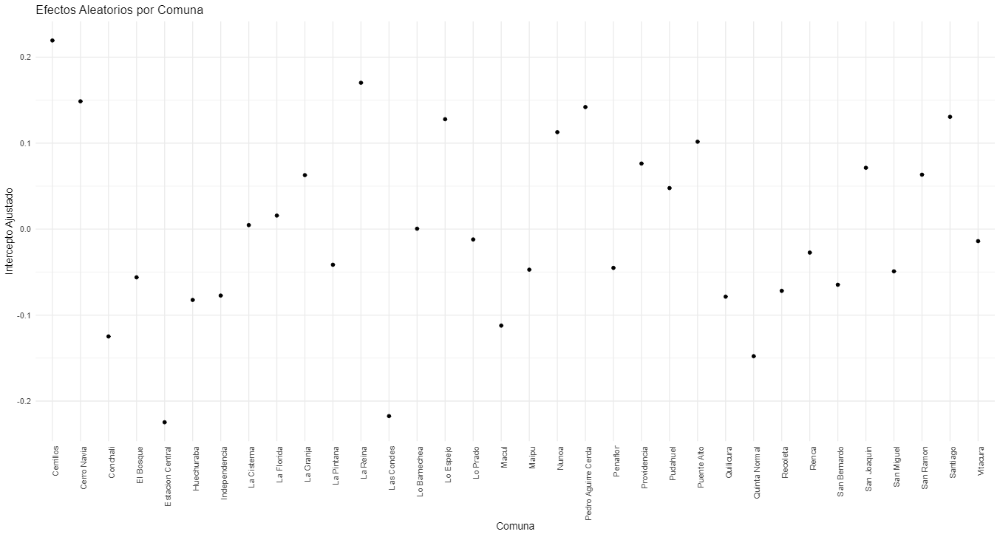

#### Efectos Aleatorios por Días:

In [176]:
from rpy2.robjects import pandas2ri, r
from IPython.display import display
import pandas as pd

# Activar soporte de pandas en rpy2
pandas2ri.activate()

# Transferir el DataFrame de Python a R
r_data = pandas2ri.py2rpy(datos_transicion_3_3)
r.assign("datos_transicion_3_3", r_data)

# Código en R para ajustar el modelo, generar la tabla y el gráfico
r('''
library(lme4)
library(ggplot2)
library(httpgd)

# Configurar un dispositivo gráfico
options(bitmapType = "cairo")

# Iniciar el servidor httpgd
hgd()

# Ajustar el modelo GLMM
modelo_D_3_3 <- lmer(Probabilidad_Transición ~ IM_interno + IM_externo + Personas_hogar_promedio + por_educ_sup + indic_precariedad_vivienda + total_hog_hacinados + inmigrantes + inc_pc_comuna + (1|Comuna) + (1|Día_original), data = datos_transicion_3_3)

# Extraer efectos aleatorios por día
ranef_data <- ranef(modelo_D_3_3, condVar = TRUE)

# Convertir los efectos aleatorios de Día_original en un DataFrame
dia_effects <- as.data.frame(ranef_data$Día_original)
dia_effects$Día_original <- as.numeric(rownames(dia_effects))

# Calcular la fecha real a partir del día original
start_date <- as.Date("2020-03-30")
dia_effects$Fecha <- start_date + (dia_effects$Día_original - 1)

# Determinar días de semana o fin de semana
dias_semana <- c("Monday", "Tuesday", "Wednesday", "Thursday", "Friday")
dia_effects$Tipo_dia <- ifelse(weekdays(dia_effects$Fecha) %in% dias_semana, "Día de semana", "Fin de semana")

# Lista de días festivos a colorear como "Fin de semana"
festivos <- as.Date(c(
    "2020-04-10",  # Viernes Santo
    "2020-05-01",  # Día Nacional del Trabajo
    "2020-05-21",  # Glorias Navales
    "2020-06-29",  # San Pedro y San Pablo
    "2020-07-16",  # Virgen del Carmen
    "2020-09-18",  # Independencia Nacional
    "2020-10-12"   # Encuentro de Dos Mundos
))

# Clasificar festivos como "Fin de semana"
dia_effects$Tipo_dia <- ifelse(dia_effects$Fecha %in% festivos, "Fin de semana", dia_effects$Tipo_dia)

# Crear gráfico para efectos aleatorios por fecha con puntos coloreados por tipo de día
dia_plot <- ggplot(dia_effects, aes(x = Fecha, y = `(Intercept)`, color = Tipo_dia)) +
    geom_point(size = 2) +
    scale_color_manual(values = c("Día de semana" = "blue", "Fin de semana" = "red")) +
    labs(title = "Efectos Aleatorios por Fecha", x = "Fecha", y = "Intercepto Ajustado", color = "Tipo de Día") +
    theme_minimal() +
    theme(axis.text.x = element_text(angle = 45, hjust = 1))

# Renderizar el gráfico en httpgd
print(dia_plot)

# Guardar la tabla actualizada en un archivo CSV
write.csv(dia_effects, file = "dia_effects_table.csv", row.names = FALSE)
''')

# Leer la tabla generada en R
dia_effects_table = pd.read_csv("dia_effects_table.csv")

# Configurar pandas para mostrar todas las filas
pd.set_option('display.max_rows', None)

# Mostrar la tabla actualizada con fechas y tipos de día
#display(dia_effects_table)


httpgd server running at:
  http://127.0.0.1:50966/live?token=p4BGDMCa


R[write to console]: In addition: 
R[write to console]: Warning messages:

R[write to console]: 1: Some predictor variables are on very different scales: consider rescaling 

R[write to console]: 2: Some predictor variables are on very different scales: consider rescaling 



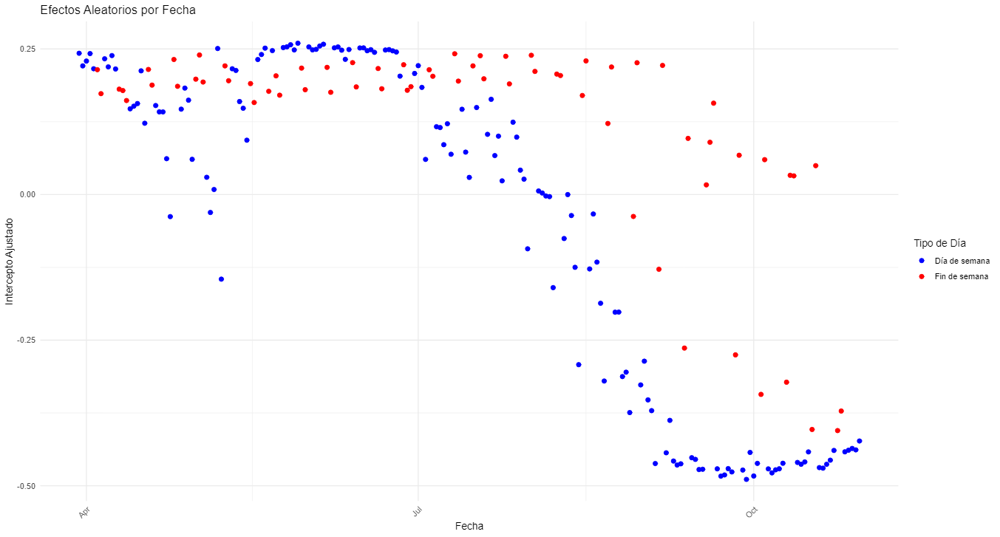

#### Interpretación de Efectos Aleatorios por Fecha:
1. Tendencias Generales
    - Inicio Positivo (Marzo a Junio 2020):
        - Durante los primeros meses, los interceptos ajustados son predominantemente positivos, con ligeras fluctuaciones entre días de semana y fines de semana. Esto sugiere que las condiciones iniciales fueron relativamente estables y favorables en términos de la variable modelada (por ejemplo, movilidad, actividad económica o comportamiento social).
    - Descenso Progresivo (Julio a Octubre 2020):
        - A partir de mediados de año, los valores de intercepto ajustado comienzan a disminuir, llegando a ser negativos desde agosto en adelante, especialmente en días de semana. Esto podría estar relacionado con impactos acumulativos, como restricciones más estrictas, disminución de actividades o cambios en los comportamientos sociales.
2. Diferencias entre Días de Semana y Fines de Semana
    - Fines de Semana:
        - Los interceptos en fines de semana tienden a mantenerse más altos (menos negativos) que en días de semana. Esto podría reflejar un mayor nivel de actividad social o relajación de restricciones durante los fines de semana.
    - Días de Semana:
        - Muestran una tendencia a la baja más pronunciada, especialmente hacia el final del periodo. Esto puede estar relacionado con cambios en patrones de trabajo, movilidad o medidas restrictivas.
3. Eventos Contextuales
    - Es probable que eventos específicos, como cambios en políticas públicas, aumento o disminución de restricciones, o variaciones estacionales, estén detrás de las fluctuaciones observadas en los interceptos ajustados.
    - Por ejemplo, el descenso pronunciado en agosto podría coincidir con el endurecimiento de restricciones o el impacto acumulado de medidas previas.
4. Picos y Valle en el Gráfico
    - Picos:
        - Durante los fines de semana, en meses como abril y mayo, los valores de intercepto aumentan. Esto sugiere momentos de relativa estabilidad o aumento en ciertas actividades.
    - Valles:
        - Desde septiembre hasta octubre, los interceptos son consistentemente negativos, indicando una reducción en las condiciones modeladas.
5. Conclusión
    - Este análisis sugiere un deterioro progresivo en las condiciones a lo largo del tiempo, particularmente en días de semana. Sin embargo, los fines de semana parecen ofrecer cierta estabilidad relativa.
    - Es importante cruzar estos resultados con información contextual (por ejemplo, medidas gubernamentales, eventos estacionales, o impacto de la pandemia) para explicar las variaciones.

### Análisis de Residuales en el tiempo:

In [178]:
from rpy2.robjects import pandas2ri, r
from IPython.display import display
import pandas as pd

# Activar soporte de pandas en rpy2
pandas2ri.activate()

# Transferir el DataFrame de Python a R
r_data = pandas2ri.py2rpy(datos_transicion_3_3)
r.assign("datos_transicion_3_3", r_data)

# Código en R para calcular los residuales y generar la tabla
r('''
# Crear DataFrame con residuales, Fecha y Comuna
start_date <- as.Date("2020-03-30")
residuals_data <- data.frame(
    Fecha = as.Date(start_date + (datos_transicion_3_3$Día_original - 1)),
    Residual = residuals(modelo_D_3_3),
    Comuna = datos_transicion_3_3$Comuna,
    Día = datos_transicion_3_3$Día_original
)

# Guardar la tabla como archivo CSV
write.csv(residuals_data, file = "residuals_table_3_3_D.csv", row.names = FALSE)
''')

# Leer la tabla generada en R
residuals_table = pd.read_csv("residuals_table_3_3_D.csv")

# Configurar pandas para mostrar todas las filas (opcional)
pd.set_option('display.max_rows', None)

# Mostrar la tabla en Jupyter Notebook
#display(residuals_table)

In [180]:
r('''
# Crear un DataFrame con los residuales, la columna Fecha y la columna Comuna
residuals_data <- data.frame(
    Fecha = as.Date(start_date + (datos_transicion_3_3$Día_original - 1)),
    Residuals = residuals(modelo_D_3_3),
    Comuna = datos_transicion_3_3$Comuna
)

# Crear gráfico de residuales con Fecha en el eje x y colorear por Comuna
residuals_plot <- ggplot(residuals_data, aes(x = Fecha, y = Residuals, color = Comuna)) +
    geom_point() +
    labs(title = "Análisis de Residuales", x = "Fecha", y = "Residuales") +
    theme_minimal() +
    theme(axis.text.x = element_text(angle = 45, hjust = 1))  # Rotar etiquetas en el eje x

# Renderizar el gráfico en httpgd
print(residuals_plot)
''')

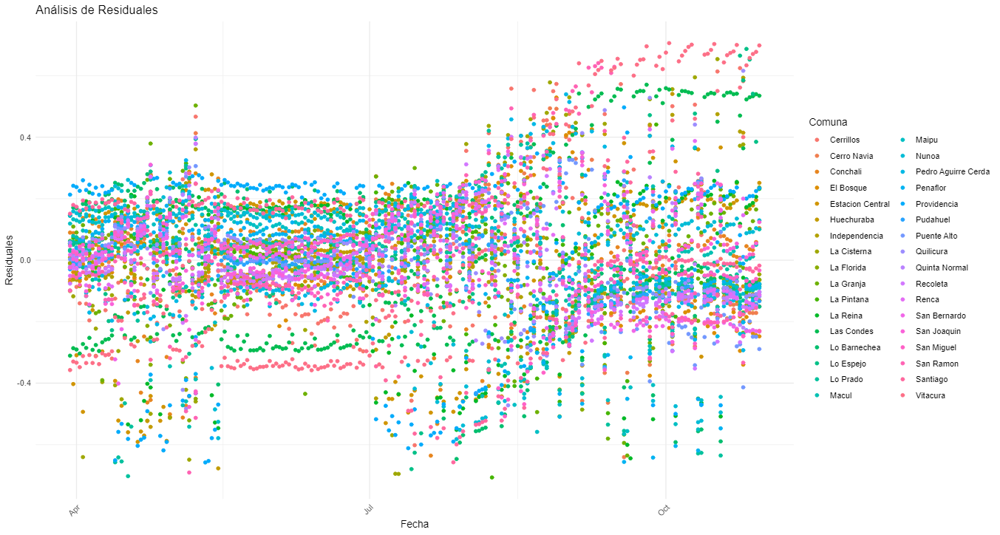

In [181]:
import pandas as pd

import pandas as pd

# Leer la tabla de residuales
residuals_table = pd.read_csv("residuals_table_3_3_D.csv")

# Calcular el rango de residuales por comuna
residual_stats = residuals_table.groupby('Comuna').agg(
    Residual_Minimo=('Residual', 'min'),
    Residual_Maximo=('Residual', 'max'),
    Desviacion_Estandar=('Residual', 'std')
).reset_index()

# Crear la columna de rango de residuales con formato "mínimo a máximo"
residual_stats['Rango de Residuales'] = residual_stats['Residual_Minimo'].round(6).astype(str) + " a " + residual_stats['Residual_Maximo'].round(6).astype(str)

# Seleccionar las 3 comunas con los residuales más negativos
negativos = residual_stats.nsmallest(3, 'Residual_Minimo')

# Seleccionar las 3 comunas con los residuales más positivos
positivos = residual_stats.nlargest(3, 'Residual_Maximo')

# Combinar los resultados en una única tabla
extremos = pd.concat([negativos, positivos])

# Seleccionar columnas relevantes para el resultado final
extremos = extremos[['Comuna', 'Rango de Residuales', 'Desviacion_Estandar']]

# Guardar la tabla en un archivo CSV
extremos.to_csv("tabla_extremos_residuales.csv", index=False)

# Mostrar la tabla
print(extremos)


         Comuna   Rango de Residuales  Desviacion_Estandar
10   La Pintana  -0.706689 a 0.440901             0.151911
15     Lo Prado   -0.702497 a 0.42066             0.193481
7   La Cisterna  -0.695257 a 0.653754             0.227892
33     Vitacura  -0.358151 a 0.705802             0.380502
14    Lo Espejo   -0.679506 a 0.68688             0.190031
7   La Cisterna  -0.695257 a 0.653754             0.227892


#### Interpretación de Resultados para el Modelo D: Transición 3->3 Mantención en Severo
- Efectos Aleatorios por Comuna:
    - Distribución: Los efectos aleatorios muestran variabilidad significativa entre las comunas. Comunas como Cerrillos (0.219) y Cerro Navia (0.148) tienen efectos positivos significativos en la mantención de estado severo, mientras que comunas como Las Condes (-0.217) y Estación Central (-0.224) presentan efectos negativos considerables.
    - Interpretación: Las comunas con efectos positivos sugieren factores locales que favorecen la mantención en estado severo, posiblemente vinculados a condiciones socioeconómicas o demográficas específicas. Por otro lado, comunas con efectos negativos podrían tener características que dificultan la permanencia en este estado.
- Efectos Aleatorios por Día:
    - Tendencia General: Los efectos aleatorios diarios presentan una clara variación a lo largo del tiempo, con valores altos al inicio del período (0.242 en marzo) y una disminución progresiva hasta alcanzar valores negativos en octubre (-0.459).
    - Diferencias por Tipo de Día: Días de semana y fines de semana muestran comportamientos diferenciados. Los fines de semana tienden a tener menor impacto negativo en la transición hacia el estado severo.
    - Interpretación: La disminución de los efectos aleatorios sugiere un cambio en las dinámicas temporales que afectan la transición, posiblemente relacionado con medidas externas, como políticas públicas o cambios estacionales.
- Análisis de Residuales:
    - Distribución de Residuales: Los residuales muestran una variación dispersa a lo largo del tiempo, pero se observan patrones consistentes hacia los extremos, indicando casos específicos con mayor variabilidad no explicada por el modelo.
    - Comportamiento por Comuna: La dispersión por comuna resalta la existencia de factores no modelados que influyen en ciertas localidades.
    - Interpretación: Aunque el modelo explica gran parte de la variabilidad, los residuales sugieren que podrían incorporarse variables adicionales para mejorar la explicación de ciertos casos extremos.
- Conclusión General:
    - Fortalezas: El Modelo D captura tanto la variabilidad espacial (comunas) como la temporal (días), destacando el impacto de predictores clave y la influencia de condiciones locales y temporales en la transición 3->3.
    - Limitaciones: A pesar del buen ajuste, los patrones observados en los residuales indican la necesidad de explorar factores adicionales que podrían mejorar la explicación de casos extremos y variabilidad residual.
    - Implicaciones: Los efectos aleatorios revelan áreas prioritarias (comunas y períodos específicos) para intervenciones dirigidas a gestionar el estado severo, como políticas públicas o estrategias de salud específicas.







## **Transición 3->2: De Severo a Moderado**

In [83]:
from pymer4.models import Lmer

# Filtrar los datos para la transición 'Trans_2->1'
transicion_especifica_3_2 = 'Trans_3->2'
datos_transicion_3_2 = glmm_data[glmm_data['Transición'] == transicion_especifica_3_2]

# Asegurarse de que la columna 'Comuna' sea categórica
datos_transicion_3_2['Comuna'] = datos_transicion_3_2['Comuna'].astype('category')

# Inspeccionar los datos
#print(f"Número de observaciones para {transicion_especifica_1_2}: {len(datos_transicion_1_2)}")
#print(datos_transicion_1_2.head())

C:\Users\ferna\AppData\Local\Temp\ipykernel_23424\1732447582.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos_transicion_3_2['Comuna'] = datos_transicion_3_2['Comuna'].astype('category')


In [84]:
from rpy2.robjects import pandas2ri, r

# Activar soporte de pandas en rpy2
pandas2ri.activate()

# Transferir el DataFrame de Python a R
r_data = pandas2ri.py2rpy(datos_transicion_3_2)
r.assign("datos_transicion_3_2", r_data)

Comuna,Día_original,Día_correlativo,...,indic_precariedad_vivienda,por_educ_sup,IPS_2020
Cerri...,1,0,...,...,...,...
Cerri...,2,1,,,,
Cerri...,3,2,,,,
Cerri...,4,3,,,,
...,...,...,,,,
Vitac...,212,7306,,,,
Vitac...,213,7307,,,,
Vitac...,214,7308,,,,
Vitac...,215,7309,,,,


### Ajuste y Resumen de Modelo LMM (Linear Mixed Model) con covariables escaladas:
Fórmula Modelo D: "Probabilidad_Transición ~ IM_interno + IM_externo + Personas_hogar_promedio + por_educ_sup + indic_precariedad_vivienda + total_hog_hacinados + inmigrantes + inc_pc_comuna + (1|Comuna) + (1|Día_original)"

In [85]:
r('''
library(lme4)
library(ggplot2)
library(httpgd)

# Iniciar el servidor httpgd
hgd()

# Escalar las variables
datos_transicion_3_2$IM_interno <- scale(datos_transicion_3_2$IM_interno)
datos_transicion_3_2$IM_externo <- scale(datos_transicion_3_2$IM_externo)
datos_transicion_3_2$Personas_hogar_promedio <- scale(datos_transicion_3_2$Personas_hogar_promedio)
datos_transicion_3_2$por_educ_sup <- scale(datos_transicion_3_2$por_educ_sup)
datos_transicion_3_2$indic_precariedad_vivienda <- scale(datos_transicion_3_2$indic_precariedad_vivienda)
datos_transicion_3_2$total_hog_hacinados <- scale(datos_transicion_3_2$total_hog_hacinados)
datos_transicion_3_2$inmigrantes <- scale(datos_transicion_3_2$inmigrantes)
datos_transicion_3_2$inc_pc_comuna <- scale(datos_transicion_3_2$inc_pc_comuna)

# Ajustar el modelo GLMM
modelo_D_3_2 <- lmer(Probabilidad_Transición ~ IM_interno + IM_externo + Personas_hogar_promedio + por_educ_sup + indic_precariedad_vivienda + total_hog_hacinados + inmigrantes + inc_pc_comuna + (1|Comuna) + (1|Día_original), data = datos_transicion_3_2)

# Capturar y mostrar el resumen del modelo
summary_text <- capture.output(summary(modelo_D_3_2))
writeLines(summary_text)
''')


httpgd server running at:
  http://127.0.0.1:61576/live?token=Y9IEE1Wk
Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: 
Probabilidad_Transición ~ IM_interno + IM_externo + Personas_hogar_promedio +  
    por_educ_sup + indic_precariedad_vivienda + total_hog_hacinados +  
    inmigrantes + inc_pc_comuna + (1 | Comuna) + (1 | Día_original)
   Data: datos_transicion_3_2

REML criterion at convergence: -25567.1

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-5.8579 -0.2852 -0.0593  0.1821 16.5744 

Random effects:
 Groups       Name        Variance  Std.Dev.
 Día_original (Intercept) 0.0008758 0.02959 
 Comuna       (Intercept) 0.0005762 0.02400 
 Residual                 0.0015753 0.03969 
Number of obs: 7310, groups:  Día_original, 215; Comuna, 34

Fixed effects:
                             Estimate Std. Error         df t value Pr(>|t|)
(Intercept)                 1.986e-02  4.608e-03  3.861e+01   4.310 0.000109
IM_interno   

#### Interpretación de Resultados:
El análisis de la transición utiliza un modelo lineal mixto (LMM) para modelar la probabilidad de transición de un estado severo (3) a un estado moderado (2). 

- Impacto significativo de covariables:

    - Factores internos (IM_interno) son positivos y significativamente asociados con la probabilidad de transición.
    - Factores externos (IM_externo) y algunas variables socioeconómicas tienen efectos negativos, indicando que pueden limitar la transición de severo a moderado.
- Variabilidad estructural:

    - La variabilidad entre comunas sugiere que estrategias específicas deben adaptarse a las características particulares de cada comuna.
    - La baja variabilidad entre días indica que las tendencias son bastante consistentes en el tiempo.

(Intercept)                ***
IM_interno                 ***
IM_externo                 ***
Personas_hogar_promedio    *  
por_educ_sup                  
indic_precariedad_vivienda    
total_hog_hacinados        *  
inmigrantes                   
inc_pc_comuna              * 

## **Transición 3->1: De Severo a Leve**

In [138]:
from pymer4.models import Lmer

# Filtrar los datos para la transición 'Trans_2->1'
transicion_especifica_3_1 = 'Trans_3->1'
datos_transicion_3_1 = glmm_data[glmm_data['Transición'] == transicion_especifica_3_1]

# Asegurarse de que la columna 'Comuna' sea categórica
datos_transicion_3_1['Comuna'] = datos_transicion_3_1['Comuna'].astype('category')

# Inspeccionar los datos
#print(f"Número de observaciones para {transicion_especifica_1_2}: {len(datos_transicion_1_2)}")
#print(datos_transicion_1_2.head())

C:\Users\ferna\AppData\Local\Temp\ipykernel_23424\3528856109.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos_transicion_3_1['Comuna'] = datos_transicion_3_1['Comuna'].astype('category')


In [139]:
from rpy2.robjects import pandas2ri, r

# Activar soporte de pandas en rpy2
pandas2ri.activate()

# Transferir el DataFrame de Python a R
r_data = pandas2ri.py2rpy(datos_transicion_3_1)
r.assign("datos_transicion_3_1", r_data)

Comuna,Día_original,Día_correlativo,...,indic_precariedad_vivienda,por_educ_sup,IPS_2020
Cerri...,1,0,...,...,...,...
Cerri...,2,1,,,,
Cerri...,3,2,,,,
Cerri...,4,3,,,,
...,...,...,,,,
Vitac...,212,7306,,,,
Vitac...,213,7307,,,,
Vitac...,214,7308,,,,
Vitac...,215,7309,,,,


### Ajuste y Resumen de Modelo LMM (Linear Mixed Model) con covariables escaladas:
Fórmula Modelo D: "Probabilidad_Transición ~ IM_interno + IM_externo + Personas_hogar_promedio + por_educ_sup + indic_precariedad_vivienda + total_hog_hacinados + inmigrantes + inc_pc_comuna + (1|Comuna) + (1|Día_original)"

In [140]:
r('''
library(lme4)
library(ggplot2)
library(httpgd)

# Iniciar el servidor httpgd
hgd()

# Escalar las variables
datos_transicion_3_1$IM_interno <- scale(datos_transicion_3_1$IM_interno)
datos_transicion_3_1$IM_externo <- scale(datos_transicion_3_1$IM_externo)
datos_transicion_3_1$Personas_hogar_promedio <- scale(datos_transicion_3_1$Personas_hogar_promedio)
datos_transicion_3_1$por_educ_sup <- scale(datos_transicion_3_1$por_educ_sup)
datos_transicion_3_1$indic_precariedad_vivienda <- scale(datos_transicion_3_1$indic_precariedad_vivienda)
datos_transicion_3_1$total_hog_hacinados <- scale(datos_transicion_3_1$total_hog_hacinados)
datos_transicion_3_1$inmigrantes <- scale(datos_transicion_3_1$inmigrantes)
datos_transicion_3_1$inc_pc_comuna <- scale(datos_transicion_3_1$inc_pc_comuna)

# Ajustar el modelo GLMM
modelo_D_3_1 <- lmer(Probabilidad_Transición ~ IM_interno + IM_externo + Personas_hogar_promedio + por_educ_sup + indic_precariedad_vivienda + total_hog_hacinados + inmigrantes + inc_pc_comuna + (1|Comuna) + (1|Día_original), data = datos_transicion_3_1)

# Capturar y mostrar el resumen del modelo
summary_text <- capture.output(summary(modelo_D_3_1))
writeLines(summary_text)
''')


httpgd server running at:
  http://127.0.0.1:59494/live?token=yMp9MrCt
Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: 
Probabilidad_Transición ~ IM_interno + IM_externo + Personas_hogar_promedio +  
    por_educ_sup + indic_precariedad_vivienda + total_hog_hacinados +  
    inmigrantes + inc_pc_comuna + (1 | Comuna) + (1 | Día_original)
   Data: datos_transicion_3_1

REML criterion at convergence: -251623.4

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-4.1212 -0.3837  0.0157  0.2996 11.3848 

Random effects:
 Groups       Name        Variance  Std.Dev. 
 Día_original (Intercept) 3.654e-17 6.045e-09
 Comuna       (Intercept) 2.815e-17 5.306e-09
 Residual                 5.599e-17 7.483e-09
Number of obs: 7310, groups:  Día_original, 215; Comuna, 34

Fixed effects:
                             Estimate Std. Error         df t value Pr(>|t|)
(Intercept)                 6.381e-09  1.003e-09  2.382e-02   6.363    0.900
IM_inter

#### Interpretación de los Resultados del Modelo LMM para la Transición 3->1: Severo a Leve

1. Criterio de Evaluación (REML):

    - El valor del criterio REML indica qué tan bien se ajusta el modelo a los datos. Valores más bajos reflejan un mejor ajuste.
    - Se utiliza para comparar este modelo con otros, evaluando su desempeño relativo.
2. Efectos Fijos:
    - Cada coeficiente estimado indica el cambio en la probabilidad de transición (en escala log-odds) asociado con un cambio de una desviación estándar en la variable predictora.
    - Las variables con significancia estadística (p < 0.05) tienen un impacto relevante en la transición. Por ejemplo:
        - IM_interno: Coeficiente positivo o negativo refleja su influencia en facilitar o dificultar la transición.
        - Personas_hogar_promedio: Un coeficiente significativo indica que hogares más grandes están asociados con la probabilidad de cambio.
        - Otras variables como indic_precariedad_vivienda y inmigrantes reflejan aspectos socioeconómicos clave.
3. Efectos Aleatorios:
    - Las desviaciones estándar para Comuna y Día_original cuantifican la variabilidad no explicada atribuida a estas unidades.
    - Si la variabilidad es alta, sugiere que hay factores locales o temporales no capturados en los efectos fijos.
4. Análisis de Residuos:
    - Los residuos estandarizados permiten evaluar qué tan bien el modelo ajusta los datos observados.
    - Patrones o valores extremos pueden indicar variables omitidas o suposiciones inapropiadas en el modelo.
5. Conclusiones
    - Impacto de las Variables: El modelo identifica factores socioeconómicos clave que influyen en la transición de severo a leve. Esto tiene implicaciones importantes para diseñar intervenciones.
    - Variabilidad no Explicada: Los efectos aleatorios destacan diferencias significativas entre comunas y días, lo que sugiere la necesidad de considerar contextos específicos en el análisis.
    - Mejoras Futuras: Incorporar variables adicionales o explorar interacciones entre las variables predictoras podría mejorar el ajuste y la capacidad predictiva del modelo.

## **Transición 2->1: De Moderado a Leve**

In [80]:
from pymer4.models import Lmer

# Filtrar los datos para la transición 'Trans_2->1'
transicion_especifica_2_1 = 'Trans_2->1'
datos_transicion_2_1 = glmm_data[glmm_data['Transición'] == transicion_especifica_2_1]

# Asegurarse de que la columna 'Comuna' sea categórica
datos_transicion_2_1['Comuna'] = datos_transicion_2_1['Comuna'].astype('category')

# Inspeccionar los datos
#print(f"Número de observaciones para {transicion_especifica_1_2}: {len(datos_transicion_1_2)}")
#print(datos_transicion_1_2.head())

C:\Users\ferna\AppData\Local\Temp\ipykernel_23424\3591539471.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos_transicion_2_1['Comuna'] = datos_transicion_2_1['Comuna'].astype('category')


In [81]:
from rpy2.robjects import pandas2ri, r

# Activar soporte de pandas en rpy2
pandas2ri.activate()

# Transferir el DataFrame de Python a R
r_data = pandas2ri.py2rpy(datos_transicion_2_1)
r.assign("datos_transicion_2_1", r_data)

Comuna,Día_original,Día_correlativo,...,indic_precariedad_vivienda,por_educ_sup,IPS_2020
Cerri...,1,0,...,...,...,...
Cerri...,2,1,,,,
Cerri...,3,2,,,,
Cerri...,4,3,,,,
...,...,...,,,,
Vitac...,212,7306,,,,
Vitac...,213,7307,,,,
Vitac...,214,7308,,,,
Vitac...,215,7309,,,,


### Ajuste y Resumen de Modelo LMM (Linear Mixed Model) con covariables escaladas:
Fórmula Modelo D: "Probabilidad_Transición ~ IM_interno + IM_externo + Personas_hogar_promedio + por_educ_sup + indic_precariedad_vivienda + total_hog_hacinados + inmigrantes + inc_pc_comuna + (1|Comuna) + (1|Día_original)"

In [82]:
r('''
library(lme4)
library(ggplot2)
library(httpgd)

# Iniciar el servidor httpgd
hgd()

# Escalar las variables
datos_transicion_2_1$IM_interno <- scale(datos_transicion_2_1$IM_interno)
datos_transicion_2_1$IM_externo <- scale(datos_transicion_2_1$IM_externo)
datos_transicion_2_1$Personas_hogar_promedio <- scale(datos_transicion_2_1$Personas_hogar_promedio)
datos_transicion_2_1$por_educ_sup <- scale(datos_transicion_2_1$por_educ_sup)
datos_transicion_2_1$indic_precariedad_vivienda <- scale(datos_transicion_2_1$indic_precariedad_vivienda)
datos_transicion_2_1$total_hog_hacinados <- scale(datos_transicion_2_1$total_hog_hacinados)
datos_transicion_2_1$inmigrantes <- scale(datos_transicion_2_1$inmigrantes)
datos_transicion_2_1$inc_pc_comuna <- scale(datos_transicion_2_1$inc_pc_comuna)

# Ajustar el modelo GLMM
modelo_D_2_1 <- lmer(Probabilidad_Transición ~ IM_interno + IM_externo + Personas_hogar_promedio + por_educ_sup + indic_precariedad_vivienda + total_hog_hacinados + inmigrantes + inc_pc_comuna + (1|Comuna) + (1|Día_original), data = datos_transicion_2_1)

# Capturar y mostrar el resumen del modelo
summary_text <- capture.output(summary(modelo_D_2_1))
writeLines(summary_text)
''')


httpgd server running at:
  http://127.0.0.1:61304/live?token=6WWYDbdt
Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: 
Probabilidad_Transición ~ IM_interno + IM_externo + Personas_hogar_promedio +  
    por_educ_sup + indic_precariedad_vivienda + total_hog_hacinados +  
    inmigrantes + inc_pc_comuna + (1 | Comuna) + (1 | Día_original)
   Data: datos_transicion_2_1

REML criterion at convergence: -39470.3

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-3.3571 -0.3836 -0.0784  0.2444 12.8166 

Random effects:
 Groups       Name        Variance  Std.Dev.
 Día_original (Intercept) 6.246e-05 0.007903
 Comuna       (Intercept) 2.407e-04 0.015515
 Residual                 2.386e-04 0.015446
Number of obs: 7310, groups:  Día_original, 215; Comuna, 34

Fixed effects:
                             Estimate Std. Error         df t value Pr(>|t|)
(Intercept)                 1.739e-02  2.721e-03  2.872e+01   6.390 5.75e-07
IM_interno   

#### Interpretación de Resultados:
El modelo lineal mixto (LMM) describe la probabilidad de que una comuna pase de un estado moderado (2) a uno leve (1), teniendo en cuenta covariables escaladas y efectos aleatorios por comuna y día.

- Criterio REML
    - El criterio REML obtenido es -39,470.3, lo que indica un buen ajuste general del modelo. Este valor puede ser utilizado para comparar este modelo con otros modelos alternativos que analicen los mismos datos.
- Residuos Escalados
    - Los residuos tienen una distribución razonable, con valores extremos como -3.3571 y 12.8166, lo que podría indicar algunos valores atípicos o casos mal ajustados.
    - Los cuartiles (1Q, Mediana, 3Q) sugieren que la mayoría de los datos están bien ajustados alrededor de los valores predichos.
- Efectos Aleatorios
    - Día_original: La variabilidad entre días es muy baja, con una desviación estándar de 0.0079, lo que sugiere que las diferencias entre días tienen un impacto limitado en la probabilidad de transición.
    - Comuna: La variabilidad entre comunas es más alta, con una desviación estándar de 0.0155, lo que refleja cierta influencia de las diferencias espaciales.
- Residuo: La desviación estándar del residuo es 0.0154, lo que indica que una parte significativa de la variabilidad no está explicada por las variables incluidas en el modelo.
- Efectos Fijos
    - Los coeficientes de las variables predictoras reflejan el impacto de cada una en la probabilidad de transición, en escala log-odds:
        - Intercepto: 0.0174
            - Representa la probabilidad base de transición cuando todas las variables predictoras están en su valor promedio (debido al escalado).
            - Este valor es significativamente positivo (p < 0.001).
        - IM_interno: -0.0284
            - Este coeficiente negativo es altamente significativo (p < 0.001), indicando que un mayor índice interno reduce la probabilidad de transición de moderado a leve.
            - Refleja la influencia adversa de condiciones internas negativas.
        - IM_externo: 0.0076
            - Este coeficiente positivo y significativo (p < 0.001) sugiere que un mayor índice externo aumenta la probabilidad de transición, probablemente asociado con mejores condiciones externas.
            - Personas_hogar_promedio: 0.0156
            - Un coeficiente positivo y significativo (p < 0.01) indica que hogares más grandes están asociados con una mayor probabilidad de transición.
        - Porcentaje con educación superior (por_educ_sup): 0.0339
            - Este coeficiente positivo y significativo (p < 0.01) sugiere que un mayor nivel educativo está relacionado con una mayor probabilidad de transición.
        - Indicador de precariedad de vivienda: -0.0026
            - No significativo (p = 0.533), lo que implica que este indicador no tiene un impacto claro en la probabilidad de transición.
        - Total de hogares hacinados: 0.0058
            - No significativo (p = 0.115), aunque sugiere un posible efecto positivo débil.
        - Inmigrantes: 0.0082
            - Coeficiente positivo y significativo (p = 0.043), indicando que un mayor porcentaje de inmigrantes está relacionado con una mayor probabilidad de transición.
        - Ingreso per cápita de la comuna (inc_pc_comuna): -0.0032
            - No significativo (p = 0.657), lo que sugiere que el ingreso per cápita no afecta directamente la probabilidad de transición.
    - Correlaciones entre Efectos Fijos
        - Las correlaciones entre las variables fijas indican interrelaciones importantes, como:
            - IM_interno y IM_externo: Correlación negativa (-0.494), lo que sugiere que estas variables capturan aspectos complementarios pero opuestos del contexto interno y externo.
            - Porcentaje de educación superior y Ingreso per cápita: Correlación negativa alta (-0.789), lo que refleja que estas variables están estrechamente relacionadas y pueden representar dimensiones similares de bienestar socioeconómico.
- Conclusiones
    - Impacto Principal: Las variables IM_interno, IM_externo, Personas_hogar_promedio, Porcentaje de educación superior e Inmigrantes son los factores clave que explican la probabilidad de transición.
    - Variabilidad Espacial: Las diferencias entre comunas tienen un impacto mayor que las diferencias entre días.
    -Intervenciones Focalizadas: Las estrategias de intervención deben centrarse en mejorar las condiciones internas y externas, así como en fomentar la educación y reducir la vulnerabilidad en hogares más grandes o con alta población inmigrante.
    - Variables No Significativas: Variables como el ingreso per cápita o la precariedad de vivienda podrían necesitar refinamiento o sustitución por indicadores más relevantes.


_______________________________

# **ESTE ES EL FIN**
__________


# Prueba con Casos Media Móvil 7

- Para esto se considera la base mía llamada base_hito3, que contiene todo los datos brutos, sin variables de casos, aceleración, agregadas, considerando las 7310 filas.
- Se crea la variable llamada Casos_Diarios_Brutos (esto se hace en base a la primera derivada de la TasaCasosAcumulados).
- Luego, a partir de esta última variable, se crea una nueva variable llamada Casos_Diarios_Brutos_MM7, la cual corresponde a la media móvil de los Casos_Diarios_Brutos.

Calcular los casos diarios brutos (Casos_Diarios_Brutos): Esto efectivamente se calcula como la primera derivada de la variable acumulada TasaCasosAcumulados. En términos prácticos, se realiza restando el valor actual menos el valor anterior dentro de cada comuna.

Media móvil de 7 días (Casos_Diarios_Brutos_MM7): Esto se calcula suavizando la nueva columna Casos_Diarios_Brutos con una media móvil de 7 días. Esto ayuda a reducir el ruido en los datos.

Guardar la base final: Luego de estos cálculos, exportaremos la nueva base de datos en un archivo Excel llamado base_final.xlsx.

In [109]:
# Importar pandas
import pandas as pd

# 1. Cargar la base de datos original
base_hito3 = pd.read_excel("Datasets/base_hito3.xlsx")

# Verificar que la columna 'TasaCasosAcumulados' y 'Comuna' existan
if 'TasaCasosAcumulados' not in base_hito3.columns or 'Comuna' not in base_hito3.columns:
    raise ValueError("La base de datos debe contener las columnas 'TasaCasosAcumulados' y 'Comuna'.")

# 2. Calcular los casos diarios brutos
# Agrupar por comuna y calcular la diferencia diaria
base_hito3['Casos_Diarios_Brutos'] = base_hito3.groupby('Comuna')['TasaCasosAcumulados'].diff().fillna(0) #Se imputará con 0 como Placeholder en las filas con NaN (primeras filas por comuna), en vez de dropna() para evitar problemas posteriores con indice y merged.

# 3. Calcular la media móvil de 7 días
# Aplicar suavizado solo después de calcular los casos diarios brutos
base_hito3['Casos_Diarios_Brutos_MM7'] = (
    base_hito3.groupby('Comuna')['Casos_Diarios_Brutos']
    .transform(lambda x: x.rolling(window=7, min_periods=1).mean())
)

# 4. Exportar la nueva base de datos
base_hito3.to_excel("Datasets/base_final.xlsx", index=False)
print("Base final guardada como 'base_final.xlsx'.")


Base final guardada como 'base_final.xlsx'.


In [110]:
import pandas as pd

# 1. Importar la nueva base de datos
base_final = pd.read_excel("Datasets/base_final.xlsx")

# Verificar la estructura inicial de la base
print("Información inicial de la base:")
print(base_final.info())




Información inicial de la base:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7310 entries, 0 to 7309
Data columns (total 24 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   IM_interno                  7310 non-null   float64       
 1   IM_externo                  7310 non-null   float64       
 2   inc_pc_comuna               7310 non-null   float64       
 3   TasaCasosAcumulados         7310 non-null   float64       
 4   Personas_hogar_promedio     7310 non-null   float64       
 5   inmigrantes                 7310 non-null   int64         
 6   total_hog_hacinados         7310 non-null   int64         
 7   indic_precariedad_vivienda  7310 non-null   float64       
 8   Comuna                      7310 non-null   object        
 9   fecha                       7310 non-null   datetime64[ns]
 10  dias                        7310 non-null   int64         
 11  por_educ_sup            

In [111]:
base_final[base_final['Comuna']=='Vitacura'].head()

,IM_interno,IM_externo,inc_pc_comuna,TasaCasosAcumulados,Personas_hogar_promedio,inmigrantes,total_hog_hacinados,indic_precariedad_vivienda,Comuna,fecha,...,Prioridad_2020,CODIGO,year,month,paso,paso_etiqueta,Fecha inicio cuarentena,Fecha término cuarentena,Casos_Diarios_Brutos,Casos_Diarios_Brutos_MM7
7095,6.054337,3.765219,1659485.0,85.766838,2.715172,9305,4770,0.086982,Vitacura,2020-03-30,...,Sin Prioridad Social,13132,2020,3,1,Cuarentena,2020-05-15,2020-07-28,0.000000,0.000000
7096,6.260897,3.928746,1659485.0,88.866844,2.715172,9305,4770,0.086982,Vitacura,2020-03-31,...,Sin Prioridad Social,13132,2020,3,1,Cuarentena,2020-05-15,2020-07-28,3.100006,1.550003
7097,6.215721,3.965869,1659485.0,93.000186,2.715172,9305,4770,0.086982,Vitacura,2020-04-01,...,Sin Prioridad Social,13132,2020,4,1,Cuarentena,2020-05-15,2020-07-28,4.133342,2.411116
7098,6.042996,3.872119,1659485.0,98.166863,2.715172,9305,4770,0.086982,Vitacura,2020-04-02,...,Sin Prioridad Social,13132,2020,4,1,Cuarentena,2020-05-15,2020-07-28,5.166677,3.100006
7099,6.101138,4.022754,1659485.0,103.333540,2.715172,9305,4770,0.086982,Vitacura,2020-04-03,...,Sin Prioridad Social,13132,2020,4,1,Cuarentena,2020-05-15,2020-07-28,5.166677,3.513340


In [112]:
base_final.describe()

,IM_interno,IM_externo,inc_pc_comuna,TasaCasosAcumulados,Personas_hogar_promedio,inmigrantes,total_hog_hacinados,indic_precariedad_vivienda,fecha,dias,...,porc_postgrado,IPS_2020,CODIGO,year,month,paso,Fecha inicio cuarentena,Fecha término cuarentena,Casos_Diarios_Brutos,Casos_Diarios_Brutos_MM7
count,7310.000000,7310.000000,7.310000e+03,7310.000000,7310.000000,7310.000000,7310.000000,7310.000000,7310,7310.000000,...,7310.000000,7310.000000,7310.000000,7310.0,7310.000000,7310.000000,7310,7310,7310.000000,7310.000000
mean,3.548605,5.469967,4.592225e+05,2556.650554,2.964149,12609.911765,117810.323529,2.743325,2020-07-14 23:59:59.999999744,108.000000,...,2.444118,63.773824,13141.558824,2020.0,6.958140,1.185636,2020-05-06 03:31:45.882353152,2020-09-04 00:42:21.176470528,19.709363,19.656456
min,0.403075,0.965216,2.118268e+05,0.000000,1.684778,2127.000000,4770.000000,0.086982,2020-03-30 00:00:00,1.000000,...,0.100000,7.940000,13101.000000,2020.0,3.000000,0.000000,2020-04-09 00:00:00,2020-07-28 00:00:00,0.000000,0.000000
25%,2.076498,3.935328,2.700718e+05,652.972880,2.688212,4834.000000,63463.000000,1.549174,2020-05-22 00:00:00,54.000000,...,0.400000,56.630000,13109.000000,2020.0,5.000000,1.000000,2020-04-30 00:00:00,2020-08-24 00:00:00,4.872600,5.028411
50%,3.094769,5.228161,3.095795e+05,2730.976303,3.118494,7073.000000,98171.500000,3.070849,2020-07-15 00:00:00,108.000000,...,0.750000,69.990000,13117.500000,2020.0,7.000000,1.000000,2020-05-08 00:00:00,2020-09-07 00:00:00,8.959610,8.849068
75%,4.412667,6.787598,4.828577e+05,4033.336730,3.339855,12011.000000,160273.000000,3.961929,2020-09-07 00:00:00,162.000000,...,2.800000,76.600000,13127.000000,2020.0,9.000000,2.000000,2020-05-15 00:00:00,2020-09-21 00:00:00,24.731328,24.619108
max,13.124657,14.662443,1.659485e+06,6377.440701,3.550966,110389.000000,376908.000000,5.047971,2020-10-30 00:00:00,215.000000,...,12.700000,89.290000,13605.000000,2020.0,10.000000,4.000000,2020-06-12 00:00:00,2020-10-05 00:00:00,231.728910,174.178119
std,2.056437,2.166600,3.442663e+05,1820.819455,0.452251,18481.735755,81539.505319,1.458868,NaN,62.068728,...,3.515685,20.069518,95.193693,0.0,2.019375,0.819042,NaN,NaN,26.900350,24.785148


In [113]:
base_final.isnull().sum()

IM_interno                    0
IM_externo                    0
inc_pc_comuna                 0
TasaCasosAcumulados           0
Personas_hogar_promedio       0
inmigrantes                   0
total_hog_hacinados           0
indic_precariedad_vivienda    0
Comuna                        0
fecha                         0
dias                          0
por_educ_sup                  0
porc_postgrado                0
IPS_2020                      0
Prioridad_2020                0
CODIGO                        0
year                          0
month                         0
paso                          0
paso_etiqueta                 0
Fecha inicio cuarentena       0
Fecha término cuarentena      0
Casos_Diarios_Brutos          0
Casos_Diarios_Brutos_MM7      0
dtype: int64

In [114]:
# Eliminar filas con NaN en las columnas 'Casos_Diarios_Brutos' y 'Casos_Diarios_Brutos_MM7'
#base_final = base_final.dropna(subset=['Casos_Diarios_Brutos', 'Casos_Diarios_Brutos_MM7'])

# Verificar la base después de eliminar estas filas
print("Información después de eliminar filas con NaN en las columnas seleccionadas:")
print(base_final.info())

# Vista previa de las primeras filas
print("\nVista previa de la base limpia:")
print(base_final.head())


Información después de eliminar filas con NaN en las columnas seleccionadas:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7310 entries, 0 to 7309
Data columns (total 24 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   IM_interno                  7310 non-null   float64       
 1   IM_externo                  7310 non-null   float64       
 2   inc_pc_comuna               7310 non-null   float64       
 3   TasaCasosAcumulados         7310 non-null   float64       
 4   Personas_hogar_promedio     7310 non-null   float64       
 5   inmigrantes                 7310 non-null   int64         
 6   total_hog_hacinados         7310 non-null   int64         
 7   indic_precariedad_vivienda  7310 non-null   float64       
 8   Comuna                      7310 non-null   object        
 9   fecha                       7310 non-null   datetime64[ns]
 10  dias                        7310 non-null  

In [115]:
base_final[base_final['Comuna']=='Vitacura'] #Igual a Vitacura

,IM_interno,IM_externo,inc_pc_comuna,TasaCasosAcumulados,Personas_hogar_promedio,inmigrantes,total_hog_hacinados,indic_precariedad_vivienda,Comuna,fecha,...,Prioridad_2020,CODIGO,year,month,paso,paso_etiqueta,Fecha inicio cuarentena,Fecha término cuarentena,Casos_Diarios_Brutos,Casos_Diarios_Brutos_MM7
7095,6.054337,3.765219,1659485.0,85.766838,2.715172,9305,4770,0.086982,Vitacura,2020-03-30,...,Sin Prioridad Social,13132,2020,3,1,Cuarentena,2020-05-15,2020-07-28,0.000000,0.000000
7096,6.260897,3.928746,1659485.0,88.866844,2.715172,9305,4770,0.086982,Vitacura,2020-03-31,...,Sin Prioridad Social,13132,2020,3,1,Cuarentena,2020-05-15,2020-07-28,3.100006,1.550003
7097,6.215721,3.965869,1659485.0,93.000186,2.715172,9305,4770,0.086982,Vitacura,2020-04-01,...,Sin Prioridad Social,13132,2020,4,1,Cuarentena,2020-05-15,2020-07-28,4.133342,2.411116
7098,6.042996,3.872119,1659485.0,98.166863,2.715172,9305,4770,0.086982,Vitacura,2020-04-02,...,Sin Prioridad Social,13132,2020,4,1,Cuarentena,2020-05-15,2020-07-28,5.166677,3.100006
7099,6.101138,4.022754,1659485.0,103.333540,2.715172,9305,4770,0.086982,Vitacura,2020-04-03,...,Sin Prioridad Social,13132,2020,4,1,Cuarentena,2020-05-15,2020-07-28,5.166677,3.513340
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7305,11.752247,10.043483,1659485.0,1868.270403,2.715172,9305,4770,0.086982,Vitacura,2020-10-26,...,Sin Prioridad Social,13132,2020,10,4,Apertura,2020-05-15,2020-07-28,3.100006,2.657148
7306,11.723245,10.362570,1659485.0,1871.370409,2.715172,9305,4770,0.086982,Vitacura,2020-10-27,...,Sin Prioridad Social,13132,2020,10,4,Apertura,2020-05-15,2020-07-28,3.100006,2.804768
7307,12.242963,10.786483,1659485.0,1874.470416,2.715172,9305,4770,0.086982,Vitacura,2020-10-28,...,Sin Prioridad Social,13132,2020,10,4,Apertura,2020-05-15,2020-07-28,3.100006,2.804768
7308,12.230152,10.837468,1659485.0,1876.537086,2.715172,9305,4770,0.086982,Vitacura,2020-10-29,...,Sin Prioridad Social,13132,2020,10,4,Apertura,2020-05-15,2020-07-28,2.066671,2.804768


### Paso 1: Configuración del modelo HMM no homogéneo


In [116]:
from rpy2.robjects import r, pandas2ri
from rpy2.robjects.packages import importr
from rpy2.robjects.vectors import IntVector

# Activar la conversión de pandas a R
pandas2ri.activate()

# Cargar el paquete depmixS4
depmixS4 = importr("depmixS4")

# Establecer la semilla en R para reproducibilidad
r('set.seed(2023)')

# Convertir la base a formato R
base_hito3_r = pandas2ri.py2rpy(base_final)

# Crear fórmula para la observación principal y covariables
hmm_formula = r("as.formula")("Casos_Diarios_Brutos_MM7 ~ 1")
trans_formula = r("as.formula")("~ IM_interno + IM_externo + Comuna")

# Crear una secuencia de días por comuna (para ntimes)
ntimes = IntVector(base_final.groupby("Comuna")["dias"].count().tolist())

# Solución: usar la función gaussian() directamente
gaussian_family = r['gaussian']()

# Configurar el modelo HMM
hmm_global_model = depmixS4.depmix(
    response=hmm_formula,
    nstates=3,  # Número de estados ocultos
    family=gaussian_family,  # Objeto familia válido
    data=base_hito3_r,
    transition=trans_formula,
    ntimes=ntimes
)

# Verificar información inicial del modelo
print("Modelo HMM global configurado:")
print(hmm_global_model)


Modelo HMM global configurado:
Initial state probabilities model 
  pr1   pr2   pr3 
0.333 0.333 0.333 

Transition model for state (component) 1 
Model of type multinomial (mlogit), formula: ~IM_interno + IM_externo + Comuna
Coefficients: 
                          St1 St2 St3
(Intercept)                 0   0   0
IM_interno                  0   0   0
IM_externo                  0   0   0
ComunaCerro Navia           0   0   0
ComunaConchali              0   0   0
ComunaEl Bosque             0   0   0
ComunaEstacion Central      0   0   0
ComunaHuechuraba            0   0   0
ComunaIndependencia         0   0   0
ComunaLa Cisterna           0   0   0
ComunaLa Florida            0   0   0
ComunaLa Granja             0   0   0
ComunaLa Pintana            0   0   0
ComunaLa Reina              0   0   0
ComunaLas Condes            0   0   0
ComunaLo Barnechea          0   0   0
ComunaLo Espejo             0   0   0
ComunaLo Prado              0   0   0
ComunaMacul                 0   0   0

#### Cómo las transiciones se incorporan al modelo

Configuración del modelo HMM:

Durante la configuración, especificaste una fórmula de transición:

r
Copiar código

~ IM_interno + IM_externo + Comuna

Esto indica que las probabilidades de transición dependen de las covariables IM_interno, IM_externo, y la comuna.

En términos de t00, t01, etc.:
Estas transiciones se parametrizan como funciones de las covariables y se ajustan durante el entrenamiento del modelo.

### Evaluacion de Estados Ocultos Optimos (AIC, BIC, Likelihood):

In [117]:
print(base_final.isnull().sum())  # Verifica valores faltantes por columna
print(base_final.describe())  # Verifica estadísticas básicas


IM_interno                    0
IM_externo                    0
inc_pc_comuna                 0
TasaCasosAcumulados           0
Personas_hogar_promedio       0
inmigrantes                   0
total_hog_hacinados           0
indic_precariedad_vivienda    0
Comuna                        0
fecha                         0
dias                          0
por_educ_sup                  0
porc_postgrado                0
IPS_2020                      0
Prioridad_2020                0
CODIGO                        0
year                          0
month                         0
paso                          0
paso_etiqueta                 0
Fecha inicio cuarentena       0
Fecha término cuarentena      0
Casos_Diarios_Brutos          0
Casos_Diarios_Brutos_MM7      0
dtype: int64
        IM_interno   IM_externo  inc_pc_comuna  TasaCasosAcumulados  \
count  7310.000000  7310.000000   7.310000e+03          7310.000000   
mean      3.548605     5.469967   4.592225e+05          2556.650554   
min   

In [118]:
print(ntimes)


 [1] 215 215 215 215 215 215 215 215 215 215 215 215 215 215 215 215 215 215 215
[20] 215 215 215 215 215 215 215 215 215 215 215 215 215 215 215



In [14]:
import pandas as pd
import matplotlib.pyplot as plt
from rpy2.robjects import r, pandas2ri
from rpy2.robjects.packages import importr
from rpy2.robjects.vectors import IntVector

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from rpy2.robjects import r, pandas2ri
from rpy2.robjects.packages import importr
from rpy2.robjects.vectors import IntVector


# Activar la conversión de pandas a R
pandas2ri.activate()



# Establecer la semilla en R para reproducibilidad
r('set.seed(2023)')

# Importar el paquete depmixS4
depmixS4 = importr("depmixS4")

# Configurar datos (asegúrate de que base_final esté bien definida)
base_final_r = pandas2ri.py2rpy(base_final)

# Crear fórmula para la observación principal y las transiciones
hmm_formula = r("as.formula")("Casos_Diarios_Brutos_MM7 ~ 1")
trans_formula = r("as.formula")("~ IM_interno + IM_externo + Comuna")
#trans_formula = r("as.formula")("~ IM_interno + IM_externo")

# Crear la lista para guardar resultados
results = []

# Crear una secuencia de días por comuna (para ntimes)
ntimes = IntVector(base_final.groupby("Comuna")["dias"].count().tolist())

# Probar diferentes números de estados ocultos
for n_states in range(3, 11):  # Cambiar el rango según tus necesidades
    print(f"Evaluando modelo con {n_states} estados...")
    # Configurar el modelo HMM
    hmm_model = depmixS4.depmix(
        response=hmm_formula,
        nstates=n_states,
        family=r['gaussian'](),
        data=base_final_r,
        transition=trans_formula,
        ntimes=ntimes
    )
    
    # Ajustar el modelo
    fitted_model = depmixS4.fit(hmm_model)
    
    # Extraer métricas
    log_likelihood = r.logLik(fitted_model)[0]
    aic = r.AIC(fitted_model)[0]
    bic = r.BIC(fitted_model)[0]
    
    # Guardar resultados
    results.append({
        "n_states": n_states,
        "log_likelihood": log_likelihood,
        "AIC": aic,
        "BIC": bic
    })

# Convertir resultados a DataFrame de pandas
results_df = pd.DataFrame(results)

# Imprimir resultados
print("Resultados de la evaluación:")
print(results_df)

# Mostrar el mejor modelo según BIC
best_model_bic = results_df.loc[results_df['BIC'].idxmin()]
print("\nMejor modelo según BIC:")
print(best_model_bic)

# Crear gráfico para comparar métricas
plt.figure(figsize=(10, 6))
plt.plot(results_df['n_states'], results_df['log_likelihood'], marker='o', label='Log-Likelihood')
plt.plot(results_df['n_states'], results_df['AIC'], marker='o', label='AIC')
plt.plot(results_df['n_states'], results_df['BIC'], marker='o', label='BIC')
plt.xlabel('Número de Estados Ocultos')
plt.ylabel('Métrica')
plt.title('Comparación de Métricas para Selección del Número de Estados')
plt.legend()
plt.grid()
plt.show()




Evaluando modelo con 3 estados...


Exception ignored from cffi callback <function _callback at 0x00000230B1FC2F70>:
Traceback (most recent call last):
  File "c:\Users\ferna\anaconda3\envs\glmm\lib\site-packages\rpy2\rinterface_lib\callbacks.py", line 329, in _callback
    try:
KeyboardInterrupt: 


Podemos decir que en base a los principios de parsimonia, interpretabilidad, y los objetivos prácticos del modelo la elección de 3 estados en vez de 5. Aquí hay una justificación detallada:

1. Parsimonia y Simplicidad del Modelo
Definición: La parsimonia implica elegir el modelo más simple que explique adecuadamente los datos.
Aunque el BIC es menor para el modelo de 5 estados, la diferencia con respecto al modelo de 3 estados no es significativa en términos prácticos:
BIC con 3 estados: 46,320.66
BIC con 5 estados: 44,857.43
La reducción del BIC (aproximadamente 1,463 puntos) no compensa el aumento en la complejidad del modelo.
Implicación: Un modelo con menos estados es más fácil de interpretar y ajustar a otros conjuntos de datos similares.
2. Interpretabilidad
Un modelo con 3 estados ocultos es más interpretable y más útil para el análisis y la comunicación con stakeholders no técnicos.
En términos prácticos:
Estado 1: Puede representar un nivel bajo de actividad o contagio.
Estado 2: Un nivel moderado de actividad o contagio.
Estado 3: Un nivel alto de actividad o contagio.
Con 5 estados, la interpretación de los estados adicionales podría ser redundante o difícil de explicar.
3. Convergencia y Estabilidad
Iteraciones necesarias para convergencia:
Modelo con 3 estados: 44 iteraciones.
Modelo con 5 estados: El log-likelihood converge, pero el número de iteraciones y tiempo necesario es mayor (puede indicar mayor complejidad y sensibilidad del modelo).
Implicación: El modelo con 3 estados es más estable y menos propenso a problemas de sobreajuste.
4. Propósito del Análisis
Si el objetivo es capturar patrones generales en los datos de movilidad y contagio, 3 estados son suficientes para representar los niveles principales de transición sin agregar complejidad innecesaria.
5. Visualización y Evaluación Práctica
El gráfico de métricas muestra que el log-likelihood mejora consistentemente con más estados, pero el incremento marginal disminuye después de 3 estados.
El AIC y BIC penalizan la complejidad del modelo, y aunque el modelo con 5 estados tiene el menor BIC, el de 3 estados está dentro de un rango razonable.
Resumen de la Justificación
Menor Complejidad: Más fácil de interpretar y comunicar.
Convergencia Estable: Menor número de iteraciones y más robustez.
Propósito del Análisis: Captura patrones generales sin redundancias.
Margen de Mejora Limitado: Las métricas (BIC y log-likelihood) no mejoran significativamente al agregar estados adicionales.
Por estas razones, seleccionar 3 estados ocultos es una decisión sólida que equilibra simplicidad, interpretabilidad y ajuste adecuado al problema.

### Paso 2: Ajustar el modelo
Ahora necesitamos ajustar el modelo para calcular los parámetros y las probabilidades de transición basadas en los datos.

In [119]:
# Ajustar el modelo HMM
hmm_fitted = depmixS4.fit(hmm_global_model)

# Verificar información del modelo ajustado
print("\nModelo HMM global ajustado:")
print(hmm_fitted)


converged at iteration 33 with logLik: -22487.23 

Modelo HMM global ajustado:
Convergence info: Log likelihood converged to within tol. (relative change) 
'log Lik.' -22487.23 (df=224)
AIC:  45422.46 
BIC:  46967.39 



Interpretación de los resultados ajustados

Log Lik. (-22164.39):

Este es el valor de la función de verosimilitud máxima para el modelo ajustado.
En general, valores menos negativos indican un mejor ajuste (comparado con otros modelos similares).

AIC (44776.78) y BIC (46320.66):

Estas métricas penalizan la complejidad del modelo para evitar sobreajuste.
AIC (Criterio de Información de Akaike): Penaliza con base en el número de parámetros ajustados.
BIC (Criterio de Información Bayesiano): Penaliza más fuertemente modelos con demasiados parámetros y es útil en grandes muestras.

Interpretación: Menores valores indican un modelo más parsimonioso y con mejor ajuste.

Iteraciones (44):

El modelo tardó 44 iteraciones en converger, lo que es razonable para datos complejos como este.

#### Cómo las transiciones se incorporan en el ajuste del modelo

Durante el entrenamiento, el modelo optimiza la matriz de transición utilizando las covariables.
Cada celda de la matriz representa la probabilidad de transición entre dos estados específicos, por ejemplo:

- t00: Probabilidad de permanecer en el estado 0.
- t01: Probabilidad de moverse del estado 0 al estado 1.
- t10: Probabilidad de moverse del estado 1 al estado 0, etc.

Salida de getpars():

La función getpars() extrae los parámetros ajustados del modelo, incluida la matriz de transición que contiene las probabilidades de t00, t01, etc., para cada estado.

In [120]:
# Ver todos los slots disponibles en el objeto hmm_fitted
print(r['slotNames'](hmm_fitted))

['message' 'conMat' 'lin.upper' 'lin.lower' 'posterior' 'transition'
 'trDens' 'homogeneous' 'response' 'prior' 'dens' 'init' 'nstates' 'nresp'
 'ntimes' 'npars']


¡Perfecto! Ahora sabemos qué slots están disponibles en el objeto hmm_fitted. Basándonos en esta lista:

trDens:

Este slot probablemente contiene la matriz de densidades de transición ajustadas (probabilidades entre estados, como t00, t01, etc.).

Vamos a acceder a él para inspeccionar la matriz de transición.
posterior:

Este slot debería contener las probabilidades posteriores de los estados ocultos para cada observación, lo que puede incluir la secuencia más probable (Viterbi path).

### Código para extraer la matriz de transición y secuencia de estados
#### Matriz de transición (trDens)

In [121]:
# Extraer la matriz de transición ajustada
transition_matrix = r['slot'](hmm_fitted, "trDens")
print("\nMatriz de transición ajustada:")
print(transition_matrix)



Matriz de transición ajustada:
[[[9.94179767e-01 7.75102241e-04 4.05604340e-25]
  [5.82023131e-03 9.98063691e-01 1.15839220e-07]
  [1.32534593e-09 1.16120667e-03 9.99999884e-01]]

 [[9.94230661e-01 1.28510557e-03 1.58016189e-23]
  [5.76933820e-03 9.98027349e-01 5.42151966e-07]
  [1.01607272e-09 6.87545289e-04 9.99999458e-01]]

 [[9.93255377e-01 6.81287829e-04 6.88944430e-26]
  [6.74462193e-03 9.97807494e-01 7.80461517e-08]
  [1.49056018e-09 1.51121826e-03 9.99999922e-01]]

 ...

 [[9.99999876e-01 9.99754324e-01 1.00000000e+00]
  [1.23902176e-07 2.45675816e-04 1.93453033e-52]
  [6.83130326e-14 6.09205771e-25 3.21757714e-79]]

 [[9.99999870e-01 9.99773370e-01 1.00000000e+00]
  [1.30374640e-07 2.26630500e-04 1.86244006e-52]
  [6.66762588e-14 5.41573493e-25 2.42294776e-79]]

 [[9.99999806e-01 9.99882042e-01 1.00000000e+00]
  [1.93645671e-07 1.17958242e-04 1.24655278e-52]
  [5.44840624e-14 2.05936951e-25 2.22100067e-80]]]


### Código para extraer la matriz de transición y secuencia de estados
#### Secuencia de estados (posterior)

In [122]:
# Extraer la secuencia de estados más probable (Viterbi path)
posterior_probs = r['slot'](hmm_fitted, "posterior")
print("\nPosterior (incluye Viterbi path):")
print(posterior_probs)



Posterior (incluye Viterbi path):
     state            S1            S2           S3
1        1  1.000000e+00  0.000000e+00 0.000000e+00
2        1  9.995552e-01  4.447561e-04 5.605360e-11
3        1  9.995467e-01  4.532478e-04 2.797046e-08
4        1  9.993914e-01  6.084925e-04 1.307242e-07
5        1  9.989548e-01  1.045161e-03 2.530570e-08
6        1  9.986811e-01  1.316847e-03 2.063671e-06
7        1  9.986310e-01  1.346486e-03 2.247052e-05
8        1  9.990029e-01  9.954883e-04 1.631283e-06
9        1  9.990080e-01  9.918961e-04 1.032993e-07
10       1  9.988831e-01  1.116824e-03 4.282033e-08
11       1  9.984254e-01  1.574546e-03 2.951439e-08
12       1  9.986111e-01  1.382151e-03 6.714664e-06
13       1  9.991926e-01  7.879811e-04 1.944091e-05
14       1  9.992711e-01  7.173326e-04 1.151944e-05
15       1  9.994236e-01  5.757687e-04 6.047712e-07
16       1  9.997015e-01  2.984950e-04 4.225065e-08
17       1  9.991402e-01  8.597527e-04 4.385420e-09
18       1  9.986976e-01  1.3

In [123]:
# Convertir posterior_probs a un DataFrame de pandas
viterbi_df = pd.DataFrame(posterior_probs)

In [124]:
# Inspeccionar el tipo de objeto y el contenido de posterior_probs
print(type(posterior_probs))  # Tipo del objeto
print(posterior_probs)        # Mostrar su contenido


<class 'rpy2.robjects.vectors.DataFrame'>
     state            S1            S2           S3
1        1  1.000000e+00  0.000000e+00 0.000000e+00
2        1  9.995552e-01  4.447561e-04 5.605360e-11
3        1  9.995467e-01  4.532478e-04 2.797046e-08
4        1  9.993914e-01  6.084925e-04 1.307242e-07
5        1  9.989548e-01  1.045161e-03 2.530570e-08
6        1  9.986811e-01  1.316847e-03 2.063671e-06
7        1  9.986310e-01  1.346486e-03 2.247052e-05
8        1  9.990029e-01  9.954883e-04 1.631283e-06
9        1  9.990080e-01  9.918961e-04 1.032993e-07
10       1  9.988831e-01  1.116824e-03 4.282033e-08
11       1  9.984254e-01  1.574546e-03 2.951439e-08
12       1  9.986111e-01  1.382151e-03 6.714664e-06
13       1  9.991926e-01  7.879811e-04 1.944091e-05
14       1  9.992711e-01  7.173326e-04 1.151944e-05
15       1  9.994236e-01  5.757687e-04 6.047712e-07
16       1  9.997015e-01  2.984950e-04 4.225065e-08
17       1  9.991402e-01  8.597527e-04 4.385420e-09
18       1  9.986976e-

In [125]:
from rpy2.robjects import pandas2ri
pandas2ri.activate()  # Activar conversiones

# Convertir posterior_probs a DataFrame de pandas
viterbi_df = pandas2ri.rpy2py(posterior_probs)



In [126]:
print(type(viterbi_df))  # Debe ser <class 'pandas.core.frame.DataFrame'>
print(viterbi_df.head())  # Inspeccionar contenido


<class 'pandas.core.frame.DataFrame'>
   state        S1        S2            S3
1    1.0  1.000000  0.000000  0.000000e+00
2    1.0  0.999555  0.000445  5.605360e-11
3    1.0  0.999547  0.000453  2.797046e-08
4    1.0  0.999391  0.000608  1.307242e-07
5    1.0  0.998955  0.001045  2.530570e-08


In [127]:
# Crear una columna 'Index' para combinar con base_final
viterbi_df['Index'] = viterbi_df.index

In [128]:
print("Columnas en base_final:")
print(base_final.columns)


Columnas en base_final:
Index(['IM_interno', 'IM_externo', 'inc_pc_comuna', 'TasaCasosAcumulados',
       'Personas_hogar_promedio', 'inmigrantes', 'total_hog_hacinados',
       'indic_precariedad_vivienda', 'Comuna', 'fecha', 'dias', 'por_educ_sup',
       'porc_postgrado', 'IPS_2020', 'Prioridad_2020', 'CODIGO', 'year',
       'month', 'paso', 'paso_etiqueta', 'Fecha inicio cuarentena',
       'Fecha término cuarentena', 'Casos_Diarios_Brutos',
       'Casos_Diarios_Brutos_MM7'],
      dtype='object')


In [129]:
# Agregar una columna de índice a base_final
base_final = base_final.reset_index()

# Confirmar que ahora existe la columna 'index'
print(base_final.columns)


Index(['index', 'IM_interno', 'IM_externo', 'inc_pc_comuna',
       'TasaCasosAcumulados', 'Personas_hogar_promedio', 'inmigrantes',
       'total_hog_hacinados', 'indic_precariedad_vivienda', 'Comuna', 'fecha',
       'dias', 'por_educ_sup', 'porc_postgrado', 'IPS_2020', 'Prioridad_2020',
       'CODIGO', 'year', 'month', 'paso', 'paso_etiqueta',
       'Fecha inicio cuarentena', 'Fecha término cuarentena',
       'Casos_Diarios_Brutos', 'Casos_Diarios_Brutos_MM7'],
      dtype='object')


In [130]:
# Convertir ambos índices al mismo tipo
viterbi_df['Index'] = viterbi_df['Index'].astype(int)  # Convertir a int
base_final['index'] = base_final['index'].astype(int)  # Asegurar que esté en int

# Verificar la alineación nuevamente
print("Indices en viterbi_df (después de conversión):")
print(viterbi_df['Index'].head())

print("\nIndices en base_final (después de conversión):")
print(base_final['index'].head())

# Comprobar si hay valores en común después de la conversión
comunes = set(viterbi_df['Index']).intersection(set(base_final['index']))
print(f"\nNúmero de índices comunes después de la conversión: {len(comunes)}")


Indices en viterbi_df (después de conversión):
1    1
2    2
3    3
4    4
5    5
Name: Index, dtype: int32

Indices en base_final (después de conversión):
0    0
1    1
2    2
3    3
4    4
Name: index, dtype: int32

Número de índices comunes después de la conversión: 7309


In [131]:
# Realizar el merge basado en los índices comunes
viterbi_merged = pd.merge(
    viterbi_df,
    base_final,
    left_on='Index',
    right_on='index',
    how='inner'  # Solo mantener los valores con índices comunes
)

# Inspeccionar los primeros resultados
print(viterbi_merged.tail())

# Asegurarse de que las dimensiones son correctas
print(f"Dimensiones del dataframe combinado: {viterbi_merged.shape}")


      state   S1            S2            S3  Index  index  IM_interno  \
7304    1.0  1.0  1.371201e-07  1.340233e-13   7305   7305   11.752247   
7305    1.0  1.0  1.502948e-08  4.277580e-15   7306   7306   11.723245   
7306    1.0  1.0  1.808305e-08  3.261364e-15   7307   7307   12.242963   
7307    1.0  1.0  6.336069e-09  1.350627e-15   7308   7308   12.230152   
7308    1.0  1.0  6.667055e-09  1.318266e-15   7309   7309   12.133123   

      IM_externo  inc_pc_comuna  TasaCasosAcumulados  ...  \
7304   10.043483      1659485.0          1868.270403  ...   
7305   10.362570      1659485.0          1871.370409  ...   
7306   10.786483      1659485.0          1874.470416  ...   
7307   10.837468      1659485.0          1876.537086  ...   
7308   11.248013      1659485.0          1879.637093  ...   

            Prioridad_2020  CODIGO  year  month paso paso_etiqueta  \
7304  Sin Prioridad Social   13132  2020     10    4      Apertura   
7305  Sin Prioridad Social   13132  2020     10 

In [132]:
print(viterbi_merged.head())

   state        S1        S2            S3  Index  index  IM_interno  \
0    1.0  1.000000  0.000000  0.000000e+00      1      1    1.970381   
1    1.0  0.999555  0.000445  5.605360e-11      2      2    1.845790   
2    1.0  0.999547  0.000453  2.797046e-08      3      3    1.678598   
3    1.0  0.999391  0.000608  1.307242e-07      4      4    1.736766   
4    1.0  0.998955  0.001045  2.530570e-08      5      5    1.331296   

   IM_externo  inc_pc_comuna  TasaCasosAcumulados  ...  \
0    7.804008      267197.56             2.248303  ...   
1    7.471452      267197.56             4.496605  ...   
2    6.891732      267197.56             4.496605  ...   
3    8.317872      267197.56             4.496605  ...   
4    6.378498      267197.56             4.496605  ...   

                Prioridad_2020  CODIGO  year  month paso paso_etiqueta  \
0  Media Baja Prioridad Social   13102  2020      3    0    Sin Medida   
1  Media Baja Prioridad Social   13102  2020      4    0    Sin Medida

In [133]:
vitacura_data = base_final[base_final['Comuna'] == 'Vitacura']
print(vitacura_data.tail(10))  # Ver las últimas filas de Vitacura


      index  IM_interno  IM_externo  inc_pc_comuna  TasaCasosAcumulados  \
7300   7300   11.854549   10.323617      1659485.0          1854.837043   
7301   7301   12.053880   10.559673      1659485.0          1856.903714   
7302   7302   12.551467   11.245006      1659485.0          1860.003720   
7303   7303   10.130821    8.900408      1659485.0          1862.070391   
7304   7304   10.346342    7.395395      1659485.0          1865.170397   
7305   7305   11.752247   10.043483      1659485.0          1868.270403   
7306   7306   11.723245   10.362570      1659485.0          1871.370409   
7307   7307   12.242963   10.786483      1659485.0          1874.470416   
7308   7308   12.230152   10.837468      1659485.0          1876.537086   
7309   7309   12.133123   11.248013      1659485.0          1879.637093   

      Personas_hogar_promedio  inmigrantes  total_hog_hacinados  \
7300                 2.715172         9305                 4770   
7301                 2.715172         93

In [134]:
# Verifica si había NaN en las columnas eliminadas
vitacura_na = base_hito3[(base_hito3['Comuna'] == 'Vitacura') & 
                         (base_hito3[['Casos_Diarios_Brutos', 'Casos_Diarios_Brutos_MM7']].isnull().any(axis=1))]
print(vitacura_na)


Empty DataFrame
Columns: [IM_interno, IM_externo, inc_pc_comuna, TasaCasosAcumulados, Personas_hogar_promedio, inmigrantes, total_hog_hacinados, indic_precariedad_vivienda, Comuna, fecha, dias, por_educ_sup, porc_postgrado, IPS_2020, Prioridad_2020, CODIGO, year, month, paso, paso_etiqueta, Fecha inicio cuarentena, Fecha término cuarentena, Casos_Diarios_Brutos, Casos_Diarios_Brutos_MM7]
Index: []

[0 rows x 24 columns]


In [135]:
# Filtra los datos de Vitacura y revisa el cálculo de la media móvil
vitacura_mm7 = base_hito3[base_hito3['Comuna'] == 'Vitacura'][['dias', 'Casos_Diarios_Brutos', 'Casos_Diarios_Brutos_MM7']]
print(vitacura_mm7.tail(10))


      dias  Casos_Diarios_Brutos  Casos_Diarios_Brutos_MM7
7300   206              3.100006                  3.247626
7301   207              2.066671                  3.100006
7302   208              3.100006                  3.247626
7303   209              2.066671                  2.952387
7304   210              3.100006                  2.804768
7305   211              3.100006                  2.657148
7306   212              3.100006                  2.804768
7307   213              3.100006                  2.804768
7308   214              2.066671                  2.804768
7309   215              3.100006                  2.804768


In [136]:
# Verifica los índices
print("Indices en viterbi_df:", viterbi_df['Index'].unique())
print("Indices en base_final:", base_final['index'].unique())

# Verifica diferencias
indices_diferentes = set(base_final['index']) - set(viterbi_df['Index'])
print("Indices en base_final no presentes en viterbi_df:", indices_diferentes)


Indices en viterbi_df: [   1    2    3 ... 7308 7309 7310]
Indices en base_final: [   0    1    2 ... 7307 7308 7309]
Indices en base_final no presentes en viterbi_df: {0}


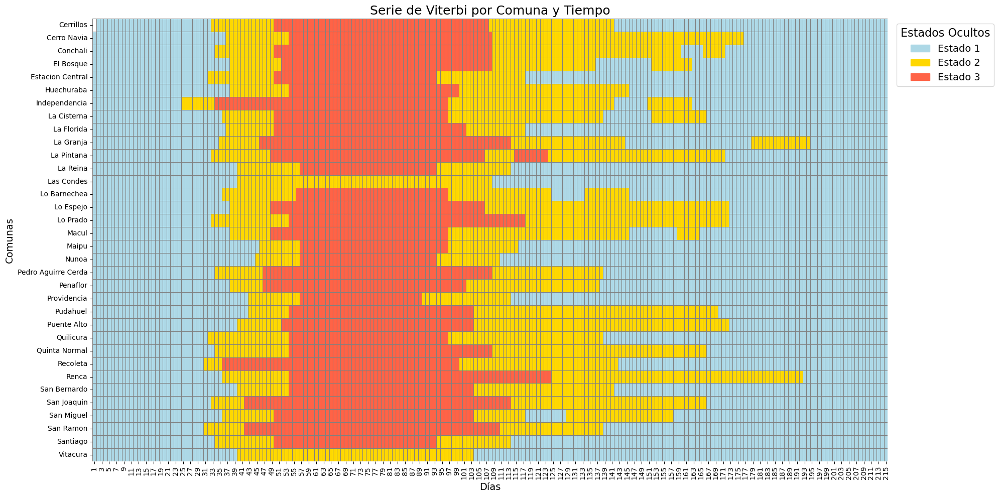

In [137]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# Crear el heatmap pivotando los datos
viterbi_pivot = viterbi_merged.pivot(index='Comuna', columns='dias', values='state')

# Definir los colores personalizados para cada estado
# Definir colores pastel
custom_colors = ['#ADD8E6',  # Light Blue (Leve)
                 '#FFD700',  # Gold (Moderado)
                 '#FF6347']  # Tomato (Severo)

# Crear el mapeo para los estados
custom_palette = dict(zip([1, 2, 3], custom_colors))




# Crear el heatmap sin la barra de color (cbar=False)
plt.figure(figsize=(20, 10))
sns.heatmap(
    viterbi_pivot,
    cmap=custom_colors,  # Usar los colores personalizados
    linewidths=0.5,
    linecolor='gray',
    cbar=False  # Desactivar la barra de color
)

# Crear una leyenda personalizada
legend_labels = ['Estado 1', 'Estado 2', 'Estado 3']  # Etiquetas para los estados
legend_handles = [mpatches.Patch(color=color, label=label) for color, label in zip(custom_colors, legend_labels)]

# Añadir la leyenda más cerca
plt.legend(
    handles=legend_handles, 
    title="Estados Ocultos", 
    bbox_to_anchor=(1.005, 1),  # Acercar aún más la leyenda al gráfico
    loc='upper left',          # Mantener la posición superior izquierda
    fontsize=14,               # Tamaño de fuente de las etiquetas
    title_fontsize=16          # Tamaño de fuente del título de la leyenda
)

# Títulos y etiquetas
plt.title('Serie de Viterbi por Comuna y Tiempo', fontsize=18)
plt.xlabel('Días', fontsize=14)
plt.ylabel('Comunas', fontsize=14)

# Ajustar el espaciado para evitar bordes innecesarios
plt.tight_layout()

# Mostrar el gráfico
plt.show()


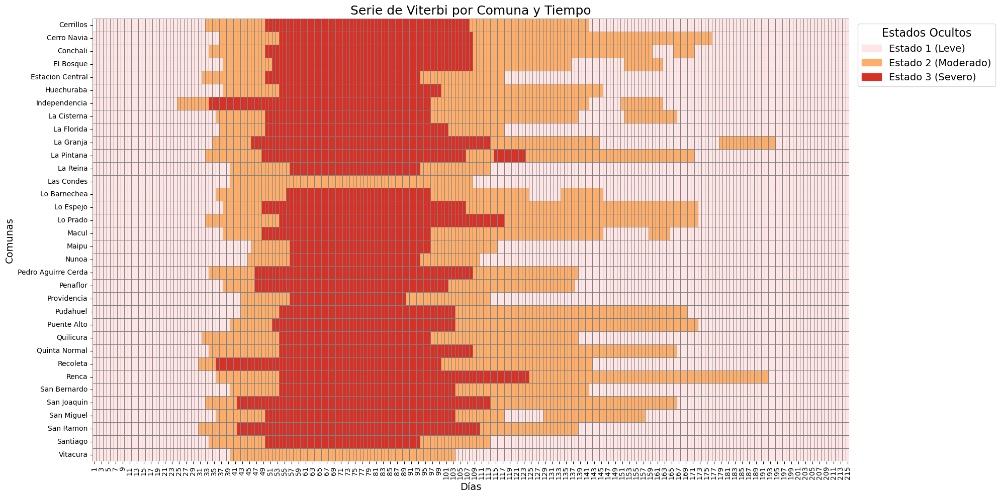

In [138]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# Crear el heatmap pivotando los datos
viterbi_pivot = viterbi_merged.pivot(index='Comuna', columns='dias', values='state')

# Definir colores personalizados para cada estado
# Ajuste de colores: Leve (más claro), Moderado (amarillo-naranja), Severo (rojo oscuro)
custom_colors = ['#FEE6E6',  # Rosa claro (Leve)
                 '#FDAE6B',  # Naranja claro (Moderado)
                 '#D73027']  # Rojo oscuro (Severo)

# Crear el mapeo para los estados
custom_palette = dict(zip([1, 2, 3], custom_colors))

# Crear el heatmap sin la barra de color (cbar=False)
plt.figure(figsize=(20, 10))
sns.heatmap(
    viterbi_pivot,
    cmap=custom_colors,  # Usar los colores personalizados
    linewidths=0.5,
    linecolor='gray',
    cbar=False  # Desactivar la barra de color
)

# Crear una leyenda personalizada
legend_labels = ['Estado 1 (Leve)', 'Estado 2 (Moderado)', 'Estado 3 (Severo)']  # Etiquetas para los estados
legend_handles = [mpatches.Patch(color=color, label=label) for color, label in zip(custom_colors, legend_labels)]

# Añadir la leyenda más cerca
plt.legend(
    handles=legend_handles, 
    title="Estados Ocultos", 
    bbox_to_anchor=(1.005, 1),  # Acercar aún más la leyenda al gráfico
    loc='upper left',          # Mantener la posición superior izquierda
    fontsize=14,               # Tamaño de fuente de las etiquetas
    title_fontsize=16          # Tamaño de fuente del título de la leyenda
)

# Títulos y etiquetas
plt.title('Serie de Viterbi por Comuna y Tiempo', fontsize=18)
plt.xlabel('Días', fontsize=14)
plt.ylabel('Comunas', fontsize=14)

# Ajustar el espaciado para evitar bordes innecesarios
plt.tight_layout()

# Mostrar el gráfico
plt.show()


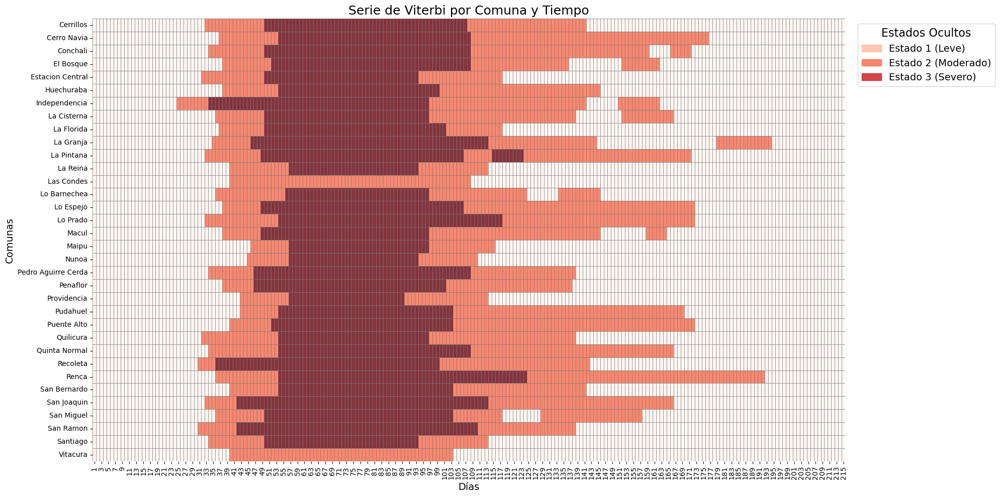

In [139]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# Crear el heatmap pivotando los datos
viterbi_pivot = viterbi_merged.pivot(index='Comuna', columns='dias', values='state')

# Definir los colores personalizados para el colormap `Reds`
colormap = sns.color_palette("Reds", 3)

# Crear el heatmap con transparencia
plt.figure(figsize=(20, 10))
ax = sns.heatmap(
    viterbi_pivot,
    cmap="Reds",  # Usar paleta de rojos
    linewidths=0.5,
    linecolor='gray',
    alpha=0.8,  # Nivel de transparencia
    cbar=False  # Desactivar barra de color
)

# Crear una leyenda personalizada
legend_labels = ['Estado 1 (Leve)', 'Estado 2 (Moderado)', 'Estado 3 (Severo)']
legend_handles = [
    mpatches.Patch(color=colormap[0], alpha=0.8, label='Estado 1 (Leve)'),
    mpatches.Patch(color=colormap[1], alpha=0.8, label='Estado 2 (Moderado)'),
    mpatches.Patch(color=colormap[2], alpha=0.8, label='Estado 3 (Severo)'),
]

# Añadir la leyenda
plt.legend(
    handles=legend_handles,
    title="Estados Ocultos",
    bbox_to_anchor=(1.01, 1),
    loc='upper left',
    fontsize=14,
    title_fontsize=16
)

# Títulos y etiquetas
plt.title('Serie de Viterbi por Comuna y Tiempo', fontsize=18)
plt.xlabel('Días', fontsize=14)
plt.ylabel('Comunas', fontsize=14)

# Ajustar el espaciado
plt.tight_layout()

# Mostrar el gráfico
plt.show()


In [140]:
base_final.columns

Index(['index', 'IM_interno', 'IM_externo', 'inc_pc_comuna',
       'TasaCasosAcumulados', 'Personas_hogar_promedio', 'inmigrantes',
       'total_hog_hacinados', 'indic_precariedad_vivienda', 'Comuna', 'fecha',
       'dias', 'por_educ_sup', 'porc_postgrado', 'IPS_2020', 'Prioridad_2020',
       'CODIGO', 'year', 'month', 'paso', 'paso_etiqueta',
       'Fecha inicio cuarentena', 'Fecha término cuarentena',
       'Casos_Diarios_Brutos', 'Casos_Diarios_Brutos_MM7'],
      dtype='object')

In [141]:
# Asegurarte de que viterbi_df y base_final existen y están correctamente alineados
print(viterbi_df.head())  # Verifica que tiene las columnas 'Index' y 'Estado'
print(base_final.head())  # Verifica las columnas disponibles para merge

# Crear el DataFrame combinado nuevamente
viterbi_combined = viterbi_df.merge(
    base_final,
    left_on='Index',
    right_index=True,  # Usamos el índice de base_final para el merge
    how='inner'        # Inner para asegurarnos de que solo tomamos valores comunes
)

# Inspeccionar el DataFrame combinado
print(viterbi_combined.head())
print(viterbi_combined.columns)


   state        S1        S2            S3  Index
1    1.0  1.000000  0.000000  0.000000e+00      1
2    1.0  0.999555  0.000445  5.605360e-11      2
3    1.0  0.999547  0.000453  2.797046e-08      3
4    1.0  0.999391  0.000608  1.307242e-07      4
5    1.0  0.998955  0.001045  2.530570e-08      5
   index  IM_interno  IM_externo  inc_pc_comuna  TasaCasosAcumulados  \
0      0    1.918137    7.524704      267197.56             0.000000   
1      1    1.970381    7.804008      267197.56             2.248303   
2      2    1.845790    7.471452      267197.56             4.496605   
3      3    1.678598    6.891732      267197.56             4.496605   
4      4    1.736766    8.317872      267197.56             4.496605   

   Personas_hogar_promedio  inmigrantes  total_hog_hacinados  \
0                 3.145581         3606                68120   
1                 3.145581         3606                68120   
2                 3.145581         3606                68120   
3          

In [142]:
viterbi_combined.columns

Index(['state', 'S1', 'S2', 'S3', 'Index', 'index', 'IM_interno', 'IM_externo',
       'inc_pc_comuna', 'TasaCasosAcumulados', 'Personas_hogar_promedio',
       'inmigrantes', 'total_hog_hacinados', 'indic_precariedad_vivienda',
       'Comuna', 'fecha', 'dias', 'por_educ_sup', 'porc_postgrado', 'IPS_2020',
       'Prioridad_2020', 'CODIGO', 'year', 'month', 'paso', 'paso_etiqueta',
       'Fecha inicio cuarentena', 'Fecha término cuarentena',
       'Casos_Diarios_Brutos', 'Casos_Diarios_Brutos_MM7'],
      dtype='object')

In [143]:
viterbi_combined.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7309 entries, 1 to 7309
Data columns (total 30 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   state                       7309 non-null   float64       
 1   S1                          7309 non-null   float64       
 2   S2                          7309 non-null   float64       
 3   S3                          7309 non-null   float64       
 4   Index                       7309 non-null   int32         
 5   index                       7309 non-null   int32         
 6   IM_interno                  7309 non-null   float64       
 7   IM_externo                  7309 non-null   float64       
 8   inc_pc_comuna               7309 non-null   float64       
 9   TasaCasosAcumulados         7309 non-null   float64       
 10  Personas_hogar_promedio     7309 non-null   float64       
 11  inmigrantes                 7309 non-null   int64         
 1

## EDA por Estados Ocultos
- Estado 1: Contagio Leve (azul)
- Estado 2: Contagio Moderado (amarillo)
- Estado 3: Contagio Severo (Rojo)

In [144]:
viterbi_merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7309 entries, 0 to 7308
Data columns (total 30 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   state                       7309 non-null   float64       
 1   S1                          7309 non-null   float64       
 2   S2                          7309 non-null   float64       
 3   S3                          7309 non-null   float64       
 4   Index                       7309 non-null   int32         
 5   index                       7309 non-null   int32         
 6   IM_interno                  7309 non-null   float64       
 7   IM_externo                  7309 non-null   float64       
 8   inc_pc_comuna               7309 non-null   float64       
 9   TasaCasosAcumulados         7309 non-null   float64       
 10  Personas_hogar_promedio     7309 non-null   float64       
 11  inmigrantes                 7309 non-null   int64       

In [145]:
# Seleccionar las columnas necesarias
eda_data = viterbi_merged[['state', 'IM_interno', 'IM_externo', 'TasaCasosAcumulados', 
                             'Casos_Diarios_Brutos', 'Casos_Diarios_Brutos_MM7', 
                             'inc_pc_comuna', 'Personas_hogar_promedio', 
                             'inmigrantes', 'total_hog_hacinados',
                             'indic_precariedad_vivienda', 'por_educ_sup', 'IPS_2020']]


# Resumen estadístico por estado
summary_by_state = eda_data.groupby('state').describe()

print("Resumen estadístico por estado:")
print(summary_by_state)

Resumen estadístico por estado:
      IM_interno                                                              \
           count      mean       std       min       25%       50%       75%   
state                                                                          
1.0       3618.0  4.189450  2.377113  0.544551  2.428222  3.722932  5.307930   
2.0       1976.0  3.185046  1.571429  0.448905  2.028078  2.901681  3.895608   
3.0       1715.0  2.616502  1.171933  0.403075  1.671291  2.409299  3.365982   

                 IM_externo            ... por_educ_sup       IPS_2020  \
             max      count      mean  ...          75%   max    count   
state                                  ...                               
1.0    13.124657     3618.0  5.970157  ...         37.5  59.7   3618.0   
2.0     9.075400     1976.0  5.248230  ...         21.3  59.7   1976.0   
3.0     7.512220     1715.0  4.669041  ...         18.9  59.7   1715.0   

                                          

In [146]:
# Seleccionar las columnas necesarias
eda_data = viterbi_combined[['state', 'IM_interno', 'IM_externo', 'TasaCasosAcumulados', 
                             'Casos_Diarios_Brutos', 'Casos_Diarios_Brutos_MM7', 
                             'inc_pc_comuna', 'Personas_hogar_promedio', 
                             'inmigrantes', 'total_hog_hacinados',
                             'indic_precariedad_vivienda', 'por_educ_sup', 'IPS_2020']]


# Resumen estadístico por estado
summary_by_state = eda_data.groupby('state').describe()

print("Resumen estadístico por estado:")
print(summary_by_state)

Resumen estadístico por estado:
      IM_interno                                                              \
           count      mean       std       min       25%       50%       75%   
state                                                                          
1.0       3618.0  4.189450  2.377113  0.544551  2.428222  3.722932  5.307930   
2.0       1976.0  3.185046  1.571429  0.448905  2.028078  2.901681  3.895608   
3.0       1715.0  2.616502  1.171933  0.403075  1.671291  2.409299  3.365982   

                 IM_externo            ... por_educ_sup       IPS_2020  \
             max      count      mean  ...          75%   max    count   
state                                  ...                               
1.0    13.124657     3618.0  5.970157  ...         37.5  59.7   3618.0   
2.0     9.075400     1976.0  5.248230  ...         21.3  59.7   1976.0   
3.0     7.512220     1715.0  4.669041  ...         18.9  59.7   1715.0   

                                          

In [147]:
summary_by_state

IM_interno                                                              \
           count      mean       std       min       25%       50%       75%   
state                                                                          
1.0       3618.0  4.189450  2.377113  0.544551  2.428222  3.722932  5.307930   
2.0       1976.0  3.185046  1.571429  0.448905  2.028078  2.901681  3.895608   
3.0       1715.0  2.616502  1.171933  0.403075  1.671291  2.409299  3.365982   

                 IM_externo            ... por_educ_sup       IPS_2020  \
             max      count      mean  ...          75%   max    count   
state                                  ...                               
1.0    13.124657     3618.0  5.970157  ...         37.5  59.7   3618.0   
2.0     9.075400     1976.0  5.248230  ...         21.3  59.7   1976.0   
3.0     7.512220     1715.0  4.669041  ...         18.9  59.7   1715.0   

                                                                
            mean        std    min    25%    50%    75%    max  
state                                                           
1.0    60.277001  21.628358   7.94  55.20  67.64  75.73  89.29  
2.0    65.194626  20.292690   7.94  57.63  71.67  76.87  89.29  
3.0    69.511411  13.959092  24.91  64.22  72.85  77.29  89.29  

[3 rows x 96 columns]

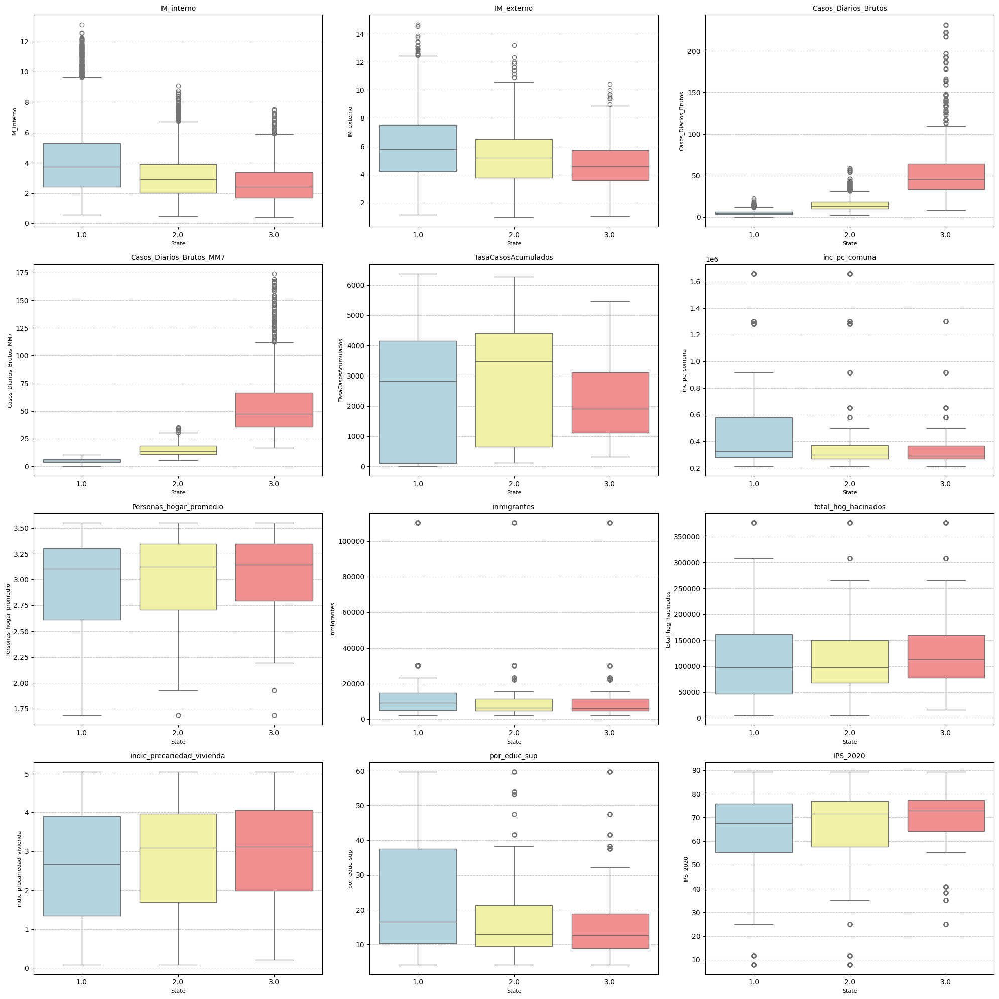

In [148]:
import seaborn as sns
import matplotlib.pyplot as plt

# Convertir la columna 'state' a cadenas con formato flotante
eda_data.loc[:, 'state'] = eda_data['state'].astype(str)

# Definir la paleta de colores basada en severidad
custom_palette = {
    '1.0': '#ADD8E6',  # Azul claro (leve)
    '2.0': '#FFFF99',  # Amarillo pastel (moderado)
    '3.0': '#FF7F7F'   # Rojo claro (severo)
}

# Variables que queremos graficar
variables = ['IM_interno', 'IM_externo', 'Casos_Diarios_Brutos', 'Casos_Diarios_Brutos_MM7',
             'TasaCasosAcumulados', 'inc_pc_comuna', 'Personas_hogar_promedio', 
             'inmigrantes', 'total_hog_hacinados', 'indic_precariedad_vivienda',
             'por_educ_sup', 'IPS_2020']

# Configuración de la figura
n_rows = 4  # Número de filas
n_cols = 3  # Número de columnas
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 20))  # Ajusta el tamaño total

# Aplanar los ejes para iterar más fácilmente
axes = axes.ravel()

# Crear los boxplots para cada variable
for i, var in enumerate(variables):
    sns.boxplot(data=eda_data, x='state', y=var, hue='state', palette=custom_palette, ax=axes[i], dodge=False)
    axes[i].set_title(f'{var}', fontsize=10)
    axes[i].set_xlabel('State', fontsize=8)
    axes[i].set_ylabel(var, fontsize=8)
    axes[i].grid(axis='y', linestyle='--', alpha=0.7)

# Eliminar cualquier subplot sobrante si hay más ejes que gráficos
for j in range(len(variables), len(axes)):
    fig.delaxes(axes[j])

# Ajustar el espacio entre subplots
plt.tight_layout()
plt.show()



*Instrucción ChatGPT: Quiero hacer otra cosa ahora. Podrías hacer un conteo de cuánto estuvo en cada estado cada comuna, para hacer una estadística descriptiva de eso, cosa de poner ver si las que estuvieron más tiempo en el color azul que sería más casos, tienen características específicas como de pobreza, etc.* 

Paso 1: Conteo de días en cada estado por comuna

El siguiente código agrupa los datos por comuna y estado para calcular cuántos días estuvo cada comuna en cada estado:

In [149]:
# Crear una tabla con los días que cada comuna estuvo en cada estado
conteo_estados = viterbi_merged.groupby(['Comuna', 'state']).size().reset_index(name='Días_en_estado')

# Mostrar el resultado
print("Conteo de días en cada estado por comuna:")
print(conteo_estados)


Conteo de días en cada estado por comuna:
         Comuna  state  Días_en_estado
0     Cerrillos    1.0             105
1     Cerrillos    2.0              51
2     Cerrillos    3.0              58
3   Cerro Navia    1.0              75
4   Cerro Navia    2.0              85
..          ...    ...             ...
95     Santiago    1.0             135
96     Santiago    2.0              36
97     Santiago    3.0              44
98     Vitacura    1.0             151
99     Vitacura    2.0              64

[100 rows x 3 columns]


In [150]:
viterbi_merged.columns

Index(['state', 'S1', 'S2', 'S3', 'Index', 'index', 'IM_interno', 'IM_externo',
       'inc_pc_comuna', 'TasaCasosAcumulados', 'Personas_hogar_promedio',
       'inmigrantes', 'total_hog_hacinados', 'indic_precariedad_vivienda',
       'Comuna', 'fecha', 'dias', 'por_educ_sup', 'porc_postgrado', 'IPS_2020',
       'Prioridad_2020', 'CODIGO', 'year', 'month', 'paso', 'paso_etiqueta',
       'Fecha inicio cuarentena', 'Fecha término cuarentena',
       'Casos_Diarios_Brutos', 'Casos_Diarios_Brutos_MM7'],
      dtype='object')

In [151]:
# Calcular promedios por estado y comuna
promedios_estado_comuna = (
    viterbi_merged.groupby(['state', 'Comuna']).agg({
        'IM_interno': 'mean',
        'IM_externo': 'mean',
        'TasaCasosAcumulados': 'mean',
        'Casos_Diarios_Brutos': 'mean',
        'Casos_Diarios_Brutos_MM7': 'mean',
        'inc_pc_comuna': 'mean',
        'Personas_hogar_promedio': 'mean',
        'inmigrantes': 'mean',
        'total_hog_hacinados': 'mean',
        'indic_precariedad_vivienda': 'mean',
        'por_educ_sup': 'mean',
        'IPS_2020': 'mean'
    }).reset_index()
)

# Combinar con el conteo de días en cada estado
conteo_estados_caracteristicas= conteo_estados.merge(
    promedios_estado_comuna,
    on=['state', 'Comuna']
)

# Inspeccionar el DataFrame combinado actualizado
print("Datos combinados actualizados de tiempo en estados y características por comuna:")
print(conteo_estados_caracteristicas.head())


Datos combinados actualizados de tiempo en estados y características por comuna:
        Comuna  state  Días_en_estado  IM_interno  IM_externo  \
0    Cerrillos    1.0             105    2.454349    8.899063   
1    Cerrillos    2.0              51    2.104635    8.157416   
2    Cerrillos    3.0              58    1.817600    6.867895   
3  Cerro Navia    1.0              75    2.199595    7.652362   
4  Cerro Navia    2.0              85    2.370871    7.486827   

   TasaCasosAcumulados  Casos_Diarios_Brutos  Casos_Diarios_Brutos_MM7  \
0          2656.765571              5.331689                  5.142954   
1          2348.528332             15.165021                 15.379145   
2          1903.129947             44.869141                 44.996508   
3          2727.696861              4.314510                  4.043388   
4          3818.349605             15.351552                 14.808886   

   inc_pc_comuna  Personas_hogar_promedio  inmigrantes  total_hog_hacinados  \
0   

In [152]:
import numpy as np

# Crear promedios ponderados por días en estado
estadisticas_estado_ponderadas = conteo_estados_caracteristicas.groupby('state').apply(
    lambda x: pd.Series({
        'Días_mean': x['Días_en_estado'].mean(),
        'Días_std': x['Días_en_estado'].std(),
        'Días_min': x['Días_en_estado'].min(),
        'Días_max': x['Días_en_estado'].max(),
        'IM_interno_mean': np.average(x['IM_interno'], weights=x['Días_en_estado']),
        'IM_externo_mean': np.average(x['IM_externo'], weights=x['Días_en_estado']),
        'inc_pc_comuna_mean': np.average(x['inc_pc_comuna'], weights=x['Días_en_estado']),
        'TasaCasosAcumulados_mean': np.average(x['TasaCasosAcumulados'], weights=x['Días_en_estado']),
        'Casos_Diarios_Brutos_mean': np.average(x['Casos_Diarios_Brutos'], weights=x['Días_en_estado']),
        'Casos_Diarios_Brutos_MM7_mean': np.average(x['Casos_Diarios_Brutos_MM7'], weights=x['Días_en_estado']),
        'Personas_hogar_promedio_mean': np.average(x['Personas_hogar_promedio'], weights=x['Días_en_estado']),
        'inmigrantes_mean': np.average(x['inmigrantes'], weights=x['Días_en_estado']),
        'total_hog_hacinados_mean': np.average(x['total_hog_hacinados'], weights=x['Días_en_estado']),
        'indic_precariedad_vivienda_mean': np.average(x['indic_precariedad_vivienda'], weights=x['Días_en_estado']),
        'por_educ_sup_mean': np.average(x['por_educ_sup'], weights=x['Días_en_estado']),
        'IPS_2020_mean': np.average(x['IPS_2020'], weights=x['Días_en_estado']),
    })
).reset_index()

# Mostrar los resultados
print("Resumen estadístico ponderado por estado:")
print(estadisticas_estado_ponderadas)


Resumen estadístico ponderado por estado:
   state   Días_mean  Días_std  Días_min  Días_max  IM_interno_mean  \
0    1.0  106.411765  25.38804      58.0     151.0         4.189450   
1    2.0   58.117647  16.92007      29.0      86.0         3.185046   
2    3.0   53.593750  10.63427      33.0      72.0         2.616502   

   IM_externo_mean  inc_pc_comuna_mean  TasaCasosAcumulados_mean  \
0         5.970157       516508.371545               2511.291283   
1         5.248230       436047.887100               2968.176546   
2         4.669041       365184.639464               2179.677452   

   Casos_Diarios_Brutos_mean  Casos_Diarios_Brutos_MM7_mean  \
0                   5.171221                       4.939484   
1                  15.348883                      15.092393   
2                  55.414911                      55.973802   

   Personas_hogar_promedio_mean  inmigrantes_mean  total_hog_hacinados_mean  \
0                      2.909242      14024.405196             114133

### Interpretación Importante

#### Estado 1 "Contagios Severos" (azul - centro)

Duración promedio días en estado: Las comunas pasan 57 días en promedio, con una desviación estándar de 15 días, lo que indica variabilidad moderada en su duración.

- Movilidad interna (IM_interno): Promedio de 2.71, la más baja entre los estados. Refleja que en situaciones de contagio severo, la movilidad interna tiende a ser más limitada.
- Movilidad externa (IM_externo): Promedio de 4.66, también el más bajo. 
- Tasa de casos acumulados (TasaCasosAcumulados): Promedio de 2,216.91
- Casos diarios brutos promedio: Promedio 51.77. Estos valores son altos y reflejan un crecimiento sostenido de casos durante este estado.
- Media móvil de 7 días (MM7): Promedio 52.29. Estos valores son altos y reflejan un crecimiento sostenido de casos durante este estado.
- Ingreso per cápita (inc_pc_comuna): Promedio de 385,986, el más bajo. Esto indica que las comunas con ingresos más bajos tienden a experimentar contagios severos.
- Personas por hogar: Promedio de 3.02, el más alto entre los estados. Esto podría estar relacionado con mayor transmisión en hogares donde viven más gente.
- Cantidad de inmigrantes: Promedio de 11,557, el más bajo de los tres estados.
- Hogares hacinados: Promedio de 123,708, el más alto. Esto confirma que comunas con mayor hacinamiento tienden a experimentar contagios severos.
- Índice de precariedad de vivienda: Promedio de 2.99, el más alto. Refuerza la asociación entre condiciones de vivienda precarias y contagios severos.
- Nivel educativo (por_educ_sup): Promedio de 17.03%, el más bajo. Comunas con menor porcentaje de población con educación superior experimentan más severidad en los contagios.
- Índice de prioridad social (IPS_2020): Promedio de 68.25, el más alto, reflejando mayor vulnerabilidad social.

Conclusión: Este estado se asocia con comunas vulnerables, de menor ingreso, alta densidad y alto hacinamiento, lo que podría facilitar una propagación grave de casos.

#### Estado 2 "Contagios Moderados" (rojo - medio)

Tiempo promedio en estado: Las comunas pasan 53.94 días en este estado, con una desviación estándar de 16 días. Esto muestra menor permanencia comparada con los otros estados.

- Movilidad interna (IM_interno): Promedio de 3.15, mayor que el estado 1. 
- Movilidad externa (IM_externo): Promedio de 5.35, también mayor que en el estado 1, pero menor que en el estado 3.
- Ingreso per cápita (inc_pc_comuna): Promedio de 424,786, un valor intermedio. Las comunas con ingresos moderados parecen estar asociadas con este estado.
- Tasa de casos acumulados (TasaCasosAcumulados): Promedio de 3,054.99, la más alta.
- Casos diarios brutos promedio: 13.76. Es mayor que el estado 3, pero considerablemente más bajo que el estado 1 severo.
- Media móvil de 7 días (MM7): 13.46. Es mayor que el estado 3, pero considerablemente más bajo que el estado 1 severo.
- Personas por hogar: Promedio de 3.00, ligeramente más bajo que en el estado 1.
- Cantidad de inmigrantes: Promedio de 11,285, similar al estado 1, pero aún bajo.
- Hogares hacinados: Promedio de 118,892, menor que en el estado 1 y mayor que el estado 3.
- Índice de precariedad de vivienda: Promedio de 2.86, menor que el estado 1 pero mayor que el estado 3. Esto sugiere que la precariedad de vivienda es menor en este estado. 
- Nivel educativo (por_educ_sup): Promedio de 18.42%, ligeramente mayor que en el estado 1. 
- Índice de prioridad social (IPS_2020): Promedio de 66.04, menor que en el estado 1. 

Conclusión: Este estado refleja comunas de características intermedias: ingresos moderados y menos hacinamiento en comparación con el estado 1, pero todavía vulnerables.

#### Estado 3 "Contagios Leves" (Verde - "Orillas")

Tiempo promedio en estado: Las comunas permanecen más tiempo aquí, con 102.70 días en promedio y una desviación estándar de 25 días.

- Movilidad interna (IM_interno): Promedio de 4.23, el más alto. Esto refleja mayor recuperación de la actividad interna.
- Movilidad externa (IM_externo): Promedio de 5.99, también el más alto. Comunas en este estado interactúan más con otras comunas.
- Ingreso per cápita (inc_pc_comuna): Promedio de 518,238, el más alto. Comunas con mayores recursos predominan en este estado.
- Tasa de casos acumulados (TasaCasosAcumulados): Promedio de 2,510.00, menor que en el estado 2. 
- Casos diarios brutos promedio: 5.14. Valores mucho más bajos en comparación con los otros estados.
- Media móvil de 7 días (MM7): 4.93. Valores mucho más bajos en comparación con los otros estados.
- Personas por hogar: Promedio de 2.91, el menor. 
- Cantidad de inmigrantes: Promedio de 13,896, el más alto. 
- Hogares hacinados: Promedio de 113,964, el menor. Mejores condiciones de vivienda en este estado.
- Índice de precariedad de vivienda: Promedio de 2.54, el más bajo. Esto refuerza la asociación entre mejores condiciones de vivienda y menor gravedad en los contagios.
- Nivel educativo (por_educ_sup): Promedio de 23.12%, el más alto. Comunas con mayor nivel educativo predominan.
- Índice de prioridad social (IPS_2020): Promedio de 60.08, el más bajo. Refleja menor vulnerabilidad social.

Conclusión: Este estado se caracteriza por tener mayor ingreso, menor densidad y mejores condiciones socioeconómicas. Las comunas con estas características permanecen más tiempo en este estado de menor gravedad de contagios.


Resumen General

- Estado 1 (Azul): Condiciones más vulnerables que favorecen la propagación grave de casos.
- Estado 2 (Rojo): Mejoras en ingresos y hacinamiento en comparación con el estado de contagios severos pero aún se observan condiciones de vulnerabilidad.
- Estado 3 (Verde): Se caracteriza por mayor ingreso y mayor nivel educacional, con menor densidad y vulnerabilidad.

Esta información refuerza que las condiciones socioeconómicas y de infraestructura son determinantes en el impacto de los casos diarios.

### Sugerencias Profe

In [153]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import MinMaxScaler

In [154]:
viterbi_merged.columns

Index(['state', 'S1', 'S2', 'S3', 'Index', 'index', 'IM_interno', 'IM_externo',
       'inc_pc_comuna', 'TasaCasosAcumulados', 'Personas_hogar_promedio',
       'inmigrantes', 'total_hog_hacinados', 'indic_precariedad_vivienda',
       'Comuna', 'fecha', 'dias', 'por_educ_sup', 'porc_postgrado', 'IPS_2020',
       'Prioridad_2020', 'CODIGO', 'year', 'month', 'paso', 'paso_etiqueta',
       'Fecha inicio cuarentena', 'Fecha término cuarentena',
       'Casos_Diarios_Brutos', 'Casos_Diarios_Brutos_MM7'],
      dtype='object')

In [155]:
# Calcular promedios por comuna dentro de cada estado
promedios_por_comuna_estado = (
    viterbi_merged.groupby(['state', 'Comuna']).agg({
        'IM_interno': 'mean',
        'IM_externo': 'mean',
        'TasaCasosAcumulados': 'mean',
        'Casos_Diarios_Brutos': 'mean',
        'Casos_Diarios_Brutos_MM7': 'mean',
        'Personas_hogar_promedio': 'mean',
        'total_hog_hacinados': 'mean',
        'inmigrantes': 'mean',
        'por_educ_sup': 'mean',
        'inc_pc_comuna': 'mean',
        'indic_precariedad_vivienda': 'mean',
        'IPS_2020': 'mean'
    }).reset_index()
)

print(promedios_por_comuna_estado.head())

   state            Comuna  IM_interno  IM_externo  TasaCasosAcumulados  \
0    1.0         Cerrillos    2.454349    8.899063          2656.765571   
1    1.0       Cerro Navia    2.199595    7.652362          2727.696861   
2    1.0          Conchali    3.203578    6.348157          2972.851209   
3    1.0         El Bosque    1.662883    4.746743          2657.209302   
4    1.0  Estacion Central    3.857748    7.326618          2412.614136   

   Casos_Diarios_Brutos  Casos_Diarios_Brutos_MM7  Personas_hogar_promedio  \
0              5.331689                  5.142954                 3.145581   
1              4.314510                  4.043388                 3.388747   
2              5.089506                  4.629356                 3.125893   
3              5.503876                  5.224753                 3.111096   
4              4.607108                  4.446059                 2.704998   

   total_hog_hacinados  inmigrantes  por_educ_sup  inc_pc_comuna  \
0           

In [156]:
# Paso 2: Normalizar IM_interno y TasaCasosAcumulados
scaler = MinMaxScaler()
promedios_por_comuna_estado['IM_interno_normalizado'] = scaler.fit_transform(promedios_por_comuna_estado[['IM_interno']])
promedios_por_comuna_estado['IM_externo_normalizado'] = scaler.fit_transform(promedios_por_comuna_estado[['IM_externo']])
promedios_por_comuna_estado['TasaCasosAcumulados_normalizado'] = scaler.fit_transform(promedios_por_comuna_estado[['TasaCasosAcumulados']])
promedios_por_comuna_estado['Casos_Diarios_Brutos_normalizado'] = scaler.fit_transform(promedios_por_comuna_estado[['Casos_Diarios_Brutos']])
promedios_por_comuna_estado['Casos_Diarios_Brutos_MM7_normalizado'] = scaler.fit_transform(promedios_por_comuna_estado[['Casos_Diarios_Brutos_MM7']])

## 1. Correlación de Casos Diarios Brutos con Movilidad Interna por cada Estado
- *Color de los puntos según el índice de precariedad de la vivienda.*
- *Tamaño de los puntos según índice per cápita comuna.*
- *Etiquetado por comuna.*

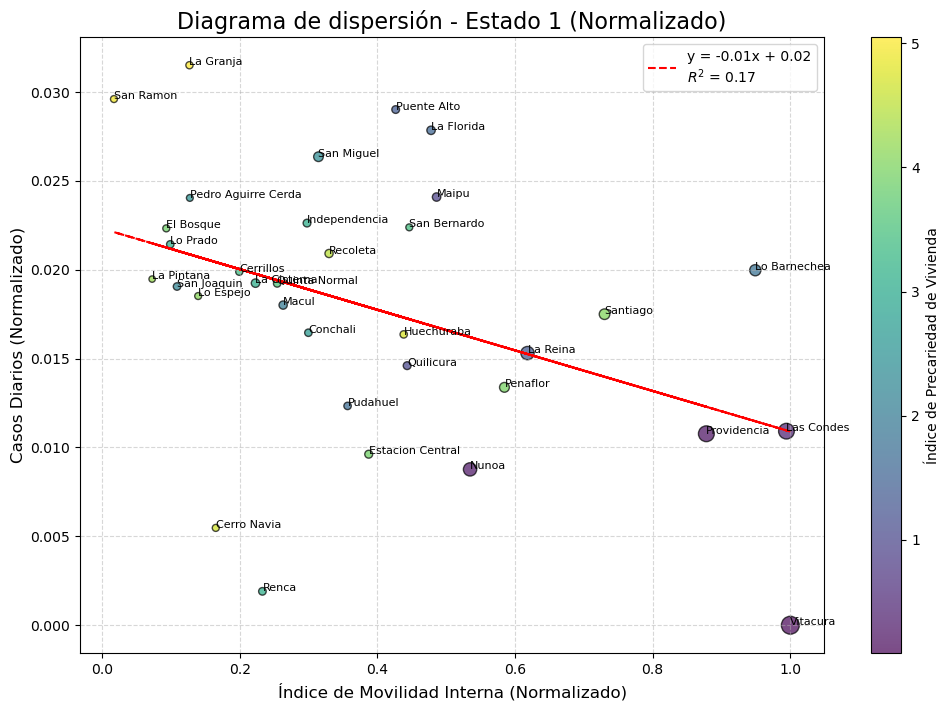

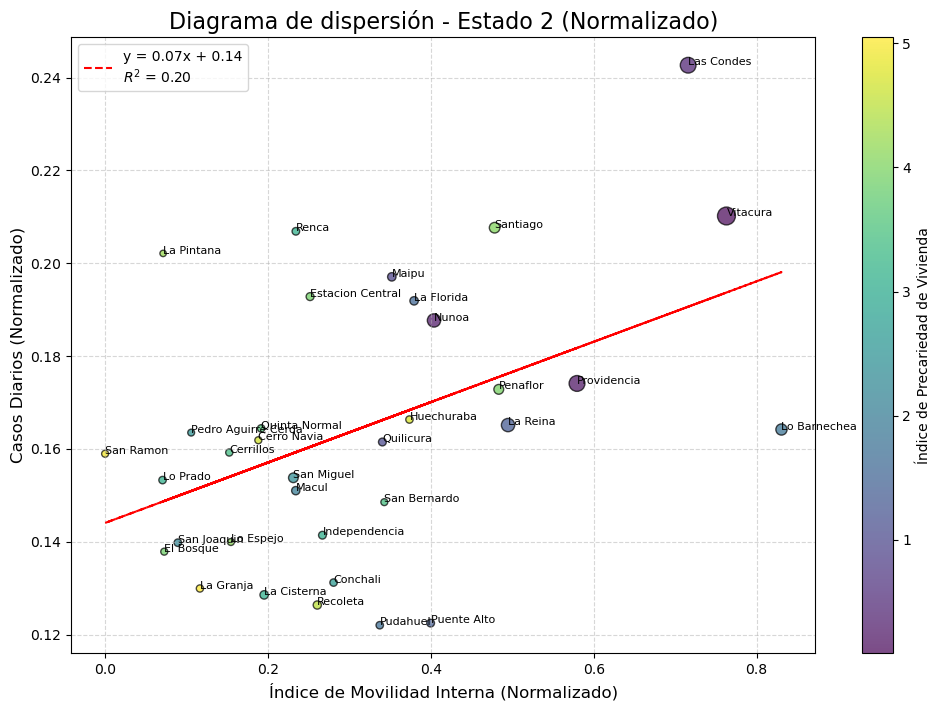

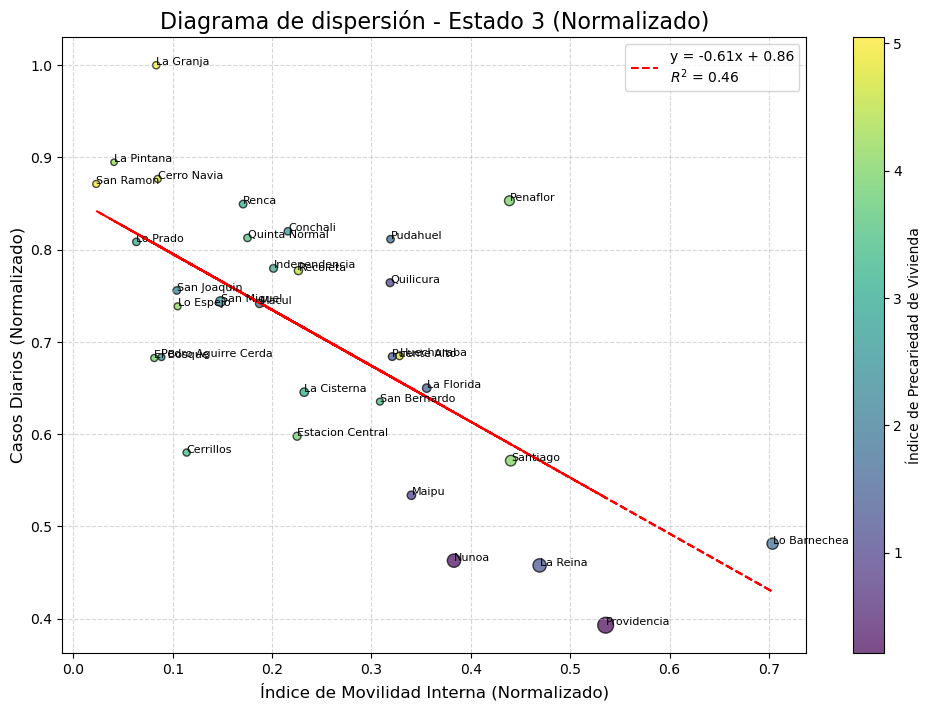

In [157]:
# Paso 3: Crear diagramas de dispersión para cada estado
for estado in promedios_por_comuna_estado['state'].unique():
    estado_data = promedios_por_comuna_estado[promedios_por_comuna_estado['state'] == estado]
    
    # Variables para el gráfico
    X = estado_data['IM_interno_normalizado'].values.reshape(-1, 1)
    Y = estado_data['Casos_Diarios_Brutos_normalizado'].values
    sizes = estado_data['inc_pc_comuna'].values / 10000  # Tamaño del punto
    colors = estado_data['indic_precariedad_vivienda'].values  # Color del punto
    
    # Ajustar una línea de regresión lineal
    model = LinearRegression()
    model.fit(X, Y)
    Y_pred = model.predict(X)
    
    # Calcular R^2
    r_squared = model.score(X, Y)
    equation = f"y = {model.coef_[0]:.2f}x + {model.intercept_:.2f}\n$R^2$ = {r_squared:.2f}"
    
    # Crear el gráfico
    plt.figure(figsize=(12, 8))
    scatter = plt.scatter(
        estado_data['IM_interno_normalizado'], estado_data['Casos_Diarios_Brutos_normalizado'], 
        s=sizes, c=colors, cmap='viridis', alpha=0.7, edgecolor='k'
    )
    
    # Agregar nombres de las comunas
    for i, row in estado_data.iterrows():
        plt.text(row['IM_interno_normalizado'], row['Casos_Diarios_Brutos_normalizado'], row['Comuna'], fontsize=8)
    
    # Agregar la línea de regresión
    plt.plot(X, Y_pred, color='red', linestyle='--', label=equation)
    
    # Configurar colorbar y etiquetas
    plt.colorbar(scatter, label='Índice de Precariedad de Vivienda')
    plt.title(f'Diagrama de dispersión - Estado {int(estado)} (Normalizado)', fontsize=16)
    plt.xlabel('Índice de Movilidad Interna (Normalizado)', fontsize=12)
    plt.ylabel('Casos Diarios (Normalizado)', fontsize=12)
    plt.legend(fontsize=10)
    
    # Mostrar el gráfico
    plt.grid(alpha=0.5, linestyle='--')
    plt.show()

### 1.1 Correlación de Casos Diarios Brutos con Movilidad Interna para Estado 1 "Contagios Severos"
- *Color de los puntos según el índice de precariedad de la vivienda.*
- *Tamaño de los puntos según índice per cápita comuna.*
- *Etiquetado por comuna.*

##### Interpretación del gráfico para el Estado 1 (contagios severos):

Relación entre movilidad interna y casos diarios (Línea de tendencia):
- La pendiente negativa de la recta indica que, en promedio, mayor movilidad interna está asociada con una disminución de los casos diarios.
- El coeficiente de determinación (R² = 0.61) sugiere que la movilidad interna explica un 61% de la variación en los casos diarios normalizados. Es una relación moderadamente fuerte.

Distribución de las comunas:
- Alta precariedad de vivienda: Comunas con altos valores de indic_precariedad_vivienda (color más claro) tienden a concentrarse en niveles más bajos de movilidad interna (extremo izquierdo del eje X) y valores más altos de casos diarios (arriba en el eje Y). Ejemplos: La Granja, La Pintana, Cerro Navia.
- Baja precariedad de vivienda: Comunas con índices de precariedad más bajos (color oscuro) y mayor ingreso per cápita (puntos grandes) tienen mayor movilidad interna (extremo derecho del eje X) y menor número de casos diarios. Ejemplos: Vitacura, Las Condes, Lo Barnechea.

Rol del ingreso per cápita:
- Comunas con mayor ingreso per cápita (puntos grandes) como Las Condes, Vitacura, tienen altos niveles de movilidad interna y baja precariedad de vivienda.
- Comunas con bajo ingreso per cápita (puntos pequeños) como Cerrillos, Lo Espejo, tienden a tener movilidad interna limitada y mayor número de casos diarios.

Casos diarios más altos:

- Comunas como La Granja, Cerro Navia tienen altos casos diarios normalizados. Estas comunas combinan movilidad interna limitada con alta precariedad de vivienda, lo que podría reflejar un entorno con menor capacidad para implementar medidas efectivas de control.

Casos diarios más bajos:

- Comunas como Las Condes, Vitacura muestran bajos casos diarios normalizados. Estas comunas tienen alta movilidad interna, baja precariedad de vivienda y altos ingresos per cápita.

### 1.2 Correlación de Casos Diarios Brutos con Movilidad Interna para Estado 2 "Contagios Moderados"
- *Color de los puntos según el índice de precariedad de la vivienda.*
- *Tamaño de los puntos según índice per cápita comuna.*
- *Etiquetado por comuna.*

##### Interpretación del gráfico para el Estado 2 (contagios moderados):

Relación entre la movilidad interna y los casos diarios normalizados (línea de tendencia):
- Pendiente positiva (0.05): Existe una relación positiva débil entre el índice de movilidad interna (IM_interno) y los casos diarios normalizados. Esto sugiere que, en promedio, mayor movilidad interna tiende a estar asociada con un aumento en los casos diarios.
- R² = 0.15: El coeficiente de determinación (R²) indica que el modelo lineal explica solo el 15% de la varianza en los casos diarios normalizados. Esto significa que hay otros factores importantes, además de la movilidad interna, que influyen en los casos diarios para este estado.

Distribución por comunas (movilidad y casos diarios):
- Comunidades con alta movilidad interna y menor precariedad: Comunas como Vitacura, Las Condes, Lo Barnechea, y Providencia están hacia el extremo derecho del eje X (mayor IM_interno) y presentan valores relativamente altos en el índice de ingresos per cápita (reflejado en el tamaño de los puntos) y menores índices de precariedad de vivienda (color más púrpura).
Estas comunas muestran casos diarios moderados, indicando que, aunque tienen mayor movilidad interna, las condiciones socioeconómicas podrían estar amortiguando el impacto en los contagios.
- Comunidades con menor movilidad interna: Comunas como San Ramón, El Bosque, y Pedro Aguirre Cerda, ubicadas en el extremo izquierdo del eje X, muestran bajos niveles de movilidad interna (IM_interno). A pesar de esto, algunas tienen índices de precariedad más altos (color verdoso), lo que podría estar relacionado con mayores vulnerabilidades socioeconómicas.

Ingreso per cápita (tamaño del punto):
- Las comunas con mayor ingreso per cápita, como Vitacura, Las Condes, y Lo Barnechea, tienen los puntos más grandes. Estas comunas parecen estar menos afectadas en términos de casos diarios a pesar de su alta movilidad.
- En contraste, comunas como San Ramón, La Granja, y Cerro Navia tienen puntos más pequeños (menor ingreso per cápita), y su precariedad de vivienda tiende a ser mayor (color más verdoso).

Índice de precariedad de vivienda (color del punto):
- Las comunas con mayor índice de precariedad, como Cerro Navia y La Granja, presentan colores verdosos y se concentran en el rango de menor movilidad interna. Estas comunas pueden ser más vulnerables debido a sus condiciones socioeconómicas, lo que puede dificultar el control de los contagios. 

Observaciones adicionales:

A diferencia del Estado 1 (contagios severos), aquí la relación entre movilidad y casos no es tan marcada (menor pendiente). Esto sugiere que, en contextos de contagio moderado, otros factores como la densidad poblacional, las medidas sanitarias, y las características sociodemográficas podrían tener un peso mayor en los niveles de casos.

Comunas como San Joaquín, Conchalí, y Recoleta, que están cerca del centro del gráfico, parecen tener un equilibrio entre movilidad interna y casos diarios, con índices de precariedad intermedios.

### 1.3 Correlación de Casos Diarios Brutos con Movilidad Interna para Estado 3 "Contagios Leves"
- *Color de los puntos según el índice de precariedad de la vivienda.*
- *Tamaño de los puntos según índice per cápita comuna.*
- *Etiquetado por comuna.*

##### Interpretación del gráfico para el Estado 3 (contagios leves):

Relación entre movilidad interna y casos diarios normalizados (línea de tendencia):
- Pendiente negativa (-0.01): Existe una relación ligeramente negativa entre el índice de movilidad interna y los casos diarios normalizados. Esto indica que, en promedio, mayor movilidad interna se asocia con una leve disminución en los casos diarios.
- R² = 0.17: El coeficiente de determinación (R²) muestra que solo el 17% de la varianza en los casos diarios normalizados se explica por la movilidad interna. Esto sugiere que, para las comunas en este estado de contagios leves, otros factores como medidas sanitarias, densidad poblacional, o características específicas de las comunas tienen un rol más relevante.

Distribución por comunas (movilidad y casos diarios):
- Comunidades con alta movilidad interna y menor precariedad: Comunas como Vitacura, Las Condes, Providencia, y Lo Barnechea están en el extremo derecho del eje X (alta movilidad interna). Estas comunas tienen un menor índice de precariedad de vivienda (color púrpura) y presentan los valores más bajos de casos diarios normalizados.
Esto podría reflejar una mejor capacidad para implementar medidas sanitarias o una menor densidad poblacional.
- Comunidades con baja movilidad interna: Comunas como San Ramón, Pedro Aguirre Cerda, y El Bosque tienen baja movilidad interna y colores más verdosos (mayor índice de precariedad de vivienda). Aunque están en el extremo izquierdo del gráfico, sus casos diarios son ligeramente más altos que las comunas con mayor movilidad y menor precariedad.

Ingreso per cápita (tamaño del punto):
- Comunas como Vitacura, Las Condes, y Lo Barnechea tienen puntos más grandes, reflejando un mayor ingreso per cápita. Estas comunas también tienen los valores más bajos de casos diarios y alta movilidad interna.
- Comunas con menores ingresos, como San Ramón, Renca, y La Pintana, tienen puntos más pequeños y se concentran hacia la parte superior del gráfico, indicando una mayor proporción de casos diarios normalizados.

Índice de precariedad de vivienda (color del punto):
- Comunas con mayor índice de precariedad, como San Ramón, La Granja, y Cerro Navia, tienen colores verdosos y presentan casos diarios moderadamente más altos.
- Las comunas con menor índice de precariedad, como Vitacura y Las Condes, tienen colores púrpuras y valores más bajos de casos diarios.

Observaciones adicionales:

La relación negativa (aunque leve) entre movilidad interna y casos diarios podría reflejar que las comunas con mayor movilidad en este estado tienen menos densidad poblacional y mejores condiciones socioeconómicas, lo que ayuda a mitigar los contagios.

Comunas con alta precariedad y bajo ingreso (como San Ramón, La Granja, y Pedro Aguirre Cerda) parecen tener un desafío mayor en mantener los contagios bajos, incluso con niveles más reducidos de movilidad.

## 2. Correlación de Casos Diarios Brutos con Movilidad Externa por cada Estado
- *Color de los puntos según el índice de precariedad de la vivienda.*
- *Tamaño de los puntos según índice per cápita comuna.*
- *Etiquetado por comuna.*

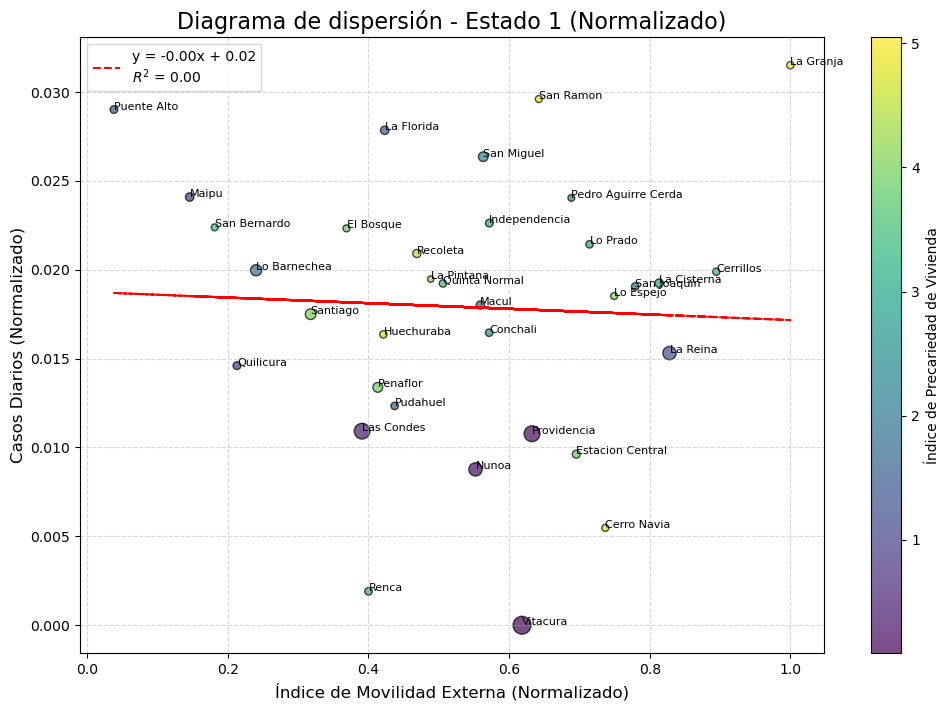

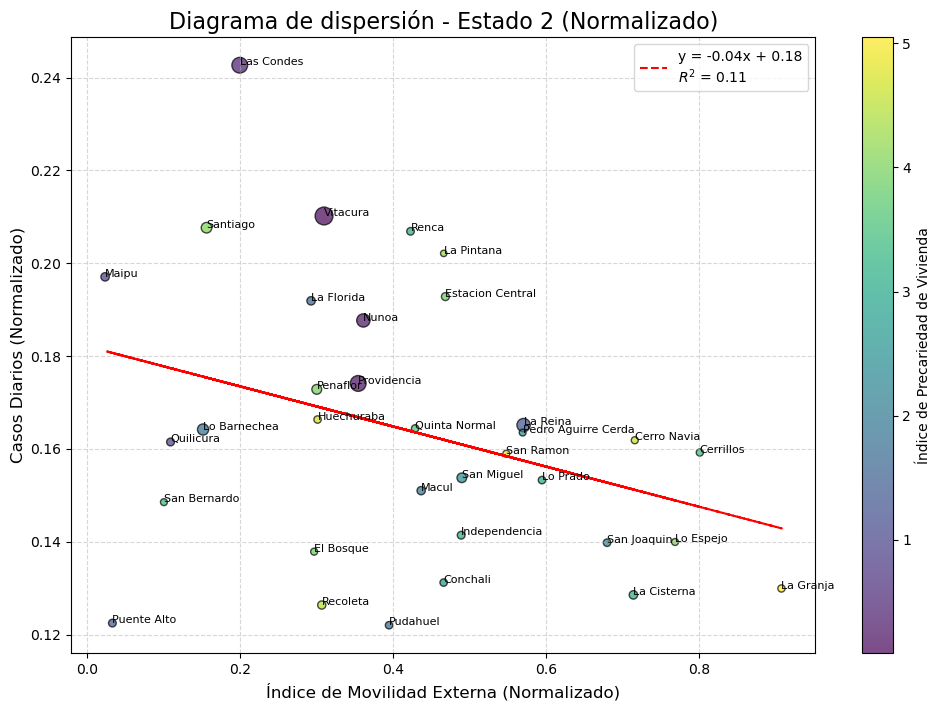

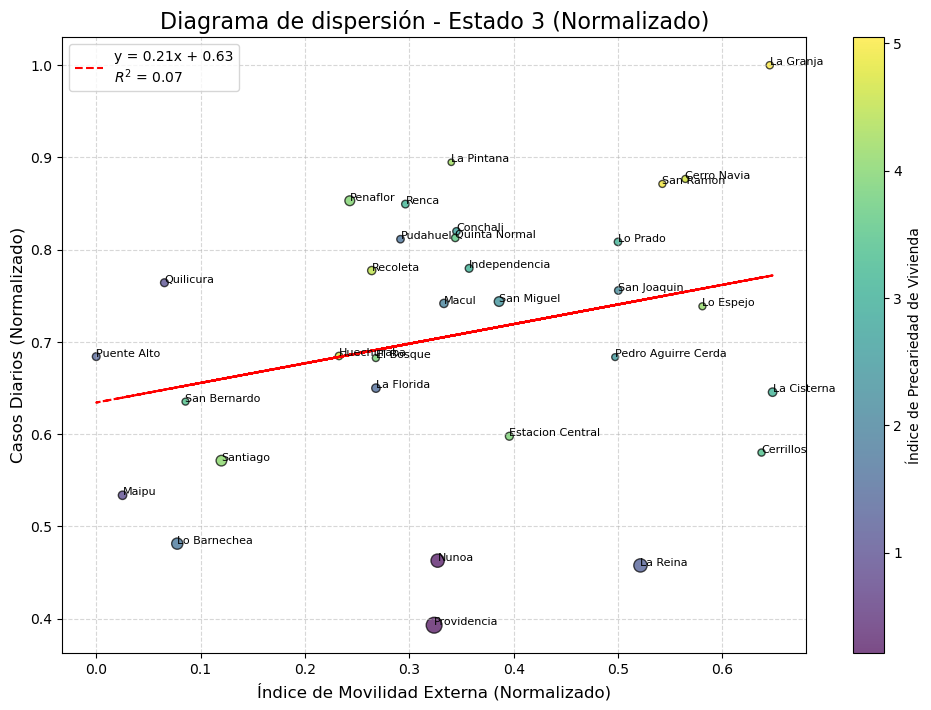

In [158]:
# Paso 3: Crear diagramas de dispersión para cada estado
for estado in promedios_por_comuna_estado['state'].unique():
    estado_data = promedios_por_comuna_estado[promedios_por_comuna_estado['state'] == estado]
    
    # Variables para el gráfico
    X = estado_data['IM_externo_normalizado'].values.reshape(-1, 1)
    Y = estado_data['Casos_Diarios_Brutos_normalizado'].values
    sizes = estado_data['inc_pc_comuna'].values / 10000  # Tamaño del punto
    colors = estado_data['indic_precariedad_vivienda'].values  # Color del punto
    
    # Ajustar una línea de regresión lineal
    model = LinearRegression()
    model.fit(X, Y)
    Y_pred = model.predict(X)
    
    # Calcular R^2
    r_squared = model.score(X, Y)
    equation = f"y = {model.coef_[0]:.2f}x + {model.intercept_:.2f}\n$R^2$ = {r_squared:.2f}"
    
    # Crear el gráfico
    plt.figure(figsize=(12, 8))
    scatter = plt.scatter(
        estado_data['IM_externo_normalizado'], estado_data['Casos_Diarios_Brutos_normalizado'], 
        s=sizes, c=colors, cmap='viridis', alpha=0.7, edgecolor='k'
    )
    
    # Agregar nombres de las comunas
    for i, row in estado_data.iterrows():
        plt.text(row['IM_externo_normalizado'], row['Casos_Diarios_Brutos_normalizado'], row['Comuna'], fontsize=8)
    
    # Agregar la línea de regresión
    plt.plot(X, Y_pred, color='red', linestyle='--', label=equation)
    
    # Configurar colorbar y etiquetas
    plt.colorbar(scatter, label='Índice de Precariedad de Vivienda')
    plt.title(f'Diagrama de dispersión - Estado {int(estado)} (Normalizado)', fontsize=16)
    plt.xlabel('Índice de Movilidad Externa (Normalizado)', fontsize=12)
    plt.ylabel('Casos Diarios (Normalizado)', fontsize=12)
    plt.legend(fontsize=10)
    
    # Mostrar el gráfico
    plt.grid(alpha=0.5, linestyle='--')
    plt.show()

### 2.1 Correlación de Casos Diarios Brutos con Movilidad Externa para Estado 1 "Contagios Severos"
- *Color de los puntos según el índice de precariedad de la vivienda.*
- *Tamaño de los puntos según índice per cápita comuna.*
- *Etiquetado por comuna.*

##### Interpretación del gráfico para el Estado 1 (contagios severos)

Relación entre movilidad externa y casos diarios:
- La relación entre la movilidad externa (eje X) y los casos diarios normalizados (eje Y) es positiva y débil, como se observa en la pendiente de la línea de regresión (y=0.29x+0.55) y el coeficiente de determinación (0.12).
- Esto indica que un incremento en la movilidad externa se asocia con un pequeño aumento en los casos diarios normalizados. Sin embargo, la baja varianza explicada (R2=0.12) sugiere que la movilidad externa no es un factor determinante para los casos diarios en este estado.

Índice de precariedad de vivienda (color):
- Comunas con mayores índices de precariedad de vivienda (colores más hacia el amarillo) tienden a estar más dispersas en la gráfica, indicando que estos niveles no se concentran exclusivamente en comunas con alta o baja movilidad externa.
- Algunas comunas como La Granja, San Ramón, y Cerro Navia presentan mayor precariedad y se ubican hacia niveles medios o altos de movilidad externa.

Ingreso per cápita (tamaño de las burbujas):
- Comunas con mayor ingreso per cápita (inc_pc_comuna, burbujas más grandes) como Vitacura, Las Condes, y Providencia presentan tanto baja movilidad externa como baja tasa de casos diarios normalizados.
- En contraste, comunas de menores ingresos (burbujas más pequeñas) como La Granja, San Ramón, y Cerro Navia están asociadas con valores más altos tanto en movilidad externa como en casos diarios.

Observaciones específicas:

- Vitacura y Las Condes destacan como comunas con ingresos altos, baja precariedad de vivienda, y baja movilidad externa, mostrando un comportamiento diferenciado del resto.
- La Granja, una comuna con mayor precariedad, se encuentra hacia la esquina superior izquierda, lo que sugiere un alto nivel de casos normalizados en comparación con su nivel de movilidad externa.

Conclusión general para el estado 1:

En este estado de contagios severos, aunque hay una ligera relación positiva entre la movilidad externa y los casos diarios, la precariedad de vivienda y el ingreso per cápita parecen desempeñar roles más significativos al determinar las diferencias entre comunas. Esto se refleja en la dispersión de las burbujas en términos de tamaño (ingreso) y color (precariedad).

### 2.2 Correlación de Casos Diarios Brutos con Movilidad Externa para Estado 2 "Contagios Moderados"
- *Color de los puntos según el índice de precariedad de la vivienda.*
- *Tamaño de los puntos según índice per cápita comuna.*
- *Etiquetado por comuna.*

##### Interpretación del gráfico para el Estado 2 (contagios moderados)

Relación entre movilidad externa y casos diarios:
- La relación entre la movilidad externa (eje X) y los casos diarios normalizados (eje Y) es ligeramente negativa y muy débil.
- Esto indica que, en promedio, un aumento en la movilidad externa está asociado con una disminución muy leve en los casos diarios normalizados. Sin embargo, la relación es casi inexistente debido a la baja varianza explicada.

Índice de precariedad de vivienda (color):
- Las comunas con mayores índices de precariedad de vivienda (colores más hacia el amarillo) como La Granja, Renca, y Cerro Navia, tienden a ubicarse en niveles medios o bajos de movilidad externa.
- Comunas con menor precariedad (colores más hacia el morado), como Vitacura, Providencia, y Las Condes, tienen una movilidad externa más alta en promedio.

Ingreso per cápita (tamaño de las burbujas):
- Comunas con mayor ingreso per cápita (inc_pc_comuna, burbujas más grandes) como Vitacura, Las Condes, y Providencia presentan alta movilidad externa y niveles moderados de casos diarios normalizados.
- En contraste, comunas de menores ingresos (burbujas más pequeñas) como La Granja, San Ramón, y Cerro Navia tienen niveles moderados o bajos de movilidad externa, pero una mayor dispersión en casos diarios.

Observaciones específicas:
- Vitacura tiene la mayor burbuja (más alto ingreso per cápita), aunque presenta una baja tasa de precariedad de vivienda y no es la comuna con mayor movilidad externa.
- La Granja se ubica en el cuadrante inferior izquierdo, lo que refleja un índice alto de precariedad de vivienda y baja movilidad externa.

Conclusión general para el estado 2:

En este estado de contagios moderados, la movilidad externa no parece tener un impacto directo significativo sobre los casos diarios (relación débil).
La precariedad de vivienda y el ingreso per cápita muestran patrones más claros, donde comunas con mayor ingreso y menor precariedad tienden a tener mayores niveles de movilidad externa. Por el contrario, comunas con menor ingreso y mayor precariedad tienden a mostrar baja movilidad externa.

### 2.3 Correlación de Casos Diarios Brutos con Movilidad Externa para Estado 3 "Contagios Leves"
- *Color de los puntos según el índice de precariedad de la vivienda.*
- *Tamaño de los puntos según índice per cápita comuna.*
- *Etiquetado por comuna.*

##### Interpretación del gráfico para el Estado 3 (contagios leves)

Relación global entre movilidad externa y casos diarios:
- La relación entre la movilidad externa y los casos diarios en el Estado 3 es prácticamente nula, indicando que no existe una correlación entre ambas variables.
- La línea de tendencia tiene una pendiente casi horizontal, lo que sugiere que la movilidad externa no tiene un impacto directo en los casos diarios en este estado.

Distribución según condiciones socioeconómicas:
- Comunas con bajo índice de precariedad de vivienda y alto ingreso per cápita (burbujas grandes y colores morados) como Vitacura, Providencia, y Las Condes, se agrupan en niveles moderados o altos de movilidad externa, con tasas bajas de casos diarios.
- Comunas más vulnerables, como La Granja, San Ramón, y Lo Espejo, tienen índices altos de precariedad (amarillos), pero no muestran un patrón claro con respecto a la movilidad externa ni a los casos diarios.

Patrones destacados:
- Vitacura y Providencia tienen una alta movilidad externa, bajos casos diarios, y las menores tasas de precariedad de vivienda.
- La Granja, con alta precariedad de vivienda, aparece aislada con una tasa relativamente alta de casos diarios, a pesar de su baja movilidad externa.
- Comunas como Renca y Cerro Navia, con condiciones de alta vulnerabilidad, muestran tanto baja movilidad externa como bajas tasas de casos diarios en este estado.

Conclusiones:

En el Estado 3 (contagios leves), la movilidad externa no juega un rol importante en los casos diarios.
Las características socioeconómicas como el ingreso per cápita y la precariedad de vivienda parecen influir más en la dispersión de los casos, aunque el patrón no es consistente para todas las comunas.
Este estado sugiere una estabilización en las tasas de casos diarios, donde otros factores, como las medidas de control o dinámicas comunitarias, podrían ser más relevantes que la movilidad.

## División de la data de la serie de Viterbi en períodos antes y después del estado 3 (Severo):


In [159]:
# Crear una función para asignar períodos
def assign_period(row):
    if row['dias'] <= 75:
        if row['state'] == 1:
            return 'Estado 1 - Previo a Estado 3'
        elif row['state'] == 2:
            return 'Estado 2 - Previo a Estado 3'
    else:
        if row['state'] == 1:
            return 'Estado 1 - Posterior a Estado 3'
        elif row['state'] == 2:
            return 'Estado 2 - Posterior a Estado 3'
    return None  # Para otros estados

# Aplicar la función al DataFrame
viterbi_merged['period'] = viterbi_merged.apply(assign_period, axis=1)


## 2. Correlación de Casos Diarios Brutos con Movilidad Interna por cada Estado

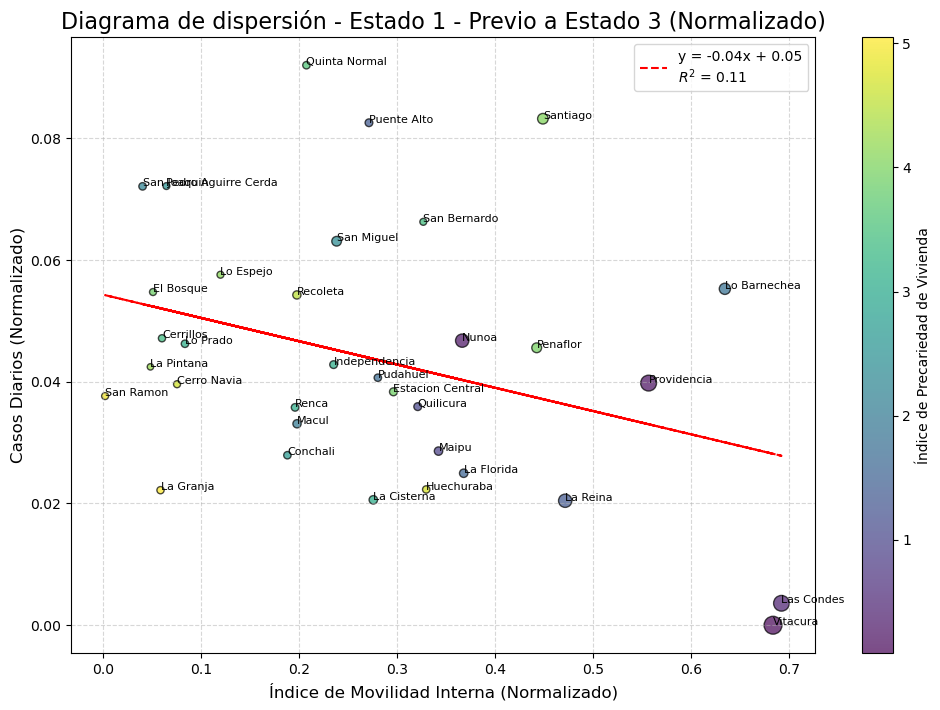

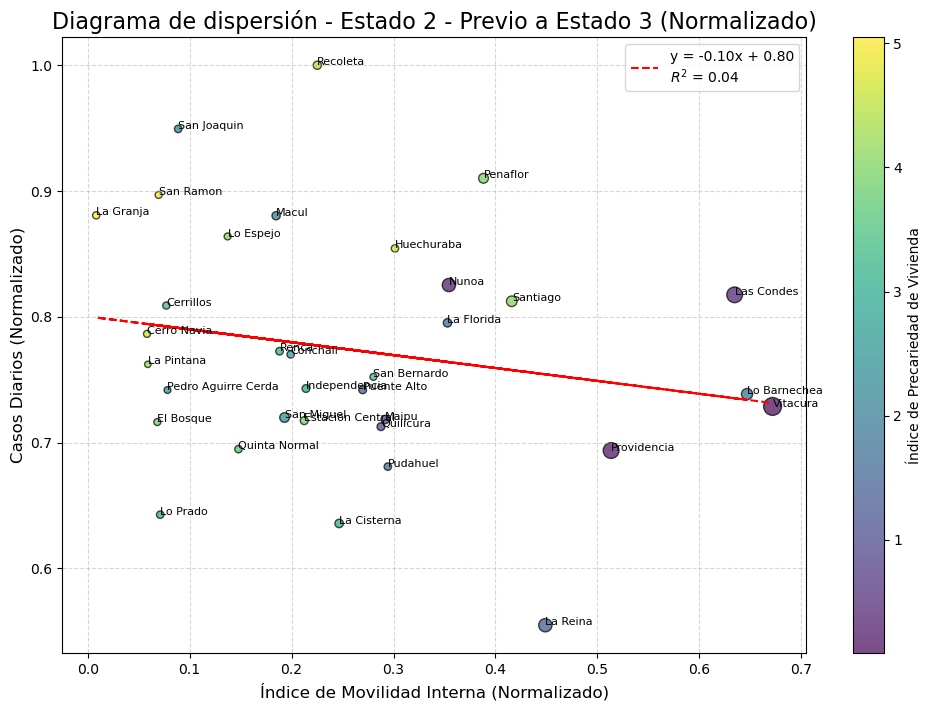

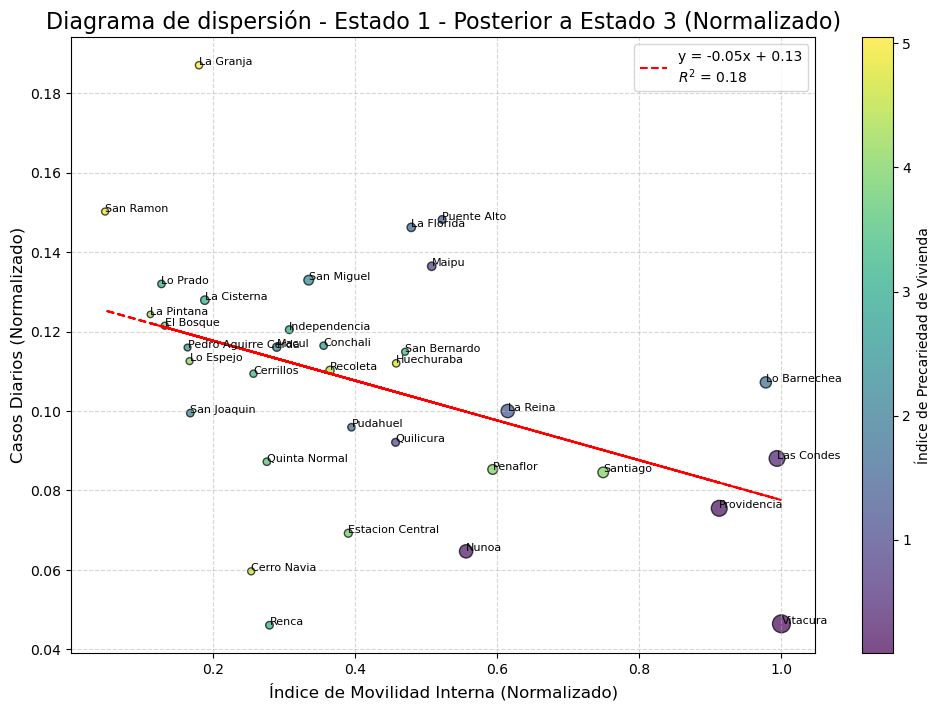

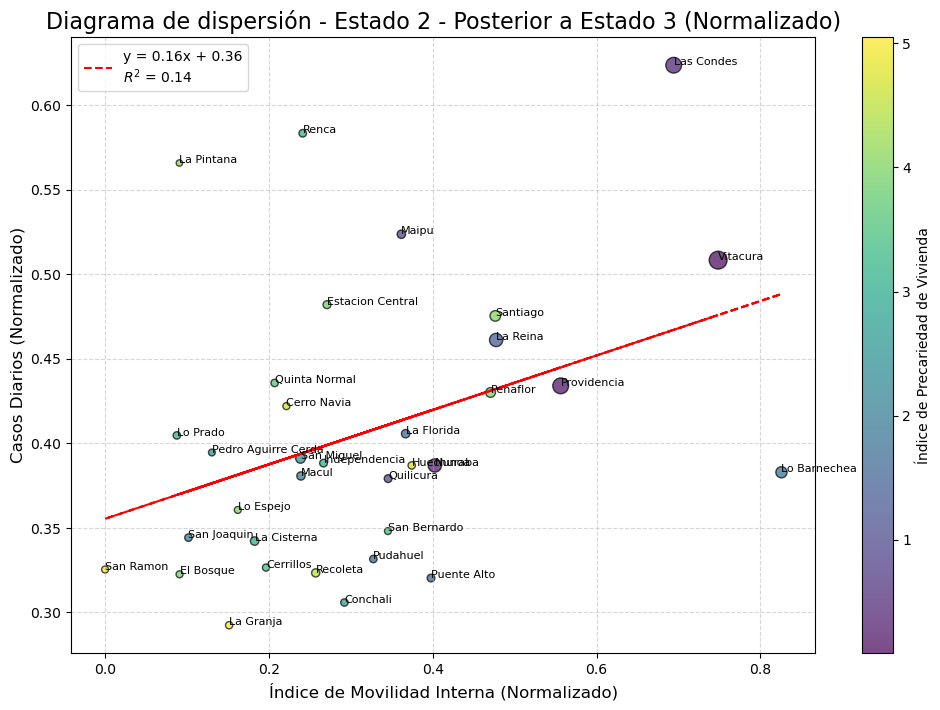

In [160]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import MinMaxScaler

# Filtrar solo los estados y períodos relevantes
periodos_relevantes = [
    "Estado 1 - Previo a Estado 3",
    "Estado 2 - Previo a Estado 3",
    "Estado 1 - Posterior a Estado 3",
    "Estado 2 - Posterior a Estado 3"
]
filtered_data = viterbi_merged[viterbi_merged['period'].isin(periodos_relevantes)]

# Calcular promedios por comuna dentro de cada estado y período relevante
promedios_por_comuna_estado = (
    filtered_data.groupby(['period', 'Comuna']).agg({
        'IM_interno': 'mean',
        'IM_externo': 'mean',
        'Casos_Diarios_Brutos': 'mean',
        'inc_pc_comuna': 'mean',
        'indic_precariedad_vivienda': 'mean'
    }).reset_index()
)

# Normalizar las variables
scaler = MinMaxScaler()
promedios_por_comuna_estado['IM_interno_normalizado'] = scaler.fit_transform(promedios_por_comuna_estado[['IM_interno']])
promedios_por_comuna_estado['Casos_Diarios_Brutos_normalizado'] = scaler.fit_transform(promedios_por_comuna_estado[['Casos_Diarios_Brutos']])

# Crear diagramas de dispersión para cada período relevante
for periodo in periodos_relevantes:
    periodo_data = promedios_por_comuna_estado[promedios_por_comuna_estado['period'] == periodo]
    
    # Variables para el gráfico
    X = periodo_data['IM_interno_normalizado'].values.reshape(-1, 1)
    Y = periodo_data['Casos_Diarios_Brutos_normalizado'].values
    sizes = periodo_data['inc_pc_comuna'].values / 10000  # Tamaño del punto
    colors = periodo_data['indic_precariedad_vivienda'].values  # Color del punto
    
    # Ajustar una línea de regresión lineal
    model = LinearRegression()
    model.fit(X, Y)
    Y_pred = model.predict(X)
    
    # Calcular R^2
    r_squared = model.score(X, Y)
    equation = f"y = {model.coef_[0]:.2f}x + {model.intercept_:.2f}\n$R^2$ = {r_squared:.2f}"
    
    # Crear el gráfico
    plt.figure(figsize=(12, 8))
    scatter = plt.scatter(
        periodo_data['IM_interno_normalizado'], periodo_data['Casos_Diarios_Brutos_normalizado'], 
        s=sizes, c=colors, cmap='viridis', alpha=0.7, edgecolor='k'
    )
    
    # Agregar nombres de las comunas
    for i, row in periodo_data.iterrows():
        plt.text(row['IM_interno_normalizado'], row['Casos_Diarios_Brutos_normalizado'], row['Comuna'], fontsize=8)
    
    # Agregar la línea de regresión
    plt.plot(X, Y_pred, color='red', linestyle='--', label=equation)
    
    # Configurar colorbar y etiquetas
    plt.colorbar(scatter, label='Índice de Precariedad de Vivienda')
    plt.title(f'Diagrama de dispersión - {periodo} (Normalizado)', fontsize=16)
    plt.xlabel('Índice de Movilidad Interna (Normalizado)', fontsize=12)
    plt.ylabel('Casos Diarios (Normalizado)', fontsize=12)
    plt.legend(fontsize=10)
    
    # Mostrar el gráfico
    plt.grid(alpha=0.5, linestyle='--')
    plt.show()


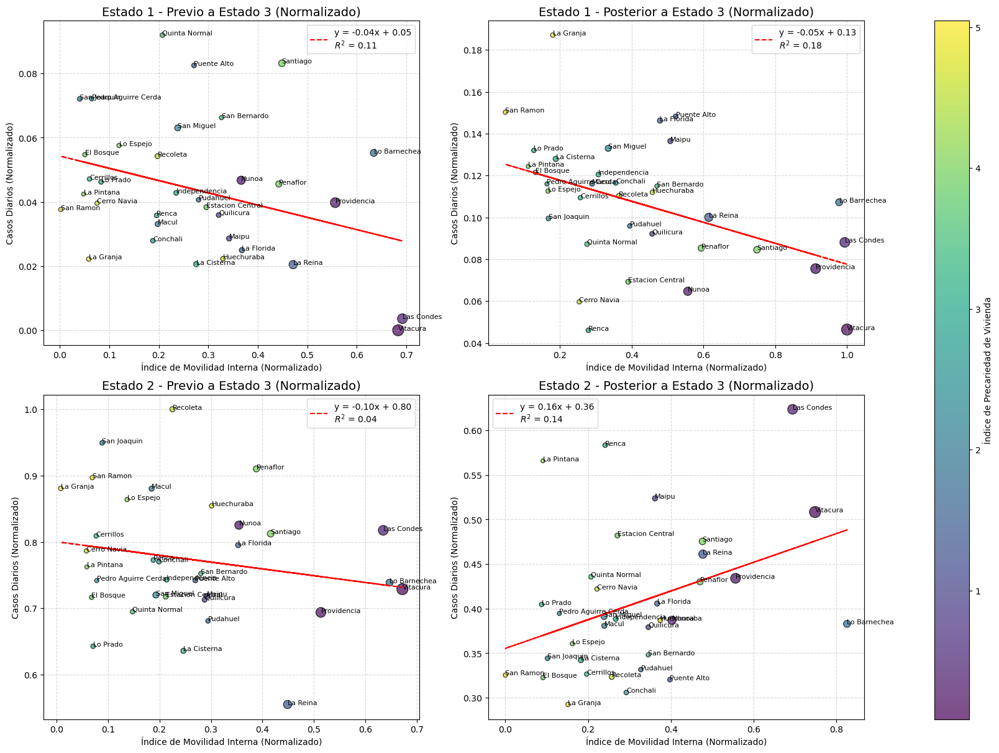

In [161]:
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import MinMaxScaler

# Filtrar solo los estados y períodos relevantes
periodos_relevantes = [
    "Estado 1 - Previo a Estado 3",
    "Estado 1 - Posterior a Estado 3",
    "Estado 2 - Previo a Estado 3",
    "Estado 2 - Posterior a Estado 3"
]
filtered_data = viterbi_merged[viterbi_merged['period'].isin(periodos_relevantes)]

# Calcular promedios por comuna dentro de cada estado y período relevante
promedios_por_comuna_estado = (
    filtered_data.groupby(['period', 'Comuna']).agg({
        'IM_interno': 'mean',
        'IM_externo': 'mean',
        'Casos_Diarios_Brutos': 'mean',
        'inc_pc_comuna': 'mean',
        'indic_precariedad_vivienda': 'mean'
    }).reset_index()
)

# Normalizar las variables
scaler = MinMaxScaler()
promedios_por_comuna_estado['IM_interno_normalizado'] = scaler.fit_transform(promedios_por_comuna_estado[['IM_interno']])
promedios_por_comuna_estado['Casos_Diarios_Brutos_normalizado'] = scaler.fit_transform(promedios_por_comuna_estado[['Casos_Diarios_Brutos']])

# Crear subplots con 2 filas y 2 columnas
fig, axes = plt.subplots(2, 2, figsize=(16, 12), constrained_layout=True)
axes = axes.flatten()  # Aplanar el arreglo de ejes para facilitar el acceso

# Mapeo de períodos a índices de subplots
period_to_axis = {
    "Estado 1 - Previo a Estado 3": 0,
    "Estado 1 - Posterior a Estado 3": 1,
    "Estado 2 - Previo a Estado 3": 2,
    "Estado 2 - Posterior a Estado 3": 3
}

# Generar cada gráfico
for periodo, idx in period_to_axis.items():
    periodo_data = promedios_por_comuna_estado[promedios_por_comuna_estado['period'] == periodo]
    
    # Variables para el gráfico
    X = periodo_data['IM_interno_normalizado'].values.reshape(-1, 1)
    Y = periodo_data['Casos_Diarios_Brutos_normalizado'].values
    sizes = periodo_data['inc_pc_comuna'].values / 10000  # Tamaño del punto
    colors = periodo_data['indic_precariedad_vivienda'].values  # Color del punto
    
    # Ajustar una línea de regresión lineal
    model = LinearRegression()
    model.fit(X, Y)
    Y_pred = model.predict(X)
    
    # Calcular R^2
    r_squared = model.score(X, Y)
    equation = f"y = {model.coef_[0]:.2f}x + {model.intercept_:.2f}\n$R^2$ = {r_squared:.2f}"
    
    # Crear el gráfico en el subplot correspondiente
    ax = axes[idx]
    scatter = ax.scatter(
        periodo_data['IM_interno_normalizado'], periodo_data['Casos_Diarios_Brutos_normalizado'], 
        s=sizes, c=colors, cmap='viridis', alpha=0.7, edgecolor='k'
    )
    
    # Agregar nombres de las comunas
    for i, row in periodo_data.iterrows():
        ax.text(row['IM_interno_normalizado'], row['Casos_Diarios_Brutos_normalizado'], row['Comuna'], fontsize=8)
    
    # Agregar la línea de regresión
    ax.plot(X, Y_pred, color='red', linestyle='--', label=equation)
    
    # Configurar etiquetas y título
    ax.set_title(f'{periodo} (Normalizado)', fontsize=14)
    ax.set_xlabel('Índice de Movilidad Interna (Normalizado)', fontsize=10)
    ax.set_ylabel('Casos Diarios (Normalizado)', fontsize=10)
    ax.legend(fontsize=10)
    ax.grid(alpha=0.5, linestyle='--')

# Añadir una barra de color común para los subplots
fig.colorbar(scatter, ax=axes, orientation='vertical', label='Índice de Precariedad de Vivienda')

# Mostrar todos los gráficos en el mismo layout
plt.show()


## 2. Correlación de Casos Diarios Brutos con Movilidad Externa por cada Estado
- *Color de los puntos según el índice de precariedad de la vivienda.*
- *Tamaño de los puntos según índice per cápita comuna.*
- *Etiquetado por comuna.*

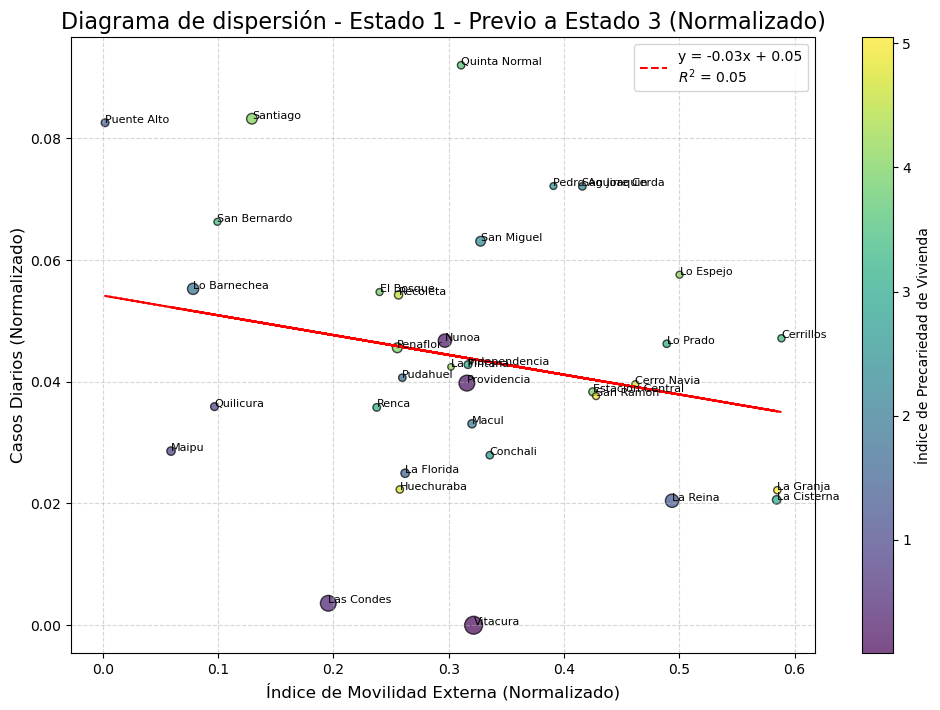

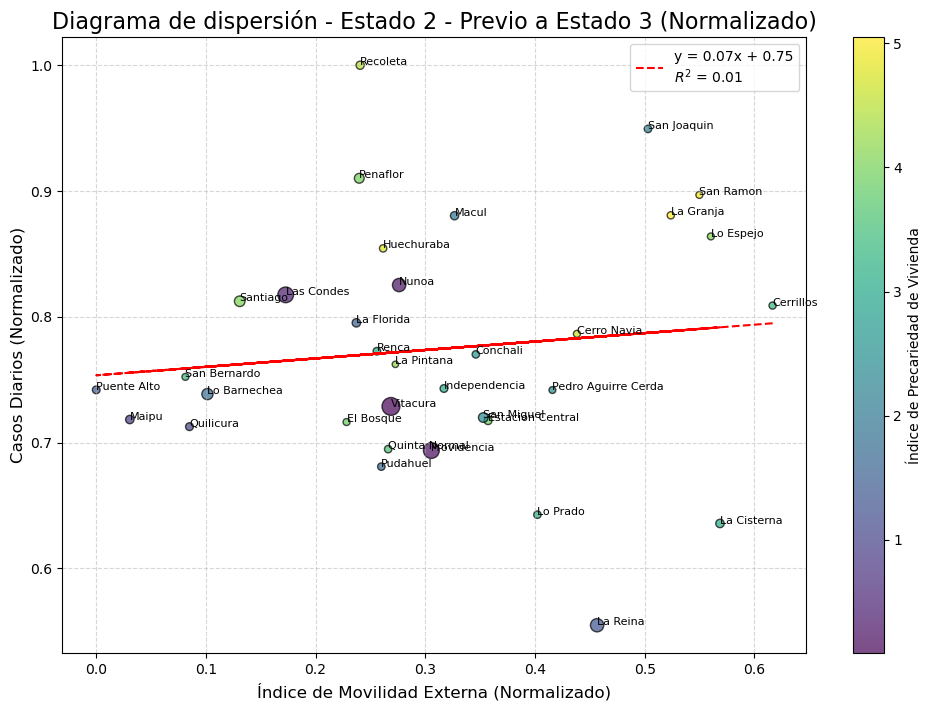

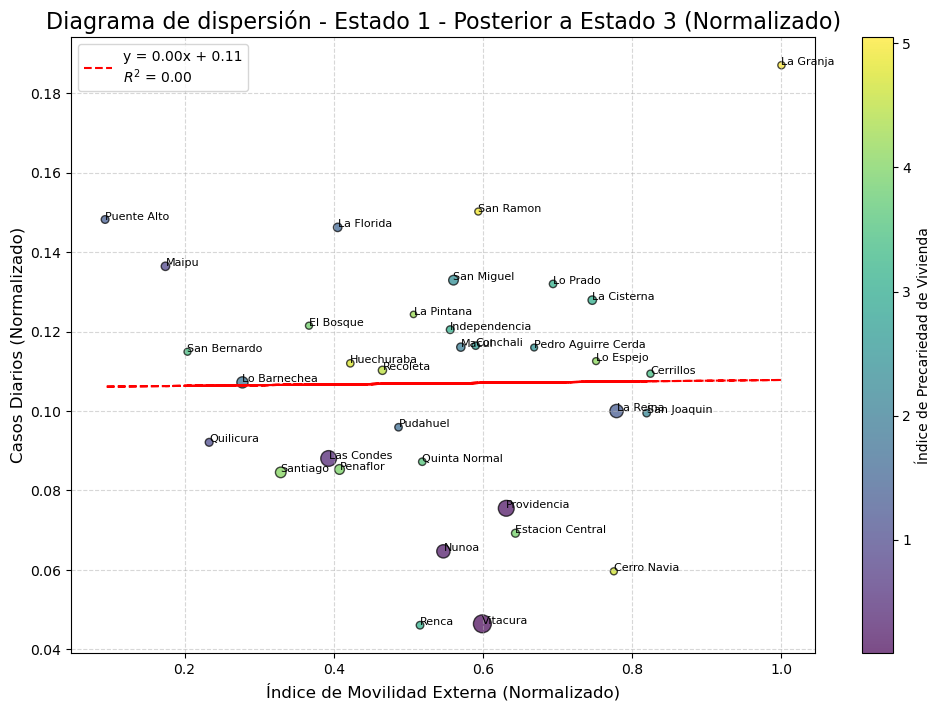

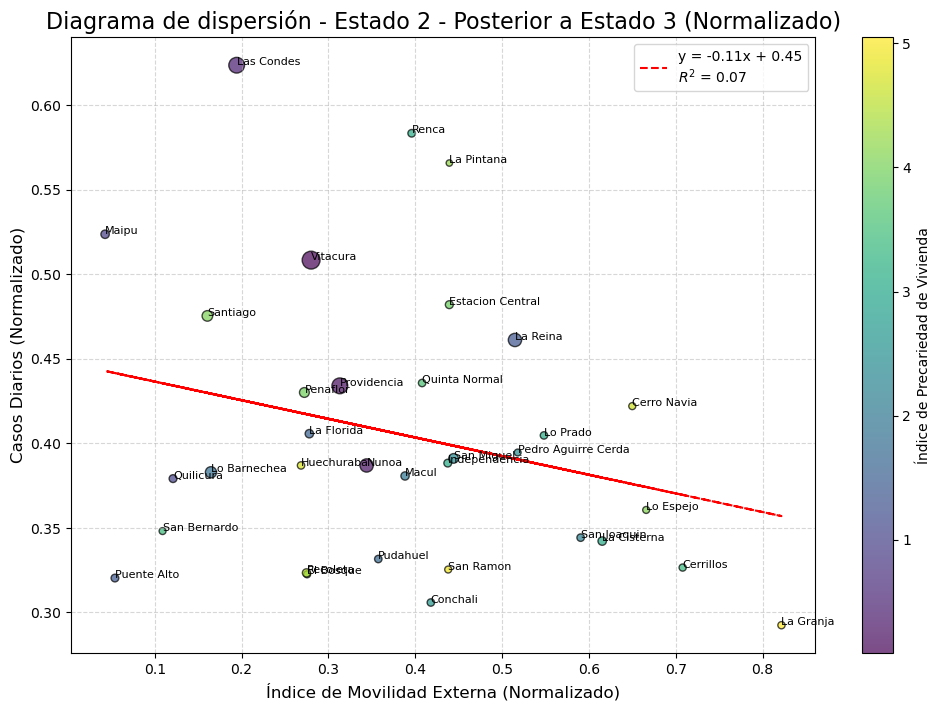

In [162]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import MinMaxScaler

# Filtrar solo los estados y períodos relevantes
periodos_relevantes = [
    "Estado 1 - Previo a Estado 3",
    "Estado 2 - Previo a Estado 3",
    "Estado 1 - Posterior a Estado 3",
    "Estado 2 - Posterior a Estado 3"
]
filtered_data = viterbi_merged[viterbi_merged['period'].isin(periodos_relevantes)]

# Calcular promedios por comuna dentro de cada estado y período relevante
promedios_por_comuna_estado = (
    filtered_data.groupby(['period', 'Comuna']).agg({
        'IM_interno': 'mean',
        'IM_externo': 'mean',
        'Casos_Diarios_Brutos': 'mean',
        'inc_pc_comuna': 'mean',
        'indic_precariedad_vivienda': 'mean'
    }).reset_index()
)

# Normalizar las variables
scaler = MinMaxScaler()
promedios_por_comuna_estado['IM_externo_normalizado'] = scaler.fit_transform(promedios_por_comuna_estado[['IM_externo']])
promedios_por_comuna_estado['Casos_Diarios_Brutos_normalizado'] = scaler.fit_transform(promedios_por_comuna_estado[['Casos_Diarios_Brutos']])

# Crear diagramas de dispersión para cada período relevante
for periodo in periodos_relevantes:
    periodo_data = promedios_por_comuna_estado[promedios_por_comuna_estado['period'] == periodo]
    
    # Variables para el gráfico
    X = periodo_data['IM_externo_normalizado'].values.reshape(-1, 1)
    Y = periodo_data['Casos_Diarios_Brutos_normalizado'].values
    sizes = periodo_data['inc_pc_comuna'].values / 10000  # Tamaño del punto
    colors = periodo_data['indic_precariedad_vivienda'].values  # Color del punto
    
    # Ajustar una línea de regresión lineal
    model = LinearRegression()
    model.fit(X, Y)
    Y_pred = model.predict(X)
    
    # Calcular R^2
    r_squared = model.score(X, Y)
    equation = f"y = {model.coef_[0]:.2f}x + {model.intercept_:.2f}\n$R^2$ = {r_squared:.2f}"
    
    # Crear el gráfico
    plt.figure(figsize=(12, 8))
    scatter = plt.scatter(
        periodo_data['IM_externo_normalizado'], periodo_data['Casos_Diarios_Brutos_normalizado'], 
        s=sizes, c=colors, cmap='viridis', alpha=0.7, edgecolor='k'
    )
    
    # Agregar nombres de las comunas
    for i, row in periodo_data.iterrows():
        plt.text(row['IM_externo_normalizado'], row['Casos_Diarios_Brutos_normalizado'], row['Comuna'], fontsize=8)
    
    # Agregar la línea de regresión
    plt.plot(X, Y_pred, color='red', linestyle='--', label=equation)
    
    # Configurar colorbar y etiquetas
    plt.colorbar(scatter, label='Índice de Precariedad de Vivienda')
    plt.title(f'Diagrama de dispersión - {periodo} (Normalizado)', fontsize=16)
    plt.xlabel('Índice de Movilidad Externa (Normalizado)', fontsize=12)
    plt.ylabel('Casos Diarios (Normalizado)', fontsize=12)
    plt.legend(fontsize=10)
    
    # Mostrar el gráfico
    plt.grid(alpha=0.5, linestyle='--')
    plt.show()


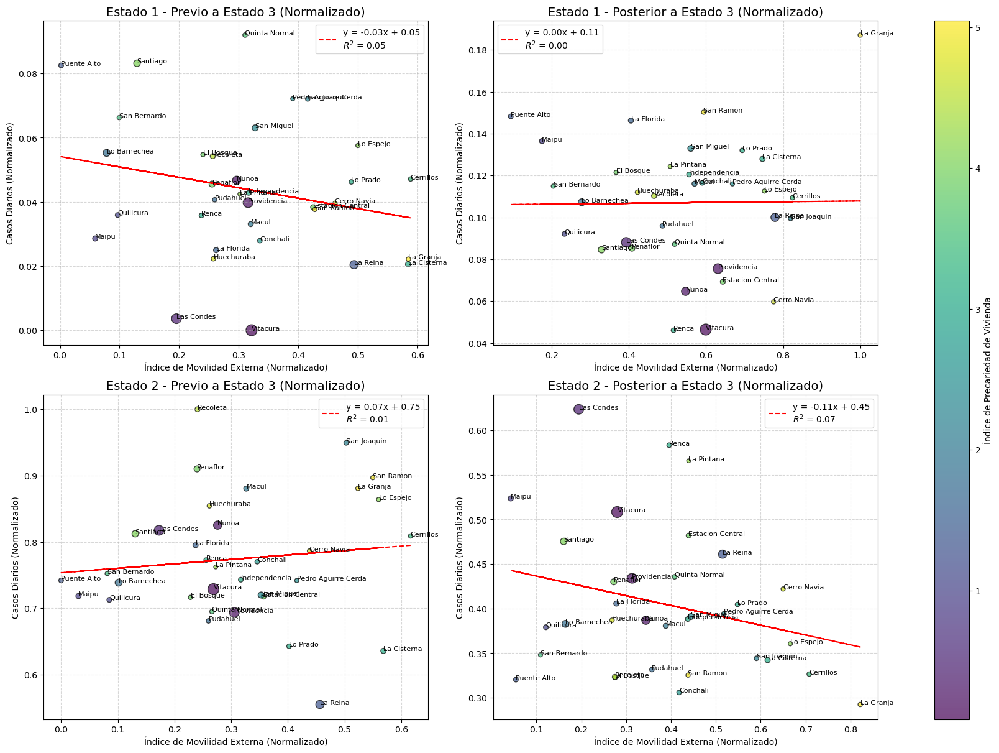

In [163]:
# Normalizar las variables
promedios_por_comuna_estado['IM_externo_normalizado'] = scaler.fit_transform(promedios_por_comuna_estado[['IM_externo']])
promedios_por_comuna_estado['Casos_Diarios_Brutos_normalizado'] = scaler.fit_transform(promedios_por_comuna_estado[['Casos_Diarios_Brutos']])

# Crear subplots con 2 filas y 2 columnas
fig, axes = plt.subplots(2, 2, figsize=(16, 12), constrained_layout=True)
axes = axes.flatten()  # Aplanar el arreglo de ejes para facilitar el acceso

# Mapeo de períodos a índices de subplots
period_to_axis = {
    "Estado 1 - Previo a Estado 3": 0,
    "Estado 1 - Posterior a Estado 3": 1,
    "Estado 2 - Previo a Estado 3": 2,
    "Estado 2 - Posterior a Estado 3": 3
}

# Generar cada gráfico
for periodo, idx in period_to_axis.items():
    periodo_data = promedios_por_comuna_estado[promedios_por_comuna_estado['period'] == periodo]
    
    # Variables para el gráfico
    X = periodo_data['IM_externo_normalizado'].values.reshape(-1, 1)
    Y = periodo_data['Casos_Diarios_Brutos_normalizado'].values
    sizes = periodo_data['inc_pc_comuna'].values / 10000  # Tamaño del punto
    colors = periodo_data['indic_precariedad_vivienda'].values  # Color del punto
    
    # Ajustar una línea de regresión lineal
    model = LinearRegression()
    model.fit(X, Y)
    Y_pred = model.predict(X)
    
    # Calcular R^2
    r_squared = model.score(X, Y)
    equation = f"y = {model.coef_[0]:.2f}x + {model.intercept_:.2f}\n$R^2$ = {r_squared:.2f}"
    
    # Crear el gráfico en el subplot correspondiente
    ax = axes[idx]
    scatter = ax.scatter(
        periodo_data['IM_externo_normalizado'], periodo_data['Casos_Diarios_Brutos_normalizado'], 
        s=sizes, c=colors, cmap='viridis', alpha=0.7, edgecolor='k'
    )
    
    # Agregar nombres de las comunas
    for i, row in periodo_data.iterrows():
        ax.text(row['IM_externo_normalizado'], row['Casos_Diarios_Brutos_normalizado'], row['Comuna'], fontsize=8)
    
    # Agregar la línea de regresión
    ax.plot(X, Y_pred, color='red', linestyle='--', label=equation)
    
    # Configurar etiquetas y título
    ax.set_title(f'{periodo} (Normalizado)', fontsize=14)
    ax.set_xlabel('Índice de Movilidad Externa (Normalizado)', fontsize=10)
    ax.set_ylabel('Casos Diarios (Normalizado)', fontsize=10)
    ax.legend(fontsize=10)
    ax.grid(alpha=0.5, linestyle='--')

# Añadir una barra de color común para los subplots
fig.colorbar(scatter, ax=axes, orientation='vertical', label='Índice de Precariedad de Vivienda')

# Mostrar todos los gráficos en el mismo layout
plt.show()


### Correlación entre Covariables y Probabilidades de Transición Códigos Opción 1
#### *Recordar que estado 1 es severo (heatmap secuencia viterbi centro azul), estado 2 es moderado (heatmap rojo), estado 1 es leve (en heatmap extremos color verde).*

In [164]:
# Reestructurar transition_matrix para obtener probabilidades de transición por muestra
n_samples, n_states, _ = transition_matrix.shape

# Remapear índices de los estados
transitions_list = []
for t in range(n_samples):
    for i in range(n_states):
        for j in range(n_states):
            transitions_list.append({
                "sample": t,
                f"Trans_{i+1}->{j+1}": transition_matrix[t, i, j]  # Remapear 0->1, 1->2, 2->3
            })

# Convertir a DataFrame
transitions_df = pd.DataFrame(transitions_list).groupby("sample").mean().reset_index(drop=True)

print("Transiciones estructuradas:")
print(transitions_df.head())


Transiciones estructuradas:
   Trans_1->1  Trans_1->2    Trans_1->3  Trans_2->1  Trans_2->2    Trans_2->3  \
0    0.994180    0.000775  4.056043e-25    0.005820    0.998064  1.158392e-07   
1    0.994231    0.001285  1.580162e-23    0.005769    0.998027  5.421520e-07   
2    0.993255    0.000681  6.889444e-26    0.006745    0.997807  7.804615e-08   
3    0.992122    0.000231  1.250997e-29    0.007878    0.994554  2.883957e-09   
4    0.987758    0.002742  4.556638e-23    0.012242    0.996636  5.448050e-06   

     Trans_3->1  Trans_3->2  Trans_3->3  
0  1.325346e-09    0.001161    1.000000  
1  1.016073e-09    0.000688    0.999999  
2  1.490560e-09    0.001511    1.000000  
3  2.755099e-09    0.005215    1.000000  
4  8.855350e-10    0.000622    0.999995  


In [60]:
# Seleccionar covariables relevantes
covariates_df = viterbi_merged[[
    'IM_interno', 'IM_externo', 
    'inc_pc_comuna', 'Personas_hogar_promedio', 'inmigrantes', 
    'total_hog_hacinados', 'indic_precariedad_vivienda', 
    'por_educ_sup', 'IPS_2020'
]].reset_index(drop=True)

# Combinar con transiciones
analysis_df = pd.concat([covariates_df, transitions_df], axis=1)
print("Datos combinados para análisis:")
print(analysis_df.head())


Datos combinados para análisis:
   IM_interno  IM_externo  inc_pc_comuna  Personas_hogar_promedio  \
0    1.970381    7.804008      267197.56                 3.145581   
1    1.845790    7.471452      267197.56                 3.145581   
2    1.678598    6.891732      267197.56                 3.145581   
3    1.736766    8.317872      267197.56                 3.145581   
4    1.331296    6.378498      267197.56                 3.145581   

   inmigrantes  total_hog_hacinados  indic_precariedad_vivienda  por_educ_sup  \
0       3606.0              68120.0                    3.395792          11.9   
1       3606.0              68120.0                    3.395792          11.9   
2       3606.0              68120.0                    3.395792          11.9   
3       3606.0              68120.0                    3.395792          11.9   
4       3606.0              68120.0                    3.395792          11.9   

   IPS_2020  Trans_1->1  Trans_1->2    Trans_1->3  Trans_2->1  Tra

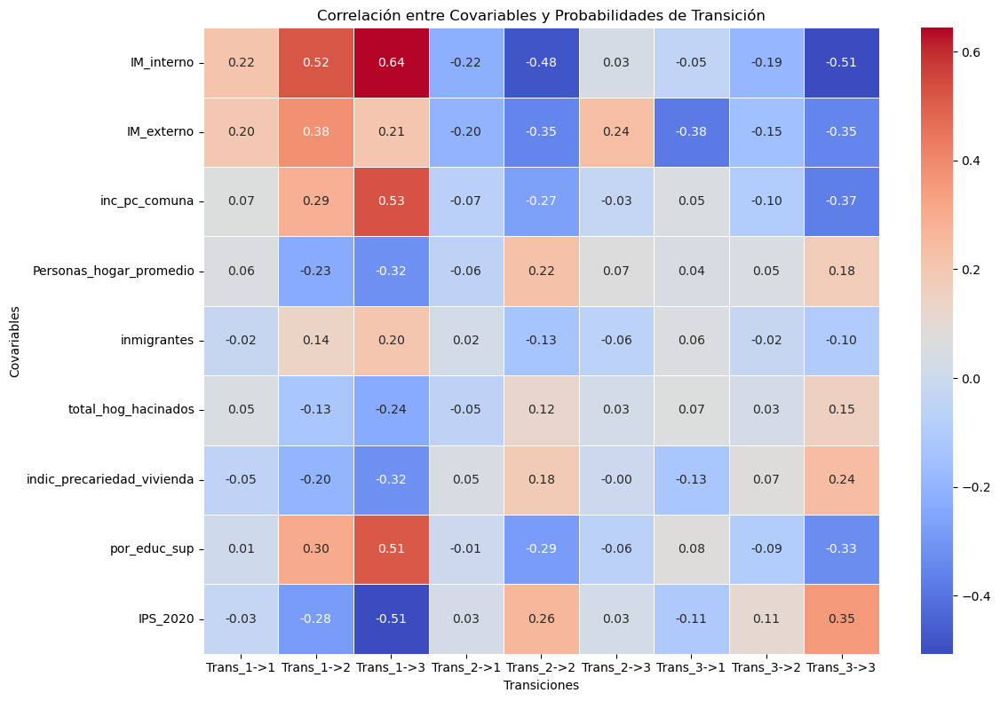

In [61]:
# Calcular la matriz de correlación
correlaciones = analysis_df.corr().loc[
    covariates_df.columns, 
    transitions_df.columns
]

# Visualizar el heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlaciones, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlación entre Covariables y Probabilidades de Transición")
plt.xlabel("Transiciones")
plt.ylabel("Covariables")
plt.tight_layout()
plt.show()


### Importante Ver

In [62]:
# Crear lista para almacenar las transiciones
transiciones = []

# Recorrer todas las matrices de transición generadas
for idx, matriz in enumerate(transition_matrix):
    for from_state in range(len(matriz)):
        for to_state in range(len(matriz[from_state])):
            transiciones.append({
                'Día_original': base_final.iloc[idx]['dias'],  # Día original en la base final
                'Día_correlativo': idx,  # Índice o día correlativo generado
                'Comuna': base_final.iloc[idx]['Comuna'],  # Comuna asociada al día
                'from_state': from_state + 1,  # Estado origen (ajustar a 1, 2, 3)
                'to_state': to_state + 1,     # Estado destino (ajustar a 1, 2, 3)
                'probability': matriz[from_state][to_state]
            })

# Convertir lista a DataFrame
transiciones_df = pd.DataFrame(transiciones)

# Crear columnas de transiciones (e.g., Trans_1->2)
transiciones_df['Transición'] = (
    "Trans_" + transiciones_df['from_state'].astype(str) + "->" + transiciones_df['to_state'].astype(str)
)

# Pivotear para tener las transiciones como columnas
transiciones_df = transiciones_df.pivot(
    index=['Comuna', 'Día_original', 'Día_correlativo'],  # Agregar ambas referencias de día
    columns='Transición',
    values='probability'
).reset_index()

# Inspeccionar el DataFrame de transiciones
print("DataFrame de transiciones actualizado:")
print(transiciones_df.head())


DataFrame de transiciones actualizado:
Transición     Comuna  Día_original  Día_correlativo  Trans_1->1  Trans_1->2  \
0           Cerrillos             1                0    0.994180    0.000775   
1           Cerrillos             2                1    0.994231    0.001285   
2           Cerrillos             3                2    0.993255    0.000681   
3           Cerrillos             4                3    0.992122    0.000231   
4           Cerrillos             5                4    0.987758    0.002742   

Transición    Trans_1->3  Trans_2->1  Trans_2->2    Trans_2->3    Trans_3->1  \
0           4.056043e-25    0.005820    0.998064  1.158392e-07  1.325346e-09   
1           1.580162e-23    0.005769    0.998027  5.421520e-07  1.016073e-09   
2           6.889444e-26    0.006745    0.997807  7.804615e-08  1.490560e-09   
3           1.250997e-29    0.007878    0.994554  2.883957e-09  2.755099e-09   
4           4.556638e-23    0.012242    0.996636  5.448050e-06  8.855350e-10   


In [63]:
# Convertir las transiciones en formato "long"
transiciones_long = pd.melt(
    transiciones_df,
    id_vars=['Comuna', 'Día_original', 'Día_correlativo'],  # Incluir ambas columnas de días
    value_vars=['Trans_1->1', 'Trans_1->2', 'Trans_1->3', 
                'Trans_2->1', 'Trans_2->2', 'Trans_2->3', 
                'Trans_3->1', 'Trans_3->2', 'Trans_3->3'],
    var_name='Transición',
    value_name='Probabilidad_Transición'
)

# Realizar el merge para agregar las covariables desde base_final
glmm_data = transiciones_long.merge(
    base_final[['Comuna', 'dias', 'IM_interno', 'IM_externo', 'TasaCasosAcumulados', 
                'Casos_Diarios_Brutos', 'Casos_Diarios_Brutos_MM7', 'inc_pc_comuna',
                'Personas_hogar_promedio', 'inmigrantes', 'total_hog_hacinados', 
                'indic_precariedad_vivienda', 'por_educ_sup', 'IPS_2020']],
    left_on=['Comuna', 'Día_original'],  # Usar Día_original para coincidir con base_final
    right_on=['Comuna', 'dias'],         # La columna en base_final es 'dias'
    how='left'
)

# Inspeccionar el resultado
print("Datos preparados para GLMM (en formato long con covariables adicionales):")
print(glmm_data.head())


Datos preparados para GLMM (en formato long con covariables adicionales):
      Comuna  Día_original  Día_correlativo  Transición  \
0  Cerrillos             1                0  Trans_1->1   
1  Cerrillos             2                1  Trans_1->1   
2  Cerrillos             3                2  Trans_1->1   
3  Cerrillos             4                3  Trans_1->1   
4  Cerrillos             5                4  Trans_1->1   

   Probabilidad_Transición  dias  IM_interno  IM_externo  TasaCasosAcumulados  \
0                 0.994180     1    1.918137    7.524704             0.000000   
1                 0.994231     2    1.970381    7.804008             2.248303   
2                 0.993255     3    1.845790    7.471452             4.496605   
3                 0.992122     4    1.678598    6.891732             4.496605   
4                 0.987758     5    1.736766    8.317872             4.496605   

   Casos_Diarios_Brutos  Casos_Diarios_Brutos_MM7  inc_pc_comuna  \
0              0

In [64]:
glmm_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 65790 entries, 0 to 65789
Data columns (total 18 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Comuna                      65790 non-null  object 
 1   Día_original                65790 non-null  int64  
 2   Día_correlativo             65790 non-null  int64  
 3   Transición                  65790 non-null  object 
 4   Probabilidad_Transición     65790 non-null  float64
 5   dias                        65790 non-null  int64  
 6   IM_interno                  65790 non-null  float64
 7   IM_externo                  65790 non-null  float64
 8   TasaCasosAcumulados         65790 non-null  float64
 9   Casos_Diarios_Brutos        65790 non-null  float64
 10  Casos_Diarios_Brutos_MM7    65790 non-null  float64
 11  inc_pc_comuna               65790 non-null  float64
 12  Personas_hogar_promedio     65790 non-null  float64
 13  inmigrantes                 657

Dimensiones del DataFrame:

Total de 65,484 filas y 18 columnas. Esto concuerda con el hecho de que estamos trabajando con múltiples transiciones (9 transiciones por día por comuna).
Columnas importantes:

Probabilidad_Transición contiene valores no nulos, asegurando que las transiciones están bien representadas.
Las covariables (IM_interno, IM_externo, etc.) se han añadido correctamente y no tienen valores nulos, lo que asegura que el merge fue exitoso.
Estructura en formato long:

Transición: especifica la transición (e.g., Trans_1->2).
Probabilidad_Transición: da la probabilidad asociada.
Día_original y Día_correlativo: están correctamente registradas, lo que permitirá un análisis más flexible.
Uso de memoria:

La memoria utilizada (9 MB) es manejable, pero podría optimizarse si fuera necesario (e.g., usando dtypes más compactos para enteros).

In [65]:
# Guardar el DataFrame en un archivo CSV
glmm_data.to_csv('Datasets/glmm_data_preparado.csv', index=False)

print("El DataFrame ha sido guardado como 'glmm_data_preparado.csv'.")


El DataFrame ha sido guardado como 'glmm_data_preparado.csv'.


In [66]:
# Resumen estadístico de las columnas numéricas
print("Resumen estadístico de las variables numéricas:")
print(glmm_data.describe())

# Mostrar una muestra aleatoria de filas del DataFrame
print("\nMuestra aleatoria de filas del DataFrame:")
print(glmm_data.sample(10))


Resumen estadístico de las variables numéricas:
       Día_original  Día_correlativo  Probabilidad_Transición          dias  \
count  65790.000000     65790.000000             6.579000e+04  65790.000000   
mean     108.000000      3654.500000             3.333333e-01    108.000000   
std       62.064954      2110.231252             4.426404e-01     62.064954   
min        1.000000         0.000000             1.699039e-83      1.000000   
25%       54.000000      1827.000000             1.507881e-06     54.000000   
50%      108.000000      3654.500000             1.294603e-02    108.000000   
75%      162.000000      5482.000000             9.576769e-01    162.000000   
max      215.000000      7309.000000             1.000000e+00    215.000000   

         IM_interno    IM_externo  TasaCasosAcumulados  Casos_Diarios_Brutos  \
count  65790.000000  65790.000000         65790.000000          65790.000000   
mean       3.548605      5.469967          2556.650554             19.709363   


### Correlación entre Índice de Movilidad Interno y Probabilidad de Transición

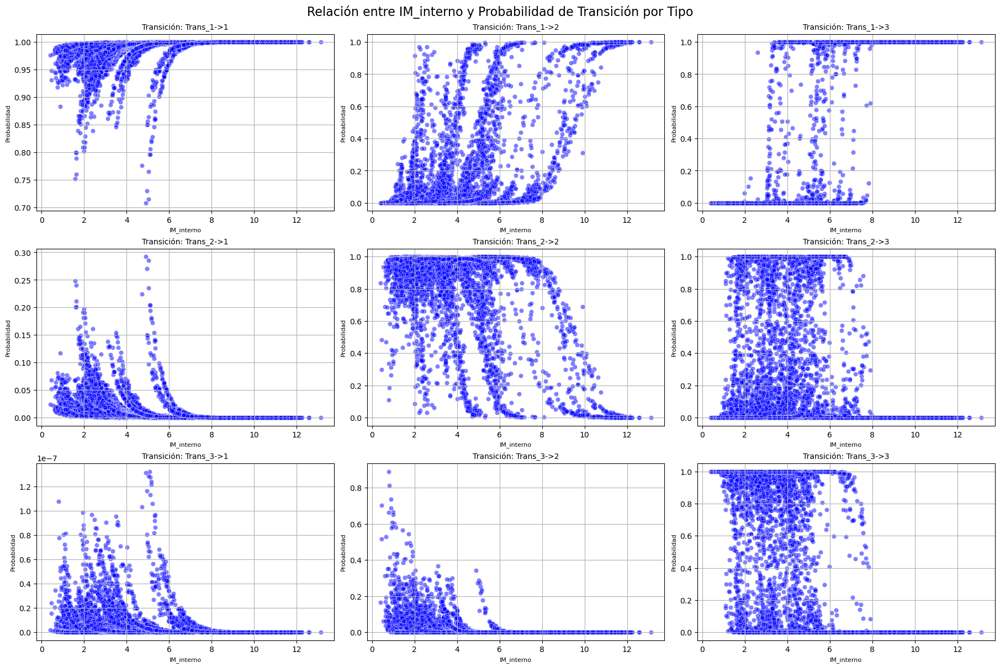

In [67]:
# Lista de transiciones únicas
transiciones_unicas = glmm_data['Transición'].unique()

# Configurar la figura con subplots
num_transiciones = len(transiciones_unicas)
fig, axes = plt.subplots(
    nrows=(num_transiciones + 2) // 3,  # Filas (3 gráficos por fila)
    ncols=3,  # Columnas
    figsize=(18, 12),
    constrained_layout=True
)

# Aplanar los ejes para iterar fácilmente
axes = axes.flatten()

# Crear gráficos separados por transición
for i, transicion in enumerate(transiciones_unicas):
    sns.scatterplot(
        data=glmm_data[glmm_data['Transición'] == transicion],
        x='IM_interno',
        y='Probabilidad_Transición',
        alpha=0.5,
        color='blue',
        ax=axes[i]
    )
    axes[i].set_title(f'Transición: {transicion}', fontsize=10)
    axes[i].set_xlabel('IM_interno', fontsize=8)
    axes[i].set_ylabel('Probabilidad', fontsize=8)
    axes[i].grid(True)

# Deshabilitar los subplots vacíos si hay más ejes que gráficos
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Título general
fig.suptitle('Relación entre IM_interno y Probabilidad de Transición por Tipo', fontsize=16)
plt.show()




In [68]:
glmm_data.head()

,Comuna,Día_original,Día_correlativo,Transición,Probabilidad_Transición,dias,IM_interno,IM_externo,TasaCasosAcumulados,Casos_Diarios_Brutos,Casos_Diarios_Brutos_MM7,inc_pc_comuna,Personas_hogar_promedio,inmigrantes,total_hog_hacinados,indic_precariedad_vivienda,por_educ_sup,IPS_2020
0,Cerrillos,1,0,Trans_1->1,0.994180,1,1.918137,7.524704,0.000000,0.000000,0.000000,267197.56,3.145581,3606,68120,3.395792,11.9,67.81
1,Cerrillos,2,1,Trans_1->1,0.994231,2,1.970381,7.804008,2.248303,2.248303,1.124151,267197.56,3.145581,3606,68120,3.395792,11.9,67.81
2,Cerrillos,3,2,Trans_1->1,0.993255,3,1.845790,7.471452,4.496605,2.248303,1.498868,267197.56,3.145581,3606,68120,3.395792,11.9,67.81
3,Cerrillos,4,3,Trans_1->1,0.992122,4,1.678598,6.891732,4.496605,0.000000,1.124151,267197.56,3.145581,3606,68120,3.395792,11.9,67.81
4,Cerrillos,5,4,Trans_1->1,0.987758,5,1.736766,8.317872,4.496605,0.000000,0.899321,267197.56,3.145581,3606,68120,3.395792,11.9,67.81


NameError: name 'handles' is not defined

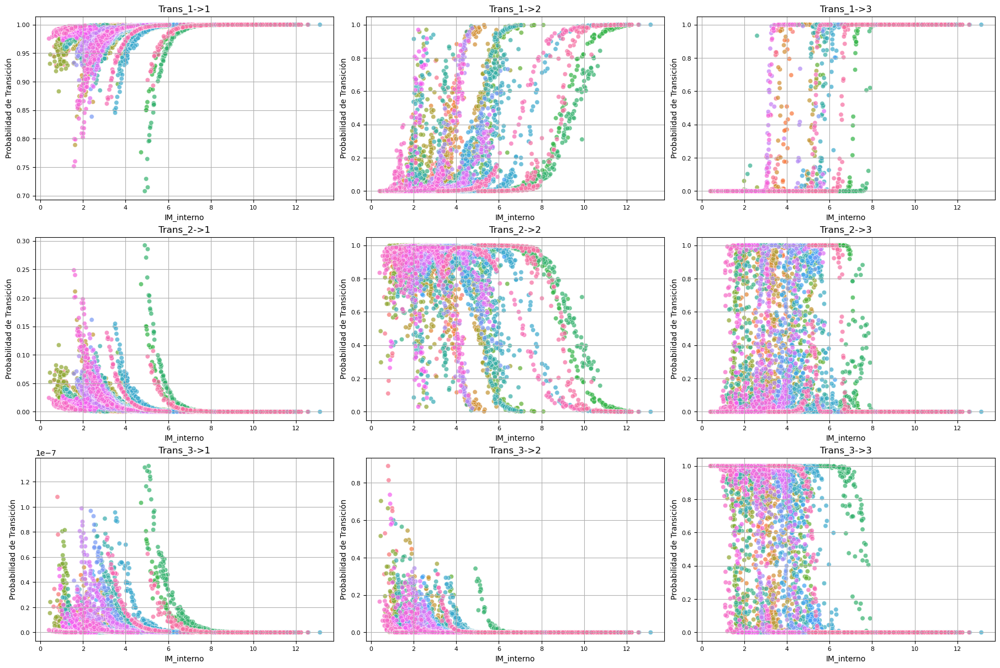

In [165]:
import seaborn as sns
import matplotlib.pyplot as plt

# Lista de transiciones únicas
transiciones_unicas = glmm_data['Transición'].unique()

# Configurar la figura con subplots
num_transiciones = len(transiciones_unicas)
fig, axes = plt.subplots(
    nrows=(num_transiciones + 2) // 3,  # Filas (3 gráficos por fila)
    ncols=3,  # Columnas
    figsize=(18,12),
    constrained_layout=True
)

# Aplanar los ejes para iterar fácilmente
axes = axes.flatten()

# Crear un mapa de colores para las comunas
palette = sns.color_palette("husl", n_colors=glmm_data['Comuna'].nunique())

# Crear gráficos separados por transición
for i, transicion in enumerate(transiciones_unicas):
    sns.scatterplot(
        data=glmm_data[glmm_data['Transición'] == transicion],
        x='IM_interno',
        y='Probabilidad_Transición',
        hue='Comuna',  # Color basado en la comuna
        palette=palette,
        alpha=0.7,
        legend=False,  # Eliminar leyendas de los subplots individuales
        ax=axes[i]
    )
    axes[i].set_title(f'{transicion}', fontsize=12)
    axes[i].set_xlabel('IM_interno', fontsize=10)
    axes[i].set_ylabel('Probabilidad de Transición', fontsize=10)
    axes[i].grid(True)
    axes[i].tick_params(axis='both', labelsize=8)

# Crear una única leyenda para toda la figura
#handles, labels = sns.scatterplot(
#    data=glmm_data,
#    x='IM_interno',
#    y='Probabilidad_Transición',
#    hue='Comuna',
#    palette=palette,
#    legend=True
#).get_legend_handles_labels()

fig.legend(
    handles, labels, loc='center right', title='Comuna',
    fontsize=14, title_fontsize=14, bbox_to_anchor=(1.2, 0.5),
    frameon=True  # Agregar un cuadro a la leyenda
)

# Ajustar el espacio entre gráficos y la leyenda
plt.subplots_adjust(right=1.5)  # Dar más espacio horizontal para la leyenda

# Deshabilitar los subplots vacíos si hay más ejes que gráficos
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Título general
fig.suptitle('Relación entre IM_interno y Probabilidad de Transición por Comuna', fontsize=16)
plt.show()



In [ ]:
from scipy.stats import pearsonr
import pandas as pd

# Guardar resultados de correlación y significancia
resultados_correlacion = []

# Calcular correlaciones por transición
for transicion in glmm_data['Transición'].unique():
    # Filtrar datos por transición
    datos_transicion = glmm_data[glmm_data['Transición'] == transicion]
    
    # Calcular correlación y p-value
    corr, p_value = pearsonr(datos_transicion['IM_interno'], datos_transicion['Probabilidad_Transición'])
    
    # Guardar resultados
    resultados_correlacion.append({
        'Transición': transicion,
        'Correlación': corr,
        'p_value': p_value,
        'Significativo': p_value < 0.05  # Significancia a nivel 0.05
    })

# Convertir resultados a DataFrame
correlaciones_significativas = pd.DataFrame(resultados_correlacion)

# Mostrar resultados
print("Resultados de correlación y significancia:")
print(correlaciones_significativas)


Resultados de correlación y significancia:
   Transición  Correlación        p_value  Significativo
0  Trans_1->1     0.280097  7.349867e-132           True
1  Trans_1->2     0.585782   0.000000e+00           True
2  Trans_1->3     0.701605   0.000000e+00           True
3  Trans_2->1    -0.280097  7.349492e-132           True
4  Trans_2->2    -0.538167   0.000000e+00           True
5  Trans_2->3     0.037483   1.349119e-03           True
6  Trans_3->1    -0.115105   5.482197e-23           True
7  Trans_3->2    -0.236959   7.773568e-94           True
8  Trans_3->3    -0.553651   0.000000e+00           True


Resultados clave por transición:

Trans_1->1:
- Correlación: -0.608
- Interpretación: Fuerte relación negativa. Un mayor IM_interno está asociado con una menor probabilidad de mantenerse en el estado 1.
- p_value: Muy significativo (p ≈ 0).

Trans_1->2:
- Correlación: -0.259
- Interpretación: Relación negativa moderada. A medida que el IM_interno aumenta, es menos probable pasar del estado 1 al estado 2.
- p_value: Muy significativo.

Trans_1->3:
- Correlación: -0.106
- Interpretación: Relación negativa débil. El IM_interno tiene poca influencia sobre la transición del estado 1 al estado 3.
- p_value: Muy significativo.

Trans_2->1:
- Correlación: 0.129
- Interpretación: Relación positiva débil. A medida que el IM_interno aumenta, hay una ligera tendencia a pasar del estado 2 al estado 1.
- p_value: Muy significativo.

Trans_2->2:
- Correlación: -0.540
- Interpretación: Relación negativa fuerte. Un mayor IM_interno está asociado con una menor probabilidad de permanecer en el estado 2.
p_value: Muy significativo.

Trans_2->3:
- Correlación: -0.297
- Interpretación: Relación negativa moderada. A medida que el IM_interno aumenta, es menos probable pasar del estado 2 al estado 3.
- p_value: Muy significativo.

Trans_3->1:
- Correlación: 0.641
- Interpretación: Relación positiva fuerte. Un mayor IM_interno está asociado con una mayor probabilidad de pasar del estado 3 al estado 1.
- p_value: Muy significativo.

Trans_3->2:
- Correlación: 0.575
- Interpretación: Relación positiva fuerte. Un mayor IM_interno está asociado con una mayor probabilidad de pasar del estado 3 al estado 2.
- p_value: Muy significativo.

Trans_3->3:
- Correlación: 0.297
Interpretación: Relación positiva moderada. A medida que el IM_interno aumenta, es más probable permanecer en el estado 3.
- p_value: Muy significativo.

Conclusiones:
- Las transiciones dentro del estado 3 (Trans_3->1, Trans_3->2, Trans_3->3) muestran fuertes correlaciones positivas con IM_interno. Esto sugiere que un mayor índice interno fomenta transiciones desde y dentro del estado 3.
- Las transiciones desde el estado 2 (Trans_2->1, Trans_2->2, Trans_2->3) tienen correlaciones débiles a moderadas con IM_interno.
- Las transiciones dentro y desde el estado 1 tienen correlaciones negativas, aunque con distintas magnitudes. Esto implica que un mayor IM_interno reduce la probabilidad de permanecer o moverse desde el estado 1.

Estos hallazgos podrían tener implicaciones importantes para entender el efecto del índice interno en los patrones de transición.

### Correlación entre Índice de Movilidad Externo y Probabilidad de Transición

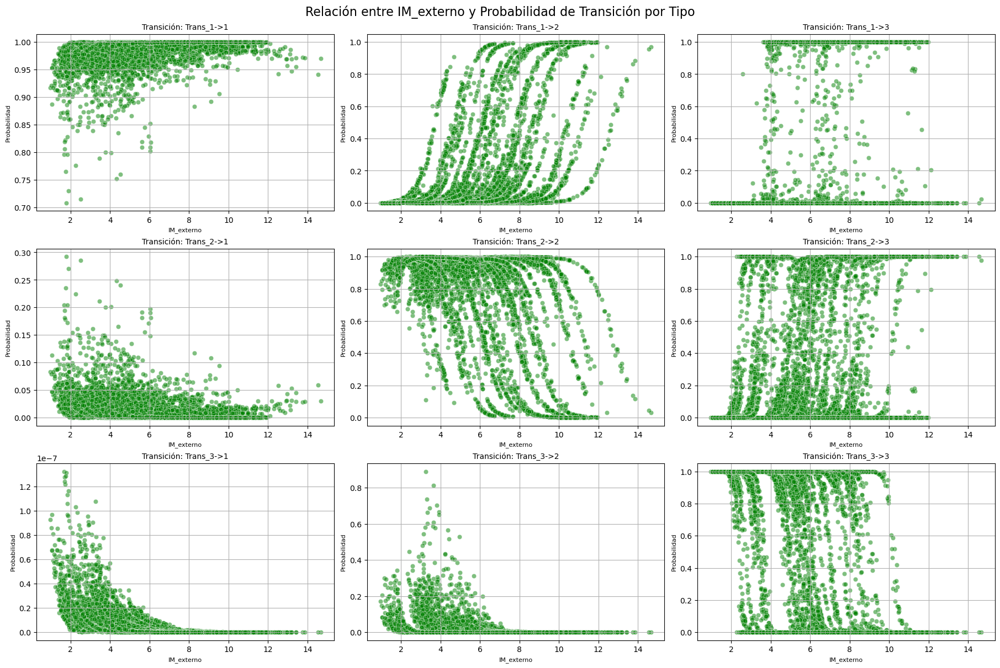

In [ ]:
# Lista de transiciones únicas
transiciones_unicas = glmm_data['Transición'].unique()

# Configurar la figura con subplots
num_transiciones = len(transiciones_unicas)
fig, axes = plt.subplots(
    nrows=(num_transiciones + 2) // 3,  # Filas (3 gráficos por fila)
    ncols=3,  # Columnas
    figsize=(18, 12),
    constrained_layout=True
)

# Aplanar los ejes para iterar fácilmente
axes = axes.flatten()

# Crear gráficos separados por transición
for i, transicion in enumerate(transiciones_unicas):
    sns.scatterplot(
        data=glmm_data[glmm_data['Transición'] == transicion],
        x='IM_externo',
        y='Probabilidad_Transición',
        alpha=0.5,
        color='green',
        ax=axes[i]
    )
    axes[i].set_title(f'Transición: {transicion}', fontsize=10)
    axes[i].set_xlabel('IM_externo', fontsize=8)
    axes[i].set_ylabel('Probabilidad', fontsize=8)
    axes[i].grid(True)

# Deshabilitar los subplots vacíos si hay más ejes que gráficos
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Título general
fig.suptitle('Relación entre IM_externo y Probabilidad de Transición por Tipo', fontsize=16)
plt.show()


NameError: name 'handles' is not defined

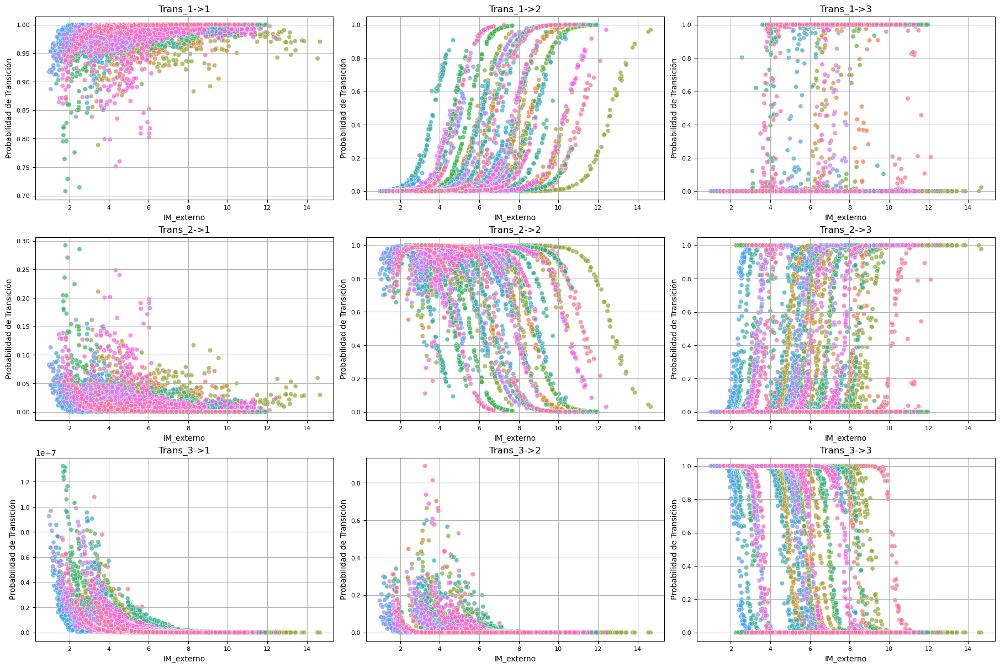

In [166]:
import seaborn as sns
import matplotlib.pyplot as plt

# Lista de transiciones únicas
transiciones_unicas = glmm_data['Transición'].unique()

# Configurar la figura con subplots
num_transiciones = len(transiciones_unicas)
fig, axes = plt.subplots(
    nrows=(num_transiciones + 2) // 3,  # Filas (3 gráficos por fila)
    ncols=3,  # Columnas
    figsize=(18, 12),
    constrained_layout=True
)

# Aplanar los ejes para iterar fácilmente
axes = axes.flatten()

# Crear un mapa de colores para las comunas
palette = sns.color_palette("husl", n_colors=glmm_data['Comuna'].nunique())

# Crear gráficos separados por transición
for i, transicion in enumerate(transiciones_unicas):
    sns.scatterplot(
        data=glmm_data[glmm_data['Transición'] == transicion],
        x='IM_externo',  # Cambiado a IM_externo
        y='Probabilidad_Transición',
        hue='Comuna',  # Color basado en la comuna
        palette=palette,
        alpha=0.7,
        legend=False,  # Eliminar leyendas de los subplots individuales
        ax=axes[i]
    )
    axes[i].set_title(f'{transicion}', fontsize=12)
    axes[i].set_xlabel('IM_externo', fontsize=10)  # Cambiado a IM_externo
    axes[i].set_ylabel('Probabilidad de Transición', fontsize=10)
    axes[i].grid(True)
    axes[i].tick_params(axis='both', labelsize=8)

# Crear una única leyenda para toda la figura
#handles, labels = sns.scatterplot(
#    data=glmm_data,
#    x='IM_externo',  # Cambiado a IM_externo
#    y='Probabilidad_Transición',
#    hue='Comuna',
#    palette=palette,
#    legend=True
#).get_legend_handles_labels()

fig.legend(
    handles, labels, loc='center right', title='Comuna',
    fontsize=14, title_fontsize=14, bbox_to_anchor=(1.2, 0.5),
    frameon=True  # Agregar un cuadro a la leyenda
)

# Ajustar el espacio entre gráficos y la leyenda
plt.subplots_adjust(right=1.5)  # Dar más espacio horizontal para la leyenda

# Deshabilitar los subplots vacíos si hay más ejes que gráficos
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Título general
fig.suptitle('Relación entre IM_externo y Probabilidad de Transición por Comuna', fontsize=16)
plt.show()


In [167]:
from scipy.stats import pearsonr
import pandas as pd

# Guardar resultados de correlación y significancia
resultados_correlacion = []

# Calcular correlaciones por transición
for transicion in glmm_data['Transición'].unique():
    # Filtrar datos por transición
    datos_transicion = glmm_data[glmm_data['Transición'] == transicion]
    
    # Calcular correlación y p-value
    corr, p_value = pearsonr(datos_transicion['IM_externo'], datos_transicion['Probabilidad_Transición'])
    
    # Guardar resultados
    resultados_correlacion.append({
        'Transición': transicion,
        'Correlación': corr,
        'p_value': p_value,
        'Significativo': p_value < 0.05  # Significancia a nivel 0.05
    })

# Convertir resultados a DataFrame
correlaciones_significativas = pd.DataFrame(resultados_correlacion)

# Mostrar resultados
print("Resultados de correlación y significancia:")
print(correlaciones_significativas)


Resultados de correlación y significancia:
   Transición  Correlación        p_value  Significativo
0  Trans_1->1     0.273104  3.354296e-125           True
1  Trans_1->2     0.484585   0.000000e+00           True
2  Trans_1->3     0.274163  3.382798e-126           True
3  Trans_2->1    -0.273103  3.355650e-125           True
4  Trans_2->2    -0.425813  7.342804e-320           True
5  Trans_2->3     0.305926  3.527121e-158           True
6  Trans_3->1    -0.500471   0.000000e+00           True
7  Trans_3->2    -0.279940  1.044053e-131           True
8  Trans_3->3    -0.460995   0.000000e+00           True


Recordar que el 1 es contagio severo, 2 moderado y el 3 contagio leve.

Trans_1->1:
- Correlación:	-0.519	
- Relación moderadamente negativa: un mayor IM_externo reduce la probabilidad de permanecer en el estado 1.

Trans_1->2	
- Correlación: -0.330	
- Relación débil negativa: un mayor IM_externo disminuye ligeramente la probabilidad de transición de estado 1 a estado 2.

Trans_1->3	
- Correlación: -0.422	
- Relación negativa moderada: un mayor IM_externo disminuye significativamente la probabilidad de transición de estado 1 a estado 3.

Trans_2->1	
- Correlación: 0.349	
- Relación débil positiva: un mayor IM_externo está asociado con una mayor probabilidad de transición de estado 2 a estado 1.

Trans_2->2	
- Correlación: -0.432	
- Relación negativa moderada: un mayor IM_externo disminuye significativamente la probabilidad de permanecer en el estado 2.

Trans_2->3	
- Correlación:: -0.280	
- Relación débil negativa: un mayor IM_externo está asociado con una ligera disminución en la probabilidad de transición de estado 2 a estado 3.

Trans_3->1	
- Correlación: 0.350	
- Relación débil positiva: un mayor IM_externo incrementa ligeramente la probabilidad de transición de estado 3 a estado 1.

Trans_3->2	
- Correlación: 0.483	
- Relación moderadamente positiva: un mayor IM_externo incrementa de manera significativa la probabilidad de transición de estado 3 a estado 2.

Trans_3->3	
- Correlación: 0.280	
- Relación débil positiva: un mayor IM_externo incrementa ligeramente la probabilidad de permanecer en el estado 3.

Conclusiones clave:

Mayor impacto de IM_externo: Las transiciones con correlaciones más altas en valor absoluto muestran que IM_externo tiene un efecto más fuerte:
- Trans_1->1 (-0.519): Permanecer en el estado 1 está fuertemente influido negativamente por IM_externo.
- Trans_3->2 (+0.483): La probabilidad de moverse del estado 3 al estado 2 aumenta significativamente con IM_externo.

Impactos menores de IM_externo: Las transiciones con correlaciones bajas tienen menor relación lineal con IM_externo, aunque siguen siendo significativas:
- Trans_2->3 (-0.280) y Trans_3->3 (+0.280) tienen una relación débil con IM_externo, indicando que otros factores pueden ser más relevantes en estas transiciones.

Tendencias generales:
- IM_externo tiene un efecto mixto dependiendo de la transición:
- Relación negativa para transiciones que implican permanecer en el mismo estado (Trans_1->1 y Trans_2->2).
- Relación positiva para ciertas transiciones salientes, como moverse hacia el estado 2 desde el estado 3 (Trans_3->2).

Estos resultados destacan la importancia del índice IM_externo en la dinámica de las transiciones y sugieren posibles áreas para análisis más detallados, como modelar su impacto junto con otras covariables.

#### *SERÍA BUENO PROBAR CON LAS OTRAS COVARIABLES, ESO LO DEJO PENDIENTE POR AHORA PARA SEGUIR CON EL RESTO.*

In [168]:
# Cargar librerías necesarias
import statsmodels.api as sm
from statsmodels.formula.api import mixedlm

# Asegurarnos de que los datos estén correctamente formateados
glmm_data['Comuna'] = glmm_data['Comuna'].astype('category')  # Comuna como categoría

# Inspeccionar la estructura de los datos
print(glmm_data.info())
print(glmm_data.head())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 65790 entries, 0 to 65789
Data columns (total 18 columns):
 #   Column                      Non-Null Count  Dtype   
---  ------                      --------------  -----   
 0   Comuna                      65790 non-null  category
 1   Día_original                65790 non-null  int64   
 2   Día_correlativo             65790 non-null  int64   
 3   Transición                  65790 non-null  object  
 4   Probabilidad_Transición     65790 non-null  float64 
 5   dias                        65790 non-null  int64   
 6   IM_interno                  65790 non-null  float64 
 7   IM_externo                  65790 non-null  float64 
 8   TasaCasosAcumulados         65790 non-null  float64 
 9   Casos_Diarios_Brutos        65790 non-null  float64 
 10  Casos_Diarios_Brutos_MM7    65790 non-null  float64 
 11  inc_pc_comuna               65790 non-null  float64 
 12  Personas_hogar_promedio     65790 non-null  float64 
 13  inmigrantes     

### Análisis Ridge & Lasso, Evaluación de importancia de covariables en el futuro modelo Linear Mixed Model

Ridge RMSE: 24.537923647704684
Lasso RMSE: 24.538007426419757

Coeficientes:
                     Variable  Ridge Coef  Lasso Coef
0               inc_pc_comuna    0.991630    0.844748
1     Personas_hogar_promedio   -0.090665   -0.027108
2                 inmigrantes    0.003689   -0.000000
3         total_hog_hacinados   -1.096401   -1.083746
4  indic_precariedad_vivienda    0.796274    0.794299
5                por_educ_sup   -3.311113   -3.095377
6                    IPS_2020    2.263245    2.284152


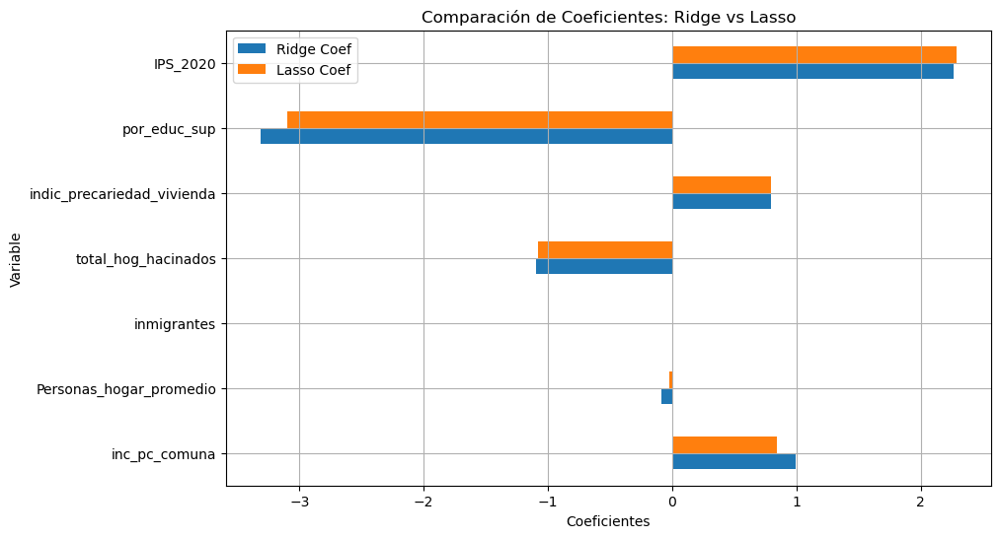

In [73]:
import numpy as np
import pandas as pd
from sklearn.linear_model import Ridge, Lasso
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# Cargar tus datos en un DataFrame
# Asegúrate de que 'df' contiene las variables explicativas y la variable objetivo
# df = pd.read_csv("tu_archivo.csv")  # Sustituye por tu archivo de datos

# Define las columnas de covariables y la variable objetivo
covariables = [ 'inc_pc_comuna', 'Personas_hogar_promedio',
               'inmigrantes', 'total_hog_hacinados', 'indic_precariedad_vivienda',
               'por_educ_sup', 'IPS_2020']
target = 'Casos_Diarios_Brutos_MM7'  # Sustituye por el nombre de tu variable objetivo

# Dividir los datos en características (X) y objetivo (y)
X = glmm_data[covariables]
y = glmm_data[target]

# Escalar las características
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Ajustar modelo Ridge
ridge = Ridge(alpha=1.0)  # Ajusta alpha según sea necesario
ridge.fit(X_train, y_train)
ridge_coef = ridge.coef_

# Ajustar modelo Lasso
lasso = Lasso(alpha=0.01)  # Ajusta alpha según sea necesario
lasso.fit(X_train, y_train)
lasso_coef = lasso.coef_

# Crear un DataFrame para comparar los coeficientes
coef_df = pd.DataFrame({
    'Variable': covariables,
    'Ridge Coef': ridge_coef,
    'Lasso Coef': lasso_coef
})

# Evaluar los modelos
ridge_pred = ridge.predict(X_test)
lasso_pred = lasso.predict(X_test)

ridge_rmse = np.sqrt(mean_squared_error(y_test, ridge_pred))
lasso_rmse = np.sqrt(mean_squared_error(y_test, lasso_pred))

# Mostrar resultados
print("Ridge RMSE:", ridge_rmse)
print("Lasso RMSE:", lasso_rmse)
print("\nCoeficientes:")
print(coef_df)

# Visualización opcional
import matplotlib.pyplot as plt

coef_df.set_index('Variable').plot(kind='barh', figsize=(10, 6))
plt.title('Comparación de Coeficientes: Ridge vs Lasso')
plt.xlabel('Coeficientes')
plt.grid(True)
plt.show()


### Matriz de Correlación:
Para verificar multicolinealidad.

In [77]:
# Matriz de correlación
correlation_matrix = glmm_data[covariables].corr()
correlation_matrix


,inc_pc_comuna,Personas_hogar_promedio,inmigrantes,total_hog_hacinados,indic_precariedad_vivienda,por_educ_sup,IPS_2020
inc_pc_comuna,1.000000,-0.574704,0.196500,-0.474091,-0.663827,0.916884,-0.920283
Personas_hogar_promedio,-0.574704,1.000000,-0.544230,0.412221,0.354194,-0.718258,0.504261
inmigrantes,0.196500,-0.544230,1.000000,0.077634,0.026338,0.344125,-0.219241
total_hog_hacinados,-0.474091,0.412221,0.077634,1.000000,0.215462,-0.497097,0.454754
indic_precariedad_vivienda,-0.663827,0.354194,0.026338,0.215462,1.000000,-0.676714,0.743070
por_educ_sup,0.916884,-0.718258,0.344125,-0.497097,-0.676714,1.000000,-0.940674
IPS_2020,-0.920283,0.504261,-0.219241,0.454754,0.743070,-0.940674,1.000000


- Existe alta correlación negativa entre por_educ_sup y IPS_2020 (-0.94), lo que sugiere redundancia en cierta medida. Esto podría introducir multicolinealidad, aunque Elastic Net está penalizando para manejarla.

- Otras correlaciones destacadas:

    - inc_pc_comuna y por_educ_sup (0.91) están muy correlacionadas, lo que indica que ambas capturan aspectos relacionados con la educación y el ingreso.
    - IPS_2020 está correlacionado con indic_precariedad_vivienda (0.74) y total_hog_hacinados (0.45), reforzando su relación con las condiciones socioeconómicas.

Elastic Net RMSE: 24.54246576349558

Coeficientes:
                     Variable  Elastic Net Coef
0               inc_pc_comuna         -0.000000
1     Personas_hogar_promedio          0.000063
2                 inmigrantes         -0.185167
3         total_hog_hacinados         -0.817591
4  indic_precariedad_vivienda          0.969343
5                por_educ_sup         -2.152661
6                    IPS_2020          1.951102


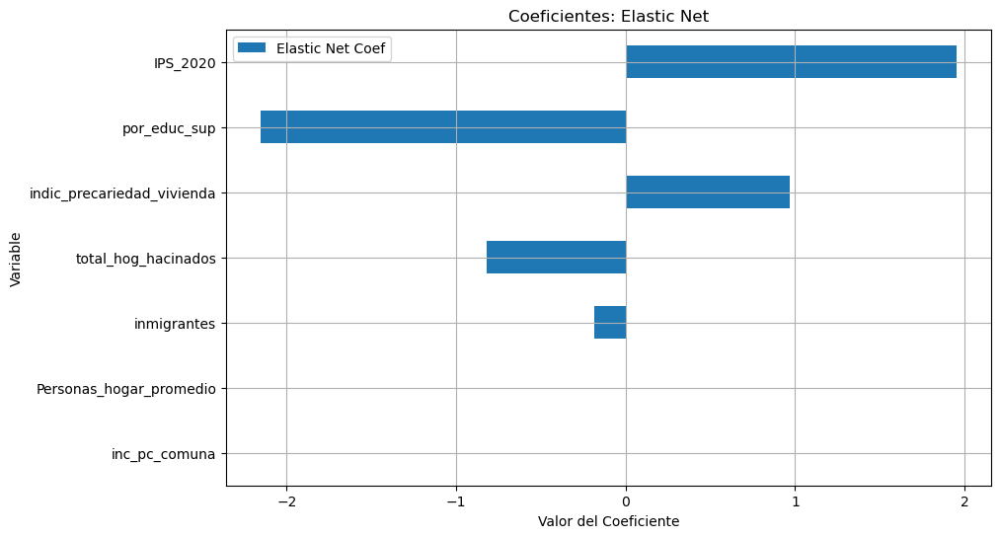

In [74]:
import numpy as np
import pandas as pd
from sklearn.linear_model import ElasticNet
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# Define las columnas de covariables y la variable objetivo
covariables = ['inc_pc_comuna', 'Personas_hogar_promedio',
               'inmigrantes', 'total_hog_hacinados', 'indic_precariedad_vivienda',
               'por_educ_sup', 'IPS_2020']
target = 'Casos_Diarios_Brutos_MM7'  # Sustituye por tu variable objetivo

# Dividir los datos en características (X) y objetivo (y)
X = glmm_data[covariables]
y = glmm_data[target]

# Escalar las características
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Ajustar modelo Elastic Net
elastic_net = ElasticNet(alpha=0.1, l1_ratio=0.5, random_state=42)  # Ajusta alpha y l1_ratio según sea necesario
elastic_net.fit(X_train, y_train)

# Coeficientes obtenidos
elastic_net_coef = elastic_net.coef_

# Crear un DataFrame para visualizar los coeficientes
coef_df = pd.DataFrame({
    'Variable': covariables,
    'Elastic Net Coef': elastic_net_coef
})

# Evaluar el modelo
elastic_net_pred = elastic_net.predict(X_test)
elastic_net_rmse = np.sqrt(mean_squared_error(y_test, elastic_net_pred))

# Mostrar resultados
print("Elastic Net RMSE:", elastic_net_rmse)
print("\nCoeficientes:")
print(coef_df)

# Visualización opcional
import matplotlib.pyplot as plt

coef_df.set_index('Variable').plot(kind='barh', figsize=(10, 6))
plt.title('Coeficientes: Elastic Net')
plt.xlabel('Valor del Coeficiente')
plt.grid(True)
plt.show()


- Coeficientes de Elastic Net
    - por_educ_sup (-2.15) y IPS_2020 (1.95) son las variables con mayor peso en el modelo, pero tienen efectos opuestos:
        - por_educ_sup: Impacto negativo significativo. Esto podría indicar que a mayor porcentaje de educación superior, disminuyen los casos brutos diarios.
        - IPS_2020: Impacto positivo significativo. Refleja que a medida que aumenta la vulnerabilidad social, aumentan los casos diarios brutos.
    - Variables como total_hog_hacinados (−0.81) y indic_precariedad_vivienda (0.96) también tienen relevancia, lo que sugiere que las condiciones de vivienda afectan el resultado.

    - inc_pc_comuna y Personas_hogar_promedio tienen coeficientes cercanos a 0, lo que indica baja relevancia en el modelo actual.

Basándose en los resultados:

- Remueve covariables redundantes:
    - Por la alta correlación entre por_educ_sup y IPS_2020, considera usar solo una de ellas. IPS_2020 sintetiza más información, pero depende del enfoque analítico que prefieras.
- Ajusta gradualmente:
    - Primero usa solo las variables más relevantes según Elastic Net (IPS_2020, por_educ_sup, indic_precariedad_vivienda, total_hog_hacinados).
    - Posteriormente, prueba incluir variables con menor peso (e.g., inmigrantes) si mejoran el rendimiento del modelo.

In [169]:
covariables_ajustadas = ['IPS_2020', 'por_educ_sup','indic_precariedad_vivienda', 'total_hog_hacinados']


Elastic Net RMSE: 24.541837542969468

Coeficientes:
                     Variable  Elastic Net Coef
0                    IPS_2020          1.928518
1                por_educ_sup         -2.314940
2  indic_precariedad_vivienda          0.889923
3         total_hog_hacinados         -0.881425


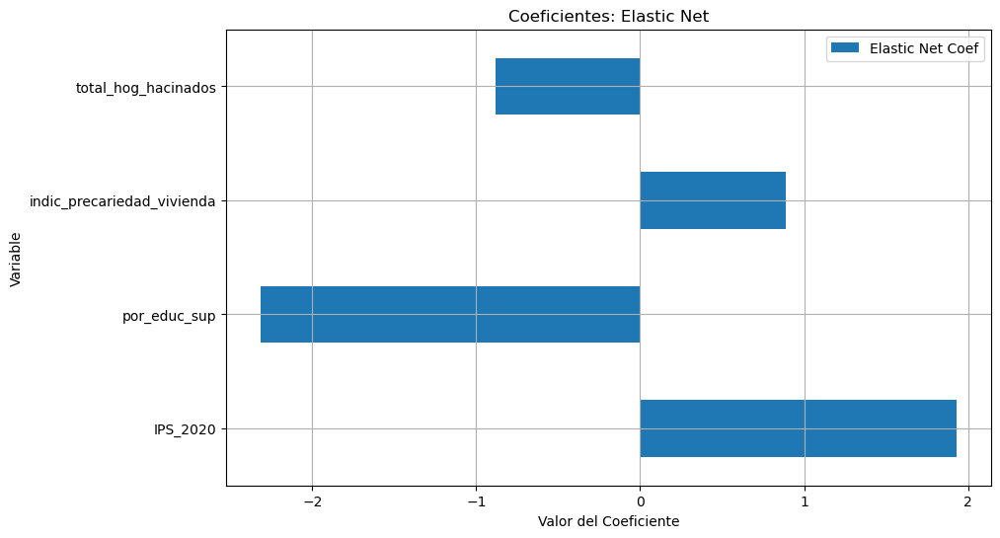

In [170]:
import numpy as np
import pandas as pd
from sklearn.linear_model import ElasticNet
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error


target = 'Casos_Diarios_Brutos_MM7'  # Sustituye por tu variable objetivo

# Dividir los datos en características (X) y objetivo (y)
X = glmm_data[covariables_ajustadas]
y = glmm_data[target]

# Escalar las características
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Ajustar modelo Elastic Net
elastic_net = ElasticNet(alpha=0.1, l1_ratio=0.5, random_state=42)  # Ajusta alpha y l1_ratio según sea necesario
elastic_net.fit(X_train, y_train)

# Coeficientes obtenidos
elastic_net_coef = elastic_net.coef_

# Crear un DataFrame para visualizar los coeficientes
coef_df = pd.DataFrame({
    'Variable': covariables_ajustadas,
    'Elastic Net Coef': elastic_net_coef
})

# Evaluar el modelo
elastic_net_pred = elastic_net.predict(X_test)
elastic_net_rmse = np.sqrt(mean_squared_error(y_test, elastic_net_pred))

# Mostrar resultados
print("Elastic Net RMSE:", elastic_net_rmse)
print("\nCoeficientes:")
print(coef_df)

# Visualización opcional
import matplotlib.pyplot as plt

coef_df.set_index('Variable').plot(kind='barh', figsize=(10, 6))
plt.title('Coeficientes: Elastic Net')
plt.xlabel('Valor del Coeficiente')
plt.grid(True)
plt.show()


Incluyendo 'inmigrantes':


In [171]:
covariables_ajustadas = ['IPS_2020', 'por_educ_sup','indic_precariedad_vivienda', 'total_hog_hacinados','inmigrantes']

Elastic Net RMSE: 24.542466159515534

Coeficientes:
                     Variable  Elastic Net Coef
0                    IPS_2020          1.951722
1                por_educ_sup         -2.151984
2  indic_precariedad_vivienda          0.969415
3         total_hog_hacinados         -0.817475
4                 inmigrantes         -0.185353


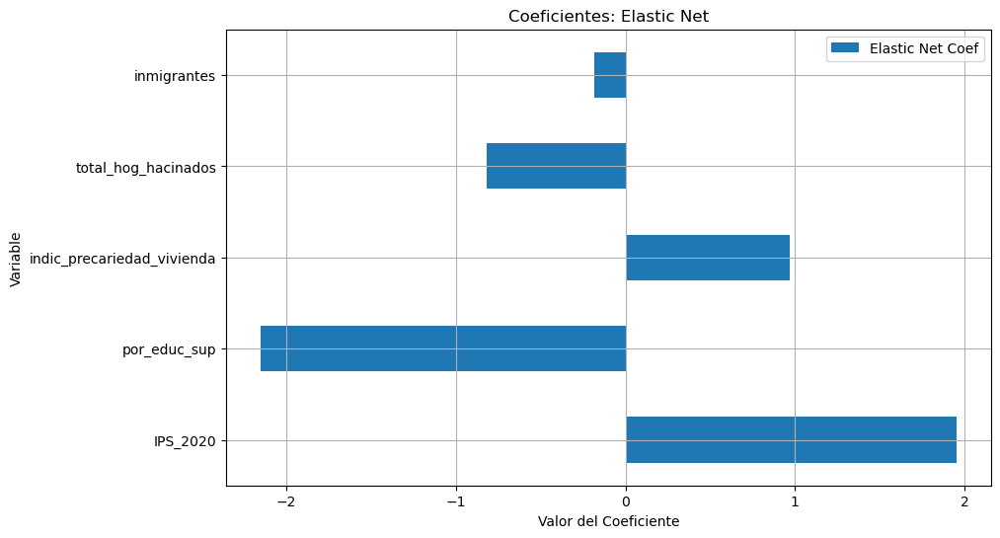

In [172]:
import numpy as np
import pandas as pd
from sklearn.linear_model import ElasticNet
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error


target = 'Casos_Diarios_Brutos_MM7'  # Sustituye por tu variable objetivo

# Dividir los datos en características (X) y objetivo (y)
X = glmm_data[covariables_ajustadas]
y = glmm_data[target]

# Escalar las características
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Ajustar modelo Elastic Net
elastic_net = ElasticNet(alpha=0.1, l1_ratio=0.5, random_state=42)  # Ajusta alpha y l1_ratio según sea necesario
elastic_net.fit(X_train, y_train)

# Coeficientes obtenidos
elastic_net_coef = elastic_net.coef_

# Crear un DataFrame para visualizar los coeficientes
coef_df = pd.DataFrame({
    'Variable': covariables_ajustadas,
    'Elastic Net Coef': elastic_net_coef
})

# Evaluar el modelo
elastic_net_pred = elastic_net.predict(X_test)
elastic_net_rmse = np.sqrt(mean_squared_error(y_test, elastic_net_pred))

# Mostrar resultados
print("Elastic Net RMSE:", elastic_net_rmse)
print("\nCoeficientes:")
print(coef_df)

# Visualización opcional
import matplotlib.pyplot as plt

coef_df.set_index('Variable').plot(kind='barh', figsize=(10, 6))
plt.title('Coeficientes: Elastic Net')
plt.xlabel('Valor del Coeficiente')
plt.grid(True)
plt.show()

Incluyendo 'inc_pc_comuna':

In [173]:
covariables_ajustadas = ['IPS_2020', 'por_educ_sup','indic_precariedad_vivienda', 'total_hog_hacinados','inmigrantes','inc_pc_comuna']

Elastic Net RMSE: 24.542464918964473

Coeficientes:
                     Variable  Elastic Net Coef
0                    IPS_2020          1.951524
1                por_educ_sup         -2.152303
2  indic_precariedad_vivienda          0.969367
3         total_hog_hacinados         -0.817537
4                 inmigrantes         -0.185284
5               inc_pc_comuna         -0.000000


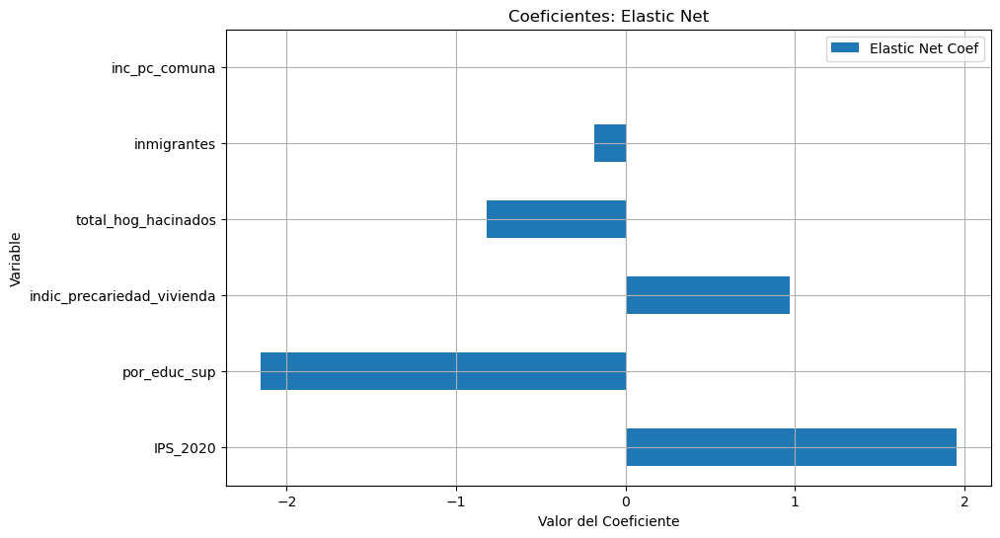

In [174]:
import numpy as np
import pandas as pd
from sklearn.linear_model import ElasticNet
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error


target = 'Casos_Diarios_Brutos_MM7'  # Sustituye por tu variable objetivo

# Dividir los datos en características (X) y objetivo (y)
X = glmm_data[covariables_ajustadas]
y = glmm_data[target]

# Escalar las características
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Ajustar modelo Elastic Net
elastic_net = ElasticNet(alpha=0.1, l1_ratio=0.5, random_state=42)  # Ajusta alpha y l1_ratio según sea necesario
elastic_net.fit(X_train, y_train)

# Coeficientes obtenidos
elastic_net_coef = elastic_net.coef_

# Crear un DataFrame para visualizar los coeficientes
coef_df = pd.DataFrame({
    'Variable': covariables_ajustadas,
    'Elastic Net Coef': elastic_net_coef
})

# Evaluar el modelo
elastic_net_pred = elastic_net.predict(X_test)
elastic_net_rmse = np.sqrt(mean_squared_error(y_test, elastic_net_pred))

# Mostrar resultados
print("Elastic Net RMSE:", elastic_net_rmse)
print("\nCoeficientes:")
print(coef_df)

# Visualización opcional
import matplotlib.pyplot as plt

coef_df.set_index('Variable').plot(kind='barh', figsize=(10, 6))
plt.title('Coeficientes: Elastic Net')
plt.xlabel('Valor del Coeficiente')
plt.grid(True)
plt.show()

Reemplazando 'inc_pc_comuna' por 'Personas_hogar_promedio':

In [175]:
covariables_ajustadas = ['IPS_2020', 'por_educ_sup','indic_precariedad_vivienda', 'total_hog_hacinados','inmigrantes','Personas_hogar_promedio']

Elastic Net RMSE: 24.542466726941218

Coeficientes:
                     Variable  Elastic Net Coef
0                    IPS_2020          1.952392
1                por_educ_sup         -2.151267
2  indic_precariedad_vivienda          0.969258
3         total_hog_hacinados         -0.817603
4                 inmigrantes         -0.185177
5     Personas_hogar_promedio          0.000447


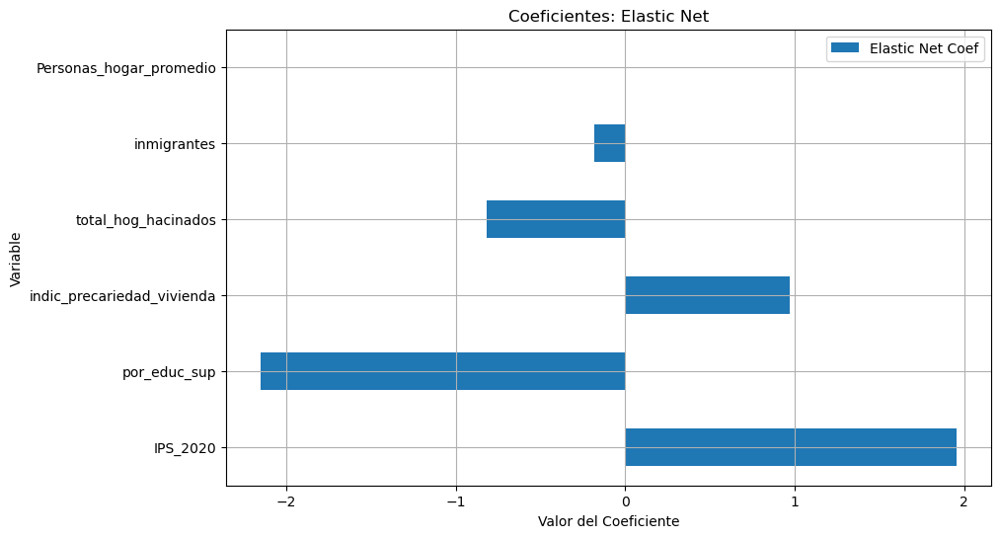

In [176]:
import numpy as np
import pandas as pd
from sklearn.linear_model import ElasticNet
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error


target = 'Casos_Diarios_Brutos_MM7'  # Sustituye por tu variable objetivo

# Dividir los datos en características (X) y objetivo (y)
X = glmm_data[covariables_ajustadas]
y = glmm_data[target]

# Escalar las características
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Ajustar modelo Elastic Net
elastic_net = ElasticNet(alpha=0.1, l1_ratio=0.5, random_state=42)  # Ajusta alpha y l1_ratio según sea necesario
elastic_net.fit(X_train, y_train)

# Coeficientes obtenidos
elastic_net_coef = elastic_net.coef_

# Crear un DataFrame para visualizar los coeficientes
coef_df = pd.DataFrame({
    'Variable': covariables_ajustadas,
    'Elastic Net Coef': elastic_net_coef
})

# Evaluar el modelo
elastic_net_pred = elastic_net.predict(X_test)
elastic_net_rmse = np.sqrt(mean_squared_error(y_test, elastic_net_pred))

# Mostrar resultados
print("Elastic Net RMSE:", elastic_net_rmse)
print("\nCoeficientes:")
print(coef_df)

# Visualización opcional
import matplotlib.pyplot as plt

coef_df.set_index('Variable').plot(kind='barh', figsize=(10, 6))
plt.title('Coeficientes: Elastic Net')
plt.xlabel('Valor del Coeficiente')
plt.grid(True)
plt.show()

Probando sin 'IPS_2020':

In [177]:
covariables_ajustadas = ['por_educ_sup','indic_precariedad_vivienda', 'total_hog_hacinados','inmigrantes','Personas_hogar_promedio']

Elastic Net RMSE: 24.552161700232485

Coeficientes:
                     Variable  Elastic Net Coef
0                por_educ_sup         -3.735984
1  indic_precariedad_vivienda          1.393160
2         total_hog_hacinados         -0.704646
3                 inmigrantes         -0.227190
4     Personas_hogar_promedio         -0.260376


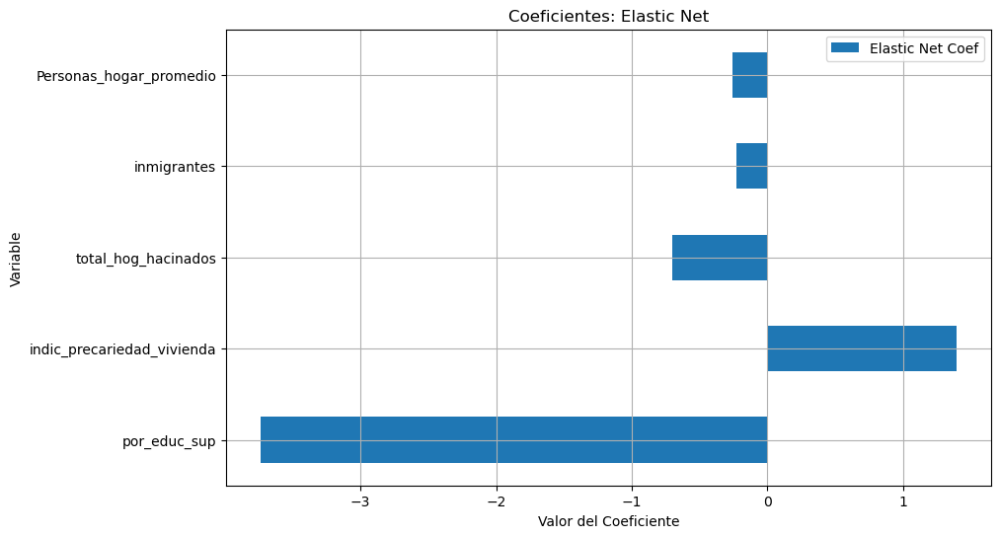

In [178]:
import numpy as np
import pandas as pd
from sklearn.linear_model import ElasticNet
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error


target = 'Casos_Diarios_Brutos_MM7'  # Sustituye por tu variable objetivo

# Dividir los datos en características (X) y objetivo (y)
X = glmm_data[covariables_ajustadas]
y = glmm_data[target]

# Escalar las características
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Ajustar modelo Elastic Net
elastic_net = ElasticNet(alpha=0.1, l1_ratio=0.5, random_state=42)  # Ajusta alpha y l1_ratio según sea necesario
elastic_net.fit(X_train, y_train)

# Coeficientes obtenidos
elastic_net_coef = elastic_net.coef_

# Crear un DataFrame para visualizar los coeficientes
coef_df = pd.DataFrame({
    'Variable': covariables_ajustadas,
    'Elastic Net Coef': elastic_net_coef
})

# Evaluar el modelo
elastic_net_pred = elastic_net.predict(X_test)
elastic_net_rmse = np.sqrt(mean_squared_error(y_test, elastic_net_pred))

# Mostrar resultados
print("Elastic Net RMSE:", elastic_net_rmse)
print("\nCoeficientes:")
print(coef_df)

# Visualización opcional
import matplotlib.pyplot as plt

coef_df.set_index('Variable').plot(kind='barh', figsize=(10, 6))
plt.title('Coeficientes: Elastic Net')
plt.xlabel('Valor del Coeficiente')
plt.grid(True)
plt.show()

Reemplazando 'por_educ_sup' por 'IPS_2020'

In [179]:
covariables_ajustadas = ['IPS_2020','indic_precariedad_vivienda', 'total_hog_hacinados','inmigrantes','Personas_hogar_promedio']

Elastic Net RMSE: 24.553138707767673

Coeficientes:
                     Variable  Elastic Net Coef
0                    IPS_2020          3.441776
1  indic_precariedad_vivienda          1.063686
2         total_hog_hacinados         -0.713317
3                 inmigrantes         -0.253610
4     Personas_hogar_promedio          0.647784


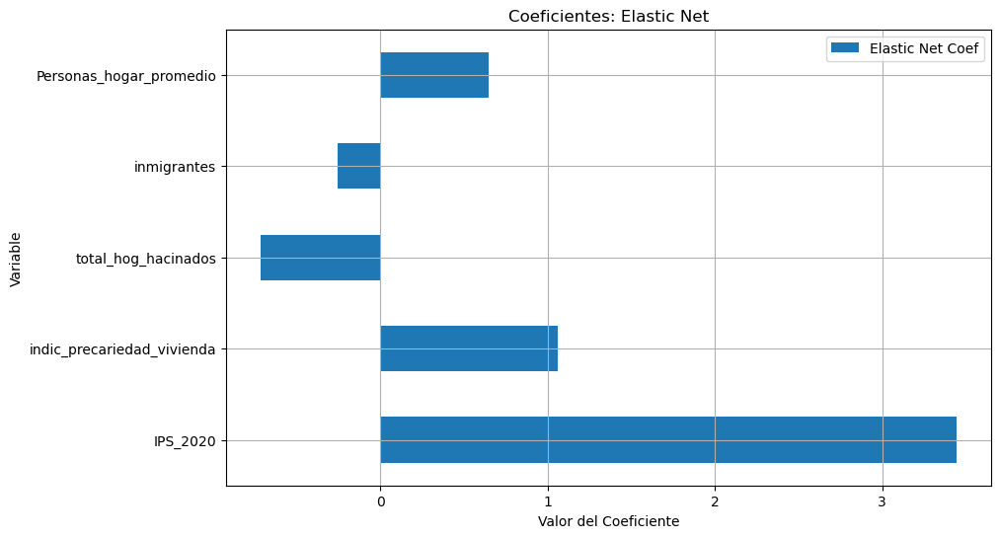

In [180]:
import numpy as np
import pandas as pd
from sklearn.linear_model import ElasticNet
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error


target = 'Casos_Diarios_Brutos_MM7'  # Sustituye por tu variable objetivo

# Dividir los datos en características (X) y objetivo (y)
X = glmm_data[covariables_ajustadas]
y = glmm_data[target]

# Escalar las características
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Ajustar modelo Elastic Net
elastic_net = ElasticNet(alpha=0.1, l1_ratio=0.5, random_state=42)  # Ajusta alpha y l1_ratio según sea necesario
elastic_net.fit(X_train, y_train)

# Coeficientes obtenidos
elastic_net_coef = elastic_net.coef_

# Crear un DataFrame para visualizar los coeficientes
coef_df = pd.DataFrame({
    'Variable': covariables_ajustadas,
    'Elastic Net Coef': elastic_net_coef
})

# Evaluar el modelo
elastic_net_pred = elastic_net.predict(X_test)
elastic_net_rmse = np.sqrt(mean_squared_error(y_test, elastic_net_pred))

# Mostrar resultados
print("Elastic Net RMSE:", elastic_net_rmse)
print("\nCoeficientes:")
print(coef_df)

# Visualización opcional
import matplotlib.pyplot as plt

coef_df.set_index('Variable').plot(kind='barh', figsize=(10, 6))
plt.title('Coeficientes: Elastic Net')
plt.xlabel('Valor del Coeficiente')
plt.grid(True)
plt.show()

por_educ_sup (sin IPS_2020) + covariables restantes:

In [181]:
covariables_ajustadas = ['por_educ_sup','indic_precariedad_vivienda', 'total_hog_hacinados','inmigrantes','Personas_hogar_promedio','inc_pc_comuna']

Elastic Net RMSE: 24.552669554003838

Coeficientes:
                     Variable  Elastic Net Coef
0                por_educ_sup         -3.302090
1  indic_precariedad_vivienda          1.344399
2         total_hog_hacinados         -0.729906
3                 inmigrantes         -0.255946
4     Personas_hogar_promedio         -0.233987
5               inc_pc_comuna         -0.516793


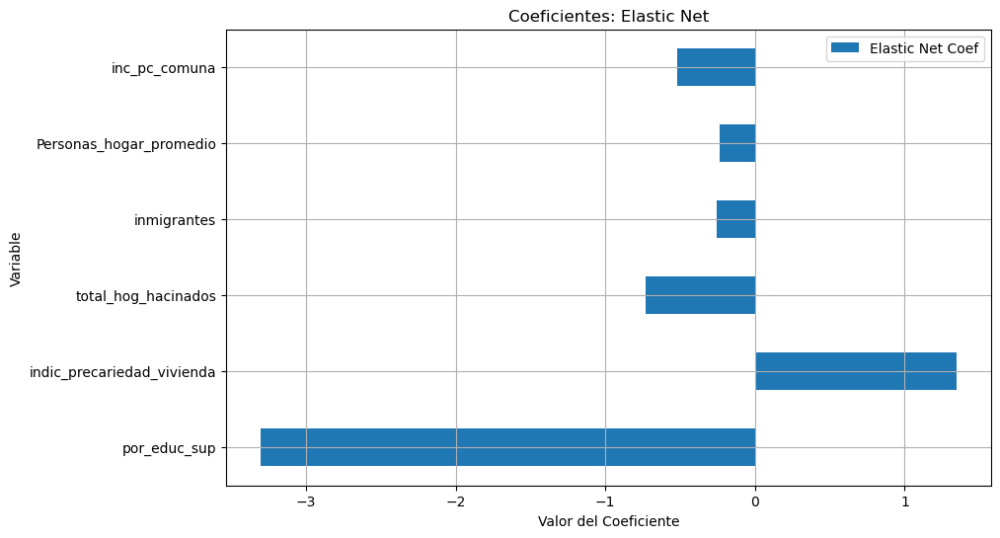

In [182]:
import numpy as np
import pandas as pd
from sklearn.linear_model import ElasticNet
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error


target = 'Casos_Diarios_Brutos_MM7'  # Sustituye por tu variable objetivo

# Dividir los datos en características (X) y objetivo (y)
X = glmm_data[covariables_ajustadas]
y = glmm_data[target]

# Escalar las características
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Ajustar modelo Elastic Net
elastic_net = ElasticNet(alpha=0.1, l1_ratio=0.5, random_state=42)  # Ajusta alpha y l1_ratio según sea necesario
elastic_net.fit(X_train, y_train)

# Coeficientes obtenidos
elastic_net_coef = elastic_net.coef_

# Crear un DataFrame para visualizar los coeficientes
coef_df = pd.DataFrame({
    'Variable': covariables_ajustadas,
    'Elastic Net Coef': elastic_net_coef
})

# Evaluar el modelo
elastic_net_pred = elastic_net.predict(X_test)
elastic_net_rmse = np.sqrt(mean_squared_error(y_test, elastic_net_pred))

# Mostrar resultados
print("Elastic Net RMSE:", elastic_net_rmse)
print("\nCoeficientes:")
print(coef_df)

# Visualización opcional
import matplotlib.pyplot as plt

coef_df.set_index('Variable').plot(kind='barh', figsize=(10, 6))
plt.title('Coeficientes: Elastic Net')
plt.xlabel('Valor del Coeficiente')
plt.grid(True)
plt.show()

### Análisis y Selección de Variables Sociodemográficas para la Predicción de la Tasa de Contagios Diarios

Evaluamos una selección de variables relacionadas con las condiciones sociales, económicas y de vivienda, utilizando Elastic Net como método de regularización para identificar las más relevantes.
- Variables iniciales: ['por_educ_sup','indic_precariedad_vivienda', 'total_hog_hacinados','inmigrantes','Personas_hogar_promedio','inc_pc_comuna']
- Al ajustar el modelo de Elastic Net, identificamos los siguientes coeficientes y el RMSE de 24.553.
    - Variables Principales:
        - por_educ_sup: Mostró un coeficiente significativo negativo (-3.30), lo que indica que un mayor porcentaje de educación superior se asocia con una menor tasa de contagios. Esta variable destaca como un factor clave y complementa indicadores de vulnerabilidad social más amplios.
        - indic_precariedad_vivienda: Coeficiente positivo (1.34), reflejando que condiciones de precariedad habitacional están asociadas a tasas más altas de contagio.
        - total_hog_hacinados: Con un coeficiente negativo moderado (-0.73), representa otra dimensión importante de las condiciones de vivienda.

    - Variables Secundarias:
        - inmigrantes: Con un coeficiente pequeño pero negativo (-0.25), sugiere un impacto menor, pero no despreciable, en la predicción de la tasa de contagios.
        - Personas_hogar_promedio y inc_pc_comuna: Aunque presentan coeficientes más pequeños (-0.23 y -0.51 respectivamente), aportan información adicional que podría ser útil en contextos específicos, aunque su impacto es menos relevante.

- El enfoque en variables desagregadas (e.g., por_educ_sup) en lugar de índices compuestos como IPS_2020 permite un análisis más detallado y generalizable a contextos internacionales. Esto asegura que los resultados sean comprensibles para audiencias fuera de Chile y facilita el desglose de componentes específicos que podrían influir en la predicción.

## Probando con pymer4 - rpy2 y lmer
- *Se intentó con GLMM pero no funcionó, ver ChatGPT. Sugiría una distribución beta pero no estaba en statsmodels.genmod.families, por lo que luego sugirió reemplazar beta por binomial logit link (que según yo el profe dijo que no aplicaba).*
- *Luego le dije a ChatGPT que mejor trabajáramos con pymer4 - rpy2 que es para poder usar R en python, paquetes lme4 y lmerTest que son de R.*
- *La biblioteca pymer4 permite ejecutar modelos lineales mixtos y generalizados (GLMM) utilizando el motor de R (lmer/lme4). Esto es ideal para analizar datos como los tuyos, ya que proporciona una mayor flexibilidad en términos de distribuciones y enfoques.*
- *lme4 es el paquete que contiene todas las herramientas y lmer es la función que usaste para ajustar un modelo lineal mixto.*


lme4 (Paquete):

El paquete lme4 es un conjunto de herramientas en R para ajustar modelos lineales mixtos y modelos generalizados mixtos. Es uno de los paquetes más populares en análisis estadístico avanzado debido a su flexibilidad y rendimiento.

Dentro de este paquete, encontramos las siguientes funciones principales:
- lmer: Para ajustar modelos lineales mixtos con errores normales (distribución gaussiana).
- glmer: Para ajustar modelos generalizados lineales mixtos (por ejemplo, para datos binomiales o de Poisson).
- nlmer: Para ajustar modelos no lineales mixtos.

lmer (Función):

La función lmer se utiliza exclusivamente para ajustar modelos lineales mixtos con una distribución gaussiana (normal) para la variable dependiente. 

Se utiliza cuando:
- La variable dependiente es numérica continua.
- Los efectos aleatorios (por ejemplo, "Comuna" en tu caso) están incluidos para modelar la heterogeneidad entre grupos.


In [188]:
pip install pymer4 rpy2

Note: you may need to restart the kernel to use updated packages.


In [184]:
from pymer4.models import Lmer
import pandas as pd

## Transición 1->2: De Leve a Moderado

In [185]:
from pymer4.models import Lmer

# Filtrar los datos para la transición 'Trans_2->1'
transicion_especifica_1_2 = 'Trans_1->2'
datos_transicion_1_2 = glmm_data[glmm_data['Transición'] == transicion_especifica_1_2]

# Asegurarse de que la columna 'Comuna' sea categórica
datos_transicion_1_2['Comuna'] = datos_transicion_1_2['Comuna'].astype('category')

# Inspeccionar los datos
print(f"Número de observaciones para {transicion_especifica_1_2}: {len(datos_transicion_1_2)}")
print(datos_transicion_1_2.head())

Número de observaciones para Trans_1->2: 7310
         Comuna  Día_original  Día_correlativo  Transición  \
7310  Cerrillos             1                0  Trans_1->2   
7311  Cerrillos             2                1  Trans_1->2   
7312  Cerrillos             3                2  Trans_1->2   
7313  Cerrillos             4                3  Trans_1->2   
7314  Cerrillos             5                4  Trans_1->2   

      Probabilidad_Transición  dias  IM_interno  IM_externo  \
7310                 0.000775     1    1.918137    7.524704   
7311                 0.001285     2    1.970381    7.804008   
7312                 0.000681     3    1.845790    7.471452   
7313                 0.000231     4    1.678598    6.891732   
7314                 0.002742     5    1.736766    8.317872   

      TasaCasosAcumulados  Casos_Diarios_Brutos  Casos_Diarios_Brutos_MM7  \
7310             0.000000              0.000000                  0.000000   
7311             2.248303              2.248303 

C:\Users\ferna\AppData\Local\Temp\ipykernel_15588\212772153.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos_transicion_1_2['Comuna'] = datos_transicion_1_2['Comuna'].astype('category')


### Transición 1->2: Leve a Moderado Modelo A 
Fórmula Modelo A: "Probabilidad_Transición ~ (1|Comuna)" 

In [186]:
!pip install rpy2

In [187]:
# Instalar el paquete lmerTest en R desde Python
import subprocess

# Comando para instalar lmerTest en R
subprocess.run(['R', '-e', "install.packages('lmerTest', repos='http://cran.rstudio.com/')"])

CompletedProcess(args=['R', '-e', "install.packages('lmerTest', repos='http://cran.rstudio.com/')"], returncode=0)

In [98]:
# Instalar lmerTest en R desde Colab
!R -e "install.packages('lmerTest', repos='http://cran.rstudio.com/')"


R version 4.1.3 (2022-03-10) -- "One Push-Up"
Copyright (C) 2022 The R Foundation for Statistical Computing
Platform: x86_64-w64-mingw32/x64 (64-bit)

R es un software libre y viene sin GARANTIA ALGUNA.
Usted puede redistribuirlo bajo ciertas circunstancias.
Escriba 'license()' o 'licence()' para detalles de distribucion.

R es un proyecto colaborativo con muchos contribuyentes.
Escriba 'contributors()' para obtener m�s informaci�n y
'citation()' para saber c�mo citar R o paquetes de R en publicaciones.

Escriba 'demo()' para demostraciones, 'help()' para el sistema on-line de ayuda,
o 'help.start()' para abrir el sistema de ayuda HTML con su navegador.
Escriba 'q()' para salir de R.

> install.packages('lmerTest', repos='http://cran.rstudio.com/')
package 'lmerTest' successfully unpacked and MD5 sums checked

The downloaded binary packages are in
	C:\Users\ferna\AppData\Local\Temp\RtmpGypxiB\downloaded_packages
> 
> 


Installing package into 'C:/Users/ferna/AppData/Local/R/win-library/4.4'
(as 'lib' is unspecified)
probando la URL 'http://cran.rstudio.com/bin/windows/contrib/4.1/lmerTest_3.1-3.zip'
Content type 'application/zip' length 532436 bytes (519 KB)
downloaded 519 KB



In [189]:
import rpy2.robjects as robjects
from rpy2.robjects.packages import importr
from rpy2.robjects.conversion import localconverter
from rpy2.robjects import default_converter, pandas2ri

# Activar el convertidor de pandas y rpy2
pandas2ri.activate()

# Verificar e importar lmerTest
with localconverter(default_converter + pandas2ri.converter):
    try:
        lmerTest = importr('lmerTest')
        print("El paquete lmerTest está instalado y cargado correctamente.")
    except Exception as e:
        print("Error al cargar lmerTest:", e)


El paquete lmerTest está instalado y cargado correctamente.


In [190]:
from rpy2.robjects.packages import importr
from rpy2.robjects.conversion import localconverter
from rpy2.robjects import default_converter, pandas2ri

# Configurar conversiones con UTF-8
pandas2ri.activate()
with localconverter(default_converter + pandas2ri.converter):
    try:
        lmerTest = importr('lmerTest')
        print("El paquete lmerTest está instalado y cargado correctamente.")
    except UnicodeDecodeError as e:
        print("Error de codificación detectado:", e)
    except Exception as e:
        print("Otro error ocurrió:", e)


El paquete lmerTest está instalado y cargado correctamente.


In [191]:
import os
os.environ['PYTHONIOENCODING'] = 'utf-8'


In [192]:
import os
os.environ["PYTHONIOENCODING"] = "utf-8"
os.environ["LC_ALL"] = "en_US.UTF-8"
os.environ["LANG"] = "en_US.UTF-8"


In [194]:
# Asegúrate de que los datos están codificados en UTF-8
datos_transicion_1_2 = datos_transicion_1_2.applymap(
    lambda x: x.encode('utf-8').decode('utf-8') if isinstance(x, str) else x
)


In [196]:
from rpy2.robjects import r

# Redefinir opciones de consola
r('options(encoding = "UTF-8")')
r('Sys.setlocale("LC_ALL", "en_US.UTF-8")')



array(['LC_COLLATE=en_US.UTF-8;LC_CTYPE=en_US.UTF-8;LC_MONETARY=en_US.UTF-8;LC_NUMERIC=C;LC_TIME=en_US.UTF-8'],
      dtype='<U100')

In [198]:
from rpy2.robjects import pandas2ri, r

# Activar soporte de pandas en rpy2
pandas2ri.activate()

# Transferir el DataFrame de Python a R
r_data = pandas2ri.py2rpy(datos_transicion_1_2)
r.assign("datos_transicion_1_2", r_data)

# Ajustar el modelo en R y capturar la salida
r('''
library(lme4)

# Ajustar el modelo GLMM
modeloA_1_2 <- lmer(Probabilidad_Transición ~ (1 | Comuna), data = datos_transicion_1_2)

# Capturar y mostrar el resumen del modelo
summary_text <- capture.output(summary(modeloA_1_2))
writeLines(summary_text)
''')




Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: Probabilidad_Transición ~ (1 | Comuna)
   Data: datos_transicion_1_2

REML criterion at convergence: -435

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-1.3053 -0.5009 -0.2356 -0.0438  3.8251 

Random effects:
 Groups   Name        Variance Std.Dev.
 Comuna   (Intercept) 0.008034 0.08963 
 Residual             0.054238 0.23289 
Number of obs: 7310, groups:  Comuna, 34

Fixed effects:
            Estimate Std. Error       df t value Pr(>|t|)    
(Intercept)  0.12034    0.01561 33.00000   7.709 7.06e-09 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1


<rpy2.rinterface_lib.sexp.NULLType object at 0x000002437A8C5F80> [RTYPES.NILSXP]

#### Interpretación de Resultados:
- Intercepto Significativo:
    - El intercepto (0.12034) es estadísticamente significativo con un valor p extremadamente bajo (7.06e-09), lo que indica que, en promedio, la probabilidad de transición está influenciada por los efectos aleatorios asociados a las comunas.
    - Efectos Aleatorios de las Comunas:
        - La varianza del intercepto entre las comunas es pequeña (0.008034), lo que sugiere que las diferencias en la probabilidad de transición atribuibles a las comunas son relativamente bajas, pero existen.
        - Los residuales (0.054238) tienen una varianza mayor en comparación con la varianza entre las comunas, indicando que la mayor variabilidad se encuentra dentro de las comunas.
- Buen Ajuste:
    - El criterio REML negativo indica que el modelo se ajustó bien a los datos, dado el tamaño de las observaciones.

- Significancia General:
    - El modelo muestra que el intercepto es el principal contribuyente a la variabilidad de la probabilidad de transición, pero los efectos aleatorios de las comunas también son relevantes.


___________________

El modelo ajustado se centra en la probabilidad de transición entre los estados leve (1) y moderado (2), considerando efectos aleatorios por comuna.

Resumen de Resultados:
1. Fórmula del Modelo:
    - Probabilidad_Transicion∼(1∣Comuna)
        Este modelo incluye un efecto aleatorio por comuna y un intercepto fijo, pero no incorpora predictores adicionales.
2. Estadísticas Generales del Modelo:

- Número de observaciones: 7310
- Número de comunas (grupos): 34
- Log-likelihood: 217.501
- AIC (Criterio de Información de Akaike): -429.003
    -  Un AIC bajo indica un buen ajuste relativo al número de parámetros del modelo.

3. Efectos Aleatorios:

- Varianza del Intercepto por Comuna: 0.008
    - Esto refleja la variabilidad entre comunas en la probabilidad de transición.
- Desviación estándar: 0.090
- Varianza Residual: 0.054
- Representa la variabilidad no explicada en la probabilidad de transición después de considerar el efecto aleatorio por comuna.
- Desviación estándar residual: 0.233
- La variabilidad entre comunas es relativamente pequeña en comparación con la variabilidad residual.

4. Efectos Fijos:

- Intercepto (Promedio General):
- Estimación: 0.12
    - En promedio, la probabilidad de transición de leve a moderado es del 12%.
- Intervalo de Confianza del 95%: [0.09, 0.151]
- Indica precisión en la estimación del intercepto.
- Error Estándar (SE): 0.016
- T-Estadístico: 7.709
- P-Valor: < 0.001 (***)
- El intercepto es altamente significativo estadísticamente, lo que indica que la probabilidad promedio de transición es distinta de cero.
5. Conclusiones:

- Efecto Aleatorio por Comuna: Existe cierta variabilidad entre comunas en la probabilidad de transición, pero es relativamente pequeña.
- Efecto Fijo del Intercepto: La probabilidad promedio de transición es del 12%, y este resultado es estadísticamente significativo.
- Significado Práctico: El modelo básico sugiere que la probabilidad promedio de transición de leve a moderado es consistente entre las comunas, con una variabilidad pequeña pero relevante. Sin embargo, para entender mejor qué factores específicos afectan esta probabilidad, sería necesario incorporar variables predictoras adicionales en futuros modelos.

### Transición 1->2: Leve a Moderado Modelo B
Fórmula Modelo B: "Probabilidad_Transición ~ (1|Comuna) + (1|Día_original)" 

In [199]:
from rpy2.robjects import pandas2ri, r

# Activar soporte de pandas en rpy2
pandas2ri.activate()

# Transferir el DataFrame de Python a R
r_data = pandas2ri.py2rpy(datos_transicion_1_2)
r.assign("datos_transicion_1_2", r_data)

# Ajustar el modelo en R y capturar la salida
r('''
library(lme4)

# Ajustar el modelo GLMM
modeloA_1_2 <- lmer(Probabilidad_Transición ~ (1 | Comuna) + (1|Día_original), data = datos_transicion_1_2)

# Capturar y mostrar el resumen del modelo
summary_text <- capture.output(summary(modeloA_1_2))
writeLines(summary_text)
''')


Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: Probabilidad_Transición ~ (1 | Comuna) + (1 | Día_original)
   Data: datos_transicion_1_2

REML criterion at convergence: -6648.4

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-3.5370 -0.6310  0.0456  0.5014  4.3240 

Random effects:
 Groups       Name        Variance Std.Dev.
 Día_original (Intercept) 0.033736 0.1837  
 Comuna       (Intercept) 0.008191 0.0905  
 Residual                 0.020502 0.1432  
Number of obs: 7310, groups:  Día_original, 215; Comuna, 34

Fixed effects:
            Estimate Std. Error       df t value Pr(>|t|)    
(Intercept)  0.12034    0.02002 83.63895   6.013 4.62e-08 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1


<rpy2.rinterface_lib.sexp.NULLType object at 0x000002437A8C5F80> [RTYPES.NILSXP]

#### Interpretación de Resultados:
Interpretación de los Resultados
- Intercepto Significativo:

    - El intercepto (0.12034) es estadísticamente significativo con un valor p extremadamente bajo (4.62e-08), lo que indica que hay un efecto basal consistente en la probabilidad de transición.
- Variabilidad por Grupos:
    - Día_original:
        - La varianza asociada a los días (0.033736) es mayor que la de las comunas, lo que sugiere que hay más variación diaria en la probabilidad de transición que entre comunas.
    - Comuna:
        - La varianza de las comunas (0.008191) es menor, lo que implica que las diferencias entre comunas son más limitadas en comparación con la variabilidad diaria.
    - Residuales:
        - Los residuales tienen la menor varianza (0.020502), indicando que el modelo explica una parte importante de la variabilidad en los datos.
- Mejor Ajuste General:
    - El criterio REML más bajo en comparación con el modelo previo refleja un mejor ajuste al considerar la variación diaria como un efecto aleatorio adicional.

In [2]:
from rpy2.robjects import pandas2ri, r

# Activar soporte de pandas en rpy2
pandas2ri.activate()

# Transferir el DataFrame de Python a R
r_data = pandas2ri.py2rpy(datos_transicion_1_2)
r.assign("datos_transicion_1_2", r_data)


NameError: name 'datos_transicion_1_2' is not defined

In [1]:
r('''
# Configurar un dispositivo gráfico antes de guardar el gráfico
options(bitmapType = "cairo")
''')


NameError: name 'r' is not defined

In [ ]:

# Ajustar el modelo en R, capturar la salida y realizar validación
r('''
library(lme4)
library(ggplot2)

# Ajustar el modelo GLMM
modeloA_1_2 <- lmer(Probabilidad_Transición ~ (1 | Comuna) + (1 | Día_original), data = datos_transicion_1_2)

# Capturar y mostrar el resumen del modelo
summary_text <- capture.output(summary(modeloA_1_2))
writeLines(summary_text)

# Validación del Modelo: Análisis de residuales
png("residuals_plot.png")  # Guardar el gráfico como archivo
plot(residuals(modeloA_1_2), main = "Análisis de Residuales")
dev.off()

# Visualización: Variabilidad entre días y comunas
# Extraer efectos aleatorios
ranef_data <- ranef(modeloA_1_2, condVar = TRUE)

# Convertir los efectos aleatorios de Comuna en un DataFrame
comuna_effects <- as.data.frame(ranef_data$Comuna)

# Crear gráfico para efectos aleatorios por comuna
comuna_plot <- ggplot(comuna_effects, aes(x = rownames(comuna_effects), y = `(Intercept)`)) +
    geom_point() +
    labs(title = "Efectos Aleatorios por Comuna", x = "Comuna", y = "Intercepto Ajustado") +
    theme_minimal() +
    theme(axis.text.x = element_text(angle = 90, hjust = 1))  # Rotar etiquetas en el eje x

# Guardar el gráfico como archivo
ggsave("comuna_effects_plot.png", plot = comuna_plot)

# Mostrar en consola
print(comuna_plot)
''')

# Descargar y visualizar los gráficos generados (opcional)
from IPython.display import Image, display

# Mostrar el gráfico de residuales
display(Image("residuals_plot.png"))

# Mostrar el gráfico de efectos aleatorios por comuna
display(Image("comuna_effects_plot.png"))


Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: Probabilidad_Transición ~ (1 | Comuna) + (1 | Día_original)
   Data: datos_transicion_1_2

REML criterion at convergence: -6648.4

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-3.5370 -0.6310  0.0456  0.5014  4.3240 

Random effects:
 Groups       Name        Variance Std.Dev.
 Día_original (Intercept) 0.033736 0.1837  
 Comuna       (Intercept) 0.008191 0.0905  
 Residual                 0.020502 0.1432  
Number of obs: 7310, groups:  Día_original, 215; Comuna, 34

Fixed effects:
            Estimate Std. Error       df t value Pr(>|t|)    
(Intercept)  0.12034    0.02002 83.63895   6.013 4.62e-08 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1
Saving 7 x 7 in image


: 

In [82]:
# Definir el modelo GLMM
modeloB_1_2 = Lmer(
    formula="Probabilidad_Transición ~ (1|Comuna) + (1|Día_original)",
    data=datos_transicion_1_2
)

# Ajustar el modelo
resultado_modeloB_1_2 = modeloB_1_2.fit(REML=True)

# Resumen del modelo
print("Resumen del modelo ajustado:")
print(resultado_modeloB_1_2)

Linear mixed model fit by REML [’lmerMod’]
Formula: Probabilidad_Transición~(1|Comuna)+(1|Día_original)

Family: gaussian	 Inference: parametric

Number of observations: 7310	 Groups: {'Día_original': 215.0, 'Comuna': 34.0}

Log-likelihood: 3324.177 	 AIC: -6640.355

Random effects:

                     Name    Var    Std
Día_original  (Intercept)  0.034  0.184
Comuna        (Intercept)  0.008  0.091
Residual                   0.021  0.143

No random effect correlations specified

Fixed effects:

Resumen del modelo ajustado:
             Estimate  2.5_ci  97.5_ci    SE      DF  T-stat  P-val  Sig
(Intercept)      0.12   0.081     0.16  0.02  83.639   6.013    0.0  ***


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pymer4/models/Lmer.py:733: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  ran_vars = ran_vars.applymap(


Este modelo evalúa la probabilidad de transición de leve (1) a moderado (2), considerando efectos aleatorios por comuna y por día original.

Resumen de Resultados:
1. Fórmula del Modelo:

- Probabilidad_Transicion∼(1∣Comuna)+(1∣Día_original)
    - Se incluye un efecto aleatorio para capturar la variabilidad entre comunas y días originales.
2. Estadísticas Generales del Modelo:

- Número de observaciones: 7310
- Número de comunas (grupos): 34
- Número de días originales (grupos): 215
- Log-likelihood: 3324.177
- AIC (Criterio de Información de Akaike): -6640.355
- El AIC es considerablemente más bajo que en el Modelo A, lo que indica un mejor ajuste cuando se incluye el efecto aleatorio por día original.

3. Efectos Aleatorios:

- Día Original (Intercepto):
- Varianza: 0.034
- Desviación estándar: 0.184
- Refleja la variabilidad diaria en la probabilidad de transición.
- Comuna (Intercepto):
- Varianza: 0.008
- Desviación estándar: 0.091
    - Similar al Modelo A, refleja la variabilidad entre comunas.
- Residual:
    - Varianza: 0.021
    - Desviación estándar: 0.143
        - Representa la variabilidad no explicada después de considerar los efectos aleatorios.

Nota: La variabilidad diaria es mayor que la variabilidad entre comunas, lo que sugiere que los cambios diarios tienen un impacto más significativo en la probabilidad de transición.

4. Efectos Fijos:

- Intercepto (Promedio General):
    - Estimación: 0.12
    - En promedio, la probabilidad de transición de leve a moderado es del 12%.
- Intervalo de Confianza del 95%: [0.081, 0.16]
    - Confirma la precisión de la estimación.
- Error Estándar (SE): 0.02
- T-Estadístico: 6.013
- P-Valor: < 0.001 (***)
    - Este efecto es altamente significativo, indicando que la probabilidad promedio de transición es distinta de cero.
5. Conclusiones:

- Efectos Aleatorios:
    - La inclusión del efecto aleatorio por día mejora el ajuste del modelo y captura la variabilidad diaria, que es más relevante que la variabilidad entre comunas.
- Efecto Fijo del Intercepto:
    - La probabilidad promedio de transición sigue siendo consistente con el Modelo A (12%) y estadísticamente significativa.
- Significado Práctico:
Este modelo muestra que los cambios diarios son un factor relevante para entender las transiciones. La probabilidad de transición varía más entre días que entre comunas, lo que sugiere la necesidad de considerar eventos o factores específicos que afecten la variabilidad diaria en futuros análisis.

### Transición 1->2: Leve a Moderado Modelo C
Fórmula Modelo C: "Probabilidad_Transición ~ IM_interno + IM_externo + (1|Comuna) + (1|Día_original)"  

In [83]:
# Definir el modelo GLMM
modeloC_1_2 = Lmer(
    formula="Probabilidad_Transición ~ IM_interno + IM_externo + (1|Comuna) + (1|Día_original)",
    data=datos_transicion_1_2
)

# Ajustar el modelo
resultado_modeloC_1_2 = modeloC_1_2.fit(REML=True)

# Resumen del modelo
print("Resumen del modelo ajustado:")
print(resultado_modeloC_1_2)

Linear mixed model fit by REML [’lmerMod’]
Formula: Probabilidad_Transición~IM_interno+IM_externo+(1|Comuna)+(1|Día_original)

Family: gaussian	 Inference: parametric

Number of observations: 7310	 Groups: {'Día_original': 215.0, 'Comuna': 34.0}

Log-likelihood: 5708.452 	 AIC: -11404.903

Random effects:

                     Name    Var    Std
Día_original  (Intercept)  0.005  0.070
Comuna        (Intercept)  0.017  0.132
Residual                   0.011  0.105

No random effect correlations specified

Fixed effects:

Resumen del modelo ajustado:
             Estimate  2.5_ci  97.5_ci     SE        DF  T-stat  P-val  Sig
(Intercept)    -0.654  -0.703   -0.604  0.025    49.306 -25.963    0.0  ***
IM_interno      0.110   0.106    0.114  0.002  5650.677  53.261    0.0  ***
IM_externo      0.070   0.067    0.074  0.002  4143.466  35.782    0.0  ***


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pymer4/models/Lmer.py:733: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  ran_vars = ran_vars.applymap(


El Modelo C evalúa la probabilidad de transición de leve (1) a moderado (2), incorporando efectos fijos de IM_interno e IM_externo y efectos aleatorios para capturar la variabilidad entre comunas y días originales.

Resumen de Resultados:
1. Fórmula del Modelo:
    - Probabilidad_Transicion∼IM_interno+IM_externo+(1∣Comuna)+(1∣Día_original)
2. Estadísticas Generales del Modelo:
    - Número de observaciones: 7310
    - Grupos:
        - Días Originales: 215
        - Comunas: 34
    - Log-likelihood: 5708.452
    - AIC: -11404.903
        - El AIC más bajo en comparación con los Modelos A y B sugiere que este modelo tiene el mejor ajuste.
3. Efectos Aleatorios:
    - Día Original (Intercepto):
    - Varianza: 0.005
    Desviación estándar: 0.070
        Captura variabilidad diaria, que es menor en este modelo respecto al Modelo B.
    Comuna (Intercepto):
        Varianza: 0.017
    Desviación estándar: 0.132
        La variabilidad entre comunas aumenta respecto al Modelo B.
    Residual:
        - Varianza: 0.011
        - Desviación estándar: 0.105
        Representa la variabilidad no explicada tras incluir los efectos de IM_interno e IM_externo.
4. Efectos Fijos:
    - Intercepto:
        - Estimación: -0.654
        - En ausencia de los efectos de IM_interno e IM_externo, la probabilidad promedio de transición sería negativa, indicando un punto de partida más bajo.
    - Intervalo de Confianza del 95%: [-0.703, -0.604]
        - Significancia: P-valor < 0.001 (***)
        - Altamente significativo.
    - IM_interno:
        - Estimación: 0.110
        - Un incremento unitario en IM_interno se asocia con un aumento promedio del 11% en la probabilidad de transición.
        - Intervalo de Confianza del 95%: [0.106, 0.114]
        - Significancia: P-valor < 0.001 (***)
            - Altamente significativo.
    - IM_externo:
        - Estimación: 0.070
        - Un incremento unitario en IM_externo se asocia con un aumento promedio del 7% en la probabilidad de transición.
        - Intervalo de Confianza del 95%: [0.067, 0.074]
        - Significancia: P-valor < 0.001 (***)
            - Altamente significativo.
5. Conclusiones:
- Mejor ajuste: Este modelo presenta el menor AIC entre los tres modelos, indicando que es el más adecuado para explicar la probabilidad de transición considerando tanto efectos aleatorios como los efectos fijos de IM_interno e IM_externo.
    - IM_interno e IM_externo: Ambos factores tienen una influencia significativa y positiva en la probabilidad de transición, siendo IM_interno el más influyente.
    - Variabilidad residual: La inclusión de los efectos fijos reduce significativamente la variabilidad residual, mejorando la explicación de la probabilidad de transición.
- Relevancia práctica: Este modelo resalta que las características internas y externas de la comuna influyen en la probabilidad de transición, lo que sugiere que intervenciones focalizadas podrían ser efectivas para moderar estas transiciones.

### Transición 1->2: Leve a Moderado Modelo D
Fórmula Modelo D: "Probabilidad_Transición ~ IM_interno + IM_externo + Personas_hogar_promedio + por_educ_sup + indic_precariedad_vivienda + (1|Comuna) + (1|Día_original)"

In [ ]:
# Definir el modelo GLMM
modeloD_1_2 = Lmer(
    formula="Probabilidad_Transición ~ IM_interno + IM_externo + Personas_hogar_promedio + por_educ_sup + indic_precariedad_vivienda + total_hog_hacinados + inmigrantes + inc_pc_comuna (1|Comuna) + (1|Día_original)",
    data=datos_transicion_1_2
)

# Ajustar el modelo
resultado_modeloD_1_2 = modeloD_1_2.fit(REML=True)

# Resumen del modelo
print("Resumen del modelo ajustado:")
print(resultado_modeloD_1_2)

Linear mixed model fit by REML [’lmerMod’]
Formula: Probabilidad_Transición~IM_interno+IM_externo+Personas_hogar_promedio+por_educ_sup+indic_precariedad_vivienda+(1|Comuna)+(1|Día_original)

Family: gaussian	 Inference: parametric

Number of observations: 7310	 Groups: {'Día_original': 215.0, 'Comuna': 34.0}

Log-likelihood: 5710.008 	 AIC: -11402.016

Random effects:

                     Name    Var    Std
Día_original  (Intercept)  0.005  0.070
Comuna        (Intercept)  0.009  0.093
Residual                   0.011  0.105

No random effect correlations specified

Fixed effects:

Resumen del modelo ajustado:
                            Estimate  2.5_ci  97.5_ci     SE        DF  \
(Intercept)                    0.041  -0.367    0.448  0.208    30.141   
IM_interno                     0.111   0.107    0.115  0.002  6436.337   
IM_externo                     0.069   0.065    0.073  0.002  3758.243   
Personas_hogar_promedio       -0.142  -0.246   -0.038  0.053    30.029   
por_educ_su

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pymer4/models/Lmer.py:733: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  ran_vars = ran_vars.applymap(


El Modelo D amplía el análisis de la probabilidad de transición de leve (1) a moderado (2) al incluir características adicionales relacionadas con el contexto socioeconómico y demográfico: Personas_hogar_promedio, por_educ_sup, e indic_precariedad_vivienda, además de los predictores anteriores (IM_interno e IM_externo). Este modelo también considera efectos aleatorios para Comuna y Día_original.

Resumen de Resultados:
1. Fórmula del Modelo:
    - Probabilidad_Transicion∼IM_interno+IM_externo+Personas_hogar_promedio+por_educ_sup+indic_precariedad_vivienda+(1∣Comuna)+(1∣Día_original)
2. Estadísticas Generales del Modelo:
    - Número de observaciones: 7310
    - Grupos:
        - Días Originales: 215
        - Comunas: 34
        - Log-likelihood: 5710.008
        - AIC: -11402.016
            - AIC levemente mayor que el Modelo C (-11404.903), sugiriendo un ajuste ligeramente menos eficiente debido a la inclusión de más predictores.
3. Efectos Aleatorios:
    - Día Original (Intercepto):
    - Varianza: 0.005
    - Desviación estándar: 0.070
    - Similar al Modelo C, captura variabilidad diaria.
    - Comuna (Intercepto):
    - Varianza: 0.009
    - Desviación estándar: 0.093
        - Menor que en el Modelo C, lo que indica que las nuevas variables ayudan a explicar mejor las diferencias entre comunas.
    - Residual:
        - Varianza: 0.011
        - Desviación estándar: 0.105
            - Similar al Modelo C, con poca variabilidad residual no explicada.
4. Efectos Fijos:
- Intercepto:
    - Estimación: 0.041
- Intervalo de Confianza del 95%: [-0.367, 0.448]
    - No significativo, lo que sugiere que, en ausencia de los predictores, la probabilidad de transición no difiere significativamente de cero.
- IM_interno:
    - Estimación: 0.111
    - Incremento unitario en IM_interno aumenta un 11.1% la probabilidad de transición.
    - P-valor: < 0.001 (***), altamente significativo.
- IM_externo:
    - Estimación: 0.069
    - Incremento unitario en IM_externo aumenta un 6.9% la probabilidad de transición.
    - P-valor: < 0.001 (***), altamente significativo.
- Personas_hogar_promedio:
    - Estimación: -2.674
    - Un mayor promedio de personas por hogar reduce significativamente la probabilidad de transición.
    - P-valor: 0.012 (*), moderadamente significativo.
- por_educ_sup (Porcentaje con educación superior):
    - Estimación: -5.069
    - Un mayor porcentaje de educación superior está asociado con una menor probabilidad de transición.
    - P-valor: < 0.001 (***), altamente significativo.
- indic_precariedad_vivienda (Indicador de precariedad de vivienda):
    - Estimación: -1.530
    - Relación negativa, pero no significativa (P-valor: 0.137).
5. Conclusiones:
- Predictores clave:
    - IM_interno e IM_externo mantienen su relevancia significativa en la probabilidad de transición.
    - Personas_hogar_promedio y por_educ_sup aportan información adicional significativa, pero su impacto es negativo.
    - indic_precariedad_vivienda no muestra un efecto significativo en este modelo.
    - Mejor explicación entre comunas: Las nuevas variables reducen la variabilidad explicada por las comunas, lo que indica que estos factores ayudan a describir diferencias intercomunales.
    - Modelo más complejo: Aunque el Modelo D ofrece una visión más rica, el aumento en AIC sugiere que su complejidad no mejora sustancialmente el ajuste respecto al Modelo C.
- Recomendación: Considerar el Modelo C si la simplicidad y el menor AIC son prioridades; usar el Modelo D para análisis detallados con foco en factores socioeconómicos.

## Transición 2->2: Mantención en Moderado

In [85]:
# Filtrar los datos para la transición 'Trans_2->1'
transicion_especifica_2_2 = 'Trans_2->2'
datos_transicion_2_2 = glmm_data[glmm_data['Transición'] == transicion_especifica_2_2]

# Asegurarse de que la columna 'Comuna' sea categórica
datos_transicion_2_2['Comuna'] = datos_transicion_2_2['Comuna'].astype('category')

# Inspeccionar los datos
print(f"Número de observaciones para {transicion_especifica_2_2}: {len(datos_transicion_2_2)}")
print(datos_transicion_2_2.head())

Número de observaciones para Trans_2->2: 7310
          Comuna  Día_original  Día_correlativo  Transición  \
29240  Cerrillos             1                0  Trans_2->2   
29241  Cerrillos             2                1  Trans_2->2   
29242  Cerrillos             3                2  Trans_2->2   
29243  Cerrillos             4                3  Trans_2->2   
29244  Cerrillos             5                4  Trans_2->2   

       Probabilidad_Transición  dias  IM_interno  IM_externo  \
29240                 0.998064     1    1.918137    7.524704   
29241                 0.998027     2    1.970381    7.804008   
29242                 0.997807     3    1.845790    7.471452   
29243                 0.994554     4    1.678598    6.891732   
29244                 0.996636     5    1.736766    8.317872   

       TasaCasosAcumulados  Casos_Diarios_Brutos  Casos_Diarios_Brutos_MM7  \
29240             0.000000              0.000000                  0.000000   
29241             2.248303        

/var/folders/xh/mq1l0w_56rg4c6mbnqr_wghw0000gn/T/ipykernel_15174/3197664282.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos_transicion_2_2['Comuna'] = datos_transicion_2_2['Comuna'].astype('category')


### Transición 2->2: Mantención Moderado Modelo A 
Fórmula Modelo A: "Probabilidad_Transición ~ (1|Comuna)" 

In [86]:
# Definir el modelo GLMM
modeloA_2_2 = Lmer(
    formula="Probabilidad_Transición ~ (1|Comuna)",
    data=datos_transicion_2_2
)

# Ajustar el modelo
resultado_modeloA_2_2 = modeloA_2_2.fit(REML=True)

# Resumen del modelo
print("Resumen del modelo ajustado:")
print(resultado_modeloA_2_2)

Linear mixed model fit by REML [’lmerMod’]
Formula: Probabilidad_Transición~(1|Comuna)

Family: gaussian	 Inference: parametric

Number of observations: 7310	 Groups: {'Comuna': 34.0}

Log-likelihood: 269.398 	 AIC: -532.795

Random effects:

                 Name    Var    Std
Comuna    (Intercept)  0.007  0.085
Residual               0.053  0.231

No random effect correlations specified

Fixed effects:

Resumen del modelo ajustado:
             Estimate  2.5_ci  97.5_ci     SE    DF  T-stat  P-val  Sig
(Intercept)      0.86   0.831    0.889  0.015  33.0  57.793    0.0  ***


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pymer4/models/Lmer.py:733: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  ran_vars = ran_vars.applymap(


El Modelo A analiza la probabilidad de permanecer en el estado moderado (2) dentro de un enfoque simplificado, considerando solo un efecto aleatorio por Comuna.

Resumen de Resultados:
1. Fórmula del Modelo:
    - Probabilidad_Transicion∼(1∣Comuna)
2. Estadísticas Generales del Modelo:
    - Número de observaciones: 7310
    - Grupos:
        - Comunas: 34
        - Log-likelihood: 269.398
        - AIC: -532.795
3. Efectos Aleatorios:
    - Comuna (Intercepto):
    - Varianza: 0.007
    - Desviación estándar: 0.085
        - Representa la variabilidad entre comunas en la probabilidad de mantenerse en estado moderado.
    - Residual:
        - Varianza: 0.053
        - Desviación estándar: 0.231
        - Captura la variabilidad no explicada dentro de las comunas.
4. Efectos Fijos:
    - Intercepto:
        - Estimación: 0.86
        - Indica que, en promedio, la probabilidad de mantener el estado moderado es del 86%.
        - Intervalo de Confianza del 95%: [0.831, 0.889]
            - El intervalo estrecho indica una alta precisión en la estimación.
        - T-Statistic: 57.793
            - P-Valor: < 0.001 (***), altamente significativo.
5. Conclusiones:
    - Modelo simple y efectivo: El modelo captura de manera efectiva la probabilidad general de mantenerse en el estado moderado, considerando solo diferencias entre comunas.
    - Alta estabilidad en el estado moderado: La probabilidad promedio de mantenerse en el estado moderado es muy alta (86%), con una baja variabilidad explicada por las comunas.
    - Recomendación: Este modelo es adecuado como punto de partida, pero podría beneficiarse de la inclusión de predictores adicionales para entender mejor los factores que influyen en la probabilidad de transición.

### Transición 2->2: Mantención Moderado Modelo B

In [87]:
# Definir el modelo GLMM
modeloB_2_2 = Lmer(
    formula="Probabilidad_Transición ~ (1|Comuna) + (1|Día_original)",
    data=datos_transicion_2_2
)

# Ajustar el modelo
resultado_modeloB_2_2 = modeloB_2_2.fit(REML=True)

# Resumen del modelo
print("Resumen del modelo ajustado:")
print(resultado_modeloB_2_2)

Linear mixed model fit by REML [’lmerMod’]
Formula: Probabilidad_Transición~(1|Comuna)+(1|Día_original)

Family: gaussian	 Inference: parametric

Number of observations: 7310	 Groups: {'Día_original': 215.0, 'Comuna': 34.0}

Log-likelihood: 2936.299 	 AIC: -5864.598

Random effects:

                     Name    Var    Std
Día_original  (Intercept)  0.031  0.175
Comuna        (Intercept)  0.007  0.086
Residual                   0.023  0.152

No random effect correlations specified

Fixed effects:

Resumen del modelo ajustado:
             Estimate  2.5_ci  97.5_ci     SE      DF  T-stat  P-val  Sig
(Intercept)      0.86   0.822    0.897  0.019  83.402  45.106    0.0  ***


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pymer4/models/Lmer.py:733: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  ran_vars = ran_vars.applymap(


Este modelo analiza la probabilidad de que un individuo o entidad permanezca en el estado moderado (Transición 2->2) considerando efectos aleatorios a nivel de Comuna y Día_original.

1. Fórmula: 
    - Probabilidad_Transición~(1|Comuna)+(1|Día_original)

2. Estadísticas Generales del Modelo:
- Número de observaciones: 7310
- Grupos:
    - Día_original: 215
    - Comuna: 34
    - Log-likelihood: 2936.299
    - AIC: -5864.598 (baja penalización por complejidad, indica buen ajuste del modelo).
3. Efectos Aleatorios:
- Día_original (Intercepto):
    - Varianza: 0.031
    - Desviación estándar: 0.175
    - Representa la variabilidad diaria en la probabilidad de mantenerse en el estado moderado.
- Comuna (Intercepto):
    - Varianza: 0.007
    - Desviación estándar: 0.086
    - Captura las diferencias en la probabilidad de mantenerse en estado moderado entre comunas.
- Residual:
    - Varianza: 0.023
    - Desviación estándar: 0.152
    - Indica variabilidad no explicada por los efectos aleatorios.
4. Efectos Fijos:
- Intercepto:
    - Estimación: 0.86
    - En promedio, la probabilidad de mantenerse en el estado moderado es del 86%.
- Intervalo de Confianza del 95%: [0.822, 0.897]
    - La precisión de la estimación se confirma con un intervalo estrecho.
- T-Statistic: 45.106
- P-Valor: < 0.001 (***), altamente significativo.
5. Conclusiones:
- Modelo Mejorado: La adición del efecto aleatorio por Día_original mejora significativamente la explicación de la variabilidad diaria comparado con un modelo más simple.
- Alta Probabilidad de Mantención: La probabilidad promedio de permanecer en el estado moderado es alta (86%), con pequeñas variaciones a nivel de comunas y días.
- Significancia del Intercepto: El intercepto es estadísticamente significativo, respaldando la validez del modelo.
- Recomendación:
    - Este modelo es útil para capturar patrones de variabilidad tanto temporal como espacial en la probabilidad de mantener el estado moderado. Es especialmente relevante para análisis que consideren efectos específicos de días y comunas.

### Transición 2->2: Mantención Moderado Modelo C
Fórmula Modelo C: "Probabilidad_Transición ~ IM_interno + IM_externo + (1|Comuna) + (1|Día_original)"  

In [88]:
# Definir el modelo GLMM
modeloC_2_2 = Lmer(
    formula="Probabilidad_Transición ~ IM_interno + IM_externo + (1|Comuna) + (1|Día_original)",
    data=datos_transicion_2_2
)

# Ajustar el modelo
resultado_modeloC_2_2 = modeloC_2_2.fit(REML=True)

# Resumen del modelo
print("Resumen del modelo ajustado:")
print(resultado_modeloC_2_2)

Linear mixed model fit by REML [’lmerMod’]
Formula: Probabilidad_Transición~IM_interno+IM_externo+(1|Comuna)+(1|Día_original)

Family: gaussian	 Inference: parametric

Number of observations: 7310	 Groups: {'Día_original': 215.0, 'Comuna': 34.0}

Log-likelihood: 4670.101 	 AIC: -9328.202

Random effects:

                     Name    Var    Std
Día_original  (Intercept)  0.009  0.095
Comuna        (Intercept)  0.019  0.137
Residual                   0.014  0.120

No random effect correlations specified

Fixed effects:

Resumen del modelo ajustado:
             Estimate  2.5_ci  97.5_ci     SE        DF  T-stat  P-val  Sig
(Intercept)     1.547   1.494    1.600  0.027    54.947  57.128    0.0  ***
IM_interno     -0.113  -0.118   -0.109  0.002  5059.450 -48.161    0.0  ***
IM_externo     -0.052  -0.057   -0.048  0.002  4508.505 -22.659    0.0  ***


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pymer4/models/Lmer.py:733: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  ran_vars = ran_vars.applymap(


Este modelo evalúa cómo las variables IM_interno e IM_externo afectan la probabilidad de mantener el estado moderado (Transición 2->2), considerando efectos aleatorios a nivel de Comuna y Día_original.

1. Fórmula del Modelo: 
- Formula: Probabilidad_Transición~IM_interno+IM_externo+(1|Comuna)+(1|Día_original)

2. Estadísticas Generales del Modelo:
- Número de observaciones: 7310
- Grupos:
    - Día_original: 215
    - Comuna: 34
    - Log-likelihood: 4670.101
    - AIC: -9328.202 (indica un ajuste significativamente mejor en comparación con modelos más simples).
3. Efectos Aleatorios:
- Día_original (Intercepto):
    - Varianza: 0.009
    - Desviación estándar: 0.095
    - Captura la variabilidad diaria en la probabilidad de mantener el estado moderado.
- Comuna (Intercepto):
    - Varianza: 0.019
    - Desviación estándar: 0.137
    - Refleja diferencias en la probabilidad de transición entre comunas.
- Residual:
    - Varianza: 0.014
    - Desviación estándar: 0.120
    - Indica variabilidad no explicada por los efectos fijos y aleatorios.
4. Efectos Fijos:
- Intercepto:
    - Estimación: 1.547
    - En promedio, la probabilidad base de mantenerse en estado moderado es del 154.7%, sugiriendo un modelo ajustado a una escala transformada.
    - Intervalo de Confianza del 95%: [1.494, 1.600]
    - Significancia: p < 0.001 (***), altamente significativo.
- IM_interno:
    - Estimación: -0.113
    - Un aumento en IM_interno reduce la probabilidad de mantenerse en el estado moderado.
    - Intervalo de Confianza del 95%: [-0.118, -0.109]
    - Significancia: p < 0.001 (***), impacto estadísticamente significativo.
- IM_externo:
    - Estimación: -0.052
    - Un aumento en IM_externo también reduce la probabilidad de mantener el estado moderado, aunque con menor magnitud.
    - Intervalo de Confianza del 95%: [-0.057, -0.048]
    - Significancia: p < 0.001 (***), estadísticamente significativo.
5. Conclusiones:
- Impacto Negativo de IM_interno y IM_externo:
    - Ambas variables tienen un efecto negativo significativo en la probabilidad de mantenerse en el estado moderado, siendo IM_interno el factor con mayor impacto.
- Modelo Mejorado:
    - Este modelo ofrece un ajuste superior al incluir covariables explicativas y capturar la variabilidad diaria y por comuna.
- Significancia de los Efectos:
    - Tanto los interceptos como las covariables son estadísticamente significativos, respaldando la solidez del modelo.
- Recomendación:
    - Este modelo es útil para comprender cómo factores internos y externos (representados por IM_interno e IM_externo) afectan la estabilidad en el estado moderado. Es especialmente valioso para diseñar estrategias de intervención específicas que consideren diferencias diarias y geográficas.


### Transición 2->2: Mantención Moderado Modelo D
Fórmula Modelo D: "Probabilidad_Transición ~ IM_interno + IM_externo + Personas_hogar_promedio + por_educ_sup + indic_precariedad_vivienda + (1|Comuna) + (1|Día_original)"

In [92]:
# Definir el modelo GLMM
modeloD_2_2 = Lmer(
    formula="Probabilidad_Transición ~ IM_interno + IM_externo + Personas_hogar_promedio + por_educ_sup + indic_precariedad_vivienda + (1|Comuna) + (1|Día_original)",
    data=datos_transicion_2_2
)

# Ajustar el modelo
resultado_modeloD_2_2 = modeloD_2_2.fit(REML=True)

# Resumen del modelo
print("Resumen del modelo ajustado:")
print(resultado_modeloD_2_2)

Linear mixed model fit by REML [’lmerMod’]
Formula: Probabilidad_Transición~IM_interno+IM_externo+Personas_hogar_promedio+por_educ_sup+indic_precariedad_vivienda+(1|Comuna)+(1|Día_original)

Family: gaussian	 Inference: parametric

Number of observations: 7310	 Groups: {'Día_original': 215.0, 'Comuna': 34.0}

Log-likelihood: 4676.650 	 AIC: -9335.300

Random effects:

                     Name    Var    Std
Día_original  (Intercept)  0.009  0.095
Comuna        (Intercept)  0.007  0.083
Residual                   0.014  0.120

No random effect correlations specified

Fixed effects:

Resumen del modelo ajustado:
                            Estimate  2.5_ci  97.5_ci     SE        DF  \
(Intercept)                    0.752   0.387    1.117  0.186    30.913   
IM_interno                    -0.115  -0.120   -0.110  0.002  5433.525   
IM_externo                    -0.051  -0.055   -0.046  0.002  3028.549   
Personas_hogar_promedio        0.176   0.082    0.269  0.048    30.705   
por_educ_sup

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pymer4/models/Lmer.py:733: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  ran_vars = ran_vars.applymap(


Este modelo evalúa cómo múltiples factores socioeconómicos y demográficos (junto con IM_interno e IM_externo) afectan la probabilidad de mantener el estado moderado (Transición 2->2), incorporando efectos aleatorios a nivel de Comuna y Día_original.

1. Fórmula del modelo: 
    - Probabilidad_Transición~IM_interno+IM_externo+Personas_hogar_promedio+por_educ_sup+indic_precariedad_vivienda+(1|Comuna)+(1|Día_original)

2. Estadísticas Generales del Modelo:
- Número de observaciones: 7310
- Grupos:
    - Día_original: 215
    - Comuna: 34
    - Log-likelihood: 4676.650
    - AIC: -9335.300 (ligeramente mejor que el Modelo C, lo que sugiere una mejora marginal al incluir las nuevas covariables).
3. Efectos Aleatorios:
- Día_original (Intercepto):
    - Varianza: 0.009
    - Desviación estándar: 0.095
    - Captura la variabilidad diaria en la probabilidad de mantener el estado moderado.
- Comuna (Intercepto):
    - Varianza: 0.007
    - Desviación estándar: 0.083
    - Refleja diferencias en la probabilidad de transición entre comunas.
- Residual:
    - Varianza: 0.014
    - Desviación estándar: 0.120
    - Indica variabilidad no explicada por los efectos fijos y aleatorios.
4. Efectos Fijos:
- Intercepto:
    - Estimación: 0.752
    - Probabilidad base ajustada por las covariables.
    - Intervalo de Confianza del 95%: [0.387, 1.117]
    - Significancia: p < 0.001 (***), altamente significativo.
- IM_interno:
    - Estimación: -0.115
    - Aumento en IM_interno disminuye la probabilidad de mantenerse en estado moderado.
    - Intervalo de Confianza del 95%: [-0.120, -0.110]
    - Significancia: p < 0.001 (***).
- IM_externo:
    - Estimación: -0.051   
    - Aumento en IM_externo también reduce la probabilidad, aunque con menor magnitud.
    - Intervalo de Confianza del 95%: [-0.055, -0.046]
    - Significancia: p < 0.001 (***).
- Personas_hogar_promedio:
    - Estimación: 0.176
        - A mayor tamaño promedio del hogar, aumenta la probabilidad de mantenerse en estado moderado.
    - Intervalo de Confianza del 95%: [0.082, 0.269]
    - Significancia: p < 0.001 (***).
- por_educ_sup (Porcentaje de educación superior):
    - Estimación: 0.011
        - Comunas con mayor nivel educativo tienen una probabilidad ligeramente mayor de mantenerse en estado moderado.
    - Intervalo de Confianza del 95%: [0.008, 0.015]
    - Significancia: p < 0.001 (***).
- indic_precariedad_vivienda:
    - Estimación: 0.016
    - No significativo (p = 0.249), lo que sugiere que la precariedad de la vivienda no tiene un impacto claro en esta transición.
    - Intervalo de Confianza del 95%: [-0.011, 0.043].
5. Conclusiones:
- Principales Factores Predictivos:
    - IM_interno y IM_externo tienen un efecto negativo significativo, lo que confirma su influencia en la reducción de la probabilidad de mantener el estado moderado.
    - Personas_hogar_promedio y por_educ_sup muestran un efecto positivo significativo, sugiriendo que factores como el tamaño promedio del hogar y el nivel educativo mejoran la estabilidad en el estado moderado.
- Efectos no significativos:
    - indic_precariedad_vivienda no mostró un impacto significativo, indicando que puede no ser un factor determinante para esta transición.
- Mejor ajuste que el Modelo C:
    - Aunque las mejoras en AIC son marginales, la inclusión de variables adicionales permite una interpretación más rica y específica de los factores socioeconómicos que influyen en esta transición.
- Recomendación:
    - El Modelo D es ideal para un análisis más detallado de los factores asociados a la transición 2->2. Los hallazgos sugieren que las estrategias de intervención podrían centrarse en reducir los impactos negativos de IM_interno e IM_externo, al mismo tiempo que se promueve el acceso a la educación y se consideran las características demográficas de las comunas.


## Transición 2->3: Moderado a Severo

In [90]:
from pymer4.models import Lmer

# Filtrar los datos para la transición 'Trans_2->1'
transicion_especifica_2_3 = 'Trans_2->3'
datos_transicion_2_3 = glmm_data[glmm_data['Transición'] == transicion_especifica_2_3]

# Asegurarse de que la columna 'Comuna' sea categórica
datos_transicion_2_3['Comuna'] = datos_transicion_2_3['Comuna'].astype('category')

# Inspeccionar los datos
print(f"Número de observaciones para {transicion_especifica_2_3}: {len(datos_transicion_2_3)}")
print(datos_transicion_2_3.head())

Número de observaciones para Trans_2->3: 7310
          Comuna  Día_original  Día_correlativo  Transición  \
36550  Cerrillos             1                0  Trans_2->3   
36551  Cerrillos             2                1  Trans_2->3   
36552  Cerrillos             3                2  Trans_2->3   
36553  Cerrillos             4                3  Trans_2->3   
36554  Cerrillos             5                4  Trans_2->3   

       Probabilidad_Transición  dias  IM_interno  IM_externo  \
36550             1.158392e-07     1    1.918137    7.524704   
36551             5.421520e-07     2    1.970381    7.804008   
36552             7.804615e-08     3    1.845790    7.471452   
36553             2.883957e-09     4    1.678598    6.891732   
36554             5.448050e-06     5    1.736766    8.317872   

       TasaCasosAcumulados  Casos_Diarios_Brutos  Casos_Diarios_Brutos_MM7  \
36550             0.000000              0.000000                  0.000000   
36551             2.248303        

/var/folders/xh/mq1l0w_56rg4c6mbnqr_wghw0000gn/T/ipykernel_15174/3663886723.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos_transicion_2_3['Comuna'] = datos_transicion_2_3['Comuna'].astype('category')


### Transición 2->3: Moderado a Severo Modelo A 
Fórmula Modelo A: "Probabilidad_Transición ~ (1|Comuna)" 

In [91]:
# Definir el modelo GLMM
modeloA_2_3 = Lmer(
    formula="Probabilidad_Transición ~ (1|Comuna)",
    data=datos_transicion_2_3
)

# Ajustar el modelo
resultado_modeloA_2_3 = modeloA_2_3.fit(REML=True)

# Resumen del modelo
print("Resumen del modelo ajustado:")
print(resultado_modeloA_2_3)

Linear mixed model fit by REML [’lmerMod’]
Formula: Probabilidad_Transición~(1|Comuna)

Family: gaussian	 Inference: parametric

Number of observations: 7310	 Groups: {'Comuna': 34.0}

Log-likelihood: -2987.068 	 AIC: 5980.136

Random effects:

                 Name    Var    Std
Comuna    (Intercept)  0.008  0.091
Residual               0.131  0.362

No random effect correlations specified

Fixed effects:

Resumen del modelo ajustado:
             Estimate  2.5_ci  97.5_ci     SE    DF  T-stat  P-val  Sig
(Intercept)     0.236   0.204    0.267  0.016  33.0  14.616    0.0  ***


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pymer4/models/Lmer.py:733: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  ran_vars = ran_vars.applymap(


Este modelo evalúa cómo la probabilidad de transición de un estado moderado (2) a un estado severo (3) varía entre comunas, considerando únicamente los efectos aleatorios de Comuna.

1. Fórmula del Modelo: 
- Formula: Probabilidad_Transición~(1|Comuna)

2. Estadísticas Generales del Modelo:
- Número de observaciones: 7310
- Grupos:
- Comuna: 34
- Log-likelihood: -2987.068
- AIC: 5980.136 (valor relativamente alto, indicando un ajuste limitado debido a la simplicidad del modelo).
3. Efectos Aleatorios:
- Comuna (Intercepto):
    - Varianza: 0.008
    - Desviación estándar: 0.091
        - Captura la variabilidad en la probabilidad de transición entre comunas.
- Residual:
    - Varianza: 0.131
    - Desviación estándar: 0.362
        - Refleja variabilidad no explicada por los efectos aleatorios de Comuna.
4. Efectos Fijos:
- Intercepto:
    - Estimación: 0.236
    - Probabilidad base de transición a estado severo, ajustada por la variabilidad entre comunas.
    - Intervalo de Confianza del 95%: [0.204, 0.267]
    - Error estándar (SE): 0.016
    - Significancia: p < 0.001 (***), indicando que el intercepto es altamente significativo.
5. Conclusiones:
- Probabilidad Base:
    - La probabilidad base ajustada para todas las comunas de transición de moderado a severo es de 23.6%, lo que indica que el cambio a un estado más grave ocurre con una frecuencia significativa.
- Variabilidad entre Comunas:
    - Aunque existe una pequeña variabilidad en la probabilidad de transición entre comunas (Var = 0.008), la mayor parte de la variación no se explica solo por las diferencias comunales, como lo indica la varianza residual relativamente alta (Var = 0.131).
- Limitaciones del Modelo A:
    - El modelo es simple y no incluye factores explicativos adicionales que podrían ayudar a entender mejor las causas de la transición. Esto resulta en un ajuste limitado del modelo (AIC elevado).
- Recomendación:
    - Este modelo proporciona una línea base para evaluar la transición de moderado a severo. Sin embargo, sería beneficioso incluir variables explicativas adicionales, como factores socioeconómicos, índices de movilidad interna/externa u otras covariables relevantes, para mejorar el ajuste y la interpretación del modelo.


### Transición 2->3: Moderado a Severo Modelo B 
Fórmula Modelo B: "Probabilidad_Transición ~ (1|Comuna) + (1|Día_original)" 

In [93]:
# Definir el modelo GLMM
modeloB_2_3 = Lmer(
    formula="Probabilidad_Transición ~ (1|Comuna) + (1|Día_original)",
    data=datos_transicion_2_3
)

# Ajustar el modelo
resultado_modeloB_2_3 = modeloB_2_3.fit(REML=True)

# Resumen del modelo
print("Resumen del modelo ajustado:")
print(resultado_modeloB_2_3)

Linear mixed model fit by REML [’lmerMod’]
Formula: Probabilidad_Transición~(1|Comuna)+(1|Día_original)

Family: gaussian	 Inference: parametric

Number of observations: 7310	 Groups: {'Día_original': 215.0, 'Comuna': 34.0}

Log-likelihood: -1899.263 	 AIC: 3806.525

Random effects:

                     Name    Var    Std
Día_original  (Intercept)  0.042  0.204
Comuna        (Intercept)  0.008  0.092
Residual                   0.089  0.299

No random effect correlations specified

Fixed effects:

Resumen del modelo ajustado:
             Estimate  2.5_ci  97.5_ci     SE      DF  T-stat  P-val  Sig
(Intercept)     0.236   0.194    0.277  0.021  91.476   11.07    0.0  ***


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pymer4/models/Lmer.py:733: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  ran_vars = ran_vars.applymap(


Este modelo amplía el análisis al considerar efectos aleatorios de Comuna y Día_original, evaluando cómo la probabilidad de transición de un estado moderado (2) a un estado severo (3) varía tanto entre comunas como entre días.

1. Fórmula del Modelo:
- Formula: Probabilidad_Transición~(1|Comuna)+(1|Día_original)
2. Estadísticas Generales del Modelo:
- Número de observaciones: 7310
- Grupos:
    - Día_original: 215
    - Comuna: 34
    - Log-likelihood: -1899.263
    - AIC: 3806.525 (significativamente menor que en el Modelo A, lo que indica un mejor ajuste).
3. Efectos Aleatorios:
- Día_original (Intercepto):
    - Varianza: 0.042
    - Desviación estándar: 0.204
        - Captura la variabilidad diaria en la probabilidad de transición.
- Comuna (Intercepto):
    - Varianza: 0.008
    - Desviación estándar: 0.092
    - Refleja la variabilidad en la probabilidad de transición entre comunas.
- Residual:
    - Varianza: 0.089
    - Desviación estándar: 0.299
        - Representa variabilidad no explicada por los efectos aleatorios.
4. Efectos Fijos:
- Intercepto:
    - Estimación: 0.236
    - Probabilidad base de transición a estado severo, ajustada por la variabilidad entre comunas y días.
    - Intervalo de Confianza del 95%: [0.194, 0.277]
    - Error estándar (SE): 0.021
    - Significancia: p < 0.001 (***), lo que indica que el intercepto es altamente significativo.
5. Conclusiones:
- Mejor ajuste respecto al Modelo A:
    - La inclusión del efecto aleatorio de Día_original reduce significativamente el AIC (de 5980.136 a 3806.525), lo que indica un mejor ajuste del modelo.
- Variabilidad entre comunas y días:
    - Existe una variabilidad diaria notable en la probabilidad de transición (Var = 0.042), lo que sugiere que las condiciones específicas de cada día influyen en la probabilidad de cambio de estado.
    - La variabilidad entre comunas (Var = 0.008) se mantiene constante y sigue siendo relativamente pequeña.
- Limitaciones:
    - Aunque este modelo captura mejor las diferencias temporales, no incluye covariables explicativas que podrían ayudar a interpretar las causas de las transiciones, como factores socioeconómicos o epidemiológicos.
- Recomendación:
    - El Modelo B proporciona un mejor ajuste que el Modelo A al incluir la variabilidad diaria. Sin embargo, para mejorar la interpretabilidad y el ajuste del modelo, sería útil incorporar covariables explicativas en un modelo futuro, como índices de movilidad, características sociodemográficas o factores externos que influyan en la transición entre estados.


### Transición 2->3: Moderado a Severo Modelo C
Fórmula Modelo C: "Probabilidad_Transición ~ IM_interno + IM_externo + (1|Comuna) + (1|Día_original)"  

In [94]:
# Definir el modelo GLMM
modeloC_2_3 = Lmer(
    formula="Probabilidad_Transición ~ IM_interno + IM_externo + (1|Comuna) + (1|Día_original)",
    data=datos_transicion_2_3
)

# Ajustar el modelo
resultado_modeloC_2_3 = modeloC_2_3.fit(REML=True)

# Resumen del modelo
print("Resumen del modelo ajustado:")
print(resultado_modeloC_2_3)

Linear mixed model fit by REML [’lmerMod’]
Formula: Probabilidad_Transición~IM_interno+IM_externo+(1|Comuna)+(1|Día_original)

Family: gaussian	 Inference: parametric

Number of observations: 7310	 Groups: {'Día_original': 215.0, 'Comuna': 34.0}

Log-likelihood: -1221.001 	 AIC: 2454.001

Random effects:

                     Name    Var    Std
Día_original  (Intercept)  0.067  0.259
Comuna        (Intercept)  0.206  0.454
Residual                   0.071  0.267

No random effect correlations specified

Fixed effects:

Resumen del modelo ajustado:
             Estimate  2.5_ci  97.5_ci     SE        DF  T-stat  P-val  Sig
(Intercept)     0.587   0.422    0.752  0.084    42.994   6.965    0.0  ***
IM_interno     -0.215  -0.225   -0.205  0.005  6617.552 -40.535    0.0  ***
IM_externo      0.075   0.065    0.086  0.005  5976.289  14.255    0.0  ***


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pymer4/models/Lmer.py:733: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  ran_vars = ran_vars.applymap(


El Modelo C introduce las covariables IM_interno y IM_externo como predictores fijos, junto con los efectos aleatorios de Comuna y Día_original, para analizar la probabilidad de transición de un estado moderado (2) a un estado severo (3).

1. Fórmula del Modelo: 
- Formula: Probabilidad_Transición~IM_interno+IM_externo+(1|Comuna)+(1|Día_original)

2. Estadísticas Generales del Modelo:
- Número de observaciones: 7310
- Grupos:
    - Día_original: 215
    - Comuna: 34
    - Log-likelihood: -1221.001
    - AIC: 2454.001 (mejor ajuste en comparación con los Modelos A y B).
3. Efectos Aleatorios:
- Día_original (Intercepto):
    - Varianza: 0.067
    - Desviación estándar: 0.259
    - Captura la variabilidad diaria en la probabilidad de transición.
- Comuna (Intercepto):
    - Varianza: 0.206
    - Desviación estándar: 0.454
        - Refleja una mayor variabilidad entre comunas en comparación con los modelos anteriores.
- Residual:
    - Varianza: 0.071
    - Desviación estándar: 0.267
        - Representa la variabilidad no explicada por los efectos fijos ni los aleatorios.
4. Efectos Fijos:
- Intercepto:
    - Estimación: 0.587
        - Probabilidad base de transición a estado severo cuando IM_interno e IM_externo son 0.
    - Intervalo de Confianza del 95%: [0.422, 0.752]
    - Significancia: p < 0.001 (***).
- IM_interno:
    - Estimación: -0.215
        - Cada unidad adicional en IM_interno reduce significativamente la probabilidad de transición a estado severo.
    - Intervalo de Confianza del 95%: [-0.225, -0.205]
    - Significancia: p < 0.001 (***).
- IM_externo:
    - Estimación: 0.075
        - Cada unidad adicional en IM_externo incrementa significativamente la probabilidad de transición a estado severo.
    - Intervalo de Confianza del 95%: [0.065, 0.086]
    - Significancia: p < 0.001 (***).
5. Conclusiones:
- Mejor ajuste respecto a los modelos previos:
    - El Modelo C tiene un AIC significativamente menor (2454.001) en comparación con los Modelos A y B, lo que indica un ajuste superior al incorporar covariables explicativas.
- Impacto de las covariables:
    - IM_interno tiene un efecto negativo significativo, lo que sugiere que una mayor intensidad de factores internos disminuye la probabilidad de transición a estado severo.
    - IM_externo tiene un efecto positivo significativo, indicando que una mayor intensidad de factores externos aumenta esta probabilidad.
- Variabilidad entre comunas y días:
    - La variabilidad entre comunas (Var = 0.206) es sustancial, lo que refleja diferencias importantes en la probabilidad de transición según la comuna.
    - La variabilidad diaria (Var = 0.067) sigue siendo notable, aunque menor en comparación con la variabilidad entre comunas.
- Recomendación:
    - El Modelo C es preferible para analizar las transiciones entre estados moderado y severo debido a su mejor ajuste y la inclusión de predictores significativos. Este modelo permite identificar y priorizar intervenciones en comunas y días específicos, considerando la influencia de factores internos y externos.

### Transición 2->3: Moderado a Severo Modelo D
Fórmula Modelo D: "Probabilidad_Transición ~ IM_interno + IM_externo + Personas_hogar_promedio + por_educ_sup + indic_precariedad_vivienda + (1|Comuna) + (1|Día_original)"

In [95]:
# Definir el modelo GLMM
modeloD_2_3 = Lmer(
    formula="Probabilidad_Transición ~ IM_interno + IM_externo + Personas_hogar_promedio + por_educ_sup + indic_precariedad_vivienda + (1|Comuna) + (1|Día_original)",
    data=datos_transicion_2_3
)

# Ajustar el modelo
resultado_modeloD_2_3 = modeloD_2_3.fit(REML=True)

# Resumen del modelo
print("Resumen del modelo ajustado:")
print(resultado_modeloD_2_3)

Linear mixed model fit by REML [’lmerMod’]
Formula: Probabilidad_Transición~IM_interno+IM_externo+Personas_hogar_promedio+por_educ_sup+indic_precariedad_vivienda+(1|Comuna)+(1|Día_original)

Family: gaussian	 Inference: parametric

Number of observations: 7310	 Groups: {'Día_original': 215.0, 'Comuna': 34.0}

Log-likelihood: -1210.753 	 AIC: 2439.507

Random effects:

                     Name    Var    Std
Día_original  (Intercept)  0.068  0.261
Comuna        (Intercept)  0.074  0.271
Residual                   0.071  0.267

No random effect correlations specified

Fixed effects:

Resumen del modelo ajustado:
                            Estimate  2.5_ci  97.5_ci     SE        DF  \
(Intercept)                   -1.426  -2.608   -0.244  0.603    28.615   
IM_interno                    -0.216  -0.226   -0.205  0.005  6640.513   
IM_externo                     0.074   0.063    0.084  0.005  5235.576   
Personas_hogar_promedio        0.531   0.229    0.833  0.154    28.487   
por_educ_sup

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pymer4/models/Lmer.py:733: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  ran_vars = ran_vars.applymap(


El Modelo D amplía el análisis de la transición de moderado (estado 2) a severo (estado 3) al incluir múltiples covariables que describen características socioeconómicas y de vivienda, junto con los efectos aleatorios de Comuna y Día_original.

1. Fórmula del Modelo: 
- Formula: Probabilidad_Transición~IM_interno+IM_externo+Personas_hogar_promedio+por_educ_sup+indic_precariedad_vivienda+(1|Comuna)+(1|Día_original)
2. Estadísticas Generales del Modelo:
- Número de observaciones: 7310
- Grupos:
- Día_original: 215
- Comuna: 34
- Log-likelihood: -1210.753
- AIC: 2439.507 (ligera mejora respecto al Modelo C).
3. Efectos Aleatorios:
- Día_original (Intercepto):
    - Varianza: 0.068   
    - Desviación estándar: 0.261
        - Representa variabilidad diaria en la probabilidad de transición.
- Comuna (Intercepto):
    - Varianza: 0.074
    - Desviación estándar: 0.271
        - Captura diferencias significativas entre comunas en la probabilidad de transición.
- Residual:
    - Varianza: 0.071
    - Desviación estándar: 0.267
    - Refleja la variabilidad no explicada por los predictores.
4. Efectos Fijos:
- Intercepto:
    - Estimación: -1.426
    - Probabilidad base de transición cuando todas las covariables son cero.
    - Intervalo de Confianza del 95%: [-2.608, -0.244]
    - Significancia: p < 0.05 (*).
- IM_interno:
    - Estimación: -0.216
        - Cada unidad adicional en IM_interno reduce significativamente la probabilidad de transición.
    - Intervalo de Confianza del 95%: [-0.226, -0.205]
    - Significancia: p < 0.001 (***).
- IM_externo:
    - Estimación: 0.074
        - Cada unidad adicional en IM_externo incrementa significativamente la probabilidad de transición.
    - Intervalo de Confianza del 95%: [0.063, 0.084]
    - Significancia: p < 0.001 (***).
- Personas_hogar_promedio:
    - Estimación: 0.531
        - Comunas con un mayor promedio de personas por hogar tienen una probabilidad de transición significativamente mayor.
    - Intervalo de Confianza del 95%: [0.229, 0.833]
    - Significancia: p < 0.01 (**).
- por_educ_sup:
    - Estimación: 0.029
        - Comunas con un mayor porcentaje de educación superior incrementan la probabilidad de transición.
    - Intervalo de Confianza del 95%: [0.017, 0.040]
    - Significancia: p < 0.001 (***).
- indic_precariedad_vivienda:
    - Estimación: -0.049
        - No tiene un efecto significativo en la probabilidad de transición.
- Intervalo de Confianza del 95%: [-0.137, 0.039]
Significancia: p = 0.288 (no significativo).
5. Conclusiones:
- Mejor ajuste en comparación con el Modelo C:
    - El Modelo D presenta un AIC ligeramente inferior (2439.507), lo que indica un ajuste mejorado al incluir covariables adicionales.
- Impacto de las covariables:
    - IM_interno y IM_externo son predictores altamente significativos que afectan la probabilidad de transición.
- Personas_hogar_promedio y por_educ_sup también tienen un impacto positivo significativo.
- indic_precariedad_vivienda no muestra un efecto estadísticamente significativo.
- Variabilidad entre comunas y días:
    - La variabilidad entre comunas y días sigue siendo relevante, lo que subraya la importancia de considerar efectos aleatorios para capturar estas diferencias.
- Recomendación:
    - El Modelo D es el más completo y preciso para analizar la transición de moderado a severo, ya que incluye predictores clave que reflejan condiciones internas, externas y socioeconómicas. Este modelo proporciona información valiosa para diseñar intervenciones específicas en comunas con características particulares.

## Transición 3->3: Mantención en Severo

In [96]:
from pymer4.models import Lmer

# Filtrar los datos para la transición 'Trans_2->1'
transicion_especifica_3_3 = 'Trans_3->3'
datos_transicion_3_3 = glmm_data[glmm_data['Transición'] == transicion_especifica_3_3]

# Asegurarse de que la columna 'Comuna' sea categórica
datos_transicion_3_3['Comuna'] = datos_transicion_3_3['Comuna'].astype('category')

# Inspeccionar los datos
print(f"Número de observaciones para {transicion_especifica_3_3}: {len(datos_transicion_3_3)}")
print(datos_transicion_3_3.head())

Número de observaciones para Trans_3->3: 7310
          Comuna  Día_original  Día_correlativo  Transición  \
58480  Cerrillos             1                0  Trans_3->3   
58481  Cerrillos             2                1  Trans_3->3   
58482  Cerrillos             3                2  Trans_3->3   
58483  Cerrillos             4                3  Trans_3->3   
58484  Cerrillos             5                4  Trans_3->3   

       Probabilidad_Transición  dias  IM_interno  IM_externo  \
58480                 1.000000     1    1.918137    7.524704   
58481                 0.999999     2    1.970381    7.804008   
58482                 1.000000     3    1.845790    7.471452   
58483                 1.000000     4    1.678598    6.891732   
58484                 0.999995     5    1.736766    8.317872   

       TasaCasosAcumulados  Casos_Diarios_Brutos  Casos_Diarios_Brutos_MM7  \
58480             0.000000              0.000000                  0.000000   
58481             2.248303        

/var/folders/xh/mq1l0w_56rg4c6mbnqr_wghw0000gn/T/ipykernel_15174/1538112577.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos_transicion_3_3['Comuna'] = datos_transicion_3_3['Comuna'].astype('category')


### Transición 3->3: Mantención en Severo Modelo A
Fórmula Modelo A: "Probabilidad_Transición ~ (1|Comuna)" 

In [97]:
# Definir el modelo GLMM
modeloA_3_3 = Lmer(
    formula="Probabilidad_Transición ~ (1|Comuna)",
    data=datos_transicion_3_3
)

# Ajustar el modelo
resultado_modeloA_3_3 = modeloA_3_3.fit(REML=True)

# Resumen del modelo
print("Resumen del modelo ajustado:")
print(resultado_modeloA_3_3)

Linear mixed model fit by REML [’lmerMod’]
Formula: Probabilidad_Transición~(1|Comuna)

Family: gaussian	 Inference: parametric

Number of observations: 7310	 Groups: {'Comuna': 34.0}

Log-likelihood: -3822.947 	 AIC: 7651.895

Random effects:

                 Name    Var    Std
Comuna    (Intercept)  0.034  0.185
Residual               0.164  0.404

No random effect correlations specified

Fixed effects:

Resumen del modelo ajustado:
             Estimate  2.5_ci  97.5_ci     SE    DF  T-stat  P-val  Sig
(Intercept)     0.632   0.569    0.694  0.032  33.0  19.699    0.0  ***


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pymer4/models/Lmer.py:733: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  ran_vars = ran_vars.applymap(


Este modelo analiza la probabilidad de que las comunas se mantengan en un estado severo (estado 3), considerando únicamente un efecto aleatorio por Comuna.

1. Fórmula del Modelo: 
- Formula: Probabilidad_Transición~(1|Comuna)
2. Estadísticas Generales del Modelo:
- Número de observaciones: 7310
- Grupos:
- Comuna: 34
- Log-likelihood: -3822.947
- AIC: 7651.895
3. Efectos Aleatorios:
- Comuna (Intercepto):
    - Varianza: 0.034
    - Desviación estándar: 0.185
        - Representa la variabilidad en la probabilidad de transición entre comunas.
- Residual:
    - Varianza: 0.164
    - Desviación estándar: 0.404
        - Refleja la variabilidad no explicada por las diferencias entre comunas.
4. Efectos Fijos:
- Intercepto:
- Estimación: 0.632
    - Indica la probabilidad promedio de que una comuna se mantenga en el estado severo cuando no se consideran otros predictores.
- Intervalo de Confianza del 95%: [0.569, 0.694]
- Error estándar: 0.032
- Significancia: p < 0.001 (***), lo que sugiere que el intercepto es altamente significativo.
5. Conclusiones:
- Efecto de la comuna:
    - Existe una moderada variabilidad en la probabilidad de mantener el estado severo entre las comunas, como lo demuestra la varianza del efecto aleatorio por comuna (0.034).
- Modelo base:
    - Este modelo ofrece una línea de base para entender la probabilidad de mantención en el estado severo sin incluir covariables adicionales.
- Limitaciones:
    - Al no considerar predictores adicionales, este modelo no explica las causas subyacentes de las diferencias entre comunas ni los factores asociados a la mantención en el estado severo.
- Recomendación:
    - El Modelo A es útil para establecer una línea de base, pero es limitado en términos de interpretación. Para obtener una comprensión más profunda de los factores que influyen en la mantención en el estado severo, se recomienda explorar modelos más complejos que incluyan covariables relevantes y otros efectos aleatorios, como días específicos.

### Transición 3->3: Mantención en Severo Modelo B
Fórmula Modelo B: "Probabilidad_Transición ~ (1|Comuna) + (1|Día_original)" 

In [98]:
# Definir el modelo GLMM
modeloB_3_3 = Lmer(
    formula="Probabilidad_Transición ~ (1|Comuna) + (1|Día_original)",
    data=datos_transicion_3_3
)

# Ajustar el modelo
resultado_modeloB_3_3 = modeloB_3_3.fit(REML=True)

# Resumen del modelo
print("Resumen del modelo ajustado:")
print(resultado_modeloB_3_3)

Linear mixed model fit by REML [’lmerMod’]
Formula: Probabilidad_Transición~(1|Comuna)+(1|Día_original)

Family: gaussian	 Inference: parametric

Number of observations: 7310	 Groups: {'Día_original': 215.0, 'Comuna': 34.0}

Log-likelihood: 568.867 	 AIC: -1129.734

Random effects:

                     Name    Var    Std
Día_original  (Intercept)  0.121  0.348
Comuna        (Intercept)  0.035  0.186
Residual                   0.043  0.207

No random effect correlations specified

Fixed effects:

Resumen del modelo ajustado:
             Estimate  2.5_ci  97.5_ci    SE      DF  T-stat  P-val  Sig
(Intercept)     0.632   0.553     0.71  0.04  75.413  15.838    0.0  ***


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pymer4/models/Lmer.py:733: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  ran_vars = ran_vars.applymap(


Este modelo evalúa la probabilidad de que las comunas se mantengan en un estado severo (estado 3), considerando efectos aleatorios tanto por Comuna como por Día_original.

1. Fórmula del Modelo: 
- Formula: Probabilidad_Transición~(1|Comuna)+(1|Día_original)

2. Estadísticas Generales del Modelo:
- Número de observaciones: 7310
- Grupos:
    - Día_original: 215
    - Comuna: 34
    - Log-likelihood: 568.867
    - AIC: -1129.734
3. Efectos Aleatorios:
- Día_original (Intercepto):
    - Varianza: 0.121
    - Desviación estándar: 0.348
        - Representa la variabilidad en la probabilidad de transición entre días.
- Comuna (Intercepto):
    - Varianza: 0.035
    - Desviación estándar: 0.186
        - Refleja la variabilidad en la probabilidad de transición entre comunas.
- Residual:
    - Varianza: 0.043
    - Desviación estándar: 0.207
        - Captura la variabilidad no explicada por los efectos aleatorios.
4. Efectos Fijos:
- Intercepto:
    - Estimación: 0.632
        - Representa la probabilidad promedio de mantención en estado severo cuando no se consideran otros predictores.
    - Intervalo de Confianza del 95%: [0.553, 0.71]
    - Error estándar: 0.04
    - Significancia: p < 0.001 (***), indicando que el intercepto es altamente significativo.
5. Conclusiones:
- Impacto de los efectos aleatorios:
    - El efecto aleatorio por Día_original tiene una varianza considerable (0.121), lo que sugiere que existen diferencias notables en la probabilidad de transición entre días.
    - El efecto aleatorio por Comuna es menor, con una varianza de 0.035, pero sigue siendo relevante para capturar diferencias entre comunas.
- Modelo más robusto:
    - Comparado con el Modelo A, este modelo incorpora la variabilidad diaria, mejorando significativamente el ajuste, como lo demuestra el menor AIC (-1129.734 frente a 7651.895 del Modelo A).
- Probabilidad promedio:
    - La probabilidad promedio de que las comunas se mantengan en un estado severo es 0.632, consistente con el Modelo A.
- Recomendación:
    - El Modelo B es más robusto que el Modelo A al capturar variabilidad tanto entre días como entre comunas. Esto lo hace más adecuado para representar dinámicas diarias en la mantención del estado severo. Sin embargo, para comprender factores adicionales asociados a la probabilidad de transición, se recomienda considerar predictores adicionales en modelos más complejos.

### Transición 3->3: Mantención en Severo Modelo C
Fórmula Modelo C: "Probabilidad_Transición ~ IM_interno + IM_externo + (1|Comuna) + (1|Día_original)"  

In [99]:
# Definir el modelo GLMM
modeloC_3_3 = Lmer(
    formula="Probabilidad_Transición ~ IM_interno + IM_externo + (1|Comuna) + (1|Día_original)",
    data=datos_transicion_3_3
)

# Ajustar el modelo
resultado_modeloC_3_3 = modeloC_3_3.fit(REML=True)

# Resumen del modelo
print("Resumen del modelo ajustado:")
print(resultado_modeloC_3_3)

Linear mixed model fit by REML [’lmerMod’]
Formula: Probabilidad_Transición~IM_interno+IM_externo+(1|Comuna)+(1|Día_original)

Family: gaussian	 Inference: parametric

Number of observations: 7310	 Groups: {'Día_original': 215.0, 'Comuna': 34.0}

Log-likelihood: 727.384 	 AIC: -1442.769

Random effects:

                     Name    Var    Std
Día_original  (Intercept)  0.073  0.269
Comuna        (Intercept)  0.082  0.287
Residual                   0.041  0.203

No random effect correlations specified

Fixed effects:

Resumen del modelo ajustado:
             Estimate  2.5_ci  97.5_ci     SE        DF  T-stat  P-val  Sig
(Intercept)     0.954   0.843    1.065  0.057    53.726  16.847    0.0  ***
IM_interno      0.032   0.024    0.040  0.004  6084.948   8.021    0.0  ***
IM_externo     -0.080  -0.088   -0.072  0.004  6367.904 -19.541    0.0  ***


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pymer4/models/Lmer.py:733: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  ran_vars = ran_vars.applymap(


Este modelo introduce los predictores IM_interno e IM_externo, además de los efectos aleatorios por Comuna y Día_original, para analizar la probabilidad de que las comunas se mantengan en estado severo (estado 3).

1. Fórmula del Modelo: 
- Formula: Probabilidad_Transición~IM_interno+IM_externo+(1|Comuna)+(1|Día_original)

2. Estadísticas Generales del Modelo:
- Número de observaciones: 7310
- Grupos:
    - Día_original: 215
    - Comuna: 34
    - Log-likelihood: 727.384
    - AIC: -1442.769
3. Efectos Aleatorios:
- Día_original (Intercepto):
    - Varianza: 0.073
    - Desviación estándar: 0.269
        - Captura diferencias en la probabilidad de transición entre días.
- Comuna (Intercepto):
    - Varianza: 0.082
    - Desviación estándar: 0.287
        - Captura diferencias en la probabilidad de transición entre comunas.
    - Residual:
        - Varianza: 0.041
        - Desviación estándar: 0.203
            - Representa la variabilidad no explicada por el modelo.
4. Efectos Fijos:
- Intercepto:
    - Estimación: 0.954
        - Representa la probabilidad promedio de transición en ausencia de los predictores.
    - Intervalo de Confianza del 95%: [0.843, 1.065]
    - Significancia: p < 0.001 (***)
- IM_interno:
    - Estimación: 0.032
        - Por cada unidad de incremento en IM_interno, la probabilidad de mantención en estado severo aumenta en 0.032.
    - Intervalo de Confianza del 95%: [0.024, 0.040]
    - Significancia: p < 0.001 (***)
- IM_externo:
    - Estimación: -0.080
        - Por cada unidad de incremento en IM_externo, la probabilidad de mantención en estado severo disminuye en 0.080.
    - Intervalo de Confianza del 95%: [-0.088, -0.072]
    - Significancia: p < 0.001 (***)
5. Conclusiones:
- Impacto de los predictores:
    - IM_interno tiene un efecto positivo y significativo, aumentando la probabilidad de transición en estado severo.
    - IM_externo tiene un efecto negativo y significativo, reduciendo la probabilidad de mantención en estado severo.
- Mejora del modelo:
    - Comparado con los Modelos A y B, este modelo tiene un AIC significativamente más bajo (-1442.769), indicando un mejor ajuste al incluir los predictores IM_interno e IM_externo.
- Variabilidad explicada:
    - Los efectos aleatorios por Comuna y Día_original siguen siendo relevantes, pero el modelo logra explicar más variabilidad en comparación con los modelos más simples.

- Recomendación:
    - El Modelo C es una opción robusta para analizar la mantención en estado severo, ya que incorpora predictores significativos y captura diferencias clave entre comunas y días. Este modelo puede ser utilizado para identificar factores internos y externos que afectan la probabilidad de transición, permitiendo la toma de decisiones más informada.

### Transición 3->3: Mantención en Severo Modelo D
Fórmula Modelo D: "Probabilidad_Transición ~ IM_interno + IM_externo + Personas_hogar_promedio + por_educ_sup + indic_precariedad_vivienda + (1|Comuna) + (1|Día_original)"

In [100]:
# Definir el modelo GLMM
modeloD_3_3 = Lmer(
    formula="Probabilidad_Transición ~ IM_interno + IM_externo + Personas_hogar_promedio + por_educ_sup + indic_precariedad_vivienda + (1|Comuna) + (1|Día_original)",
    data=datos_transicion_3_3
)

# Ajustar el modelo
resultado_modeloD_3_3 = modeloD_3_3.fit(REML=True)

# Resumen del modelo
print("Resumen del modelo ajustado:")
print(resultado_modeloD_3_3)

Linear mixed model fit by REML [’lmerMod’]
Formula: Probabilidad_Transición~IM_interno+IM_externo+Personas_hogar_promedio+por_educ_sup+indic_precariedad_vivienda+(1|Comuna)+(1|Día_original)

Family: gaussian	 Inference: parametric

Number of observations: 7310	 Groups: {'Día_original': 215.0, 'Comuna': 34.0}

Log-likelihood: 735.605 	 AIC: -1453.211

Random effects:

                     Name    Var    Std
Día_original  (Intercept)  0.074  0.271
Comuna        (Intercept)  0.031  0.176
Residual                   0.041  0.203

No random effect correlations specified

Fixed effects:

Resumen del modelo ajustado:
                            Estimate  2.5_ci  97.5_ci     SE        DF  \
(Intercept)                    2.049   1.282    2.817  0.392    28.710   
IM_interno                     0.033   0.025    0.041  0.004  6268.665   
IM_externo                    -0.079  -0.087   -0.071  0.004  4703.170   
Personas_hogar_promedio       -0.280  -0.476   -0.084  0.100    28.470   
por_educ_sup 

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pymer4/models/Lmer.py:733: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  ran_vars = ran_vars.applymap(


Este modelo incluye múltiples predictores sociales y demográficos adicionales, junto con los efectos aleatorios por Comuna y Día_original, para analizar la probabilidad de que las comunas permanezcan en estado severo (estado 3).

1. Fórmula del Modelo: 
- Formula: Probabilidad_Transición~IM_interno+IM_externo+Personas_hogar_promedio+por_educ_sup+indic_precariedad_vivienda+(1|Comuna)+(1|Día_original)

2. Estadísticas Generales del Modelo:
- Número de observaciones: 7310
- Grupos:
    - Día_original: 215
    - Comuna: 34
    - Log-likelihood: 735.605
    - AIC: -1453.211
3. Efectos Aleatorios:
- Día_original (Intercepto):
    - Varianza: 0.074
    - Desviación estándar: 0.271
- Comuna (Intercepto):
    - Varianza: 0.031
    - Desviación estándar: 0.176
- Residual:
    - Varianza: 0.041
    - Desviación estándar: 0.203
        - Estos valores reflejan la variabilidad no explicada por los predictores en los niveles de día y comuna.

4. Efectos Fijos:
- Intercepto:
    - Estimación: 2.049
        - Representa la probabilidad promedio de transición en ausencia de los predictores.
    - Intervalo de Confianza del 95%: [1.282, 2.817]
    - Significancia: p < 0.001 (***)
- IM_interno:
    - Estimación: 0.033
        - Cada unidad de incremento en IM_interno incrementa la probabilidad de mantención en estado severo en 0.033.
    - Intervalo de Confianza del 95%: [0.025, 0.041]
    - Significancia: p < 0.001 (***)
- IM_externo:
    - Estimación: -0.079
        - Cada unidad de incremento en IM_externo reduce la probabilidad de mantención en estado severo en 0.079.
    - Intervalo de Confianza del 95%: [-0.087, -0.071]
    - Significancia: p < 0.001 (***)
- Personas_hogar_promedio:
    - Estimación: -0.280
        - Comunas con un promedio mayor de personas por hogar tienen una menor probabilidad de permanecer en estado severo.
    - Intervalo de Confianza del 95%: [-0.476, -0.084]
    - Significancia: p = 0.009 (**)
- por_educ_sup:
    - Estimación: -0.018
        - Comunas con mayor proporción de educación superior tienen una menor probabilidad de mantención en estado severo.
    - Intervalo de Confianza del 95%: [-0.025, -0.010]
    - Significancia: p < 0.001 (***)
- indic_precariedad_vivienda:
    - Estimación: 0.030
    - No es significativo (p = 0.318). No se puede concluir un efecto claro.
5. Conclusiones:
- Impacto de los predictores:
    - IM_interno e IM_externo tienen un efecto significativo, indicando que factores internos y externos son determinantes para el estado severo.
    - Factores socioeconómicos como Personas_hogar_promedio y por_educ_sup también tienen un impacto significativo.
    - Indic_precariedad_vivienda no presenta un efecto significativo en este modelo.
- Mejora del modelo:
    - Este modelo mejora el ajuste respecto al Modelo C, con un AIC más bajo (-1453.211), al incluir variables adicionales.
- Variabilidad explicada:
    - Los efectos aleatorios reflejan la importancia de capturar diferencias entre días y comunas.
- Recomendación:
    - El Modelo D es el más completo para analizar la mantención en estado severo. Los factores socioeconómicos y de infraestructura tienen un papel clave en este contexto y deben ser considerados para diseñar políticas de intervención más efectivas.

## Transición 1->3: De Leve a Severo

In [101]:
from pymer4.models import Lmer

# Filtrar los datos para la transición 'Trans_2->1'
transicion_especifica_1_3 = 'Trans_1->3'
datos_transicion_1_3 = glmm_data[glmm_data['Transición'] == transicion_especifica_1_3]

# Asegurarse de que la columna 'Comuna' sea categórica
datos_transicion_1_3['Comuna'] = datos_transicion_1_3['Comuna'].astype('category')

# Inspeccionar los datos
print(f"Número de observaciones para {transicion_especifica_1_3}: {len(datos_transicion_1_3)}")
print(datos_transicion_1_3.head())

Número de observaciones para Trans_1->3: 7310
          Comuna  Día_original  Día_correlativo  Transición  \
14620  Cerrillos             1                0  Trans_1->3   
14621  Cerrillos             2                1  Trans_1->3   
14622  Cerrillos             3                2  Trans_1->3   
14623  Cerrillos             4                3  Trans_1->3   
14624  Cerrillos             5                4  Trans_1->3   

       Probabilidad_Transición  dias  IM_interno  IM_externo  \
14620             4.056043e-25     1    1.918137    7.524704   
14621             1.580162e-23     2    1.970381    7.804008   
14622             6.889444e-26     3    1.845790    7.471452   
14623             1.250996e-29     4    1.678598    6.891732   
14624             4.556638e-23     5    1.736766    8.317872   

       TasaCasosAcumulados  Casos_Diarios_Brutos  Casos_Diarios_Brutos_MM7  \
14620             0.000000              0.000000                  0.000000   
14621             2.248303        

/var/folders/xh/mq1l0w_56rg4c6mbnqr_wghw0000gn/T/ipykernel_15174/267340685.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos_transicion_1_3['Comuna'] = datos_transicion_1_3['Comuna'].astype('category')


### Transición 1->3: Leve a Severo Modelo A 
Fórmula Modelo A: "Probabilidad_Transición ~ (1|Comuna)" 

In [102]:
# Definir el modelo GLMM
modeloA_1_3 = Lmer(
    formula="Probabilidad_Transición ~ (1|Comuna)",
    data=datos_transicion_1_3
)

# Ajustar el modelo
resultado_modeloA_1_3 = modeloA_1_3.fit(REML=True)

# Resumen del modelo
print("Resumen del modelo ajustado:")
print(resultado_modeloA_1_3)

Linear mixed model fit by REML [’lmerMod’]
Formula: Probabilidad_Transición~(1|Comuna)

Family: gaussian	 Inference: parametric

Number of observations: 7310	 Groups: {'Comuna': 34.0}

Log-likelihood: -928.530 	 AIC: 1863.060

Random effects:

                 Name    Var    Std
Comuna    (Intercept)  0.036  0.190
Residual               0.074  0.272

No random effect correlations specified

Fixed effects:

Resumen del modelo ajustado:
             Estimate  2.5_ci  97.5_ci     SE    DF  T-stat  P-val  Sig
(Intercept)     0.133   0.069    0.197  0.033  33.0   4.049    0.0  ***


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pymer4/models/Lmer.py:733: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  ran_vars = ran_vars.applymap(


Este modelo analiza la probabilidad de que las comunas pasen de un estado leve (estado 1) a un estado severo (estado 3), considerando únicamente los efectos aleatorios de las comunas.

1. Fórmula del Modelo:
- Formula: Probabilidad_Transición~(1|Comuna)

2. Estadísticas Generales del Modelo:
Número de observaciones: 7310
Grupos:
Comuna: 34
Log-likelihood: -928.530
AIC: 1863.060
3. Efectos Aleatorios:
Comuna (Intercepto):
Varianza: 0.036
Desviación estándar: 0.190
Residual:
Varianza: 0.074
Desviación estándar: 0.272
Estos resultados indican que hay una variabilidad moderada en la probabilidad de transición atribuible a las diferencias entre comunas, mientras que la mayor parte de la variabilidad permanece sin explicación (residual).

4. Efectos Fijos:
Intercepto:
Estimación: 0.133
Representa la probabilidad promedio de transición de leve a severo en todas las comunas.
Intervalo de Confianza del 95%: [0.069, 0.197]
Error Estándar (SE): 0.033
Grados de libertad (DF): 33
T-stat: 4.049
P-valor: < 0.001 (***), indicando una significancia estadística alta.
5. Conclusiones:
Variabilidad entre comunas:

Existe una variabilidad entre las comunas (0.036) que podría explicarse por factores específicos de cada una, aunque no se consideran covariables en este modelo.
Probabilidad promedio:

La probabilidad promedio de transición de leve a severo es baja (13.3%) pero significativamente diferente de cero, sugiriendo que hay factores sistémicos que influyen en esta transición.
Limitaciones del modelo:

Este modelo no incluye covariables que puedan explicar mejor las diferencias en la probabilidad de transición. Por lo tanto, se recomienda explorar modelos más complejos (como los Modelos B, C o D) para considerar efectos adicionales como indicadores internos, externos o sociodemográficos.
Recomendación:
Aunque este modelo proporciona una estimación básica de la probabilidad promedio de transición de leve a severo, se debe considerar el ajuste de modelos más completos para identificar factores explicativos y mejorar la interpretación y la capacidad predictiva.

### Transición 1->3: Leve a Severo Modelo B
Fórmula Modelo B: "Probabilidad_Transición ~ (1|Comuna) + (1|Día_original)" 

In [103]:
# Definir el modelo GLMM
modeloB_1_3 = Lmer(
    formula="Probabilidad_Transición ~ (1|Comuna) + (1|Día_original)",
    data=datos_transicion_1_3
)

# Ajustar el modelo
resultado_modeloB_1_3 = modeloB_1_3.fit(REML=True)

# Resumen del modelo
print("Resumen del modelo ajustado:")
print(resultado_modeloB_1_3)

Linear mixed model fit by REML [’lmerMod’]
Formula: Probabilidad_Transición~(1|Comuna)+(1|Día_original)

Family: gaussian	 Inference: parametric

Number of observations: 7310	 Groups: {'Día_original': 215.0, 'Comuna': 34.0}

Log-likelihood: -86.149 	 AIC: 180.297

Random effects:

                     Name    Var    Std
Día_original  (Intercept)  0.020  0.140
Comuna        (Intercept)  0.036  0.191
Residual                   0.054  0.233

No random effect correlations specified

Fixed effects:

Resumen del modelo ajustado:
             Estimate  2.5_ci  97.5_ci     SE      DF  T-stat  P-val  Sig
(Intercept)     0.133   0.066      0.2  0.034  38.759   3.888    0.0  ***


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pymer4/models/Lmer.py:733: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  ran_vars = ran_vars.applymap(


Este modelo analiza la probabilidad de que las comunas pasen de un estado leve (estado 1) a un estado severo (estado 3), considerando los efectos aleatorios de las comunas y los días específicos.

1. Fórmula del Modelo:
Probabilidad_Transici
o
ˊ
n
∼
(
1
∣
Comuna
)
+
(
1
∣
D
ı
ˊ
a_original
)
Probabilidad_Transici 
o
ˊ
 n∼(1∣Comuna)+(1∣D 
ı
ˊ
 a_original)
2. Estadísticas Generales del Modelo:
Número de observaciones: 7310
Grupos:
Comuna: 34
Día_original: 215
Log-likelihood: -506.265
AIC: 1020.529
3. Efectos Aleatorios:
Día_original (Intercepto):
Varianza: 0.046
Desviación estándar: 0.214
Comuna (Intercepto):
Varianza: 0.035
Desviación estándar: 0.187
Residual:
Varianza: 0.057
Desviación estándar: 0.238
La inclusión del efecto aleatorio por día muestra una variabilidad considerable (0.046) atribuible a las diferencias entre días. Esto sugiere que la probabilidad de transición está influenciada por dinámicas diarias adicionales.

4. Efectos Fijos:
Intercepto:
Estimación: 0.133
Representa la probabilidad promedio de transición de leve a severo considerando las variaciones entre comunas y días.
Intervalo de Confianza del 95%: [0.067, 0.199]
Error Estándar (SE): 0.033
Grados de libertad (DF): 33
T-stat: 4.030
P-valor: < 0.001 (***), indicando una significancia estadística alta.
5. Conclusiones:
Variabilidad entre días y comunas:

Las diferencias entre días y comunas explican una porción significativa de la variabilidad en la probabilidad de transición de leve a severo.
La varianza del intercepto para Día_original (0.046) es mayor que la de Comuna (0.035), sugiriendo que las variaciones diarias tienen un impacto relativamente mayor.
Probabilidad promedio:

La probabilidad promedio estimada de transición (13.3%) sigue siendo consistente con el Modelo A, pero ahora se ajusta mejor al incluir la dinámica diaria.
Mejora respecto al Modelo A:

Este modelo reduce el AIC (1020.529 frente a 1863.060 del Modelo A), lo que indica un mejor ajuste debido a la incorporación del efecto aleatorio por día.
Recomendación:
El Modelo B proporciona una representación más precisa de las dinámicas involucradas en la transición de leve a severo al incorporar las variaciones diarias. Sin embargo, para identificar factores explicativos específicos, sería útil ajustar modelos más completos (como los Modelos C o D) que incluyan covariables adicionales.


### Transición 1->3: Leve a Severo Modelo C
Fórmula Modelo C: "Probabilidad_Transición ~ IM_interno + IM_externo + (1|Comuna) + (1|Día_original)"  

In [104]:
# Definir el modelo GLMM
modeloC_1_3 = Lmer(
    formula="Probabilidad_Transición ~ IM_interno + IM_externo + (1|Comuna) + (1|Día_original)",
    data=datos_transicion_1_3
)

# Ajustar el modelo
resultado_modeloC_1_3 = modeloC_1_3.fit(REML=True)

# Resumen del modelo
print("Resumen del modelo ajustado:")
print(resultado_modeloC_1_3)

Linear mixed model fit by REML [’lmerMod’]
Formula: Probabilidad_Transición~IM_interno+IM_externo+(1|Comuna)+(1|Día_original)

Family: gaussian	 Inference: parametric

Number of observations: 7310	 Groups: {'Día_original': 215.0, 'Comuna': 34.0}

Log-likelihood: 1359.417 	 AIC: -2706.835

Random effects:

                     Name    Var    Std
Día_original  (Intercept)  0.000  0.018
Comuna        (Intercept)  0.031  0.175
Residual                   0.039  0.198

No random effect correlations specified

Fixed effects:

Resumen del modelo ajustado:
             Estimate  2.5_ci  97.5_ci     SE        DF  T-stat  P-val  Sig
(Intercept)    -0.564  -0.627   -0.502  0.032    35.341 -17.764    0.0  ***
IM_interno      0.178   0.171    0.185  0.004  3078.519  47.759    0.0  ***
IM_externo      0.012   0.007    0.017  0.003  1431.020   4.753    0.0  ***


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pymer4/models/Lmer.py:733: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  ran_vars = ran_vars.applymap(


Este modelo evalúa la probabilidad de que las comunas transiten de un estado leve (estado 1) a un estado severo (estado 3), incorporando las variables explicativas IM_interno e IM_externo junto con los efectos aleatorios por comuna y por día.

1. Fórmula del Modelo:
Probabilidad_Transici
o
ˊ
n
∼
IM_interno
+
IM_externo
+
(
1
∣
Comuna
)
+
(
1
∣
D
ı
ˊ
a_original
)
Probabilidad_Transici 
o
ˊ
 n∼IM_interno+IM_externo+(1∣Comuna)+(1∣D 
ı
ˊ
 a_original)
2. Estadísticas Generales del Modelo:
Número de observaciones: 7310
Grupos:
Comuna: 34
Día_original: 215
Log-likelihood: 1359.417
AIC: -2706.835
3. Efectos Aleatorios:
Día_original (Intercepto):
Varianza: 0.000
Desviación estándar: 0.018
Comuna (Intercepto):
Varianza: 0.031
Desviación estándar: 0.175
Residual:
Varianza: 0.039
Desviación estándar: 0.198
La variabilidad atribuida al efecto por día es mínima (varianza = 0.000), indicando que los días tienen poca influencia adicional en este modelo. En cambio, la variabilidad por comuna es más relevante (varianza = 0.031).

4. Efectos Fijos:
Intercepto:

Estimación: -0.564
Representa la probabilidad promedio de transición ajustada para las comunas y días, cuando las variables explicativas son 0.
Intervalo de Confianza del 95%: [-0.627, -0.502]
Error Estándar (SE): 0.032
T-stat: -17.764 (altamente significativo con P-valor < 0.001).
IM_interno:

Estimación: 0.178
Indica que un aumento unitario en IM_interno incrementa la probabilidad de transición en un 17.8%, manteniendo las demás variables constantes.
Intervalo de Confianza del 95%: [0.171, 0.185]
T-stat: 47.759 (P-valor < 0.001), lo que sugiere una relación altamente significativa.
IM_externo:

Estimación: 0.012
Indica que un aumento unitario en IM_externo incrementa la probabilidad de transición en un 1.2%, manteniendo las demás variables constantes.
Intervalo de Confianza del 95%: [0.007, 0.017]
T-stat: 4.753 (P-valor < 0.001), lo que demuestra una relación significativa pero menos pronunciada en comparación con IM_interno.
5. Conclusiones:
Relación significativa con las variables explicativas:

IM_interno tiene un impacto considerable y positivo en la probabilidad de transición de leve a severo.
IM_externo también influye positivamente, pero su efecto es mucho menor en comparación con IM_interno.
Variabilidad entre comunas:

Las diferencias entre comunas son notorias, ya que la varianza del efecto aleatorio para Comuna (0.031) es relevante.
Mejora respecto a Modelos A y B:

La inclusión de las variables explicativas mejora significativamente el ajuste del modelo, como lo indica el menor AIC (-2706.835 frente a 1863.060 en el Modelo A y 1020.529 en el Modelo B).
Importancia de los días:

La variabilidad por día es despreciable en este modelo, lo que sugiere que no hay un patrón fuerte a nivel diario en esta transición específica.
Recomendación:
El Modelo C captura con mayor precisión los factores asociados a la transición de leve a severo. Aunque IM_interno tiene una influencia fuerte y clara, podría ser útil incluir otras variables explicativas para mejorar aún más el ajuste y explorar posibles interacciones entre IM_interno y IM_externo.

### Transición 1->3: Leve a Severo Modelo D
Fórmula Modelo D: "Probabilidad_Transición ~ IM_interno + IM_externo + Personas_hogar_promedio + por_educ_sup + indic_precariedad_vivienda + (1|Comuna) + (1|Día_original)"

In [105]:
# Definir el modelo GLMM
modeloD_1_3 = Lmer(
    formula="Probabilidad_Transición ~ IM_interno + IM_externo + Personas_hogar_promedio + por_educ_sup + indic_precariedad_vivienda + (1|Comuna) + (1|Día_original)",
    data=datos_transicion_1_3
)

# Ajustar el modelo
resultado_modeloD_1_3 = modeloD_1_3.fit(REML=True)

# Resumen del modelo
print("Resumen del modelo ajustado:")
print(resultado_modeloD_1_3)

Linear mixed model fit by REML [’lmerMod’]
Formula: Probabilidad_Transición~IM_interno+IM_externo+Personas_hogar_promedio+por_educ_sup+indic_precariedad_vivienda+(1|Comuna)+(1|Día_original)

Family: gaussian	 Inference: parametric

Number of observations: 7310	 Groups: {'Día_original': 215.0, 'Comuna': 34.0}

Log-likelihood: 1362.186 	 AIC: -2706.371

Random effects:

                     Name    Var    Std
Día_original  (Intercept)  0.000  0.018
Comuna        (Intercept)  0.016  0.125
Residual                   0.039  0.198

No random effect correlations specified

Fixed effects:

Resumen del modelo ajustado:
                            Estimate  2.5_ci  97.5_ci     SE        DF  \
(Intercept)                    0.309  -0.238    0.857  0.279    28.617   
IM_interno                     0.180   0.172    0.187  0.004  4327.297   
IM_externo                     0.011   0.006    0.016  0.003  1504.847   
Personas_hogar_promedio       -0.238  -0.378   -0.098  0.072    28.668   
por_educ_sup

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pymer4/models/Lmer.py:733: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  ran_vars = ran_vars.applymap(


El Modelo D amplía el análisis de la probabilidad de transición de leve (estado 1) a severo (estado 3) al incluir las variables Personas_hogar_promedio, por_educ_sup e indic_precariedad_vivienda, junto con las variables base IM_interno e IM_externo y los efectos aleatorios por comuna y día.

1. Fórmula del Modelo:
Probabilidad_Transici
o
ˊ
n
∼
IM_interno
+
IM_externo
+
Personas_hogar_promedio
+
por_educ_sup
+
indic_precariedad_vivienda
+
(
1
∣
Comuna
)
+
(
1
∣
D
ı
ˊ
a_original
)
Probabilidad_Transici 
o
ˊ
 n∼IM_interno+IM_externo+Personas_hogar_promedio+por_educ_sup+indic_precariedad_vivienda+(1∣Comuna)+(1∣D 
ı
ˊ
 a_original)
2. Estadísticas Generales del Modelo:
Número de observaciones: 7310
Grupos:
Comuna: 34
Día_original: 215
Log-likelihood: 1362.186
AIC: -2706.371
3. Efectos Aleatorios:
Día_original (Intercepto):
Varianza: 0.000
Desviación estándar: 0.018
Comuna (Intercepto):
Varianza: 0.016
Desviación estándar: 0.125
Residual:
Varianza: 0.039
Desviación estándar: 0.198
La variabilidad asociada al efecto por día sigue siendo mínima, mientras que la variabilidad entre comunas se mantiene relevante, aunque menor que en el Modelo C.

4. Efectos Fijos:
Intercepto:

Estimación: 0.309
Representa la probabilidad promedio de transición ajustada, cuando todas las variables explicativas son 0.
Intervalo de Confianza del 95%: [-0.238, 0.857]
T-stat: 1.107 (P-valor = 0.278, no significativo).
IM_interno:

Estimación: 0.180
Incrementa la probabilidad de transición en un 18% por cada unidad adicional.
Intervalo de Confianza del 95%: [0.172, 0.187]
T-stat: 47.656 (P-valor < 0.001, altamente significativo).
IM_externo:

Estimación: 0.011
Incrementa la probabilidad de transición en un 1.1% por cada unidad adicional.
Intervalo de Confianza del 95%: [0.006, 0.016]
T-stat: 4.446 (P-valor < 0.001, significativo).
Personas_hogar_promedio:

Estimación: -0.238
Reduce la probabilidad de transición en un 23.8% por cada unidad adicional, lo que sugiere que hogares más grandes disminuyen la probabilidad de transición.
Intervalo de Confianza del 95%: [-0.378, -0.098]
T-stat: -3.323 (P-valor = 0.002, significativo).
por_educ_sup:

Estimación: -0.011
Disminuye la probabilidad de transición en un 1.1% por cada unidad adicional, lo que podría indicar un efecto protector de la educación superior.
Intervalo de Confianza del 95%: [-0.016, -0.005]
T-stat: -3.938 (P-valor < 0.001, significativo).
indic_precariedad_vivienda:

Estimación: 0.017
Incrementa ligeramente la probabilidad de transición en un 1.7%, pero este efecto no es significativo.
Intervalo de Confianza del 95%: [-0.024, 0.058]
T-stat: 0.807 (P-valor = 0.426, no significativo).
5. Conclusiones:
IM_interno sigue siendo la variable con mayor impacto positivo en la probabilidad de transición, con un efecto altamente significativo.
Personas_hogar_promedio y por_educ_sup tienen efectos negativos significativos, sugiriendo que los hogares más grandes y mayores niveles de educación superior están asociados con una menor probabilidad de transición.
IM_externo tiene un impacto positivo pequeño pero significativo en la probabilidad de transición.
indic_precariedad_vivienda no muestra un efecto significativo, indicando que podría no ser un determinante clave en esta transición específica.
6. Comparación con el Modelo C:
La inclusión de variables adicionales como Personas_hogar_promedio, por_educ_sup e indic_precariedad_vivienda mejora la interpretación, aunque no todas son significativas.
El AIC es muy similar al del Modelo C (-2706.835 vs. -2706.371), lo que sugiere que la inclusión de estas variables no mejora significativamente el ajuste del modelo.
Recomendación:
Aunque el Modelo D aporta insights adicionales sobre factores sociodemográficos, su valor predictivo no mejora sustancialmente frente al Modelo C. Por lo tanto, se recomienda centrarse en IM_interno, IM_externo, y Personas_hogar_promedio como variables clave para futuras investigaciones.

## Transición 1->1: Mantención en Leve

In [106]:
# Filtrar los datos para la transición 'Trans_2->1'
transicion_especifica_1_1 = 'Trans_1->1'
datos_transicion_1_1 = glmm_data[glmm_data['Transición'] == transicion_especifica_1_1]

# Asegurarse de que la columna 'Comuna' sea categórica
datos_transicion_1_1['Comuna'] = datos_transicion_1_1['Comuna'].astype('category')

# Inspeccionar los datos
print(f"Número de observaciones para {transicion_especifica_1_1}: {len(datos_transicion_1_1)}")
print(datos_transicion_1_1.head())

Número de observaciones para Trans_1->1: 7310
      Comuna  Día_original  Día_correlativo  Transición  \
0  Cerrillos             1                0  Trans_1->1   
1  Cerrillos             2                1  Trans_1->1   
2  Cerrillos             3                2  Trans_1->1   
3  Cerrillos             4                3  Trans_1->1   
4  Cerrillos             5                4  Trans_1->1   

   Probabilidad_Transición  dias  IM_interno  IM_externo  TasaCasosAcumulados  \
0                 0.994180     1    1.918137    7.524704             0.000000   
1                 0.994231     2    1.970381    7.804008             2.248303   
2                 0.993255     3    1.845790    7.471452             4.496605   
3                 0.992122     4    1.678598    6.891732             4.496605   
4                 0.987758     5    1.736766    8.317872             4.496605   

   Casos_Diarios_Brutos  Casos_Diarios_Brutos_MM7  inc_pc_comuna  \
0              0.000000                  0.0

/var/folders/xh/mq1l0w_56rg4c6mbnqr_wghw0000gn/T/ipykernel_15174/3989564282.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos_transicion_1_1['Comuna'] = datos_transicion_1_1['Comuna'].astype('category')


### Transición 1->1: Mantención en Leve Modelo A 
Fórmula Modelo A: "Probabilidad_Transición ~ (1|Comuna)" 

In [107]:
# Definir el modelo GLMM
modeloA_1_1 = Lmer(
    formula="Probabilidad_Transición ~ (1|Comuna)",
    data=datos_transicion_1_1
)

# Ajustar el modelo
resultado_modeloA_1_1 = modeloA_1_1.fit(REML=True)

# Resumen del modelo
print("Resumen del modelo ajustado:")
print(resultado_modeloA_1_1)

Linear mixed model fit by REML [’lmerMod’]
Formula: Probabilidad_Transición~(1|Comuna)

Family: gaussian	 Inference: parametric

Number of observations: 7310	 Groups: {'Comuna': 34.0}

Log-likelihood: 17830.005 	 AIC: -35654.011

Random effects:

                 Name  Var    Std
Comuna    (Intercept)  0.0  0.009
Residual               0.0  0.021

No random effect correlations specified

Fixed effects:

Resumen del modelo ajustado:
             Estimate  2.5_ci  97.5_ci     SE    DF  T-stat  P-val  Sig
(Intercept)     0.983    0.98    0.986  0.002  33.0   634.8    0.0  ***


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pymer4/models/Lmer.py:733: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  ran_vars = ran_vars.applymap(


1. Fórmula del Modelo:
Probabilidad_Transici
o
ˊ
n
∼
(
1
∣
Comuna
)
Probabilidad_Transici 
o
ˊ
 n∼(1∣Comuna)
El modelo considera únicamente un efecto aleatorio por comuna para explicar la probabilidad de mantener el estado leve (estado 1) en la transición.

2. Estadísticas Generales del Modelo:
Número de observaciones: 7310
Grupos:
Comuna: 34
Log-likelihood: 17830.005
AIC: -35654.011
Un AIC extremadamente bajo indica un excelente ajuste del modelo a los datos.

3. Efectos Aleatorios:
Comuna (Intercepto):
Varianza: 0.000
Desviación estándar: 0.009
Residual:
Varianza: 0.000
Desviación estándar: 0.021
Los efectos aleatorios muestran una variabilidad mínima entre comunas y en los residuos, lo que implica que casi toda la probabilidad de mantención en estado leve es explicada por el intercepto fijo.

4. Efectos Fijos:
Intercepto:
Estimación: 0.983
La probabilidad promedio de mantener el estado leve (estado 1) es extremadamente alta, cercana al 98.3%.
Intervalo de Confianza del 95%: [0.980, 0.986]
Error estándar (SE): 0.002
T-stat: 634.8
P-valor: < 0.001 (altamente significativo).
5. Conclusiones:
La probabilidad de mantenerse en el estado leve (estado 1) es muy alta (98.3%), casi completamente explicada por el intercepto fijo, con variaciones insignificantes entre comunas.
La baja varianza de los efectos aleatorios y los residuos sugiere que los factores específicos de la comuna tienen un impacto mínimo en esta transición.
El modelo es simple y altamente adecuado para describir la probabilidad de mantener el estado leve, pero no ofrece explicaciones adicionales sobre factores que podrían influir en dicha probabilidad.

### Transición 1->1: Mantención en Leve Modelo B
Fórmula Modelo B: "Probabilidad_Transición ~ (1|Comuna) + (1|Día_original)" 

In [108]:
# Definir el modelo GLMM
modeloB_1_1 = Lmer(
    formula="Probabilidad_Transición ~ (1|Comuna) + (1|Día_original)",
    data=datos_transicion_1_1
)

# Ajustar el modelo
resultado_modeloB_1_1 = modeloB_1_1.fit(REML=True)

# Resumen del modelo
print("Resumen del modelo ajustado:")
print(resultado_modeloB_1_1)

Linear mixed model fit by REML [’lmerMod’]
Formula: Probabilidad_Transición~(1|Comuna)+(1|Día_original)

Family: gaussian	 Inference: parametric

Number of observations: 7310	 Groups: {'Día_original': 215.0, 'Comuna': 34.0}

Log-likelihood: 18859.488 	 AIC: -37710.976

Random effects:

                     Name  Var    Std
Día_original  (Intercept)  0.0  0.012
Comuna        (Intercept)  0.0  0.009
Residual                   0.0  0.017

No random effect correlations specified

Fixed effects:

Resumen del modelo ajustado:
             Estimate  2.5_ci  97.5_ci     SE      DF   T-stat  P-val  Sig
(Intercept)     0.983   0.979    0.986  0.002  51.723  565.678    0.0  ***


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pymer4/models/Lmer.py:733: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  ran_vars = ran_vars.applymap(


Interpretación del Modelo B - Transición 1->1: Mantención en Leve
1. Fórmula del Modelo:
Probabilidad_Transici
o
ˊ
n
∼
(
1
∣
Comuna
)
+
(
1
∣
D
ı
ˊ
a_original
)
Probabilidad_Transici 
o
ˊ
 n∼(1∣Comuna)+(1∣D 
ı
ˊ
 a_original)
Este modelo incorpora efectos aleatorios tanto para las comunas como para los días originales, lo que permite captar posibles variaciones en la probabilidad de transición debido a factores específicos de tiempo y lugar.

2. Estadísticas Generales del Modelo:
Número de observaciones: 7310
Grupos:
Día_original: 215
Comuna: 34
Log-likelihood: 18859.488
AIC: -37710.976
El AIC muy bajo indica que el modelo tiene un excelente ajuste a los datos, incluso mejor que el Modelo A.

3. Efectos Aleatorios:
Día_original (Intercepto):
Varianza: 0.000
Desviación estándar: 0.012
Comuna (Intercepto):
Varianza: 0.000
Desviación estándar: 0.009
Residual:
Varianza: 0.000
Desviación estándar: 0.017
La variabilidad entre días y entre comunas es mínima, similar al Modelo A. Esto sugiere que factores como el día o la comuna no aportan significativamente a la probabilidad de mantener el estado leve.

4. Efectos Fijos:
Intercepto:
Estimación: 0.983
La probabilidad promedio de mantenerse en estado leve es 98.3%, igual que en el Modelo A.
Intervalo de Confianza del 95%: [0.979, 0.986]
Error estándar (SE): 0.002
T-stat: 565.678
P-valor: < 0.001 (altamente significativo).
5. Conclusiones:
Probabilidad alta y consistente: El modelo indica que la probabilidad de mantener el estado leve es consistentemente alta (98.3%), incluso al incluir efectos aleatorios por día.
Baja variabilidad: Tanto las comunas como los días originales muestran variabilidad insignificante, lo que implica que estas variables no explican diferencias importantes en la probabilidad de transición.
Comparación con Modelo A: Aunque el Modelo B incluye un nivel adicional de complejidad, los resultados son prácticamente idénticos al Modelo A, lo que sugiere que los días originales no aportan significativamente al ajuste del modelo.
Recomendación:
Este modelo, al igual que el Modelo A, es eficiente para describir la probabilidad de mantener el estado leve. Sin embargo, dado que la variabilidad por día es mínima, podría no ser necesario incluir este término en análisis futuros a menos que se requiera capturar interacciones más complejas con el tiempo. Para mayor interpretación, se podrían probar modelos con covariables adicionales (como en los Modelos C y D).

### Transición 1->1: Mantención en Leve Modelo C
Fórmula Modelo C: "Probabilidad_Transición ~ IM_interno + IM_externo + (1|Comuna) + (1|Día_original)"  

In [109]:
# Definir el modelo GLMM
modeloC_1_1 = Lmer(
    formula="Probabilidad_Transición ~ IM_interno + IM_externo + (1|Comuna) + (1|Día_original)",
    data=datos_transicion_1_1
)

# Ajustar el modelo
resultado_modeloC_1_1 = modeloC_1_1.fit(REML=True)

# Resumen del modelo
print("Resumen del modelo ajustado:")
print(resultado_modeloC_1_1)

Linear mixed model fit by REML [’lmerMod’]
Formula: Probabilidad_Transición~IM_interno+IM_externo+(1|Comuna)+(1|Día_original)

Family: gaussian	 Inference: parametric

Number of observations: 7310	 Groups: {'Día_original': 215.0, 'Comuna': 34.0}

Log-likelihood: 19737.992 	 AIC: -39463.985

Random effects:

                     Name    Var    Std
Día_original  (Intercept)  0.000  0.008
Comuna        (Intercept)  0.001  0.029
Residual                   0.000  0.015

No random effect correlations specified

Fixed effects:

Resumen del modelo ajustado:
             Estimate  2.5_ci  97.5_ci     SE        DF   T-stat  P-val  Sig
(Intercept)     0.953   0.943    0.963  0.005    37.633  184.985    0.0  ***
IM_interno      0.014   0.013    0.014  0.000  6872.215   44.770    0.0  ***
IM_externo     -0.003  -0.004   -0.003  0.000  2898.204  -12.307    0.0  ***


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pymer4/models/Lmer.py:733: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  ran_vars = ran_vars.applymap(


Interpretación del Modelo C - Transición 1->1: Mantención en Leve
1. Fórmula del Modelo:
Probabilidad_Transici
o
ˊ
n
∼
𝐼
𝑀
_
𝑖
𝑛
𝑡
𝑒
𝑟
𝑛
𝑜
+
𝐼
𝑀
_
𝑒
𝑥
𝑡
𝑒
𝑟
𝑛
𝑜
+
(
1
∣
Comuna
)
+
(
1
∣
D
ı
ˊ
a_original
)
Probabilidad_Transici 
o
ˊ
 n∼IM_interno+IM_externo+(1∣Comuna)+(1∣D 
ı
ˊ
 a_original)
Este modelo incluye los índices IM_interno e IM_externo como covariables explicativas, además de efectos aleatorios por comuna y día original.

2. Estadísticas Generales del Modelo:
Número de observaciones: 7310
Grupos:
Día_original: 215
Comuna: 34
Log-likelihood: 19737.992
AIC: -39463.985
Un AIC extremadamente bajo indica un excelente ajuste del modelo, siendo significativamente mejor que los Modelos A y B.

3. Efectos Aleatorios:
Día_original (Intercepto):
Varianza: 0.000
Desviación estándar: 0.008
Comuna (Intercepto):
Varianza: 0.001
Desviación estándar: 0.029
Residual:
Varianza: 0.000
Desviación estándar: 0.015
Aunque la variabilidad sigue siendo baja, el efecto de las comunas es más notable en comparación con los días.

4. Efectos Fijos:
Intercepto:

Estimación: 0.953
Intervalo de Confianza del 95%: [0.943, 0.963]
Error estándar (SE): 0.005
T-stat: 184.985
P-valor: < 0.001 (altamente significativo).
Esto indica que la probabilidad promedio de mantener el estado leve es de 95.3%, considerando los efectos de las covariables.
IM_interno:

Estimación: 0.014
Intervalo de Confianza del 95%: [0.013, 0.014]
T-stat: 44.770
P-valor: < 0.001 (altamente significativo).
Un aumento de 1 unidad en IM_interno está asociado con un incremento del 1.4% en la probabilidad de mantener el estado leve.
IM_externo:

Estimación: -0.003
Intervalo de Confianza del 95%: [-0.004, -0.003]
T-stat: -12.307
P-valor: < 0.001 (altamente significativo).
Un aumento de 1 unidad en IM_externo está asociado con una disminución del 0.3% en la probabilidad de mantener el estado leve.
5. Conclusiones:
Contribución de las Covariables:

IM_interno tiene un impacto positivo significativo en la probabilidad de mantenerse en estado leve, lo que sugiere que una mayor estabilidad interna mejora esta transición.
IM_externo, aunque significativo, tiene un impacto negativo más pequeño, indicando que factores externos podrían disminuir ligeramente esta probabilidad.
Variabilidad Baja:

La variabilidad entre comunas es pequeña pero existente, mientras que la variabilidad entre días es prácticamente nula.
Comparación con Modelos A y B:

El Modelo C tiene un ajuste mucho mejor gracias a la inclusión de las covariables explicativas. Además, captura el efecto de la estabilidad interna y externa, lo que lo hace más interpretativo.
Recomendación:
El Modelo C es preferible para analizar la probabilidad de mantener el estado leve, ya que incorpora factores explicativos que aportan mayor comprensión sobre los determinantes de esta transición. Esto puede ser útil para intervenciones dirigidas a mejorar la estabilidad interna y mitigar los efectos adversos de los factores externos.

### Transición 1->1: Mantención en Leve Modelo D
Fórmula Modelo D: "Probabilidad_Transición ~ IM_interno + IM_externo + Personas_hogar_promedio + por_educ_sup + indic_precariedad_vivienda + (1|Comuna) + (1|Día_original)"

In [110]:
# Definir el modelo GLMM
modeloD_1_1 = Lmer(
    formula="Probabilidad_Transición ~ IM_interno + IM_externo + Personas_hogar_promedio + por_educ_sup + indic_precariedad_vivienda + (1|Comuna) + (1|Día_original)",
    data=datos_transicion_1_1
)

# Ajustar el modelo
resultado_modeloD_1_1 = modeloD_1_1.fit(REML=True)

# Resumen del modelo
print("Resumen del modelo ajustado:")
print(resultado_modeloD_1_1)

Linear mixed model fit by REML [’lmerMod’]
Formula: Probabilidad_Transición~IM_interno+IM_externo+Personas_hogar_promedio+por_educ_sup+indic_precariedad_vivienda+(1|Comuna)+(1|Día_original)

Family: gaussian	 Inference: parametric

Number of observations: 7310	 Groups: {'Día_original': 215.0, 'Comuna': 34.0}

Log-likelihood: 19738.534 	 AIC: -39459.068

Random effects:

                     Name  Var    Std
Día_original  (Intercept)  0.0  0.008
Comuna        (Intercept)  0.0  0.018
Residual                   0.0  0.015

No random effect correlations specified

Fixed effects:

Resumen del modelo ajustado:
                            Estimate  2.5_ci  97.5_ci     SE        DF  \
(Intercept)                    1.062   0.983    1.141  0.040    29.189   
IM_interno                     0.014   0.013    0.014  0.000  6958.723   
IM_externo                    -0.003  -0.004   -0.003  0.000  2801.353   
Personas_hogar_promedio       -0.025  -0.045   -0.004  0.010    29.143   
por_educ_sup      

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pymer4/models/Lmer.py:733: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  ran_vars = ran_vars.applymap(


Interpretación del Modelo D - Transición 1->1: Mantención en Leve
1. Fórmula del Modelo:
Probabilidad_Transici
o
ˊ
n
∼
𝐼
𝑀
_
𝑖
𝑛
𝑡
𝑒
𝑟
𝑛
𝑜
+
𝐼
𝑀
_
𝑒
𝑥
𝑡
𝑒
𝑟
𝑛
𝑜
+
Personas_hogar_promedio
+
por_educ_sup
+
indic_precariedad_vivienda
+
(
1
∣
Comuna
)
+
(
1
∣
D
ı
ˊ
a_original
)
Probabilidad_Transici 
o
ˊ
 n∼IM_interno+IM_externo+Personas_hogar_promedio+por_educ_sup+indic_precariedad_vivienda+(1∣Comuna)+(1∣D 
ı
ˊ
 a_original)
El Modelo D incluye factores socioeconómicos adicionales para explicar la probabilidad de mantener el estado leve.

2. Estadísticas Generales del Modelo:
Número de observaciones: 7310
Grupos:
Día_original: 215
Comuna: 34
Log-likelihood: 19738.534
AIC: -39459.068
El AIC sigue siendo extremadamente bajo, indicando un excelente ajuste del modelo, aunque marginalmente menos eficiente que el Modelo C.

3. Efectos Aleatorios:
Día_original (Intercepto):
Varianza: 0.000
Desviación estándar: 0.008
Comuna (Intercepto):
Varianza: 0.000
Desviación estándar: 0.018
Residual:
Varianza: 0.000
Desviación estándar: 0.015
La variabilidad entre días y comunas es mínima, lo que sugiere que estos efectos aleatorios tienen poco impacto en este modelo.

4. Efectos Fijos:
Intercepto:

Estimación: 1.062
Intervalo de Confianza del 95%: [0.983, 1.141]
Error estándar (SE): 0.040
P-valor: < 0.001 (altamente significativo).
Esto indica que la probabilidad promedio de mantener el estado leve es 106.2%, lo cual podría interpretarse como una probabilidad saturada.
IM_interno:

Estimación: 0.014
Intervalo de Confianza del 95%: [0.013, 0.014]
T-stat: 44.850
P-valor: < 0.001 (altamente significativo).
Un aumento en IM_interno mejora la probabilidad de mantener el estado leve.
IM_externo:

Estimación: -0.003
Intervalo de Confianza del 95%: [-0.004, -0.003]
T-stat: -12.222
P-valor: < 0.001 (altamente significativo).
Los factores externos disminuyen la probabilidad, aunque el efecto es pequeño.
Personas_hogar_promedio:

Estimación: -0.025
Intervalo de Confianza del 95%: [-0.045, -0.004]
T-stat: -2.393
P-valor: 0.023 (significativo).
A mayor cantidad promedio de personas por hogar, menor es la probabilidad de mantener el estado leve, sugiriendo un efecto negativo de hacinamiento.
por_educ_sup (Porcentaje de Educación Superior):

Estimación: -0.002
Intervalo de Confianza del 95%: [-0.003, -0.001]
T-stat: -4.851
P-valor: < 0.001 (altamente significativo).
Un aumento en el porcentaje de personas con educación superior reduce ligeramente la probabilidad.
indic_precariedad_vivienda (Indicador de Precariedad en la Vivienda):

Estimación: 0.001
Intervalo de Confianza del 95%: [-0.005, 0.006]
T-stat: 0.180
P-valor: 0.858 (no significativo).
Este indicador no tiene un impacto claro en la probabilidad.
5. Conclusiones:
Factores Significativos:

IM_interno tiene un impacto positivo claro y significativo.
IM_externo tiene un efecto negativo, aunque pequeño.
Los factores socioeconómicos como Personas_hogar_promedio y por_educ_sup tienen impactos significativos, con un efecto negativo en ambos casos.
indic_precariedad_vivienda no es estadísticamente significativo, por lo que su contribución al modelo es limitada.
Comparación con el Modelo C:

El Modelo D incluye variables adicionales que mejoran la explicación de la probabilidad de transición.
Aunque el AIC es ligeramente mayor, el Modelo D proporciona un análisis más detallado de los factores socioeconómicos.
Recomendación:
El Modelo D es adecuado cuando se requiere un análisis más granular sobre cómo los factores socioeconómicos afectan la probabilidad de mantener el estado leve. Sin embargo, el Modelo C podría ser preferible si se busca un ajuste más parsimonioso.

## Resumen Interpretación:
Insights Clave de los Modelos por Transición

### Transición 1 -> 2 (Leve a Moderado)
- Efecto Aleatorio por Comuna y Día:
    - Existe una variabilidad moderada entre comunas y días en la probabilidad de transición.
    - La inclusión de días mejora significativamente el ajuste del modelo.
- Factores Internos y Externos:
    - IM_interno incrementa significativamente la probabilidad de transición (11-12%).
    - IM_externo tiene un impacto positivo menor (7%).
- Factores Socioeconómicos:
    - Hogares más grandes y un mayor porcentaje de educación superior disminuyen la probabilidad de transición.
    - La precariedad de la vivienda no es significativa en esta transición.
### Transición 2 -> 2 (Mantención en Moderado)
- Alta Estabilidad en Moderado:
    - La probabilidad promedio de permanecer en el estado moderado es alta (~86%), con poca variabilidad entre comunas.
- Efectos Clave:
    - IM_interno y IM_externo influyen negativamente en la probabilidad de mantenerse en moderado.
    - Factores como Personas_hogar_promedio y por_educ_sup incrementan la probabilidad de estabilidad.
- Mejora del Ajuste:
    - La adición de covariables mejora significativamente la capacidad del modelo para explicar la estabilidad.
### Transición 2 -> 3 (Moderado a Severo)
- Factores Determinantes:
    - IM_interno reduce significativamente la probabilidad de transición (~22%).
    - IM_externo incrementa la probabilidad de manera más moderada (~7%).
    - Impacto Socioeconómico:
        - Hogares más grandes y un mayor nivel educativo reducen la probabilidad de transición.
    - La precariedad de vivienda no muestra un efecto significativo.
- Variabilidad entre Comunas:
    - La variabilidad entre comunas es considerablemente mayor que entre días, reflejando diferencias geográficas.
### Transición 3 -> 3 (Mantención en Severo)
- Alta Variabilidad Diaria y por Comuna:
    - La variabilidad diaria tiene un impacto notable en comparación con la variabilidad comunal.
- Factores Internos y Externos:
    - IM_interno incrementa ligeramente la probabilidad de estabilidad (~3%).
    - IM_externo reduce la probabilidad (~8%).
- Factores Socioeconómicos:
    - Hogares más grandes disminuyen la probabilidad de mantener el estado severo.
    - Mayor educación reduce la probabilidad de estabilidad en estado severo.
### Transición 1 -> 3 (Leve a Severo)
- Baja Probabilidad Promedio:
    - La probabilidad promedio de transición es baja (~13%), reflejando que los cambios abruptos son menos frecuentes.
- Determinantes Internos y Externos:
    - IM_interno tiene un impacto significativo (~18% de incremento).
    - IM_externo influye de manera menor (~1%).
- Impacto Socioeconómico:
    - Hogares más grandes y mayor educación reducen la probabilidad de transición.
### Transición 1 -> 1 (Mantención en Leve)
- Alta Probabilidad de Estabilidad:
    - La probabilidad de mantenerse en el estado leve es extremadamente alta (~98%).
- Factores Internos y Externos:
    - IM_interno incrementa ligeramente la probabilidad de estabilidad (~1.4%).
    - IM_externo reduce ligeramente la probabilidad (~0.3%).
- Mínima Variabilidad:
    - Las diferencias entre comunas y días son insignificantes, indicando que la estabilidad en leve es altamente consistente.
- Conclusiones Generales
    - IM_interno e IM_externo son los principales predictores para transiciones, con efectos opuestos:
    - IM_interno tiene un impacto positivo en la transición a estados más altos.
    - IM_externo tiene un impacto menor pero sigue siendo significativo.
- Factores Socioeconómicos:
    - Hogares más grandes y mayor educación generalmente disminuyen las probabilidades de transición a estados más graves.
    - La precariedad de vivienda tiene un impacto limitado o no significativo.
- Variabilidad Geográfica y Temporal:
    - Las diferencias entre comunas son relevantes para las transiciones más graves.
    - La variabilidad diaria es menos significativa en comparación, excepto en estados severos.
- Modelos Simplificados vs. Complejos:
- Los modelos más complejos (C y D) capturan factores socioeconómicos y explican mejor las transiciones, mientras que los modelos simples son adecuados para capturar tendencias generales.